<a href="https://colab.research.google.com/github/MariusMC8/Thesis-coding/blob/main/risk_ranking_maps_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geopandas matplotlib

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib

In [3]:
url = "https://gisco-services.ec.europa.eu/distribution/v2/nuts/shp/NUTS_RG_20M_2021_4326.shp.zip"
nuts = gpd.read_file(url)

# Spain only, NUTS-2
regions = nuts[(nuts["CNTR_CODE"] == "ES") & (nuts["LEVL_CODE"] == 2)]

print(regions["NUTS_NAME"].unique())


['Cataluña' 'Comunitat Valenciana' 'Galicia' 'Principado de Asturias'
 'Cantabria' 'País Vasco' 'Comunidad Foral de Navarra' 'La Rioja' 'Aragón'
 'Comunidad de Madrid' 'Castilla y León' 'Castilla-La Mancha'
 'Extremadura' 'Illes Balears' 'Andalucía' 'Región de Murcia'
 'Ciudad de Ceuta' 'Ciudad de Melilla' 'Canarias']


In [4]:
#Save figures
def save_figure(fig, filename, dpi=300):
    """
    Save and download a matplotlib figure in Google Colab
    """
    fig.savefig(filename, dpi=dpi, bbox_inches="tight")
    print(f"Saved: {filename}")
    files.download(filename)

# Data overview

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Data_overview.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Data_overview.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Input data

In [ ]:
print(data.columns.tolist())

['StorageID', 'Coordinates', 'Storage type', 'Region', 'Status', 'Power (MW)', 'Capacity (MWh)', 'Duration (hours)', 'Importance score', 'lat', 'lon']


Rows: 135
Regions: 16
Technologies: ['Battery' 'PHS' 'Flywheel']
Statuses: ['Announced' 'Operational' 'Permitted' 'Under construction']

Missing values:
 Power (MW)        0
Capacity (MWh)    0
dtype: int64


,Spain total
Power (MW),12875.36
Capacity (MWh),82220.47


,Power (MW),Capacity (MWh)
Region,,
Comunitat Valenciana,1938.35,16070.10
Castilla y León,1821.06,14143.90
Cataluña,1657.79,6671.70
Extremadura,1540.01,7760.26
Cantabria,1481.90,10077.90
Andalucía,1023.70,7575.29
Castilla-La Mancha,960.53,3769.26
Galicia,823.25,6641.50
Principado de Asturias,770.43,3593.91


,Region,Storage type,Power (MW),Capacity (MWh)
0,Andalucía,Battery,442.30,1608.89
1,Andalucía,PHS,581.40,5966.40
2,Aragón,Battery,278.00,956.00
3,Aragón,PHS,90.25,885.00
4,Canarias,Battery,61.76,214.49
5,Canarias,Flywheel,2.10,18.00
6,Canarias,PHS,200.00,3500.00
7,Cantabria,Battery,121.10,467.90
8,Cantabria,PHS,1360.80,9610.00
9,Castilla y León,Battery,531.06,1758.90


,Total_MW,Total_MWh,PHS_Power (MW),PHS_Capacity (MWh),Battery_Power (MW),Battery_Capacity (MWh),Flywheel_Power (MW),Flywheel_Capacity (MWh)
Region,,,,,,,,
Comunitat Valenciana,1938.35,16070.10,1516.00,15117.0,422.35,953.10,0.0,0.0
Castilla y León,1821.06,14143.90,1290.00,12385.0,531.06,1758.90,0.0,0.0
Cataluña,1657.79,6671.70,1136.00,4870.0,521.79,1801.70,0.0,0.0
Extremadura,1540.01,7760.26,468.00,4196.0,1072.01,3564.26,0.0,0.0
Cantabria,1481.90,10077.90,1360.80,9610.0,121.10,467.90,0.0,0.0
Andalucía,1023.70,7575.29,581.40,5966.4,442.30,1608.89,0.0,0.0
Castilla-La Mancha,960.53,3769.26,220.00,1760.0,740.53,2009.26,0.0,0.0
Galicia,823.25,6641.50,800.00,6590.0,23.25,51.50,0.0,0.0
Principado de Asturias,770.43,3593.91,123.50,1330.0,646.93,2263.91,0.0,0.0


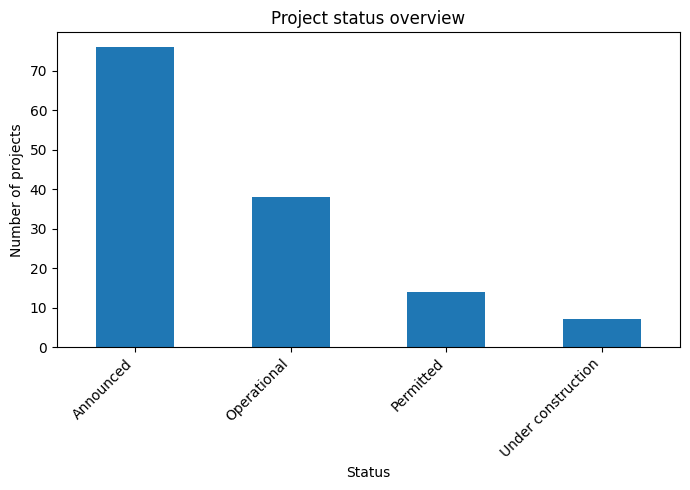


Project status overview
-----------------------


,count
Status,
Announced,76
Operational,38
Permitted,14
Under construction,7


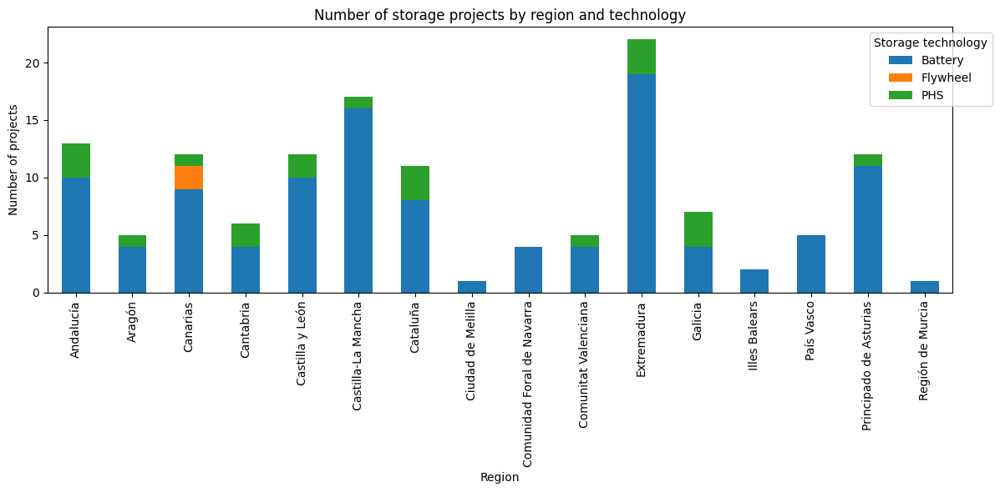


Number of projects by Region and Technology
-------------------------------------------


Storage type,Battery,Flywheel,PHS
Region,,,
Andalucía,10,0,3
Aragón,4,0,1
Canarias,9,2,1
Cantabria,4,0,2
Castilla y León,10,0,2
Castilla-La Mancha,16,0,1
Cataluña,8,0,3
Ciudad de Melilla,1,0,0
Comunidad Foral de Navarra,4,0,0


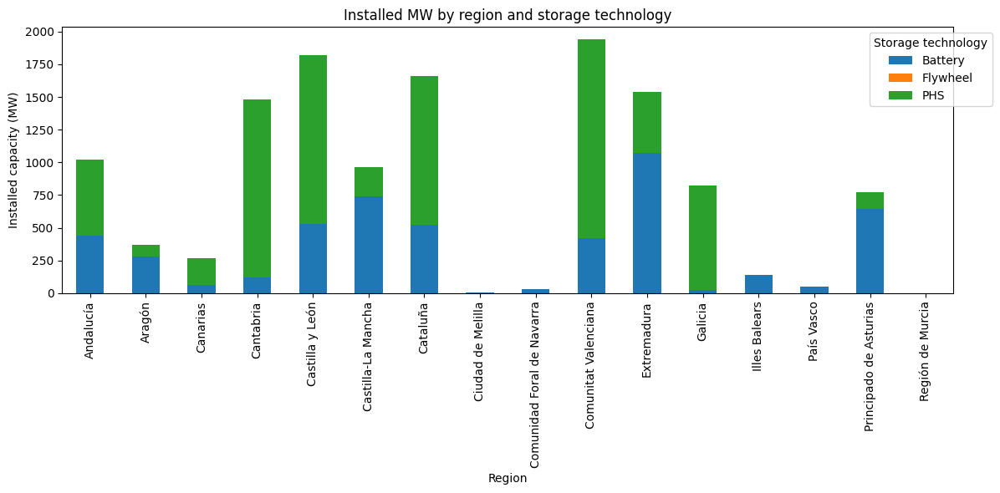


Total MW by Region and Technology
---------------------------------


Storage type,Battery,Flywheel,PHS
Region,,,
Andalucía,442.30,0.0,581.40
Aragón,278.00,0.0,90.25
Canarias,61.76,2.1,200.00
Cantabria,121.10,0.0,1360.80
Castilla y León,531.06,0.0,1290.00
Castilla-La Mancha,740.53,0.0,220.00
Cataluña,521.79,0.0,1136.00
Ciudad de Melilla,4.00,0.0,0.00
Comunidad Foral de Navarra,29.92,0.0,0.00


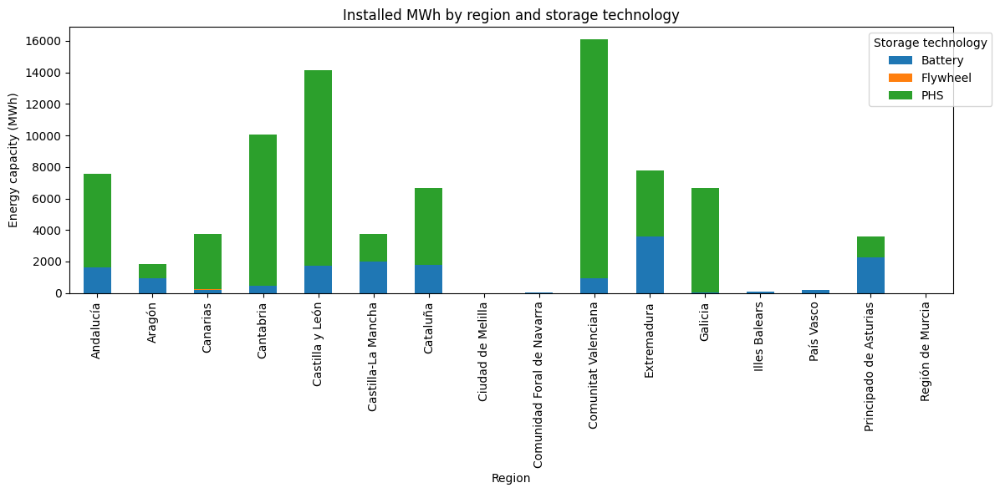


Total MWh by Region and Technology
----------------------------------


Storage type,Battery,Flywheel,PHS
Region,,,
Andalucía,1608.89,0.0,5966.4
Aragón,956.00,0.0,885.0
Canarias,214.49,18.0,3500.0
Cantabria,467.90,0.0,9610.0
Castilla y León,1758.90,0.0,12385.0
Castilla-La Mancha,2009.26,0.0,1760.0
Cataluña,1801.70,0.0,4870.0
Ciudad de Melilla,1.70,0.0,0.0
Comunidad Foral de Navarra,56.08,0.0,0.0


Capacity_group
Planned        97
Operational    38
Name: count, dtype: int64

Operational vs Planned Capacity
-------------------------------


,count
Capacity_group,
Planned,97
Operational,38


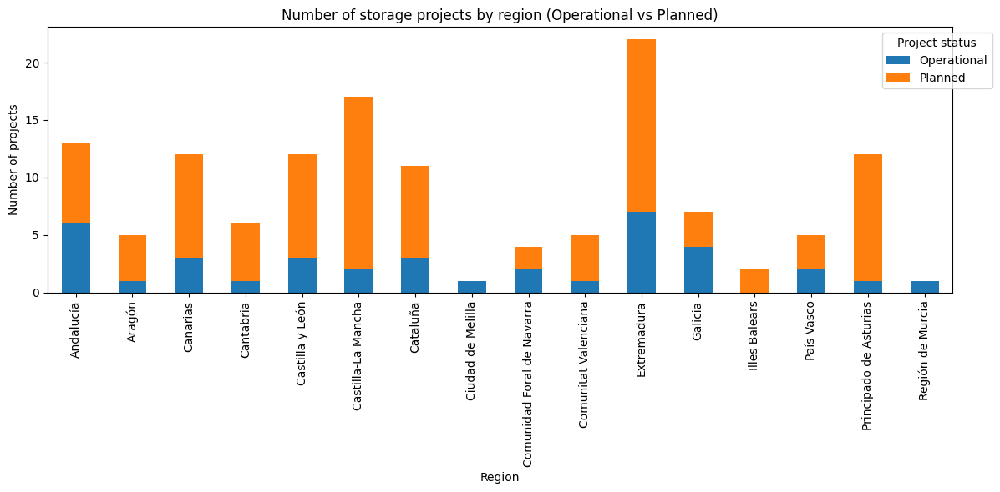


Total projects by Region and Operationability
---------------------------------------------


Capacity_group,Operational,Planned
Region,,
Andalucía,6,7
Aragón,1,4
Canarias,3,9
Cantabria,1,5
Castilla y León,3,9
Castilla-La Mancha,2,15
Cataluña,3,8
Ciudad de Melilla,1,0
Comunidad Foral de Navarra,2,2


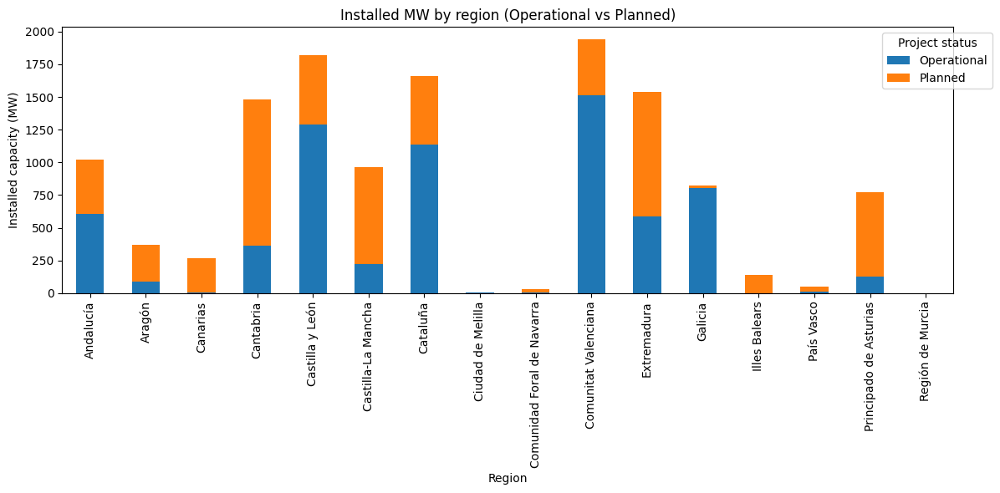


Total MW by Region and Operationability
---------------------------------------


Capacity_group,Operational,Planned
Region,,
Andalucía,603.70,420.00
Aragón,90.25,278.00
Canarias,3.06,260.80
Cantabria,360.80,1121.10
Castilla y León,1290.60,530.46
Castilla-La Mancha,225.00,735.53
Cataluña,1136.00,521.79
Ciudad de Melilla,4.00,0.00
Comunidad Foral de Navarra,2.70,27.22


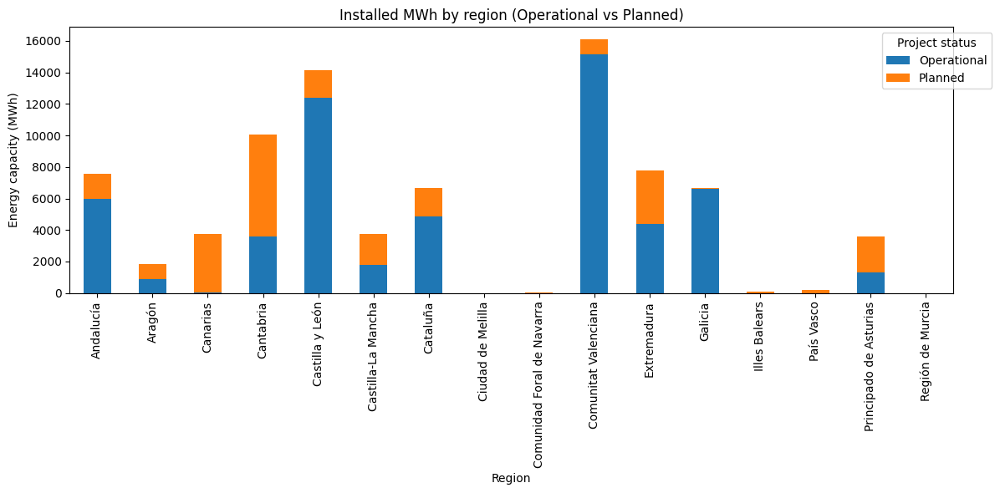


Total MWh by Region and Operationability
----------------------------------------


Capacity_group,Operational,Planned
Region,,
Andalucía,5981.53,1593.76
Aragón,885.00,956.00
Canarias,21.00,3711.49
Cantabria,3610.00,6467.90
Castilla y León,12388.00,1755.90
Castilla-La Mancha,1780.00,1989.26
Cataluña,4870.00,1801.70
Ciudad de Melilla,1.70,0.00
Comunidad Foral de Navarra,1.65,54.43


In [ ]:
# =========================
# CONFIG — adjust if needed
# =========================
REGION_COL = "Region"
TECH_COL   = "Storage type"
STATUS_COL = "Status"
MW_COL     = "Power (MW)"
MWH_COL    = "Capacity (MWh)"

# Ensure MW and MWh are numeric and NaNs become 0
data[MW_COL] = pd.to_numeric(data[MW_COL], errors="coerce").fillna(0)
data[MWH_COL] = pd.to_numeric(data[MWH_COL], errors="coerce").fillna(0)

#Display numeric tables under plots
def show_table(df, title=None, round_cols=None):

    out = df.copy()

    if round_cols:
        for col, n in round_cols.items():
            if col in out.columns:
                out[col] = out[col].round(n)

    if title:
        print("\n" + title)
        print("-" * len(title))

    display(out)


# =========================
# 1. BASIC SANITY CHECK
# =========================
print("Rows:", len(data))
print("Regions:", data[REGION_COL].nunique())
print("Technologies:", data[TECH_COL].unique())
print("Statuses:", data[STATUS_COL].unique())
print("\nMissing values:\n", data[[MW_COL, MWH_COL]].isna().sum())

# =========================
# 2. TOTAL MW & MWh — SPAIN
# =========================
total_spain = data[[MW_COL, MWH_COL]].sum()
display(pd.DataFrame(total_spain, columns=["Spain total"]))

# =========================
# 3. TOTAL MW & MWh — BY REGION
# =========================
region_totals = (
    data
    .groupby(REGION_COL)[[MW_COL, MWH_COL]]
    .sum()
    .sort_values(MW_COL, ascending=False)
)

display(region_totals)


# =========================
# 4. TOTAL MW & MWh — REGION × TECHNOLOGY
# =========================
region_tech = (
    data
    .groupby([REGION_COL, TECH_COL])[[MW_COL, MWH_COL]]
    .sum()
    .reset_index()
)

display(region_tech.head(30))

# =========================
# COMBINED TABLE: TOTAL + TECHNOLOGY SPLIT (MW & MWh)
# =========================

# 1. Total MW & MWh by region
region_totals = (
    data
    .groupby(REGION_COL)[[MW_COL, MWH_COL]]
    .sum()
    .rename(columns={
        MW_COL: "Total_MW",
        MWH_COL: "Total_MWh"
    })
)

# 2. MW & MWh by region × technology (pivoted)
region_tech_wide = (
    data
    .groupby([REGION_COL, TECH_COL])[[MW_COL, MWH_COL]]
    .sum()
    .unstack(fill_value=0)
)

# Flatten MultiIndex columns → Battery_MW, Battery_MWh, etc.
region_tech_wide.columns = [
    f"{tech}_{unit}"
    for unit, tech in region_tech_wide.columns
]

# 3. Merge totals + technology split
region_summary = region_totals.join(region_tech_wide)

# 4. Optional: sort by total MW
region_summary = region_summary.sort_values("Total_MW", ascending=False)

# Reorder columns

desired_order = [
    "Total_MW",
    "Total_MWh",
    "PHS_Power (MW)",
    "PHS_Capacity (MWh)",
    "Battery_Power (MW)",
    "Battery_Capacity (MWh)",
    "Flywheel_Power (MW)",
    "Flywheel_Capacity (MWh)",
]

# Keep only columns that actually exist (safe if something is missing)
desired_order = [c for c in desired_order if c in region_summary.columns]

region_summary = region_summary[desired_order]

display(region_summary)


# =========================
# 5. BAR CHART — PROJECT STATUS
# =========================
status_counts = data[STATUS_COL].value_counts()
fig5, ax5 = plt.subplots(figsize=(7,5))
status_counts.plot(kind="bar", ax=ax5)
ax5.set_ylabel("Number of projects")
ax5.set_title("Project status overview")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

show_table(
    status_counts,
    title="Project status overview",
)


# =========================
# 6. BAR CHART — NUMBER OF PROJECTS
#     BY REGION × TECHNOLOGY
# =========================
proj_counts = (
    data
    .groupby([REGION_COL, TECH_COL])
    .size()
    .unstack(fill_value=0)
)

fig6, ax6 = plt.subplots(figsize=(12,6))
proj_counts.plot(
    kind="bar",
    stacked=True,
    ax=ax6
)

ax6.set_ylabel("Number of projects")
ax6.set_title("Number of storage projects by region and technology")
ax6.legend(title="Storage technology", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    proj_counts,
    title="Number of projects by Region and Technology"
)

# =========================
# 7. BAR CHART — MW BY REGION × TECHNOLOGY
# =========================
mw_region_tech = (
    data
    .groupby([REGION_COL, TECH_COL])[MW_COL]
    .sum()
    .unstack(fill_value=0)
)

fig7, ax7 = plt.subplots(figsize=(12,6))
mw_region_tech.plot(
    kind="bar",
    stacked=True,
    ax=ax7
)

ax7.set_ylabel("Installed capacity (MW)")
ax7.set_title("Installed MW by region and storage technology")
ax7.legend(title="Storage technology", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mw_region_tech,
    title="Total MW by Region and Technology",
)

# =========================
# 8. BAR CHART — MWh BY REGION × TECHNOLOGY
# =========================
mwh_region_tech = (
    data
    .groupby([REGION_COL, TECH_COL])[MWH_COL]
    .sum()
    .unstack(fill_value=0)
)

fig8, ax8 = plt.subplots(figsize=(12,6))
mwh_region_tech.plot(
    kind="bar",
    stacked=True,
    ax=ax8
)

ax8.set_ylabel("Energy capacity (MWh)")
ax8.set_title("Installed MWh by region and storage technology")
ax8.legend(title="Storage technology", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mwh_region_tech,
    title="Total MWh by Region and Technology",
)

# =========================================================
# 9. CREATE OPERATIONAL vs PLANNED CATEGORY
# =========================================================

data = data.copy()

data["Capacity_group"] = data[STATUS_COL].apply(
    lambda x: "Operational" if str(x).lower() == "operational" else "Planned"
)

print(data["Capacity_group"].value_counts())

# Assign Capacity_group dataframe to a variable to be passed into show_table
Capacity_group = data["Capacity_group"].value_counts().to_frame()

show_table(
    Capacity_group,
    title="Operational vs Planned Capacity",
    round_cols={"MW": 1, "MWh": 0}
)

# =========================================================
# 10. NUMBER OF PROJECTS — BY REGION × OPERATIONAL / PLANNED
# =========================================================

proj_op_plan = (
    data
    .groupby([REGION_COL, "Capacity_group"])
    .size()
    .unstack(fill_value=0)
)

fig10, ax10 = plt.subplots(figsize=(12,6))
proj_op_plan.plot(
    kind="bar",
    stacked=True,
    ax=ax10
)

ax10.set_ylabel("Number of projects")
ax10.set_title("Number of storage projects by region (Operational vs Planned)")
ax10.legend(title="Project status", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    proj_op_plan,
    title="Total projects by Region and Operationability",
)

# =========================================================
# 11. MW — BY REGION × OPERATIONAL / PLANNED
# =========================================================

mw_op_plan = (
    data
    .groupby([REGION_COL, "Capacity_group"])[MW_COL]
    .sum()
    .unstack(fill_value=0)
)

fig11, ax11 = plt.subplots(figsize=(12,6))
mw_op_plan.plot(
    kind="bar",
    stacked=True,
    ax=ax11
)

ax11.set_ylabel("Installed capacity (MW)")
ax11.set_title("Installed MW by region (Operational vs Planned)")
ax11.legend(title="Project status", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mw_op_plan,
    title="Total MW by Region and Operationability",
)

# =========================================================
# 12. MWh — BY REGION × OPERATIONAL / PLANNED
# =========================================================

mwh_op_plan = (
    data
    .groupby([REGION_COL, "Capacity_group"])[MWH_COL]
    .sum()
    .unstack(fill_value=0)
)

fig12, ax12 = plt.subplots(figsize=(12,6))
mwh_op_plan.plot(
    kind="bar",
    stacked=True,
    ax=ax12
)

ax12.set_ylabel("Energy capacity (MWh)")
ax12.set_title("Installed MWh by region (Operational vs Planned)")
ax12.legend(title="Project status", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mwh_op_plan,
    title="Total MWh by Region and Operationability",
)

In [ ]:
# =========================
# Downloading graphs
# =========================
def save_figure(fig, filename, dpi=300):
    fig.savefig(filename, dpi=dpi, bbox_inches="tight")
    print(f"Saved: {filename}")
    files.download(filename)

save_figure(fig5, "Project_status_overview.jpg")
save_figure(fig6, "Storage_projects_by_region_and_technology.jpg")
save_figure(fig7, "MW_capacity_by_region_and_technology.jpg")
save_figure(fig8, "MWh_capacity_by_region_and_technology.jpg")
save_figure(fig10, "Storage_projects_by_region_and_status.jpg")
save_figure(fig11, "MW_capacity_by_region_and_status.jpg")
save_figure(fig12, "MWh_capacity_by_region_and_status.jpg")

Saved: Project_status_overview.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Storage_projects_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MW_capacity_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MWh_capacity_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Storage_projects_by_region_and_status.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MW_capacity_by_region_and_status.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MWh_capacity_by_region_and_status.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =============
# Save tables as .jpeg
# ============
def save_table_as_image(
    df,
    filename,
    title=None,
    dpi=300,
    fontsize=10,
    round_decimals=3,
    row_height=0.45,
    col_width=1.4
):
    # Ensure index (Region) is included
    df = df.reset_index()

    # Round numeric columns to avoid overflow
    df = df.copy()
    num_cols = df.select_dtypes(include="number").columns
    df[num_cols] = df[num_cols].round(round_decimals)

    n_rows, n_cols = df.shape

    fig_width = n_cols * col_width
    fig_height = n_rows * row_height + (0.8 if title else 0)

    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    ax.axis("off")

    table = ax.table(
        cellText=df.values,
        colLabels=df.columns,
        cellLoc="center",
        loc="center"
    )

    table.auto_set_font_size(False)
    table.set_fontsize(fontsize)
    table.scale(1, 1.3)

    # Style header
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight="bold")
            cell.set_facecolor("#EAEAEA")

    # Adjust column widths explicitly
    for col in range(n_cols):
        table.auto_set_column_width(col)

    if title:
        ax.set_title(title, fontsize=fontsize + 2, pad=10)

    plt.savefig(filename, dpi=dpi, bbox_inches="tight")
    plt.close()

    print(f"Saved: {filename}")
    files.download(filename)

save_table_as_image(
    region_totals,
    filename="Total_MW_MWh_by_region.jpg",
    title="Total Storage Capacity by Region (MW & MWh)",
    fontsize=11
)
save_table_as_image(
    region_tech,
    filename="Total_MW_MWh_by_region_and_technology.jpg",
    title="Total Storage Capacity by Region and Technology (MW & MWh)",
    fontsize=11
)
save_table_as_image(
    region_summary,
    filename="Total_MW_and_MWh_by_region_and_technology.jpg",
    title="Total Storage Capacity by Region and Technology (MW & MWh)",
    fontsize=11
)

Saved: Total_MW_MWh_by_region.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Total_MW_MWh_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Total_MW_and_MWh_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Hot Days above 35C

In [5]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [6]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Hot_days_35C.csv"

os.rename(old_name, new_name)

In [7]:
data = pd.read_csv("Hot_days_35C.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [8]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [9]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [10]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [11]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [12]:
#ADDING CANARY ISLAND INSET
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def plot_spain_with_canarias_inset(ax, regions_gdf, points_gdf,
                                   bg_col, vuln_col,
                                   cmap_bg, norm_bg,
                                   vuln_cmap, vuln_norm,
                                   asset_type_col):

    # Separate mainland & Canarias
    mainland = regions_gdf[regions_gdf["NUTS_NAME"] != "Canarias"]
    canarias = regions_gdf[regions_gdf["NUTS_NAME"] == "Canarias"]

    points_mainland = points_gdf[points_gdf["Region"] != "Canarias"]
    points_canarias = points_gdf[points_gdf["Region"] == "Canarias"]

    # Plot mainland regions
    mainland.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}

    # Plot mainland points
    for t, marker in markers.items():
        subset = points_mainland[points_mainland[asset_type_col] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[vuln_col],
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    ax.set_xlim(-10, 5)
    ax.set_ylim(35, 45)

    # Create inset
    axins = inset_axes(ax, width="30%", height="30%",
                       bbox_to_anchor=(0.02, 0.02, 1, 1),
                       bbox_transform=ax.transAxes,
                       loc="lower right",
                       borderpad=0
    )

    canarias.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=axins,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    for t, marker in markers.items():
        subset = points_canarias[points_canarias[asset_type_col] == t]
        axins.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[vuln_col],
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4
        )

    axins.set_xticks([])
    axins.set_yticks([])

    return ax

In [13]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [14]:
#Hot days above 35°C 1991-2020 for each region
hot_days_35_present_dict = {
    "Galicia": 0.4,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.02,
    "País Vasco": 0.16,
    "Comunidad Foral de Navarra": 3.59,
    "La Rioja": 2.14,
    "Aragón": 6.82,
    "Cataluña": 2.14,
    "Comunitat Valenciana": 3.04,
    "Región de Murcia": 5.8,
    "Andalucía": 17.13,
    "Castilla-La Mancha": 14.12,
    "Castilla y León": 1.94,
    "Comunidad de Madrid": 11.53,
    "Extremadura": 21.32,
    "Canarias": 0.02,
    "Illes Balears": 0.11,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 2.47,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 1991-2020"] = data["Region"].map(hot_days_35_present_dict)

In [15]:
#Define bins for hazard strength
bins = [-float("inf"), 0.14, 2.14, 6.31, float("inf")]
labels = [0, 1, 2, 3,]

data['Hot days >35C 1991-2020 hazard strength'] = pd.cut(
    data['Hot days >35C 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [16]:
#Vulnerability score
vulnerability_hot_days_35 = {
    "Battery": 3,
    "PHS": 2,
    "Flywheel": 1
}

data["Vulnerability hot days >35C"] = data["Storage type"].map(vulnerability_hot_days_35)

In [17]:
#Change in number of hot days above 35°C from 1991-2020 to 2011-2040 RCP4.5 for each region
hot_days_35_change45_dict = {
    "Galicia": 0.12,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.04,
    "País Vasco": 0.23,
    "Comunidad Foral de Navarra": 1.55,
    "La Rioja": 1.09,
    "Aragón": 2.71,
    "Cataluña": 0.98,
    "Comunitat Valenciana": 1.57,
    "Región de Murcia": 3.11,
    "Andalucía": 4.65,
    "Castilla-La Mancha": 5.65,
    "Castilla y León": 1.61,
    "Comunidad de Madrid": 4.85,
    "Extremadura": 5.95,
    "Canarias": 0.0,
    "Illes Balears": 0.01,
    "Ciudad de Ceuta": 0.61,
    "Ciudad de Melilla": 1.22,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C change RCP4.5"] = data["Region"].map(hot_days_35_change45_dict)

In [18]:
#Change in number of hot days above 35°C from 1991-2020 to 2011-2040 RCP8.5 for each region
hot_days_35_change85_dict = {
    "Galicia": 0.11,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.04,
    "País Vasco": 0.25,
    "Comunidad Foral de Navarra": 1.79,
    "La Rioja": 1.31,
    "Aragón": 3.20,
    "Cataluña": 1.10,
    "Comunitat Valenciana": 1.95,
    "Región de Murcia": 3.78,
    "Andalucía": 6.63,
    "Castilla-La Mancha": 7.42,
    "Castilla y León": 2.09,
    "Comunidad de Madrid": 6.5,
    "Extremadura": 8.94,
    "Canarias": 0.0,
    "Illes Balears": 0.15,
    "Ciudad de Ceuta": 0.02,
    "Ciudad de Melilla": 1.29,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C change RCP8.5"] = data["Region"].map(hot_days_35_change85_dict)

In [19]:
#Hot days above 35C 2011-2040 RCP4.5 for each region
hot_days_35_future45_dict = {
    "Galicia": 0.19,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.05,
    "País Vasco": 0.38,
    "Comunidad Foral de Navarra": 4.83,
    "La Rioja": 2.99,
    "Aragón": 8.94,
    "Cataluña": 2.92,
    "Comunitat Valenciana": 4.31,
    "Región de Murcia": 8.7,
    "Andalucía": 20.73,
    "Castilla-La Mancha": 18.91,
    "Castilla y León": 3.58,
    "Comunidad de Madrid": 16.52,
    "Extremadura": 26.69,
    "Canarias": 0.0,
    "Illes Balears": 0.26,
    "Ciudad de Ceuta": 0.01,
    "Ciudad de Melilla": 3.84,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 2011-2040 RCP4.5"] = data["Region"].map(hot_days_35_future45_dict)

In [20]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 0.23, 3.58, 8.82, float("inf")]
labels = [0, 1, 2, 3,]

data["Hot days >35C 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Hot days >35C 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [21]:
#Hot days above 35C 2011-2040 RCP8.5 for each region
hot_days_35_future85_dict = {
    "Galicia": 0.18,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.05,
    "País Vasco": 0.43,
    "Comunidad Foral de Navarra": 5.15,
    "La Rioja": 3.28,
    "Aragón": 9.53,
    "Cataluña": 3.09,
    "Comunitat Valenciana": 4.76,
    "Región de Murcia": 9.26,
    "Andalucía": 22.75,
    "Castilla-La Mancha": 20.78,
    "Castilla y León": 4.13,
    "Comunidad de Madrid": 18.2,
    "Extremadura": 29.83,
    "Canarias": 0.0,
    "Illes Balears": 0.29,
    "Ciudad de Ceuta": 0.02,
    "Ciudad de Melilla": 3.97,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 2011-2040 RCP8.5"] = data["Region"].map(hot_days_35_future85_dict)

In [22]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 0.23, 3.97, 9.39, float("inf")]
labels = [0, 1, 2, 3,]

data["Hot days >35C 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Hot days >35C 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [23]:
#Ensure numeric columns
cols_to_numeric = [
    'Hot days >35C 1991-2020 hazard strength',
    'Hot days >35C 2011-2040 hazard strength RCP4.5',
    'Hot days >35C 2011-2040 hazard strength RCP8.5',
    'Vulnerability hot days >35C',
    'Hot days >35C 1991-2020',
    'Hot days >35C 2011-2040 RCP4.5',
    'Hot days >35C 2011-2040 RCP8.5',
    'Hot days >35C change RCP4.5',
    'Hot days >35C change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

In [ ]:
print(points.columns)

Index(['StorageID', 'Coordinates', 'Storage type', 'Region', 'Status',
       'Power (MW)', 'Capacity (MWh)', 'Duration (hours)', 'Importance score',
       'lat', 'lon', 'geometry'],
      dtype='object')


In [44]:
#ADDING CANARY ISLAND INSET
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def plot_spain_with_canarias_inset(ax, regions_gdf, points_gdf,
                                   bg_col, vuln_col,
                                   cmap_bg, norm_bg,
                                   vuln_cmap, vuln_norm,
                                   asset_type_col):

    # Separate mainland & Canarias
    mainland = regions_gdf[regions_gdf["NUTS_NAME"] != "Canarias"]
    canarias = regions_gdf[regions_gdf["NUTS_NAME"] == "Canarias"]

    points_mainland = points_gdf[points_gdf["Region"] != "Canarias"]
    points_canarias = points_gdf[points_gdf["Region"] == "Canarias"]

    # Plot mainland regions
    mainland.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    #Storage projects
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}

    # Plot mainland points
    for t, marker in markers.items():
        subset = points_mainland[points_mainland[asset_type_col] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[vuln_col],
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    ax.set_xlim(-10, 5)
    ax.set_ylim(35, 45)

    # Create inset
    axins = inset_axes(ax, width="30%", height="30%",
                       bbox_to_anchor=(0.02, 0.02, 1, 1),
                       bbox_transform=ax.transAxes,
                       loc="lower right",
                       borderpad=0
    )

    canarias.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=axins,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    for t, marker in markers.items():
        subset = points_canarias[points_canarias[asset_type_col] == t]
        axins.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[vuln_col],
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4
        )

    axins.set_xticks([])
    axins.set_yticks([])

    return ax

In [45]:
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

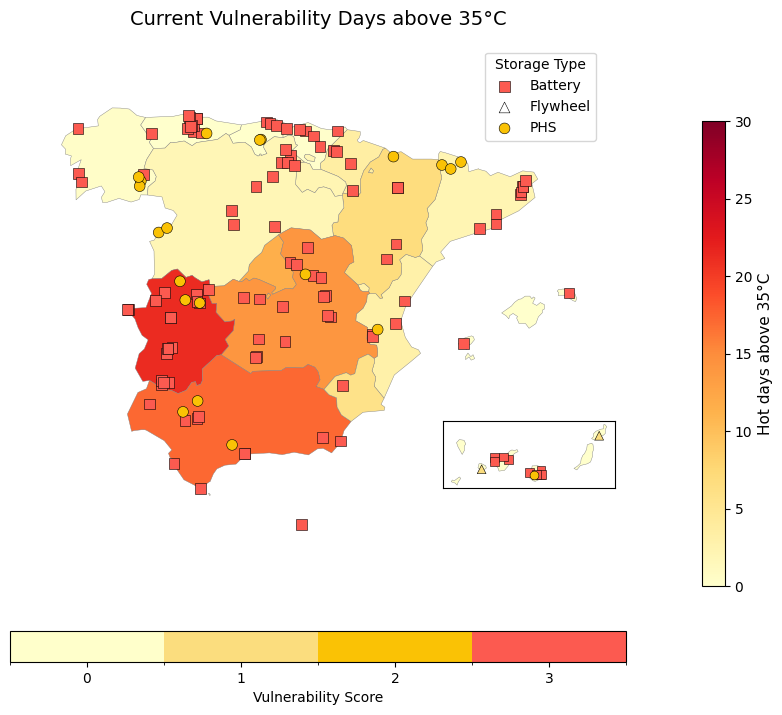

In [38]:
#CURRENT VULNERABILITY TEST

# =========================================================
# Configuration
# =========================================================
HOTDAYSCURRENT_COL = "Hot days >35C 1991-2020"
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability hot days >35C"
HAZARDCURRENT_COL = "Hot days >35C 1991-2020 hazard strength"
HOTDAYSCURRENT_COL = "Hot days >35C 1991-2020"

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)

# -------------------------------
# Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[HOTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_present_dict
)

# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Define background colour scale FIRST
    norm_bg = mcolors.Normalize(vmin=0, vmax=30)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Call reusable Spain + inset function
    plot_spain_with_canarias_inset(
        ax=ax,
        regions_gdf=regions_bg,
        points_gdf=points,
        bg_col=bg_col,
        vuln_col=VULN_COL,
        cmap_bg=cmap_bg,
        norm_bg=norm_bg,
        vuln_cmap=vuln_cmap,
        vuln_norm=vuln_norm,
        asset_type_col=ASSET_TYPE_COL
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Hot days above 35°C", fontsize=11)

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    ax.set_title(title, fontsize=14, pad=15)
    ax.legend(title="Storage Type")
    ax.axis("off")
    plt.show()

    return fig, ax


fig_1, ax_1 = plot_current_optionA(
    bg_col=HOTDAYSCURRENT_COL,
    title="Current Vulnerability Days above 35°C"
)



In [39]:
save_figure(fig_1, "Current Vulnerability Days above 35°C.jpg")

Saved: Current Vulnerability Days above 35°C.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

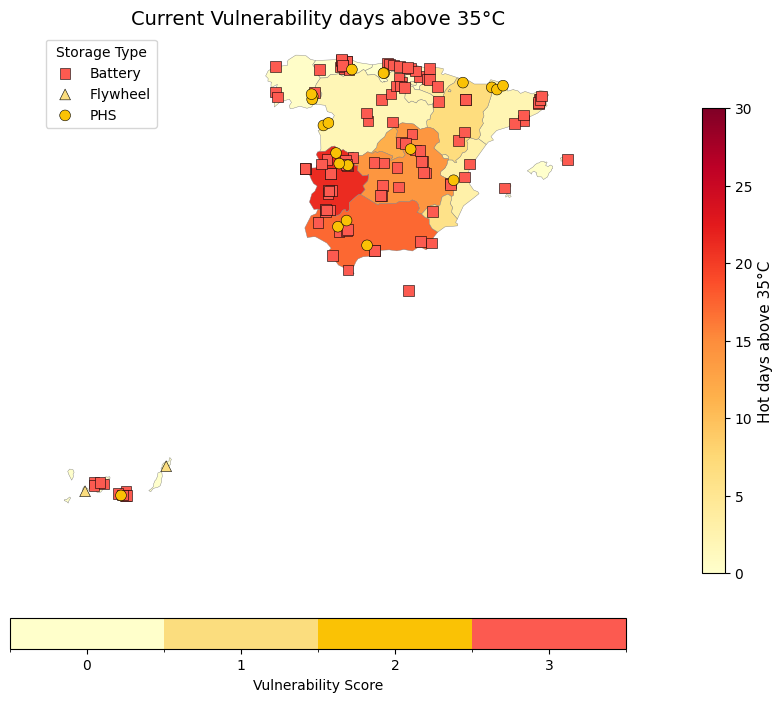

In [25]:
#CURRENT VULNERABILITY

# =========================================================
# Configuration
# =========================================================
HOTDAYSCURRENT_COL = "Hot days >35C 1991-2020"
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability hot days >35C"
HAZARDCURRENT_COL = "Hot days >35C 1991-2020 hazard strength"
HOTDAYSCURRENT_COL = "Hot days >35C 1991-2020"

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)

# -------------------------------
# Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[HOTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_present_dict
)

# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=0, vmax=30)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Hot days above 35°C", fontsize=11)

   # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )


    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_1, ax_1 = plot_current_optionA(
    bg_col=HOTDAYSCURRENT_COL,
    title="Current Vulnerability days above 35°C"
)



In [ ]:
save_figure(fig_1, "Current Vulnerability days above 35°C.jpg")

Saved: Current Vulnerability days above 35°C.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

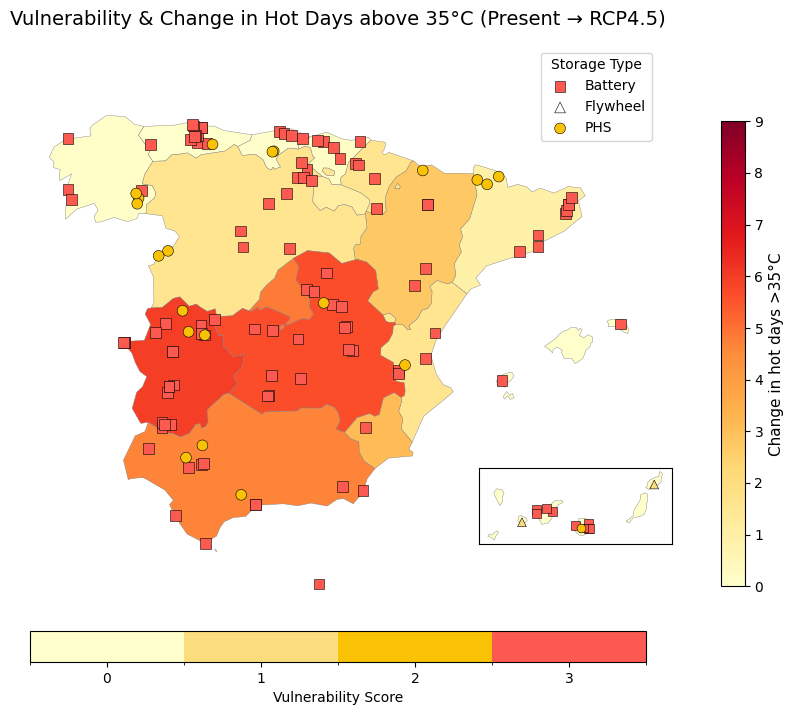

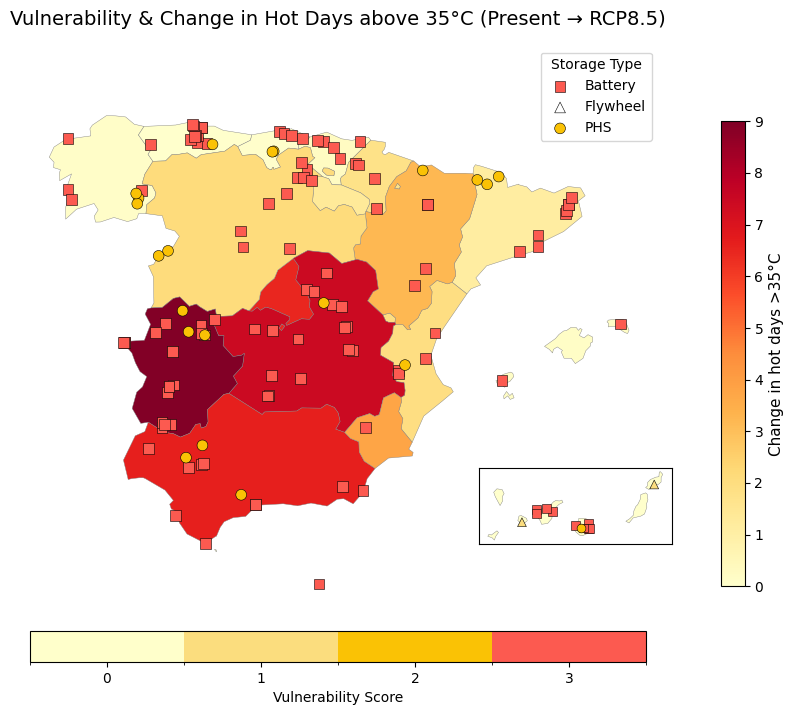

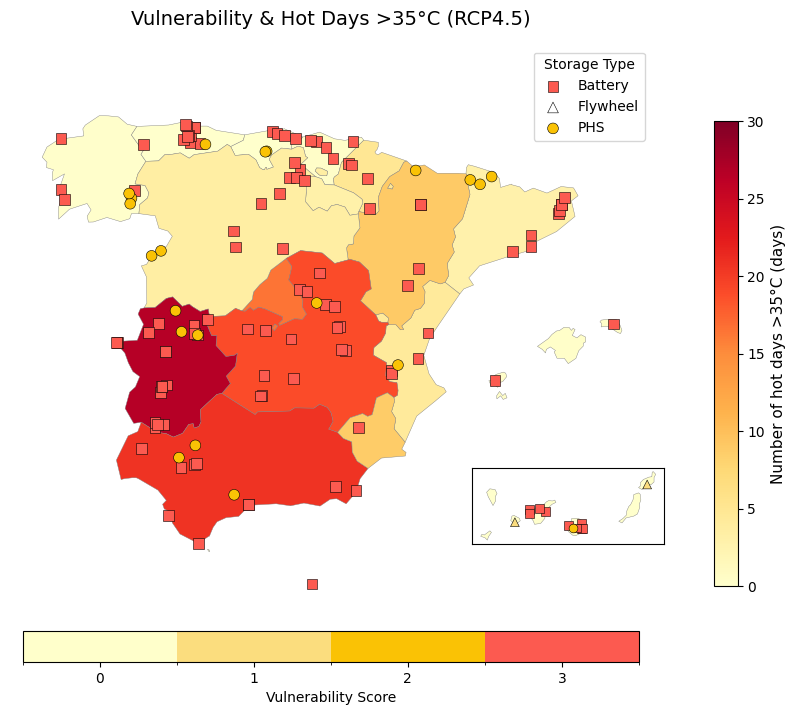

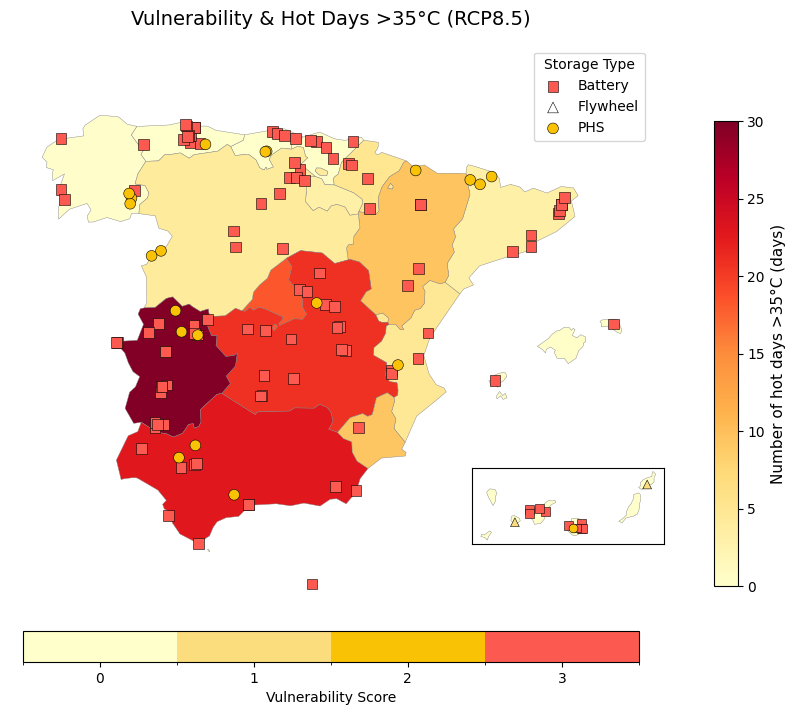

In [41]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS (HOT DAYS >35C)
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability hot days >35C"

HOTDAYS_CHANGE45 = "Hot days >35C change RCP4.5"
HOTDAYS_CHANGE85 = "Hot days >35C change RCP8.5"
HOTDAYS_45 = "Hot days >35C 2011-2040 RCP4.5"
HOTDAYS_85 = "Hot days >35C 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[HOTDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    hot_days_35_change45_dict
)
regions_bg[HOTDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    hot_days_35_change85_dict
)
regions_bg[HOTDAYS_45] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future45_dict
)
regions_bg[HOTDAYS_85] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future85_dict
)


# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for maps
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")
    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.Normalize(vmin=0, vmax=9)
      bg_label = "Change in hot days >35°C"
    else:
      norm_bg = mcolors.Normalize(
        vmin=0,
        vmax=30
      )
      bg_label = "Number of hot days >35°C (days)"

    # Call reusable Spain + inset function
    plot_spain_with_canarias_inset(
        ax=ax,
        regions_gdf=regions_bg,
        points_gdf=points,
        bg_col=bg_col,
        vuln_col=VULN_COL,
        cmap_bg=cmap_bg,
        norm_bg=norm_bg,
        vuln_cmap=vuln_cmap,
        vuln_norm=vuln_norm,
        asset_type_col=ASSET_TYPE_COL
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)


    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    ax.set_title(title, fontsize=14, pad=15)
    ax.legend(title="Storage Type")
    ax.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# Change in Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm
    )

    return fig, ax


# =========================================================
# GENERATE ALL MAPS
# =========================================================

fig_3, ax_3 = plot_step5_optionA(
    HOTDAYS_CHANGE45,
    "Vulnerability & Change in Hot Days above 35°C (Present → RCP4.5)"
)

fig_4, ax_4 = plot_step5_optionA(
    HOTDAYS_CHANGE85,
    "Vulnerability & Change in Hot Days above 35°C (Present → RCP8.5)"
)
fig_5, ax_5 = plot_step5_optionA(
    HOTDAYS_45,
    "Vulnerability & Hot Days >35°C (RCP4.5)"
)

fig_6, ax_6 = plot_step5_optionA(
    HOTDAYS_85,
    "Vulnerability & Hot Days >35°C (RCP8.5)"
)


In [37]:
save_figure(fig_3, "Vulnerability & Change in Hot Days above 35°C (Present → RCP4.5).jpg")
save_figure(fig_4, "Vulnerability & Change in Hot Days above 35°C (Present → RCP8.5).jpg")
save_figure(fig_5, "Vulnerability & Hot Days >35°C (RCP4.5).jpg")
save_figure(fig_6, "Vulnerability & Hot Days >35°C (RCP8.5).jpg")

Saved: Vulnerability & Change in Hot Days above 35°C (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in Hot Days above 35°C (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Hot Days >35°C (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Hot Days >35°C (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

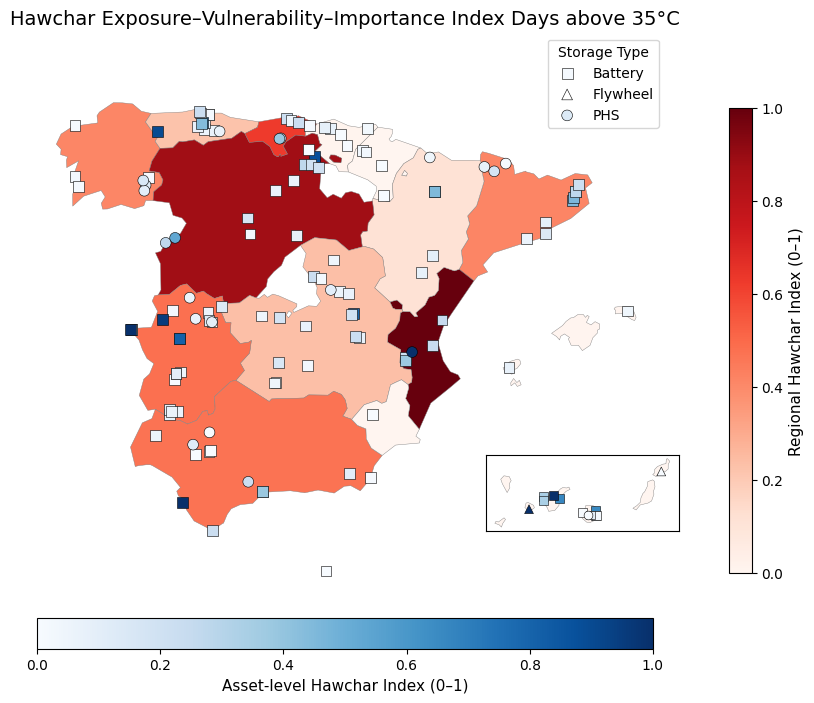

In [50]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability hot days >35C"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])


def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # Call reusable Spain + inset function
    plot_spain_with_canarias_inset(
        ax=ax,
        regions_gdf=regions_hawchar_gdf,
        points_gdf=points,
        bg_col=region_col,
        vuln_col=point_col,
        cmap_bg="Reds",
        norm_bg=None,
        vuln_cmap="Blues",
        vuln_norm=None,
        asset_type_col=ASSET_TYPE_COL
    )

    # Region colourbar ----
    vals_regions = regions_hawchar_gdf[region_col].astype(float)
    norm_regions = mcolors.Normalize(vmin=vals_regions.min(), vmax=vals_regions.max())

    sm_regions = cm.ScalarMappable(cmap="Reds", norm=norm_regions)
    sm_regions.set_array([])

    fig.colorbar(
        sm_regions,
        ax=ax,
        orientation="vertical",
        fraction=0.03,
        pad=0.02
    ).set_label("Regional Hawchar Index (0–1)", fontsize=11)

    # Asset colourbar ----
    vals_points = points[point_col].astype(float)
    norm_points = mcolors.Normalize(vmin=vals_points.min(), vmax=vals_points.max())

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm_points)
    sm_pts.set_array([])

    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    ax.set_title(title, fontsize=14)
    ax.legend(title="Storage Type")
    ax.axis("off")
    plt.show()

    return fig, ax

fig_2, ax_2 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index Days above 35°C"
)


In [51]:
save_figure(fig_2, "Hawchar Index days above 35C.jpg")

Saved: Hawchar Index days above 35C.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [59]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table


,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Comunitat Valenciana,96420.60,1.000000,16070.10,5,1.000000
1,Castilla y León,84863.40,0.535812,14143.90,12,0.880125
2,Cantabria,60467.40,0.396894,10077.90,6,0.627082
3,Extremadura,46561.56,0.119056,7760.26,22,0.482846
4,Andalucía,45451.74,0.238129,7575.29,13,0.471334
5,Cataluña,40030.20,0.191757,6671.70,11,0.415100
6,Galicia,39849.00,0.171316,6641.50,7,0.413221
7,Castilla-La Mancha,22615.56,0.116410,3769.26,17,0.234470
8,Canarias,22306.54,0.231514,3734.09,12,0.231265
9,Principado de Asturias,21563.46,0.087964,3593.91,12,0.223557


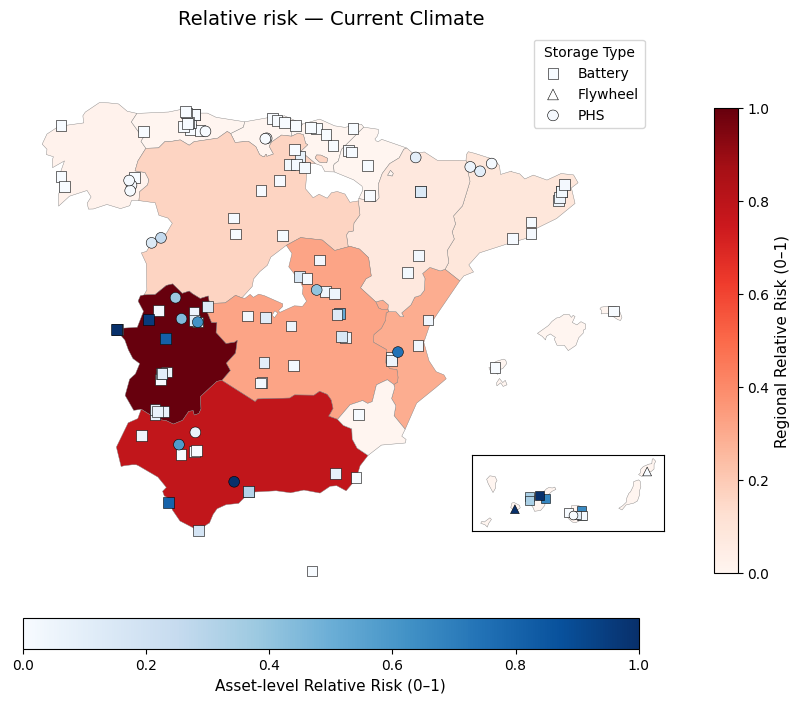

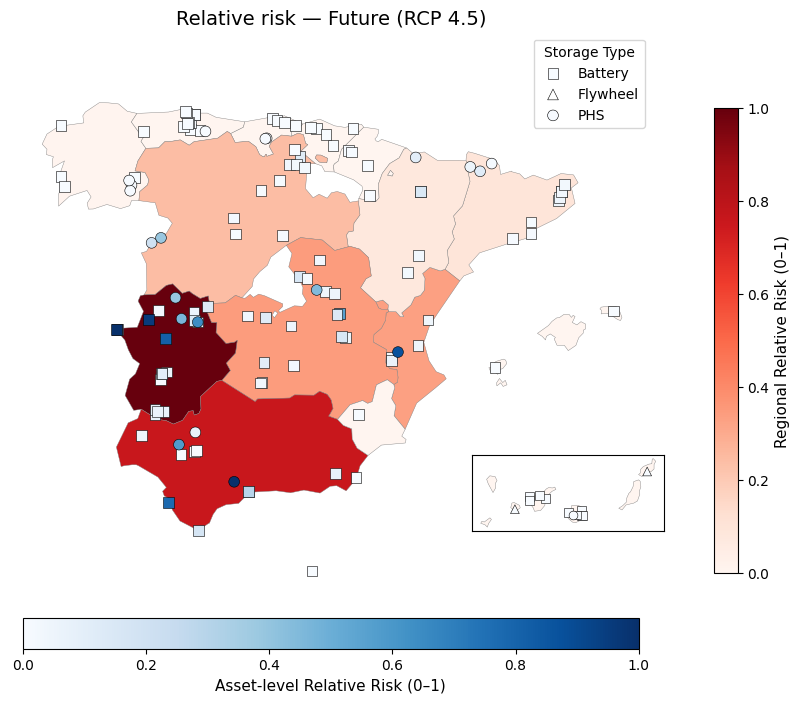

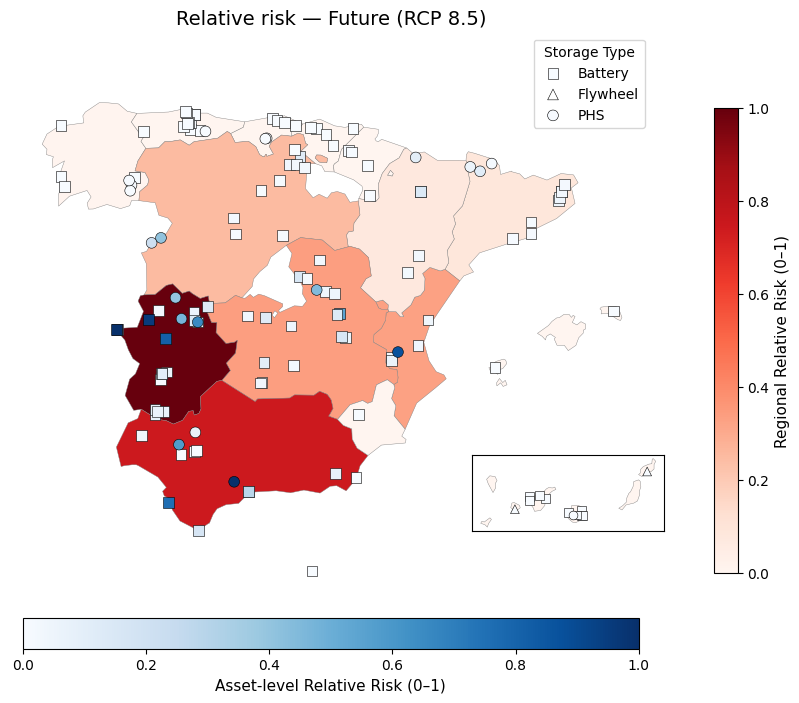

In [57]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability hot days >35C"

HAZARDCURRENT_COL = "Hot days >35C 1991-2020"
HAZARD45_COL     = "Hot days >35C 2011-2040 RCP4.5"
HAZARD85_COL     = "Hot days >35C 2011-2040 RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 6. MAP FUNCTION
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # Call reusable Spain + inset function
    plot_spain_with_canarias_inset(
        ax=ax,
        regions_gdf=regions_risk_gdf,
        points_gdf=points,
        bg_col=region_col,
        vuln_col=point_col,
        cmap_bg="Reds",
        norm_bg=None,
        vuln_cmap="Blues",
        vuln_norm=None,
        asset_type_col=ASSET_TYPE_COL
    )

    # --- Region colourbar ---
    vals_regions = regions_risk_gdf[region_col].astype(float)
    norm_regions = mcolors.Normalize(vmin=vals_regions.min(), vmax=vals_regions.max())

    sm_regions = cm.ScalarMappable(cmap="Reds", norm=norm_regions)
    sm_regions.set_array([])

    fig.colorbar(
        sm_regions,
        ax=ax,
        orientation="vertical",
        fraction=0.03,
        pad=0.02
    ).set_label("Regional Relative Risk (0–1)", fontsize=11)

    # --- Asset colourbar ---
    vals_points = points[point_col].astype(float)
    norm_points = mcolors.Normalize(vmin=vals_points.min(), vmax=vals_points.max())

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm_points)
    sm_pts.set_array([])

    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    ax.set_title(title, fontsize=14)
    ax.legend(title="Storage Type")
    ax.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_7, ax_7 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_8, ax_8 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_9, ax_9 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [58]:
save_figure(fig_7, "Relative risk — Current Climate.jpg")
save_figure(fig_8, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_9, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

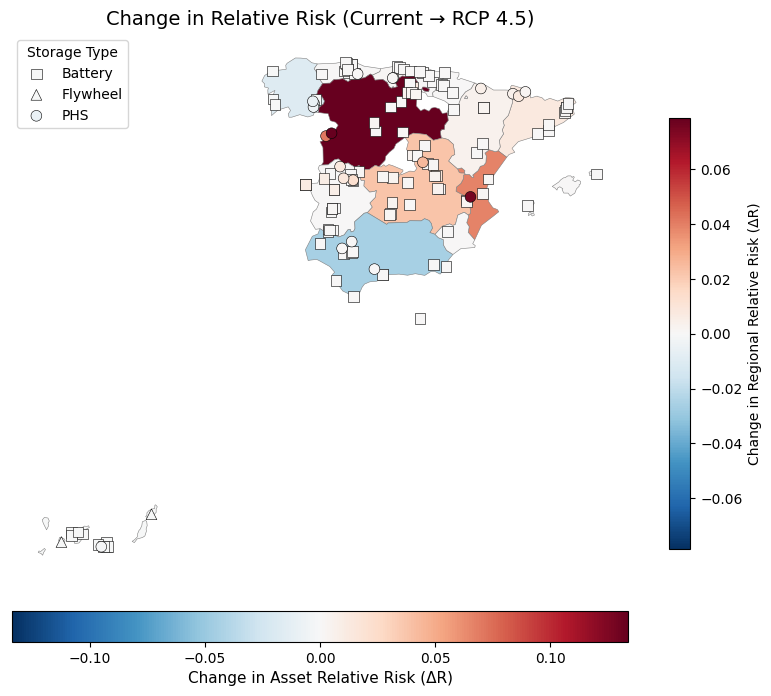

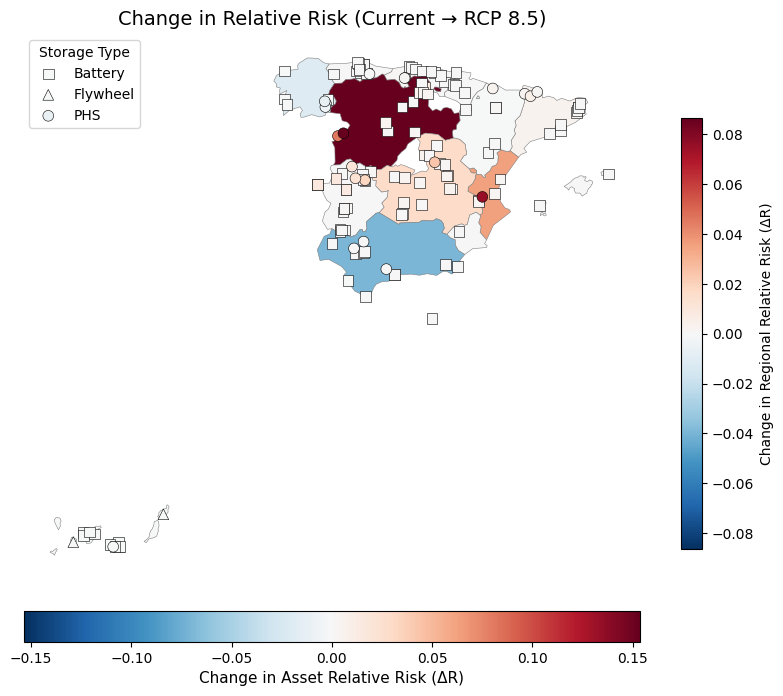

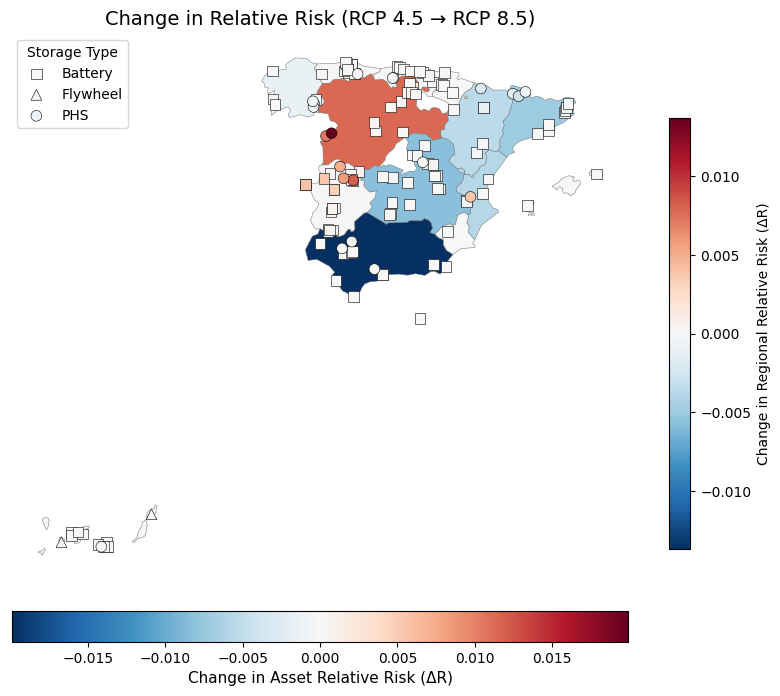

In [61]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_10, ax_10 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_11, ax_11 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_12, ax_12 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_10, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_11, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_12, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [62]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)

region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
    region_risk_table
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table

,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Extremadura,992692.4592,1.242728e+06,1.388931e+06,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000e+00,Extremadura,0.622300
1,Andalucía,778588.3062,9.422146e+05,1.034027e+06,0.784320,0.758182,0.744477,-0.026137,-0.039843,-1.370569e-02,Andalucía,1.000000
2,Castilla-La Mancha,319331.7072,4.276602e+05,4.699513e+05,0.321682,0.344130,0.338355,0.022448,0.016672,-5.775571e-03,Castilla-La Mancha,0.402984
3,Comunitat Valenciana,293118.6240,4.155728e+05,4.589621e+05,0.295276,0.334404,0.330443,0.039127,0.035166,-3.961064e-03,Comunitat Valenciana,0.745211
4,Castilla y León,164634.9960,3.038110e+05,3.504858e+05,0.165847,0.244471,0.252342,0.078624,0.086495,7.871089e-03,Castilla y León,0.254816
5,Cataluña,85664.6280,1.168882e+05,1.236933e+05,0.086295,0.094058,0.089056,0.007763,0.002761,-5.001267e-03,Cataluña,0.100601
6,Aragón,75333.7200,9.875124e+04,1.052684e+05,0.075888,0.079463,0.075791,0.003575,-0.000097,-3.672358e-03,Aragón,0.097874
7,Galicia,15939.6000,7.571310e+03,7.172820e+03,0.016057,0.006092,0.005164,-0.009964,-0.010893,-9.282189e-04,Galicia,0.016800
8,Cantabria,1209.3480,3.023370e+03,3.023370e+03,0.001218,0.002433,0.002177,0.001215,0.000959,-2.560894e-04,Cantabria,0.001946
9,Comunidad Foral de Navarra,1207.9632,1.625198e+03,1.732872e+03,0.001217,0.001308,0.001248,0.000091,0.000031,-6.013703e-05,Comunidad Foral de Navarra,0.001660


In [63]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Hot days >35C 1991-2020,Hot days >35C 1991-2020 hazard strength,Vulnerability hot days >35C,Hot days >35C change RCP4.5,Hot days >35C change RCP8.5,Hot days >35C 2011-2040 RCP4.5,Hot days >35C 2011-2040 hazard strength RCP4.5,Hot days >35C 2011-2040 RCP8.5,Hot days >35C 2011-2040 hazard strength RCP8.5,Exposure,Hawchar_abs,Hawchar_rel,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,0.40,1,3,0.12,0.11,0.19,0,0.18,0,15.50,93.00,0.001008,37.2000,17.6700,16.7400,1.005384e-04,0.000039,0.000034
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,0.40,1,3,0.12,0.11,0.19,0,0.18,0,20.00,120.00,0.001305,48.0000,22.8000,21.6000,1.297269e-04,0.000051,0.000044
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,0.40,1,3,0.12,0.11,0.19,0,0.18,0,5.00,30.00,0.000313,12.0000,5.7000,5.4000,3.243173e-05,0.000013,0.000011
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,0.40,1,2,0.12,0.11,0.19,0,0.18,0,2280.00,13680.00,0.150809,5472.0000,2599.2000,2462.4000,1.478887e-02,0.005805,0.005011
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.00,8.00,3,42.150000,-7.190000,0.40,1,2,0.12,0.11,0.19,0,0.18,0,1720.00,10320.00,0.113764,4128.0000,1960.8000,1857.6000,1.115652e-02,0.004379,0.003780
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,315.00,2590.00,8.00,3,42.334200,-7.215200,0.40,1,2,0.12,0.11,0.19,0,0.18,0,2590.00,15540.00,0.171316,6216.0000,2952.6000,2797.2000,1.679964e-02,0.006594,0.005692
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,0.40,1,3,0.12,0.11,0.19,0,0.18,0,11.00,66.00,0.000710,26.4000,12.5400,11.8800,7.134981e-05,0.000028,0.000024
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,0.00,0,3,0.00,0.00,0.00,0,0.00,0,800.00,4800.00,0.052904,0.0000,0.0000,0.0000,0.000000e+00,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,0.00,0,3,0.00,0.00,0.00,0,0.00,0,46.00,276.00,0.003025,0.0000,0.0000,0.0000,0.000000e+00,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,0.00,0,3,0.00,0.00,0.00,0,0.00,0,60.00,360.00,0.003951,0.0000,0.0000,0.0000,0.000000e+00,0.000000,0.000000


# Frost days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Frost days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Frost days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names and strip whitespace from values as well
data.columns = data.columns.str.strip()
data["Region"] = data["Region"].str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León",
    "PaísVasco": "País Vasco",
    "RegióndeMurcia": "Región de Murcia",
    "CastillayLeón": "Castilla y León",
    "PrincipadodeAsturias": "Principado de Asturias",
    "ComunidadForaldeNavarra": "Comunidad Foral de Navarra",
    "ComunidadValenciana": "Comunitat Valenciana",
    "IllesBaleares": "Illes Balears",
    "CiudaddeMelilla": "Ciudad de Melilla",
    "IslasCanarias": "Canarias",
    "Castilla-LaMancha": "Castilla-La Mancha"
}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Frost days 1991-2020 for each region
frost_days_present_dict = {
    "Galicia": 13.6,
    "Principado de Asturias": 21.41,
    "Cantabria": 19.7,
    "País Vasco": 14.4,
    "Comunidad Foral de Navarra": 27.84,
    "La Rioja": 40.51,
    "Aragón": 47.51,
    "Cataluña": 42.84,
    "Comunitat Valenciana": 14.59,
    "Región de Murcia": 8.83,
    "Andalucía": 9.39,
    "Castilla-La Mancha": 29.95,
    "Castilla y León": 40.87,
    "Comunidad de Madrid": 36.81,
    "Extremadura": 8.99,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 1991-2020"] = data["Region"].map(frost_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 1, 15, 30, 45, 60, float("inf")]
labels = [0, 1, 2, 3, 4, 5]

data['Frost days 1991-2020 hazard strength'] = pd.cut(
    data['Frost days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_frost_days = {
    "Battery": 2,
    "PHS": 1,
    "Flywheel": 1
}

data["Vulnerability frost days"] = data["Storage type"].map(vulnerability_frost_days)

In [ ]:
#Change in number of frost days from 1991-2020 to 2011-2040 RCP4.5 for each region
frost_days_change45_dict = {
    "Galicia": -2.5,
    "Principado de Asturias": -4.4,
    "Cantabria": -3.98,
    "País Vasco": -3.27,
    "Comunidad Foral de Navarra": -5.52,
    "La Rioja": -6.91,
    "Aragón": -6.44,
    "Cataluña": -4.77,
    "Comunitat Valenciana": -2.54,
    "Región de Murcia": -1.77,
    "Andalucía": -1.66,
    "Castilla-La Mancha": -4.41,
    "Castilla y León": -6.55,
    "Comunidad de Madrid": -5.39,
    "Extremadura": -1.73,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days change RCP4.5"] = data["Region"].map(frost_days_change45_dict)

In [ ]:
#Change in number of frost days from 1991-2020 to 2011-2040 RCP8.5 for each region
frost_days_change85_dict = {
    "Galicia": -2.73,
    "Principado de Asturias": -4.42,
    "Cantabria": -4.26,
    "País Vasco": -3.32,
    "Comunidad Foral de Navarra": -5.96,
    "La Rioja": -7.36,
    "Aragón": -7.15,
    "Cataluña": -5.49,
    "Comunitat Valenciana": -2.87,
    "Región de Murcia": -1.93,
    "Andalucía": -2.01,
    "Castilla-La Mancha": -5.06,
    "Castilla y León": -6.87,
    "Comunidad de Madrid": -6.18,
    "Extremadura": -2.14,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days change RCP8.5"] = data["Region"].map(frost_days_change85_dict)

In [ ]:
#Frost days 2011-2040 RCP4.5 for each region
frost_days_future45_dict = {
    "Galicia": 10.89,
    "Principado de Asturias": 17.97,
    "Cantabria": 16.18,
    "País Vasco": 11.89,
    "Comunidad Foral de Navarra": 23.52,
    "La Rioja": 34.71,
    "Aragón": 41.05,
    "Cataluña": 37.75,
    "Comunitat Valenciana": 12.30,
    "Región de Murcia": 7.43,
    "Andalucía": 7.96,
    "Castilla-La Mancha": 25.96,
    "Castilla y León": 34.17,
    "Comunidad de Madrid": 32.27,
    "Extremadura": 7.15,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 2011-2040 RCP4.5"] = data["Region"].map(frost_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 1, 15, 30, 45, 60, float("inf")]
labels = [0, 1, 2, 3, 4, 5]

data["Frost days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Frost days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Frost days 2011-2040 RCP8.5 for each region
frost_days_future85_dict = {
    "Galicia": 10.58,
    "Principado de Asturias": 17.52,
    "Cantabria": 15.8,
    "País Vasco": 11.69,
    "Comunidad Foral de Navarra": 22.74,
    "La Rioja": 33.86,
    "Aragón": 39.84,
    "Cataluña": 36.57,
    "Comunitat Valenciana": 11.76,
    "Región de Murcia": 7.07,
    "Andalucía": 7.47,
    "Castilla-La Mancha": 24.99,
    "Castilla y León": 33.57,
    "Comunidad de Madrid": 31.17,
    "Extremadura": 6.59,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 2011-2040 RCP8.5"] = data["Region"].map(frost_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 1, 15, 30, 45, 60, float("inf")]
labels = [0, 1, 2, 3, 4, 5]

data["Frost days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Frost days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Frost days 1991-2020 hazard strength',
    'Frost days 2011-2040 hazard strength RCP4.5',
    'Frost days 2011-2040 hazard strength RCP8.5',
    'Vulnerability frost days',
    'Frost days 1991-2020',
    'Frost days 2011-2040 RCP4.5',
    'Frost days 2011-2040 RCP8.5',
    'Frost days change RCP4.5',
    'Frost days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')


Frost days (1991–2020)
Q1     : 8.91
Mean   : 19.85
Median : 14.59
Q3     : 33.38
IQR    : 24.47
Outliers (0):
Series([], dtype: float64)


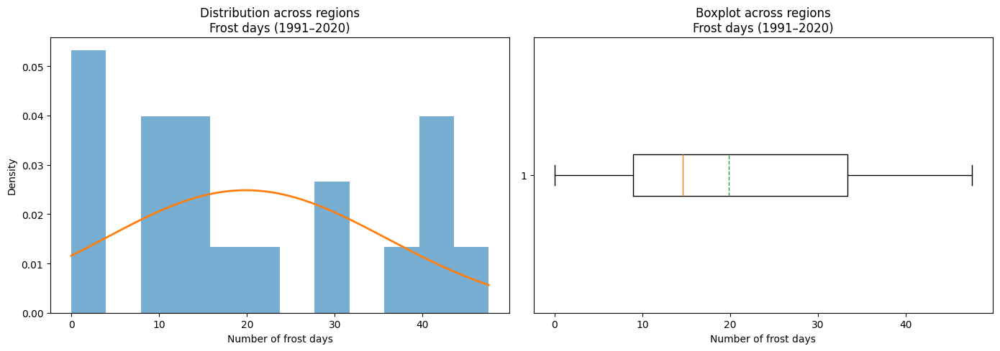


Frost days(2011–2040, RCP4.5)
Q1     : 7.29
Mean   : 16.91
Median : 12.30
Q3     : 29.12
IQR    : 21.83
Outliers (0):
Series([], dtype: float64)


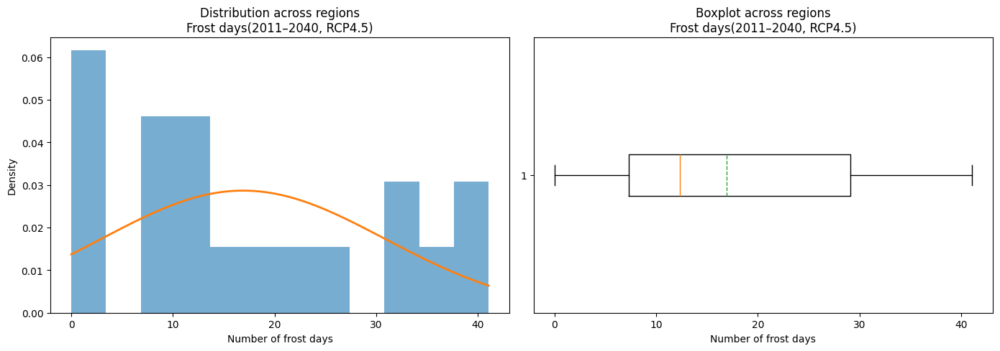


Frost days (2011–2040, RCP8.5)
Q1     : 6.83
Mean   : 16.38
Median : 11.76
Q3     : 28.08
IQR    : 21.25
Outliers (0):
Series([], dtype: float64)


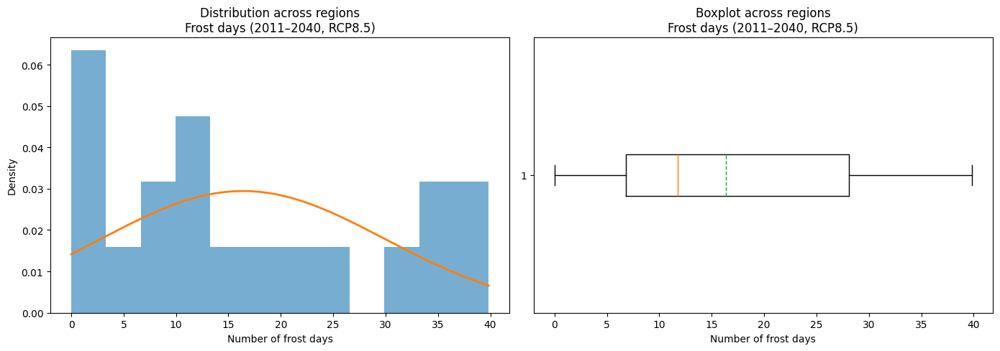

In [ ]:
from scipy.stats import norm

# =========================================================
# HAZARD DICTIONARIES
# =========================================================
hazard_data = {
    "Present (1991–2020)": frost_days_present_dict,
    "RCP 4.5 (2011–2040)": frost_days_future45_dict,
    "RCP 8.5 (2011–2040)": frost_days_future85_dict,
}

# =========================================================
# FUNCTION: distribution + boxplot + stats
# =========================================================
def hazard_distribution_from_dict(hazard_dict, label):

    # Convert dict → Series (one value per region)
    values = pd.Series(hazard_dict).astype(float)

    # ------------------------
    # Summary statistics
    # ------------------------
    Q1 = values.quantile(0.25)
    median = values.median()
    mean = values.mean()
    Q3 = values.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = values[(values < lower) | (values > upper)]

    print("\n" + "=" * 50)
    print(f"{label}")
    print(f"Q1     : {Q1:.2f}")
    print(f"Mean   : {mean:.2f}")
    print(f"Median : {median:.2f}")
    print(f"Q3     : {Q3:.2f}")
    print(f"IQR    : {IQR:.2f}")
    print(f"Outliers ({len(outliers)}):")
    print(outliers)

    # ------------------------
    # Plots
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram + normal distribution
    x = np.linspace(values.min(), values.max(), 300)
    axes[0].hist(values, bins=12, density=True, alpha=0.6)
    axes[0].plot(
        x,
        norm.pdf(x, mean, values.std()),
        linewidth=2
    )
    axes[0].set_title(f"Distribution across regions\n{label}")
    axes[0].set_xlabel("Number of frost days")
    axes[0].set_ylabel("Density")

    # Boxplot
    axes[1].boxplot(
        values,
        vert=False,
        showmeans=True,
        meanline=True
    )
    axes[1].set_title(f"Boxplot across regions\n{label}")
    axes[1].set_xlabel("Number of frost days")

    plt.tight_layout()
    plt.show()

    return fig

fig110 = hazard_distribution_from_dict(
    frost_days_present_dict,
    "Frost days (1991–2020)"
)


fig111 = hazard_distribution_from_dict(
    frost_days_future45_dict,
    "Frost days(2011–2040, RCP4.5)"
)


fig112 = hazard_distribution_from_dict(
    frost_days_future85_dict,
    "Frost days (2011–2040, RCP8.5)"
)

In [ ]:
save_figure(fig110, "Heatwave_days_Present_distribution.jpg")

save_figure(fig111, "Heatwave_days_RCP45_distribution.jpg")

save_figure(fig112, "Heatwave_days_RCP85_distribution.jpg")

Mapping the data

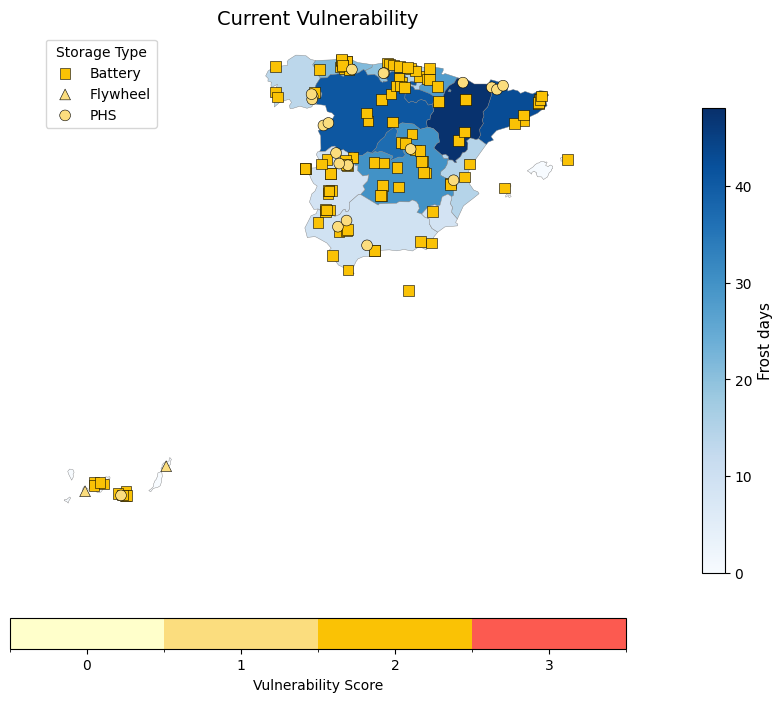

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
# Ensure HOTDAYSCURRENT_COL and other necessary config variables are defined
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability frost days"
HAZARDCURRENT_COL = "Frost days 1991-2020 hazard strength"
FROSTDAYSCURRENT_COL = "Frost days 1991-2020"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# Create region background from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[FROSTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    frost_days_present_dict
)


# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=0, vmax=48)
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Frost days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_13, ax_13 = plot_current_optionA(
    bg_col=FROSTDAYSCURRENT_COL,
    title="Current Vulnerability"
)


In [ ]:
save_figure(fig_13, "Current Vulnerability frost days.jpg")

Saved: Current Vulnerability frost days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

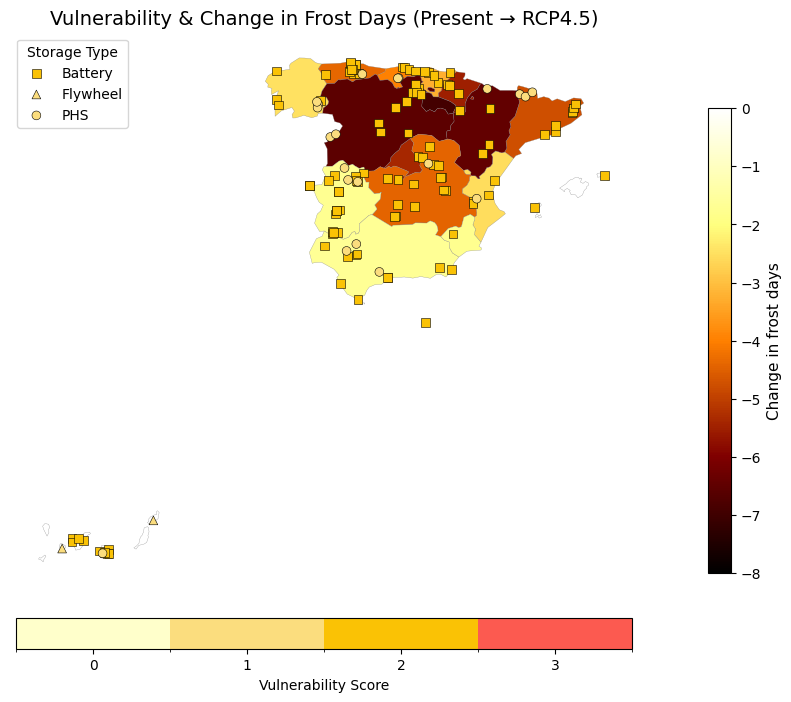

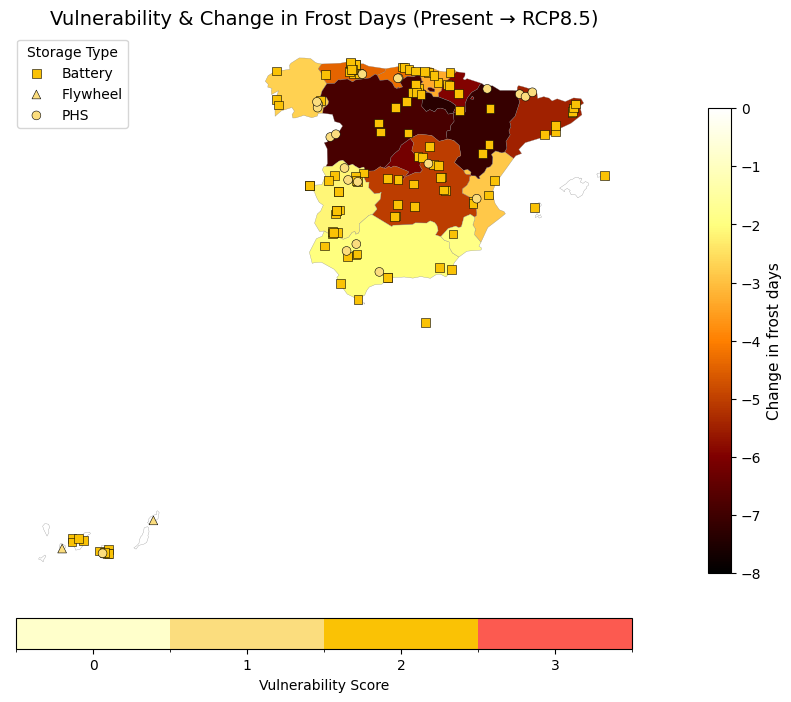

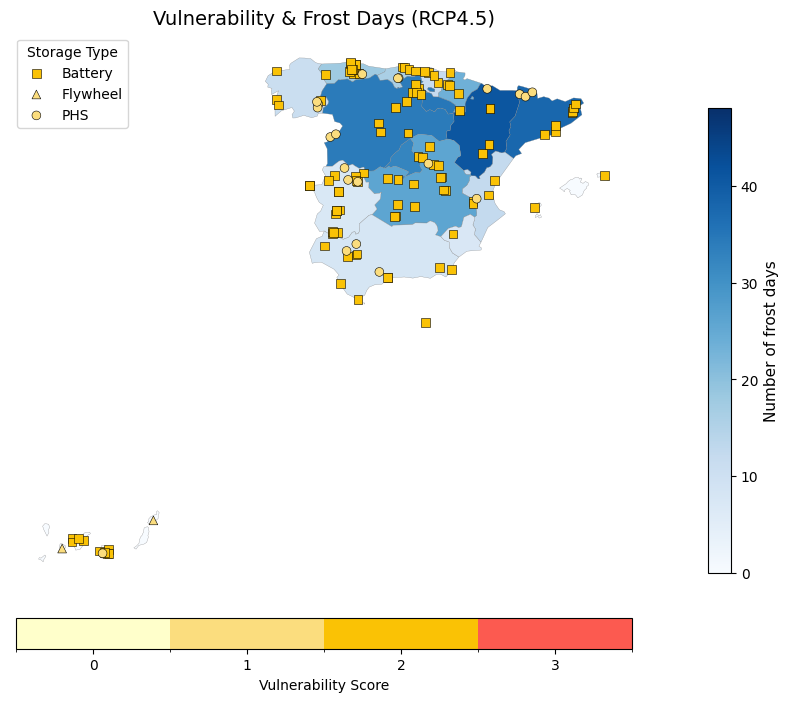

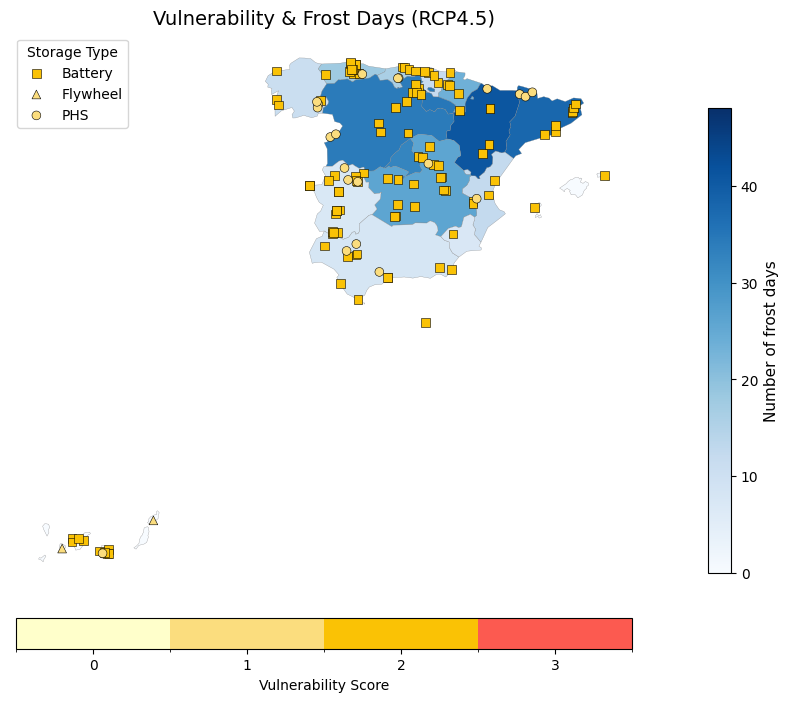

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS (HOT DAYS >35C)
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability frost days"

FROSTDAYS_CHANGE45 = "Frost days change RCP4.5"
FROSTDAYS_CHANGE85 = "Frost days change RCP8.5"
HAZARDCURRENT_COL = "Frost days 1991-2020 hazard strength"
FROSTDAYS45 = "Frost days 2011-2040 hazard strength RCP4.5"
FROSTDAYS85 = "Frost days 2011-2040 hazard strength RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

#Create region background from regions

regions_bg = regions.copy()

regions_bg[FROSTDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    frost_days_change45_dict
)
regions_bg[FROSTDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    frost_days_change85_dict
)
regions_bg[FROSTDAYS45] = regions_bg["NUTS_NAME"].map(
    frost_days_future45_dict
)
regions_bg[FROSTDAYS85] = regions_bg["NUTS_NAME"].map(
    frost_days_future85_dict
)


# =========================================================
# Discrete vulnerability colormap (unchanged)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)

    # Choose background colormap
    if "change" in bg_col.lower():
        cmap_bg = matplotlib.colormaps.get_cmap("afmhot")
    else:
        cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.Normalize(vmin=-8, vmax=0)
      bg_label = "Change in frost days"
    else:
      norm_bg = mcolors.Normalize(vmin=0,vmax=48)
      bg_label = "Number of frost days"

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    #Vulerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
    )

    return fig, ax


# =========================================================
# GENERATE MAPS
# =========================================================

fig_15, ax_15 = plot_step5_optionA(
    FROSTDAYS_CHANGE45,
    "Vulnerability & Change in Frost Days (Present → RCP4.5)"
)

fig_16, ax_16 = plot_step5_optionA(
    FROSTDAYS_CHANGE85,
    "Vulnerability & Change in Frost Days (Present → RCP8.5)"
)

fig_17, ax_17 = plot_step5_optionA(
    FROSTDAYS45,
    "Vulnerability & Frost Days (RCP4.5)"
)

fig_18, ax_18 = plot_step5_optionA(
    FROSTDAYS45,
    "Vulnerability & Frost Days (RCP4.5)"
)


In [ ]:
save_figure(fig_15, "Vulnerability & Change in frost days (Present → RCP4.5).jpg")
save_figure(fig_16, "Vulnerability & Change in frost days (Present → RCP8.5).jpg")
save_figure(fig_17, "Vulnerability & Frost Days (RCP4.5).jpg")
save_figure(fig_18, "Vulnerability & Frost Days (RCP8.5).jpg")

Saved: Vulnerability & Change in frost days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in frost days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Frost Days (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Frost Days (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

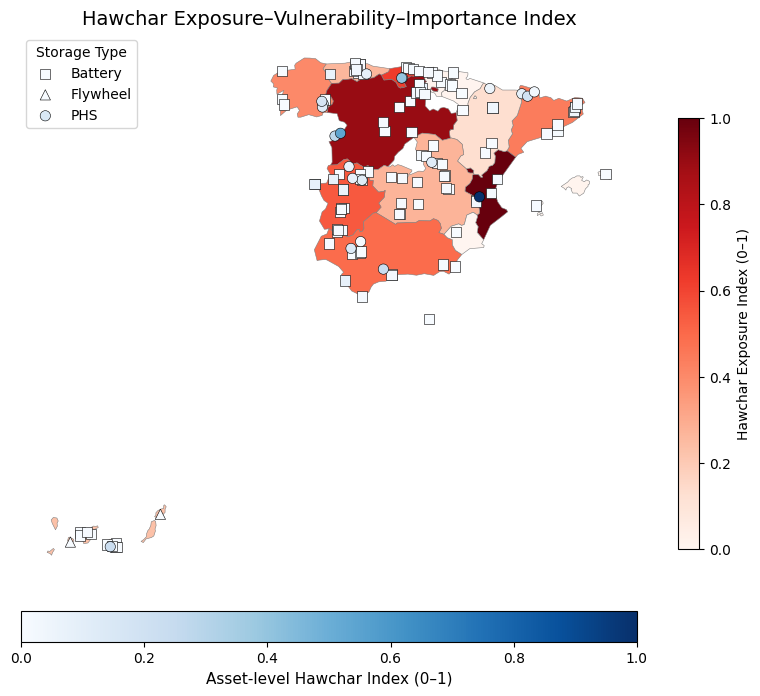

In [ ]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability frost days"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])


def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )
    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_14, ax_14 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)

In [ ]:
save_figure(fig_14, "Hawchar Index frost days.jpg")

Saved: Hawchar Index frost days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table

,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Comunitat Valenciana,49163.40,1.000000,16070.10,5,1.000000
1,Castilla y León,44190.60,0.535807,14143.90,12,0.898838
2,Cantabria,30701.60,0.396887,10077.90,6,0.624429
3,Extremadura,26845.04,0.119046,7760.26,22,0.545974
4,Andalucía,24334.76,0.238120,7575.29,13,0.494907
5,Cataluña,21816.80,0.191747,6671.70,11,0.443684
6,Galicia,19976.00,0.171306,6641.50,7,0.406236
7,Castilla-La Mancha,13317.04,0.116399,3769.26,17,0.270772
8,Principado de Asturias,13045.64,0.087954,3593.91,12,0.265251
9,Canarias,11377.56,0.231505,3734.09,12,0.231317


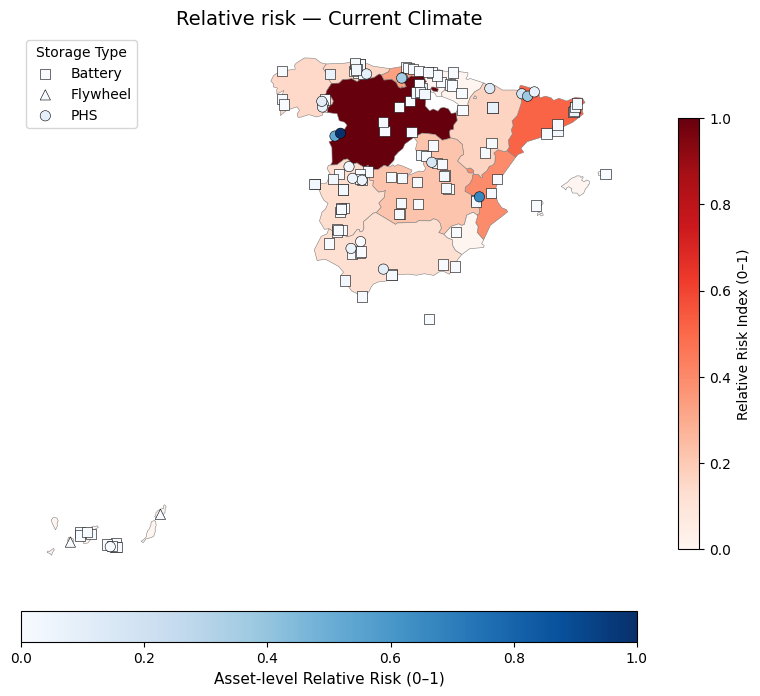

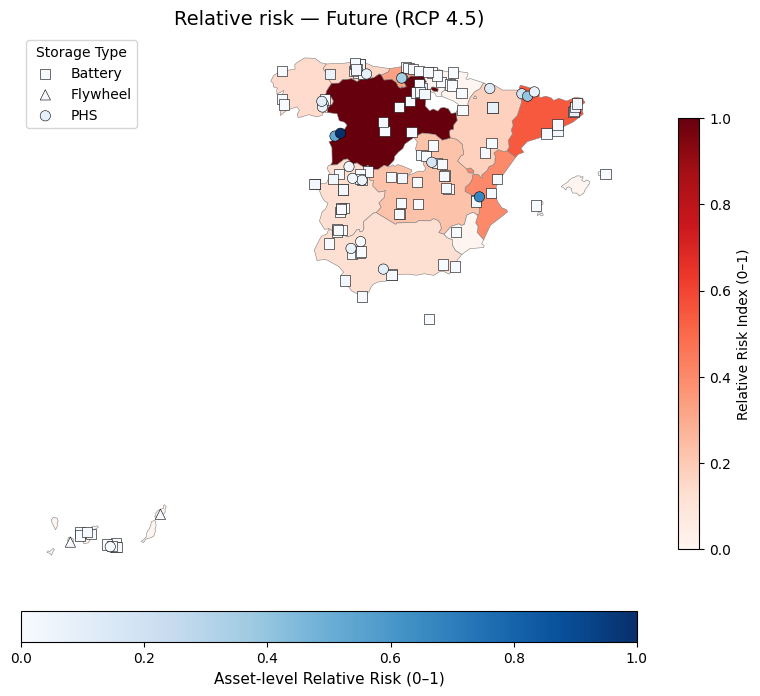

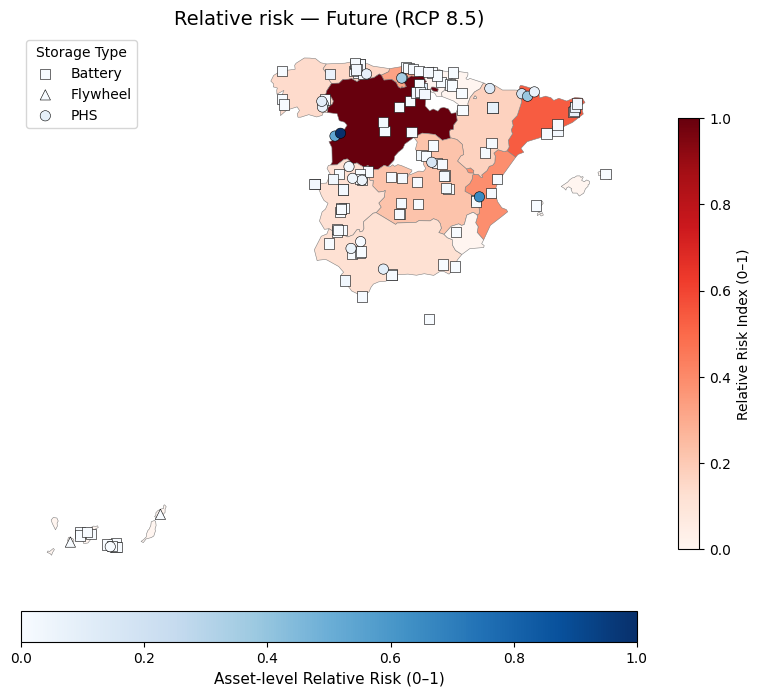

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability frost days"

HAZARDCURRENT_COL = "Frost days 1991-2020"
HAZARD45_COL     = "Frost days 2011-2040 RCP4.5"
HAZARD85_COL     = "Frost days 2011-2040 RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_19, ax_19 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_20, ax_20 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_21, ax_21 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_19, "Relative risk frost days — Current Climate.jpg")
save_figure(fig_20, "Relative risk frost days — Future (RCP4.5).jpg")
save_figure(fig_21, "Relative risk frost days — Future (RCP8.5).jpg")

Saved: Relative risk frost days — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk frost days — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk frost days — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

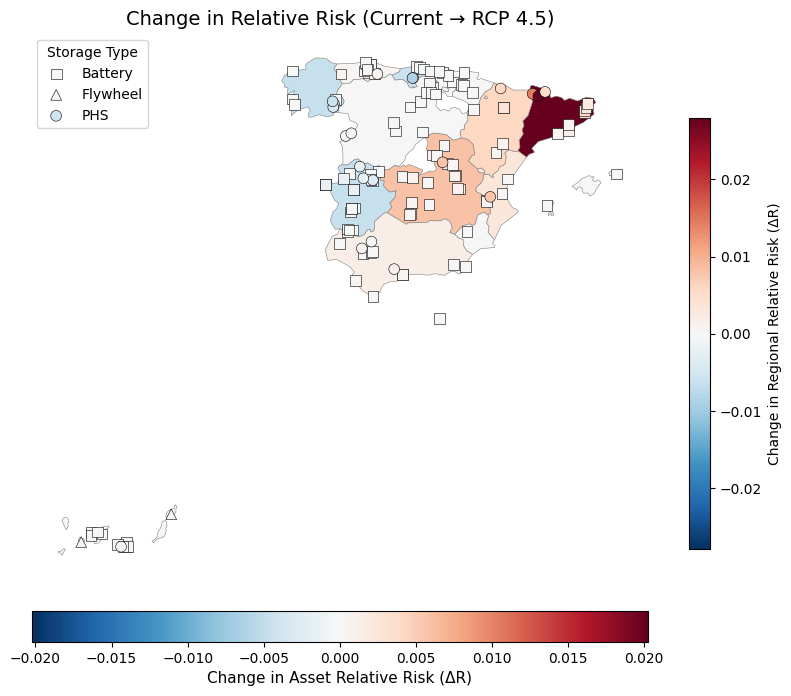

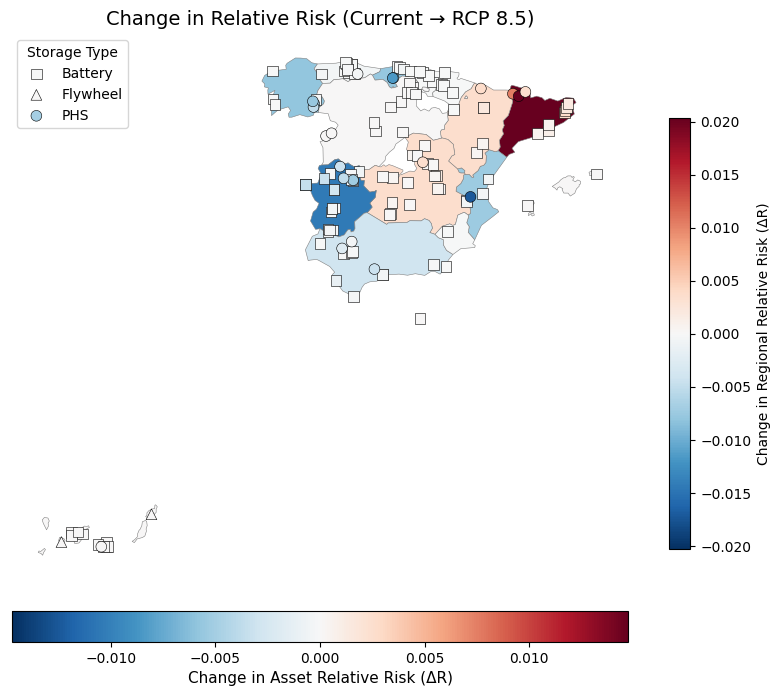

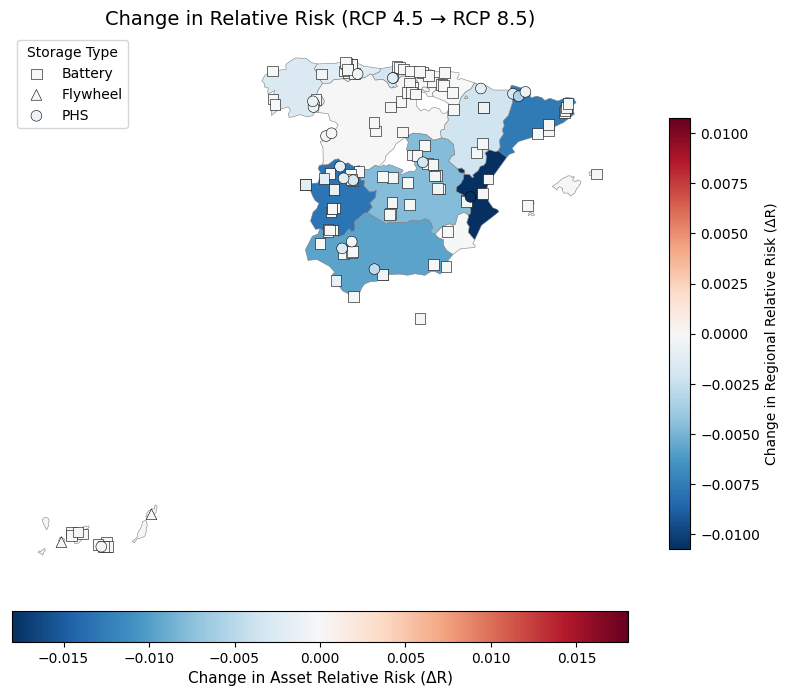

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_22, ax_22 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_23, ax_23 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_24, ax_23 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_22, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_23, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_24, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)
region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
  region_risk_table
  .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Castilla y León,1.806070e+06,1.509993e+06,1.483478e+06,1.000000,1.000000,1.000000,0.000000e+00,0.000000,0.000000,Castilla y León,1.000000
1,Cataluña,9.346317e+05,8.235842e+05,7.978404e+05,0.517495,0.545423,0.537817,2.792782e-02,0.020323,-0.007605,Cataluña,0.375153
2,Comunitat Valenciana,7.172940e+05,6.047098e+05,5.781616e+05,0.397157,0.400472,0.389734,3.314582e-03,-0.007424,-0.010738,Comunitat Valenciana,0.666241
3,Cantabria,6.048215e+05,4.967519e+05,4.850853e+05,0.334883,0.328976,0.326992,-5.906361e-03,-0.007891,-0.001985,Cantabria,0.357049
4,Castilla-La Mancha,3.988453e+05,3.457104e+05,3.327928e+05,0.220836,0.228948,0.224333,8.112286e-03,0.003497,-0.004616,Castilla-La Mancha,0.159228
5,Aragón,3.078173e+05,2.659630e+05,2.581234e+05,0.170435,0.176135,0.173999,5.700365e-03,0.003564,-0.002137,Aragón,0.127010
6,Principado de Asturias,2.793072e+05,2.344302e+05,2.285596e+05,0.154649,0.155252,0.154070,6.033513e-04,-0.000579,-0.001182,Principado de Asturias,0.086016
7,Galicia,2.716736e+05,2.175386e+05,2.113461e+05,0.150423,0.144066,0.142467,-6.356523e-03,-0.007956,-0.001599,Galicia,0.106402
8,Extremadura,2.413369e+05,1.919420e+05,1.769088e+05,0.133625,0.127115,0.119253,-6.510922e-03,-0.014373,-0.007862,Extremadura,0.048881
9,Andalucía,2.285034e+05,1.937047e+05,1.817807e+05,0.126520,0.128282,0.122537,1.762172e-03,-0.003983,-0.005745,Andalucía,0.102112


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Frost days 1991-2020,Vulnerability frost days,Frost days change RCP4.5,Frost days change RCP8.5,Frost days 2011-2040 RCP4.5,Frost days 2011-2040 RCP8.5,Frost days 1991-2020 hazard strength,Frost days 2011-2040 hazard strength RCP4.5,Frost days 2011-2040 hazard strength RCP8.5,Exposure,Hawchar_abs,Hawchar_rel,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,13.60,2,-2.50,-2.73,10.89,10.58,1,1,1,15.50,62.00,0.001338,843.2000,675.1800,655.9600,0.000849,0.000813,0.000804
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,13.60,2,-2.50,-2.73,10.89,10.58,1,1,1,20.00,80.00,0.001735,1088.0000,871.2000,846.4000,0.001096,0.001049,0.001038
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,13.60,2,-2.50,-2.73,10.89,10.58,1,1,1,5.00,20.00,0.000412,272.0000,217.8000,211.6000,0.000274,0.000262,0.000259
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,13.60,1,-2.50,-2.73,10.89,10.58,1,1,1,2280.00,6840.00,0.150799,93024.0000,74487.6000,72367.2000,0.093666,0.089708,0.088712
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.00,8.00,3,42.150000,-7.190000,13.60,1,-2.50,-2.73,10.89,10.58,1,1,1,1720.00,5160.00,0.113753,70176.0000,56192.4000,54592.8000,0.070661,0.067675,0.066923
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,315.00,2590.00,8.00,3,42.334200,-7.215200,13.60,1,-2.50,-2.73,10.89,10.58,1,1,1,2590.00,7770.00,0.171306,105672.0000,84615.3000,82206.6000,0.106402,0.101906,0.100774
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,13.60,2,-2.50,-2.73,10.89,10.58,1,1,1,11.00,44.00,0.000941,598.4000,479.1600,465.5200,0.000603,0.000577,0.000571
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,21.41,2,-4.40,-4.42,17.97,17.52,2,2,2,800.00,3200.00,0.070534,68512.0000,57504.0000,56064.0000,0.068985,0.069254,0.068727
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,21.41,2,-4.40,-4.42,17.97,17.52,2,2,2,46.00,184.00,0.004028,3939.4400,3306.4800,3223.6800,0.003967,0.003982,0.003952
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,21.41,2,-4.40,-4.42,17.97,17.52,2,2,2,60.00,240.00,0.005263,5138.4000,4312.8000,4204.8000,0.005174,0.005194,0.005155


# Heatwaves (Apparent Temperature Heatwave Days Index)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Heatwave days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Heatwave days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Heatwave days 1991-2020 for each region
heatwave_days_present_dict = {
    "Galicia": 6.27,
    "Principado de Asturias": 4.99,
    "Cantabria": 4.7,
    "País Vasco": 4.65,
    "Comunidad Foral de Navarra": 5.41,
    "La Rioja": 5.2,
    "Aragón": 6.4,
    "Cataluña": 7.06,
    "Comunitat Valenciana": 5.39,
    "Región de Murcia": 5.66,
    "Andalucía": 6.0,
    "Castilla-La Mancha": 6.6,
    "Castilla y León": 6.39,
    "Comunidad de Madrid": 7.05,
    "Extremadura": 6.94,
    "Canarias": 0.0,
    "Illes Balears": 5.9,
    "Ciudad de Ceuta": 5.14,
    "Ciudad de Melilla": 3.99,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 1991-2020"] = data["Region"].map(heatwave_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 2, 7, 14, float("inf")]
labels = [0, 1, 2, 3]

data['Heatwave days 1991-2020 hazard strength'] = pd.cut(
    data['Heatwave days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_heatwave_days = {
    "Battery": 3,
    "PHS": 2,
    "Flywheel": 1
}

data["Vulnerability heatwave days"] = data["Storage type"].map(vulnerability_heatwave_days)

In [ ]:
#Change in number of heatwave days from 1991-2020 to 2011-2040 RCP4.5 for each region
heatwave_days_change45_dict = {
    "Galicia": 3.15,
    "Principado de Asturias": 2.12,
    "Cantabria": 1.91,
    "País Vasco": 2.98,
    "Comunidad Foral de Navarra": 3.38,
    "La Rioja": 3.51,
    "Aragón": 5.14,
    "Cataluña": 5.94,
    "Comunitat Valenciana": 4.7,
    "Región de Murcia": 4.44,
    "Andalucía": 4.02,
    "Castilla-La Mancha": 4.88,
    "Castilla y León": 3.62,
    "Comunidad de Madrid": 4.39,
    "Extremadura": 3.38,
    "Canarias": 0.0,
    "Illes Balears": 3.97,
    "Ciudad de Ceuta": 2.76,
    "Ciudad de Melilla": 2.43,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days change RCP4.5"] = data["Region"].map(heatwave_days_change45_dict)

In [ ]:
#Change in number of heatwave days from 1991-2020 to 2011-2040 RCP8.5 for each region
heatwave_days_change85_dict = {
    "Galicia": 2.85,
    "Principado de Asturias": 1.41,
    "Cantabria": 1.31,
    "País Vasco": 1.39,
    "Comunidad Foral de Navarra": 3.32,
    "La Rioja": 3.87,
    "Aragón": 6.42,
    "Cataluña": 7.43,
    "Comunitat Valenciana": 6.25,
    "Región de Murcia": 5.87,
    "Andalucía": 6.2,
    "Castilla-La Mancha": 6.83,
    "Castilla y León": 4.44,
    "Comunidad de Madrid": 6.02,
    "Extremadura": 5.09,
    "Canarias": 0.0,
    "Illes Balears": 5.11,
    "Ciudad de Ceuta": 4.18,
    "Ciudad de Melilla": 2.93,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days change RCP8.5"] = data["Region"].map(heatwave_days_change85_dict)

In [ ]:
#Heatwave days 2011-2040 RCP4.5 for each region
heatwave_days_future45_dict = {
    "Galicia": 9.41,
    "Principado de Asturias": 7.11,
    "Cantabria": 6.61,
    "País Vasco": 6.74,
    "Comunidad Foral de Navarra": 8.79,
    "La Rioja": 8.71,
    "Aragón": 11.54,
    "Cataluña": 13.0,
    "Comunitat Valenciana": 10.09,
    "Región de Murcia": 10.09,
    "Andalucía": 10.02,
    "Castilla-La Mancha": 11.48,
    "Castilla y León": 10.01,
    "Comunidad de Madrid": 11.44,
    "Extremadura": 10.32,
    "Canarias": 0.0,
    "Illes Balears": 9.86,
    "Ciudad de Ceuta": 7.9,
    "Ciudad de Melilla": 6.42,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 2011-2040 RCP4.5"] = data["Region"].map(heatwave_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 2, 7, 14, float("inf")]
labels = [0, 1, 2, 3]

data["Heatwave days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Heatwave days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Heatwave days 2011-2040 RCP8.5 for each region
heatwave_days_future85_dict = {
    "Galicia": 8.95,
    "Principado de Asturias": 6.46,
    "Cantabria": 6.29,
    "País Vasco": 6.43,
    "Comunidad Foral de Navarra": 9.17,
    "La Rioja": 9.46,
    "Aragón": 13.48,
    "Cataluña": 14.5,
    "Comunitat Valenciana": 11.74,
    "Región de Murcia": 11.4,
    "Andalucía": 12.13,
    "Castilla-La Mancha": 13.52,
    "Castilla y León": 10.87,
    "Comunidad de Madrid": 13.3,
    "Extremadura": 11.63,
    "Canarias": 0.0,
    "Illes Balears": 10.68,
    "Ciudad de Ceuta": 9.13,
    "Ciudad de Melilla": 6.23,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 2011-2040 RCP8.5"] = data["Region"].map(heatwave_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 2, 7, 14, float("inf")]
labels = [0, 1, 2, 3]

data["Heatwave days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Heatwave days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Heatwave days 1991-2020 hazard strength',
    'Heatwave days 2011-2040 hazard strength RCP4.5',
    'Heatwave days 2011-2040 hazard strength RCP8.5',
    'Vulnerability heatwave days',
    'Heatwave days 1991-2020',
    'Heatwave days 2011-2040 RCP4.5',
    'Heatwave days 2011-2040 RCP8.5',
    'Heatwave days change RCP4.5',
    'Heatwave days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')


Heatwave days (1991–2020)
Q1     : 5.06
Mean   : 5.46
Median : 5.66
Q3     : 6.39
IQR    : 1.33
Outliers (1):
Canarias    0.0
dtype: float64


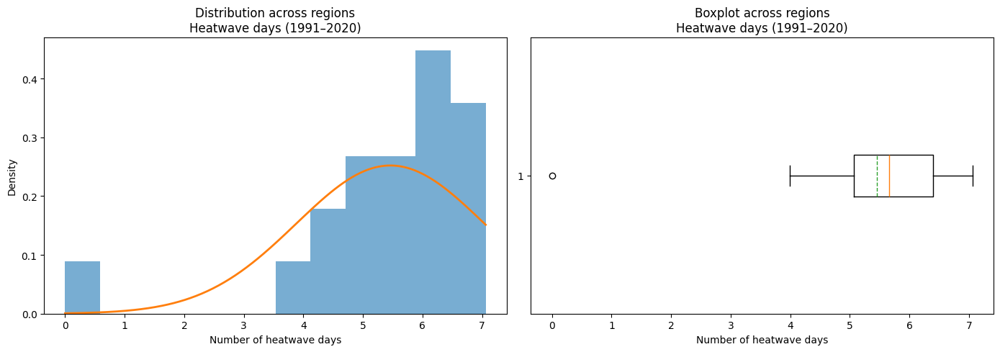


Heatwave days(2011–2040, RCP4.5)
Q1     : 7.51
Mean   : 8.92
Median : 9.86
Q3     : 10.21
IQR    : 2.70
Outliers (1):
Canarias    0.0
dtype: float64


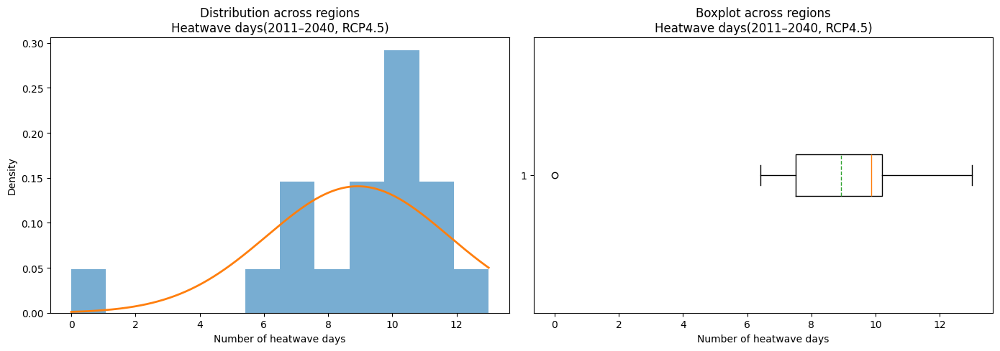


Heatwave days (2011–2040, RCP8.5)
Q1     : 7.71
Mean   : 9.76
Median : 10.68
Q3     : 11.94
IQR    : 4.23
Outliers (1):
Canarias    0.0
dtype: float64


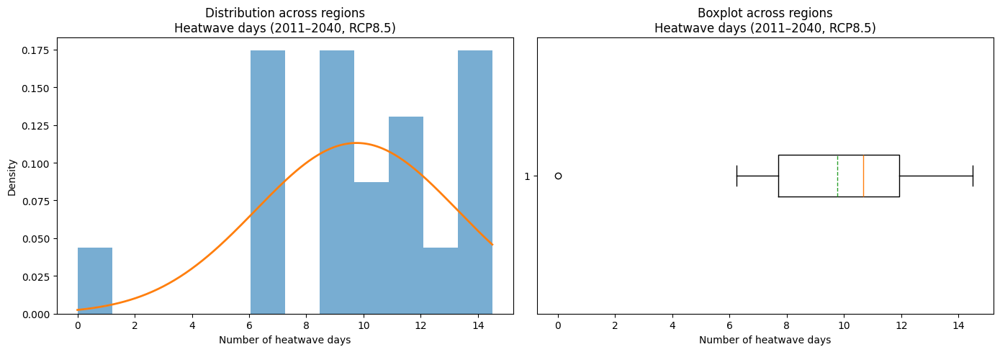

In [ ]:
from scipy.stats import norm

# =========================================================
# HAZARD DICTIONARIES
# =========================================================
hazard_data = {
    "Present (1991–2020)": heatwave_days_present_dict,
    "RCP 4.5 (2011–2040)": heatwave_days_future45_dict,
    "RCP 8.5 (2011–2040)": heatwave_days_future85_dict,
}

# =========================================================
# FUNCTION: distribution + boxplot + stats
# =========================================================
def hazard_distribution_from_dict(hazard_dict, label):

    # Convert dict → Series (one value per region)
    values = pd.Series(hazard_dict).astype(float)

    # ------------------------
    # Summary statistics
    # ------------------------
    Q1 = values.quantile(0.25)
    median = values.median()
    mean = values.mean()
    Q3 = values.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = values[(values < lower) | (values > upper)]

    print("\n" + "=" * 50)
    print(f"{label}")
    print(f"Q1     : {Q1:.2f}")
    print(f"Mean   : {mean:.2f}")
    print(f"Median : {median:.2f}")
    print(f"Q3     : {Q3:.2f}")
    print(f"IQR    : {IQR:.2f}")
    print(f"Outliers ({len(outliers)}):")
    print(outliers)

    # ------------------------
    # Plots
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram + normal distribution
    x = np.linspace(values.min(), values.max(), 300)
    axes[0].hist(values, bins=12, density=True, alpha=0.6)
    axes[0].plot(
        x,
        norm.pdf(x, mean, values.std()),
        linewidth=2
    )
    axes[0].set_title(f"Distribution across regions\n{label}")
    axes[0].set_xlabel("Number of heatwave days")
    axes[0].set_ylabel("Density")

    # Boxplot
    axes[1].boxplot(
        values,
        vert=False,
        showmeans=True,
        meanline=True
    )
    axes[1].set_title(f"Boxplot across regions\n{label}")
    axes[1].set_xlabel("Number of heatwave days")

    plt.tight_layout()
    plt.show()

    return fig

fig104 = hazard_distribution_from_dict(
    heatwave_days_present_dict,
    "Heatwave days (1991–2020)"
)


fig105 = hazard_distribution_from_dict(
    heatwave_days_future45_dict,
    "Heatwave days(2011–2040, RCP4.5)"
)


fig106 = hazard_distribution_from_dict(
    heatwave_days_future85_dict,
    "Heatwave days (2011–2040, RCP8.5)"
)



In [ ]:
save_figure(fig104, "Heatwave_days_Present_distribution.jpg")

save_figure(fig105, "Heatwave_days_RCP45_distribution.jpg")

save_figure(fig106, "Heatwave_days_RCP85_distribution.jpg")

Saved: Heatwave_days_Present_distribution.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Heatwave_days_RCP45_distribution.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Heatwave_days_RCP85_distribution.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 5.06, 5.66, 6.39, float("inf")]
labels = [0, 1, 2, 3]

data['Heatwave days 1991-2020 hazard strength'] = pd.cut(
    data['Heatwave days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

bins = [-float("inf"), 7.51, 9.86, 10.21, float("inf")]
labels = [0, 1, 2, 3]

data['Heatwave days 2011-2040 hazard strength RCP4.5'] = pd.cut(
    data['Heatwave days 2011-2040 RCP4.5'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

bins = [-float("inf"), 7.71, 9.76, 11.94, float("inf")]
labels = [0, 1, 2, 3]

data['Heatwave days 2011-2040 hazard strength RCP8.5'] = pd.cut(
    data['Heatwave days 2011-2040 RCP8.5'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)


Mapping the data

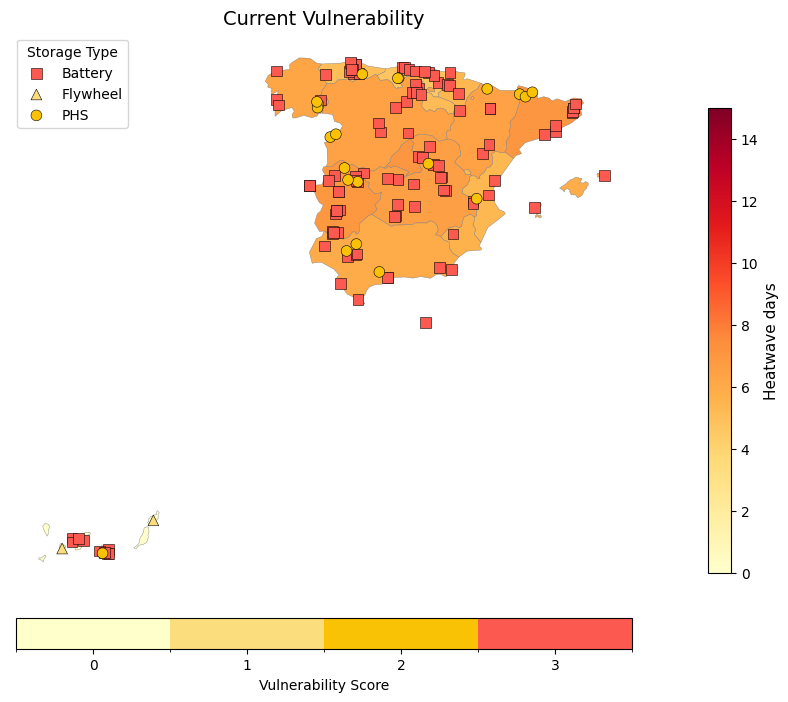

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
# Ensure HOTDAYSCURRENT_COL and other necessary config variables are defined
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability heatwave days"
HAZARDCURRENT_COL = "Heatwave days 1991-2020 hazard strength"
HEATWAVEDAYSCURRENT_COL = "Heatwave days 1991-2020"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# Create region background from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[HEATWAVEDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_present_dict
)


# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=0, vmax=15)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Heatwave days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")


    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_25, ax_25 = plot_current_optionA(
    bg_col=HEATWAVEDAYSCURRENT_COL,
    title="Current Vulnerability"
)



In [ ]:
save_figure(fig_25, "Current Vulnerability heatwave days.jpg")

Saved: Current Vulnerability heatwave days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

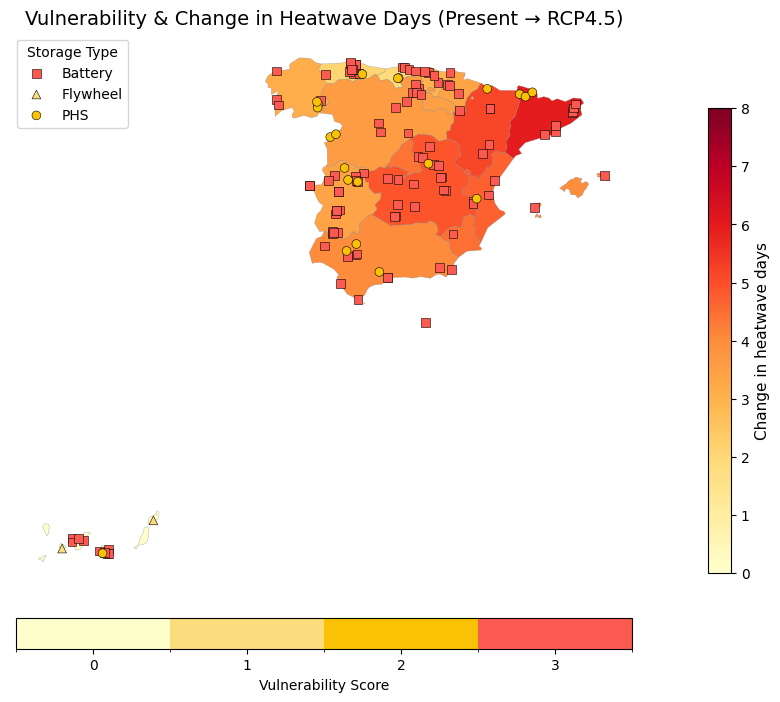

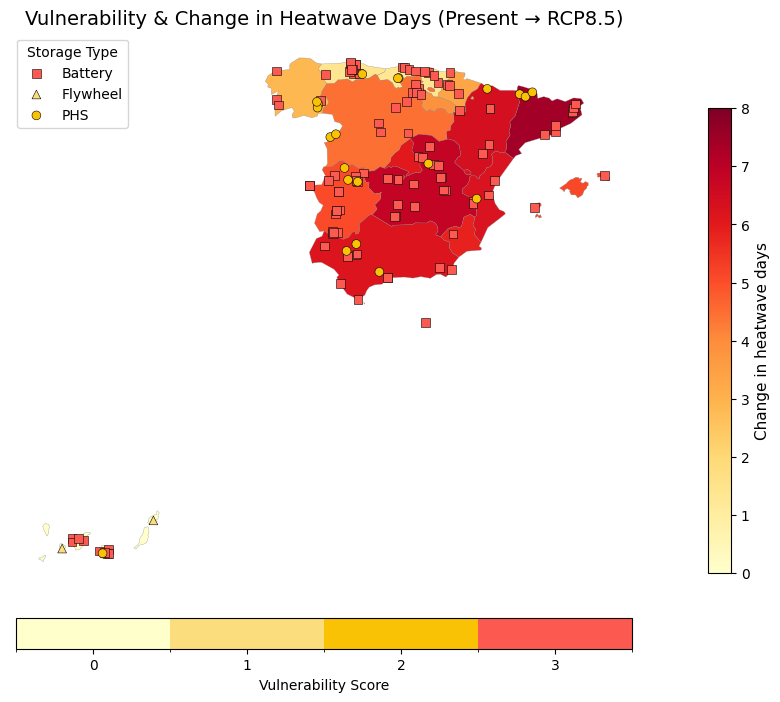

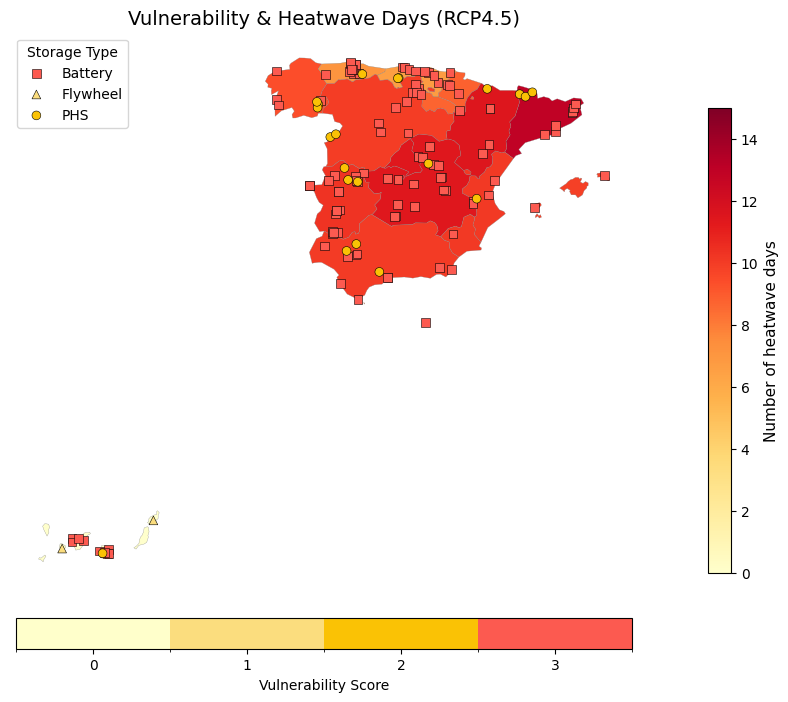

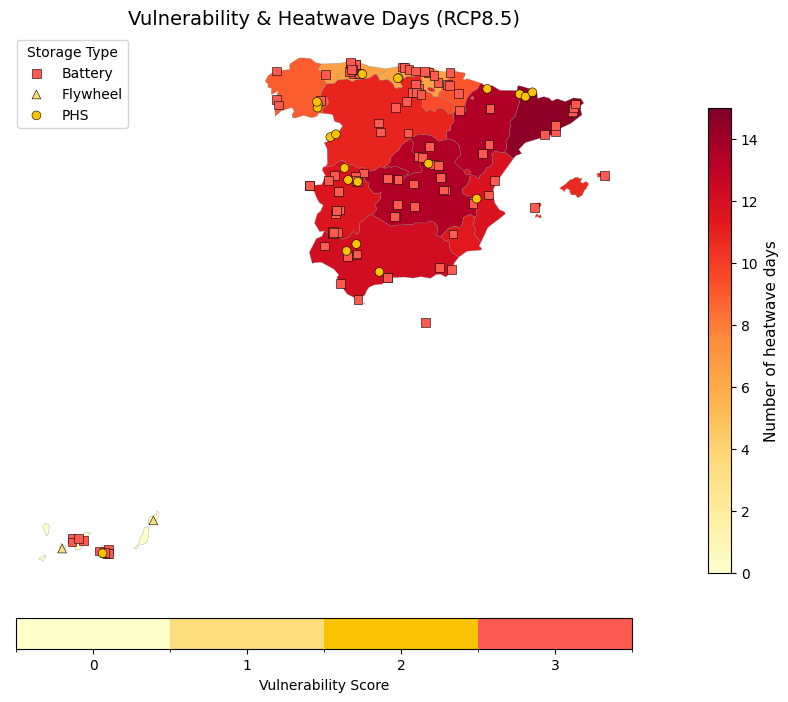

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability heatwave days"

HEATWAVEDAYS_CHANGE45 = "Heatwave days change RCP4.5"
HEATWAVEDAYS_CHANGE85 = "Heatwave days change RCP8.5"
HAZARDCURRENT_COL = "Heatwave days 1991-2020 hazard strength"
HEATWAVEDAYS45 = "Heatwave days 2011-2040 hazard strength RCP4.5"
HEATWAVEDAYS85 = "Heatwave days 2011-2040 hazard strength RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[HEATWAVEDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    heatwave_days_change45_dict
)
regions_bg[HEATWAVEDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    heatwave_days_change85_dict
)
regions_bg[HEATWAVEDAYS45] = regions_bg["NUTS_NAME"].map(
    heatwave_days_future45_dict
)
regions_bg[HEATWAVEDAYS85] = regions_bg["NUTS_NAME"].map(
    heatwave_days_future85_dict
)

# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.Normalize(vmin=0, vmax=8)
      bg_label = "Change in heatwave days"
    else:
      norm_bg = mcolors.Normalize(vmin=0,vmax=15)
      bg_label = "Number of heatwave days"

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    #Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_27, ax_27 = plot_step5_optionA(
    HEATWAVEDAYS_CHANGE45,
    "Vulnerability & Change in Heatwave Days (Present → RCP4.5)"
)

fig_28, ax_28 = plot_step5_optionA(
    HEATWAVEDAYS_CHANGE85,
    "Vulnerability & Change in Heatwave Days (Present → RCP8.5)"
)

fig_29, ax_29 = plot_step5_optionA(
    HEATWAVEDAYS45,
    "Vulnerability & Heatwave Days (RCP4.5)"
)

fig_30, ax_30 = plot_step5_optionA(
    HEATWAVEDAYS85,
    "Vulnerability & Heatwave Days (RCP8.5)"
)


In [ ]:
save_figure(fig_27, "Vulnerability & Change in heatwave days (Present → RCP4.5).jpg")
save_figure(fig_28, "Vulnerability & Change in heatwave days (Present → RCP8.5).jpg")
save_figure(fig_29, "Vulnerability & heatwave days (RCP4.5).jpg")
save_figure(fig_30, "Vulnerability & heatwave days (RCP8.5).jpg")

Saved: Vulnerability & Change in heatwave days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in heatwave days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & heatwave days (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & heatwave days (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

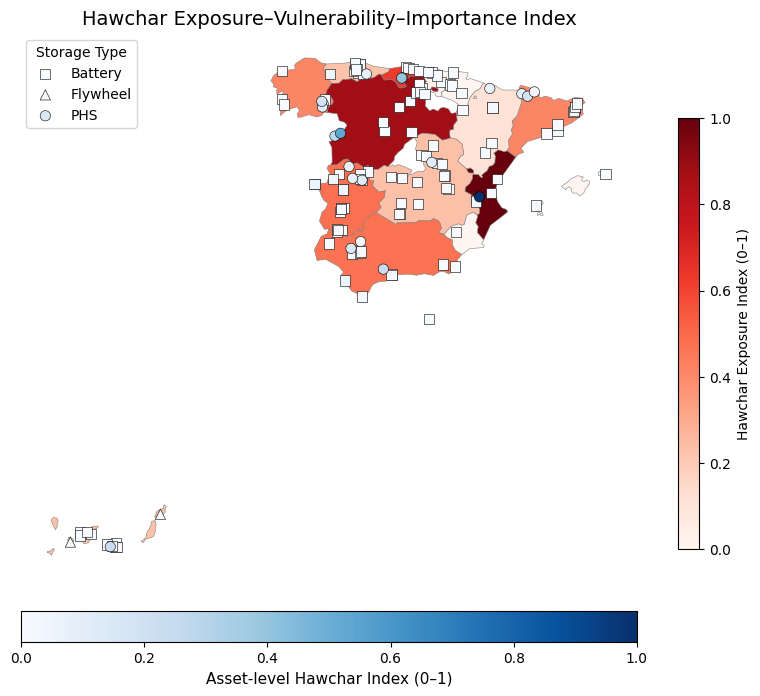

In [ ]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability heatwave days"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])


def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )
    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_26, ax_26 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)

In [ ]:
save_figure(fig_26, "Hawchar Index heatwave days.jpg")

Saved: Hawchar Index heatwave days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table

,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Comunitat Valenciana,96420.60,1.000000,16070.10,5,1.000000
1,Castilla y León,84863.40,0.535812,14143.90,12,0.880125
2,Cantabria,60467.40,0.396894,10077.90,6,0.627082
3,Extremadura,46561.56,0.119056,7760.26,22,0.482846
4,Andalucía,45451.74,0.238129,7575.29,13,0.471334
5,Cataluña,40030.20,0.191757,6671.70,11,0.415100
6,Galicia,39849.00,0.171316,6641.50,7,0.413221
7,Castilla-La Mancha,22615.56,0.116410,3769.26,17,0.234470
8,Canarias,22306.54,0.231514,3734.09,12,0.231265
9,Principado de Asturias,21563.46,0.087964,3593.91,12,0.223557


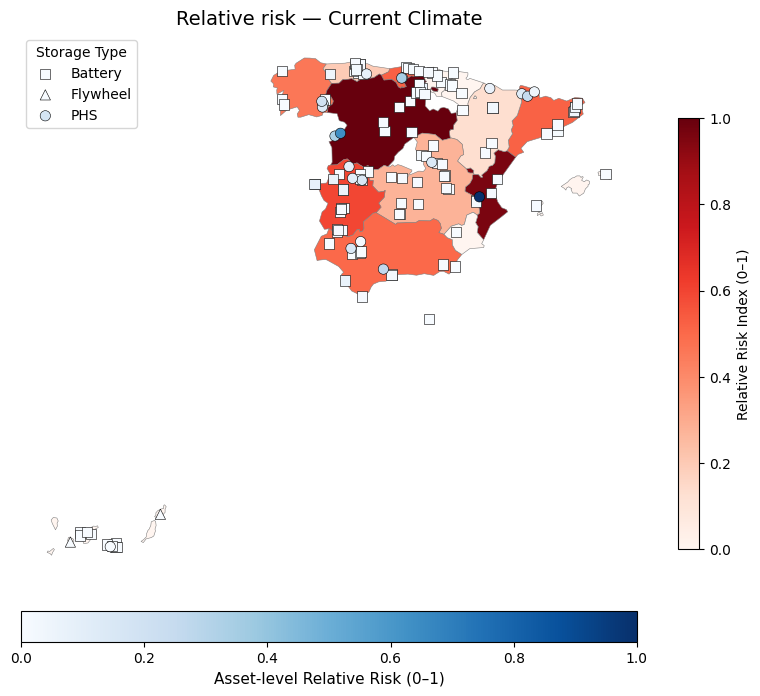

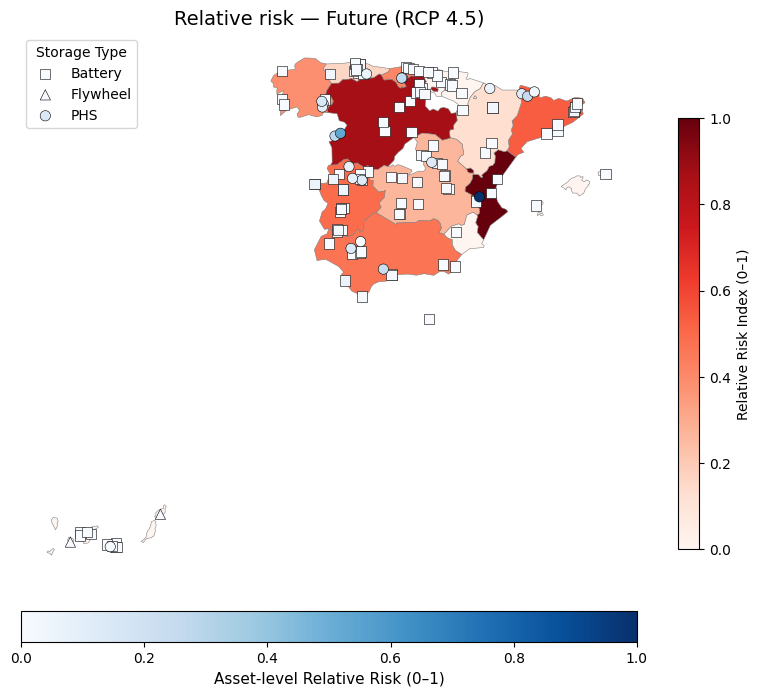

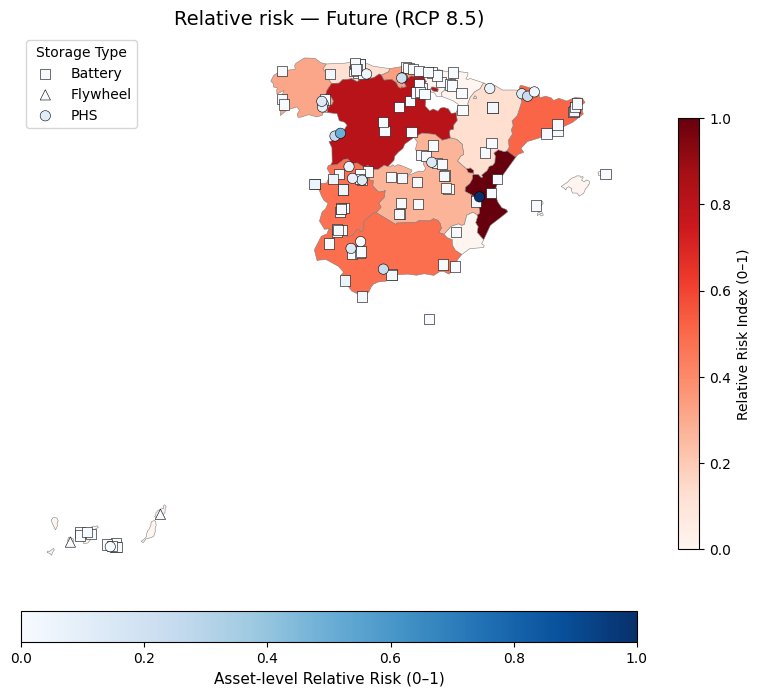

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability heatwave days"

HAZARDCURRENT_COL = "Heatwave days 1991-2020"
HAZARD45_COL     = "Heatwave days 2011-2040 RCP4.5"
HAZARD85_COL     = "Heatwave days 2011-2040 RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# MAP FUNCTION
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# GENERATE MAPS
# =========================================================

# Current climate
fig_31, ax_31 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_32, ax_32 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_33, ax_33 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_31, "Relative risk heatwave days — Current Climate.jpg")
save_figure(fig_32, "Relative risk heatwave days — Future (RCP4.5).jpg")
save_figure(fig_33, "Relative risk heatwave days — Future (RCP8.5).jpg")

Saved: Relative risk heatwave days — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk heatwave days — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk heatwave days — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

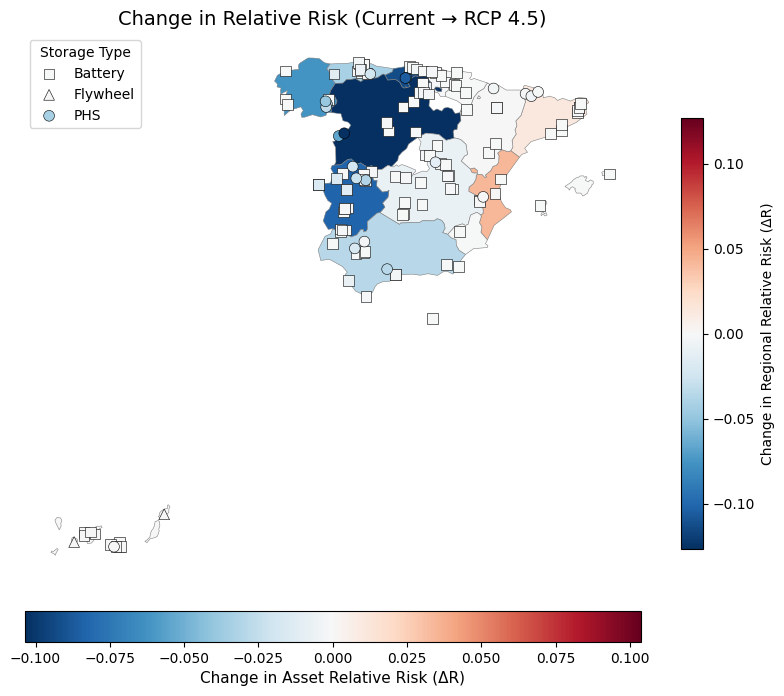

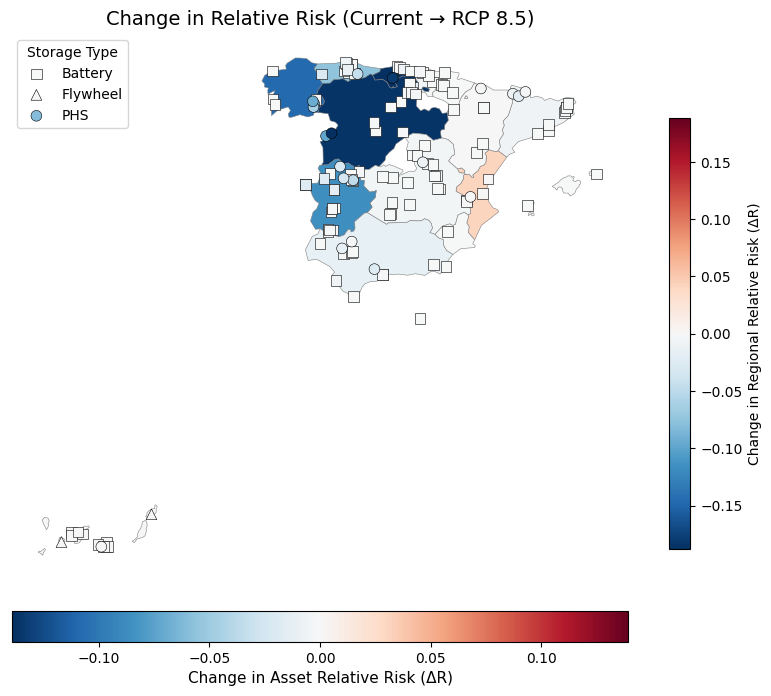

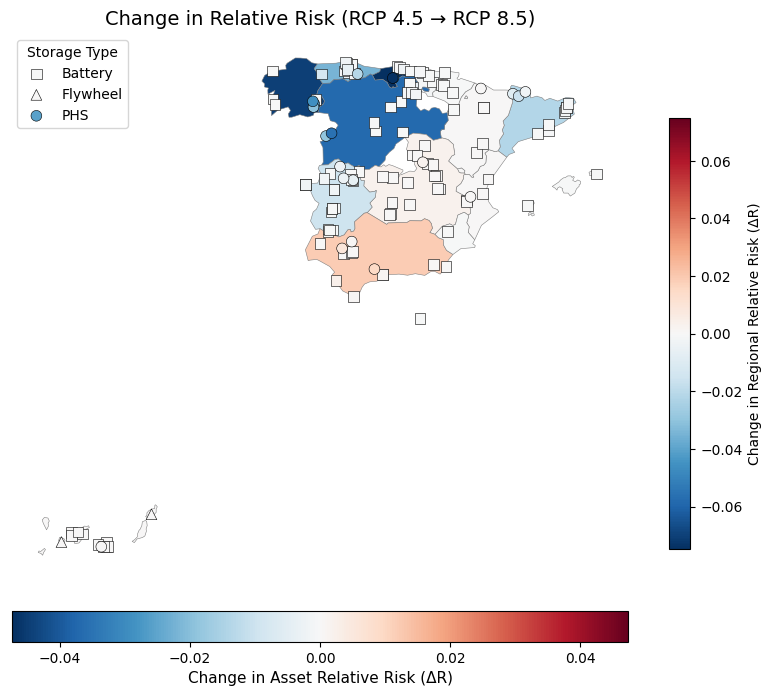

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_34, ax_34 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_35, ax_35 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_36, ax_36 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_34, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_35, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_36, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)
region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
    region_risk_table
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Castilla y León,542277.1260,849482.6340,9.224652e+05,1.000000,0.873159,0.814914,-0.126841,-0.185086,-0.058245,Castilla y León,0.635231
1,Comunitat Valenciana,519707.0340,972883.8540,1.131978e+06,0.958379,1.000000,1.000000,0.041621,0.041621,0.000000,Comunitat Valenciana,1.000000
2,Extremadura,323137.2264,480515.2992,5.415109e+05,0.595889,0.493908,0.478376,-0.101981,-0.117514,-0.015532,Extremadura,0.153313
3,Cantabria,284196.7800,399689.5140,3.803399e+05,0.524080,0.410830,0.335996,-0.113251,-0.188084,-0.074834,Cantabria,0.346095
4,Cataluña,282613.2120,520392.6000,5.804379e+05,0.521160,0.534897,0.512764,0.013737,-0.008396,-0.022133,Cataluña,0.251188
5,Andalucía,272710.4400,455426.4348,5.513296e+05,0.502899,0.468120,0.487050,-0.034779,-0.015849,0.018930,Andalucía,0.265094
6,Galicia,249853.2300,374979.0900,3.566485e+05,0.460748,0.385430,0.315067,-0.075318,-0.145682,-0.070364,Galicia,0.199303
7,Castilla-La Mancha,149262.6960,259626.6288,3.057624e+05,0.275252,0.266863,0.270113,-0.008389,-0.005138,0.003250,Castilla-La Mancha,0.142561
8,Principado de Asturias,107601.6654,153316.2006,1.393000e+05,0.198426,0.157589,0.123059,-0.040836,-0.075367,-0.034531,Principado de Asturias,0.081451
9,Aragón,70694.4000,127470.8400,1.489001e+05,0.130366,0.131024,0.131540,0.000658,0.001174,0.000516,Aragón,0.069513


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Heatwave days 1991-2020,Heatwave days 1991-2020 hazard strength,Vulnerability heatwave days,Heatwave days change RCP4.5,Heatwave days change RCP8.5,Heatwave days 2011-2040 RCP4.5,Heatwave days 2011-2040 hazard strength RCP4.5,Heatwave days 2011-2040 RCP8.5,Heatwave days 2011-2040 hazard strength RCP8.5,Exposure,Hawchar_abs,Hawchar_rel,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,6.27,1,3,3.15,2.85,9.41,2,8.95,2,15.50,93.00,0.001008,583.1100,875.1300,8.323500e+02,0.001193,0.000956,0.000782
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,6.27,1,3,3.15,2.85,9.41,2,8.95,2,20.00,120.00,0.001305,752.4000,1129.2000,1.074000e+03,0.001539,0.001234,0.001009
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,6.27,1,3,3.15,2.85,9.41,2,8.95,2,5.00,30.00,0.000313,188.1000,282.3000,2.685000e+02,0.000385,0.000308,0.000252
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,6.27,1,2,3.15,2.85,9.41,2,8.95,2,2280.00,13680.00,0.150809,85773.6000,128728.8000,1.224360e+05,0.175448,0.140659,0.114980
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.00,8.00,3,42.150000,-7.190000,6.27,1,2,3.15,2.85,9.41,2,8.95,2,1720.00,10320.00,0.113764,64706.4000,97111.2000,9.236400e+04,0.132355,0.106111,0.086740
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,315.00,2590.00,8.00,3,42.334200,-7.215200,6.27,1,2,3.15,2.85,9.41,2,8.95,2,2590.00,15540.00,0.171316,97435.8000,146231.4000,1.390830e+05,0.199303,0.159784,0.130614
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,6.27,1,3,3.15,2.85,9.41,2,8.95,2,11.00,66.00,0.000710,413.8200,621.0600,5.907000e+02,0.000846,0.000679,0.000555
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,4.99,1,3,2.12,1.41,7.11,2,6.46,1,800.00,4800.00,0.052904,23952.0000,34128.0000,3.100800e+04,0.048993,0.037291,0.029120
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,4.99,1,3,2.12,1.41,7.11,2,6.46,1,46.00,276.00,0.003025,1377.2400,1962.3600,1.782960e+03,0.002817,0.002144,0.001674
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,4.99,1,3,2.12,1.41,7.11,2,6.46,1,60.00,360.00,0.003951,1796.4000,2559.6000,2.325600e+03,0.003674,0.002797,0.002184


# Consecutive Dry Days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Dry days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Dry days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Dry days 1991-2020 for each region
dry_days_present_dict = {
    "Galicia": 23.95,
    "Principado de Asturias": 16.69,
    "Cantabria": 16.51,
    "País Vasco": 16.26,
    "Comunidad Foral de Navarra": 22.05,
    "La Rioja": 22.19,
    "Aragón": 27.57,
    "Cataluña": 27.92,
    "Comunitat Valenciana": 39.36,
    "Región de Murcia": 52.54,
    "Andalucía": 63.92,
    "Castilla-La Mancha": 40.8,
    "Castilla y León": 30.34,
    "Comunidad de Madrid": 39.41,
    "Extremadura": 52.75,
    "Canarias": 131.13,
    "Illes Balears": 55.69,
    "Ciudad de Ceuta": 81.95,
    "Ciudad de Melilla": 83.8,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 1991-2020"] = data["Region"].map(dry_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 15, 30, 60, 140, float("inf")]
labels = [0, 1, 2, 3, 4]

data['Dry days 1991-2020 hazard strength'] = pd.cut(
    data['Dry days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_dry_days = {
    "Battery": 0,
    "PHS": 2,
    "Flywheel": 0
}

data["Vulnerability dry days"] = data["Storage type"].map(vulnerability_dry_days)

In [ ]:
#Change in number of dry days from 1991-2020 to 2011-2040 RCP4.5 for each region
dry_days_change45_dict = {
    "Galicia": 0.82,
    "Principado de Asturias": 0.39,
    "Cantabria": 0.56,
    "País Vasco": 0.85,
    "Comunidad Foral de Navarra": 1.27,
    "La Rioja": 1.38,
    "Aragón": 1.57,
    "Cataluña": 1.22,
    "Comunitat Valenciana": 1.69,
    "Región de Murcia": 2.08,
    "Andalucía": 3.61,
    "Castilla-La Mancha": 2.73,
    "Castilla y León": 1.91,
    "Comunidad de Madrid": 2.11,
    "Extremadura": 3.99,
    "Canarias": -0.59,
    "Illes Balears": 0.94,
    "Ciudad de Ceuta": 0.37,
    "Ciudad de Melilla": 3.67,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days change RCP4.5"] = data["Region"].map(dry_days_change45_dict)

In [ ]:
#Change in number of dry days from 1991-2020 to 2011-2040 RCP8.5 for each region
dry_days_change85_dict = {
    "Galicia": 1.18,
    "Principado de Asturias": 0.56,
    "Cantabria": 0.67,
    "País Vasco": 0.8,
    "Comunidad Foral de Navarra": 1.31,
    "La Rioja": 1.22,
    "Aragón": 1.89,
    "Cataluña": 1.41,
    "Comunitat Valenciana": 1.61,
    "Región de Murcia": 2.6,
    "Andalucía": 5.18,
    "Castilla-La Mancha": 4.11,
    "Castilla y León": 2.67,
    "Comunidad de Madrid": 3.63,
    "Extremadura": 5.89,
    "Canarias": 0.12,
    "Illes Baleares": 0.49,
    "Ciudad de Ceuta": 1.17,
    "Ciudad de Melilla": 2.35,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days change RCP8.5"] = data["Region"].map(dry_days_change85_dict)

In [ ]:
#Dry days 2011-2040 RCP4.5 for each region
dry_days_future45_dict = {
    "Galicia": 24.94,
    "Principado de Asturias": 16.91,
    "Cantabria": 17.34,
    "País Vasco": 18.34,
    "Comunidad Foral de Navarra": 23.76,
    "La Rioja": 23.54,
    "Aragón": 30.22,
    "Cataluña": 29.73,
    "Comunitat Valenciana": 42.25,
    "Región de Murcia": 56.66,
    "Andalucía": 66.83,
    "Castilla-La Mancha": 45.14,
    "Castilla y León": 33.09,
    "Comunidad de Madrid": 43.78,
    "Extremadura": 59.22,
    "Canarias": 14.62,
    "Illes Balears": 58.94,
    "Ciudad de Ceuta": 77.6,
    "Ciudad de Melilla": 78.28,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 2011-2040 RCP4.5"] = data["Region"].map(dry_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 15, 30, 60, 140, float("inf")]
labels = [0, 1, 2, 3, 4]

data["Dry days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Dry days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Dry days 2011-2040 RCP8.5 for each region
dry_days_future85_dict = {
    "Galicia": 25.42,
    "Principado de Asturias": 16.84,
    "Cantabria": 17.09,
    "País Vasco": 17.98,
    "Comunidad Foral de Navarra": 23.64,
    "La Rioja": 23.28,
    "Aragón": 29.89,
    "Cataluña": 29.39,
    "Comunitat Valenciana": 41.44,
    "Región de Murcia": 56.77,
    "Andalucía": 67.76,
    "Castilla-La Mancha": 45.9,
    "Castilla y León": 33.98,
    "Comunidad de Madrid": 44.35,
    "Extremadura": 60.27,
    "Canarias": 15.3,
    "Illes Balears": 57.56,
    "Ciudad de Ceuta": 77.55,
    "Ciudad de Melilla": 76.54,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 2011-2040 RCP8.5"] = data["Region"].map(dry_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 15, 30, 60, 140, float("inf")]
labels = [0, 1, 2, 3, 4]

data["Dry days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Dry days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Dry days 1991-2020 hazard strength',
    'Dry days 2011-2040 hazard strength RCP4.5',
    'Dry days 2011-2040 hazard strength RCP8.5',
    'Vulnerability dry days',
    'Dry days 1991-2020',
    'Dry days 2011-2040 RCP4.5',
    'Dry days 2011-2040 RCP8.5',
    'Dry days change RCP4.5',
    'Dry days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')


Dry days (1991–2020)
Q1     : 23.07
Mean   : 44.46
Median : 39.36
Q3     : 54.22
IQR    : 31.15
Outliers (1):
Canarias    131.13
dtype: float64


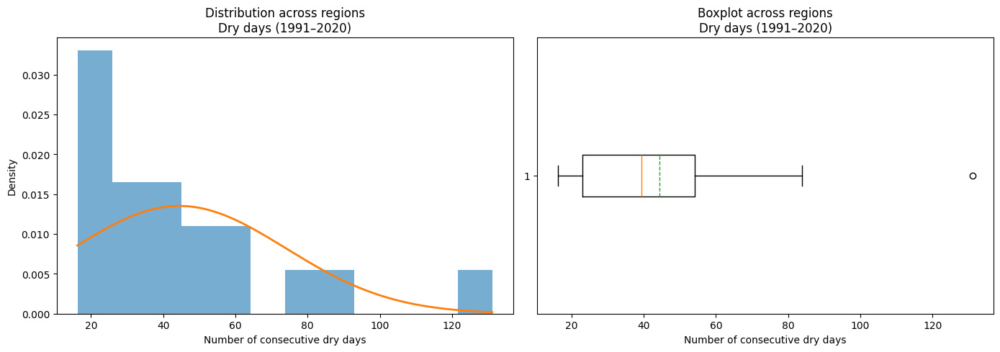


Dry days(2011–2040, RCP4.5)
Q1     : 23.65
Mean   : 40.06
Median : 33.09
Q3     : 57.80
IQR    : 34.15
Outliers (0):
Series([], dtype: float64)


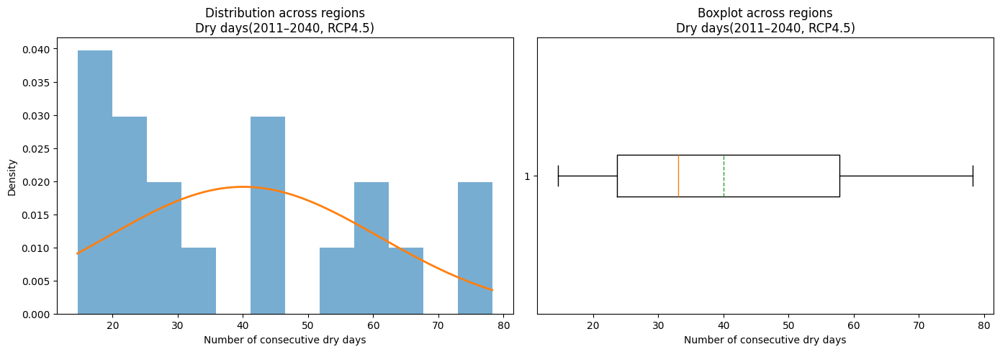


Dry days (2011–2040, RCP8.5)
Q1     : 23.46
Mean   : 40.05
Median : 33.98
Q3     : 57.17
IQR    : 33.71
Outliers (0):
Series([], dtype: float64)


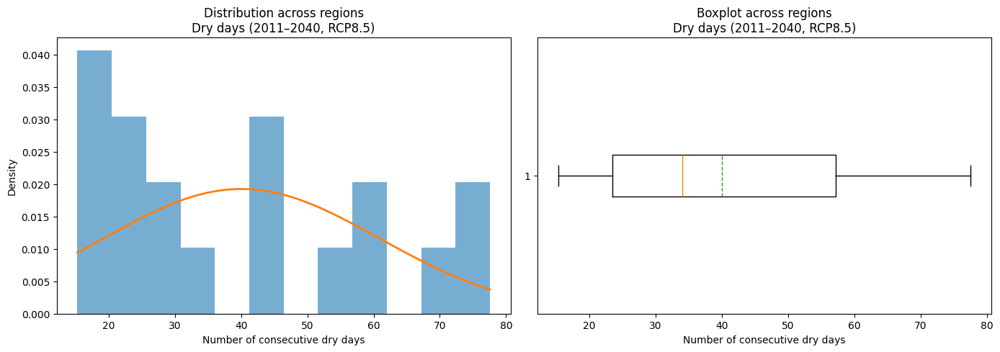

In [ ]:
from scipy.stats import norm

# =========================================================
# HAZARD DICTIONARIES
# =========================================================
hazard_data = {
    "Present (1991–2020)": dry_days_present_dict,
    "RCP 4.5 (2011–2040)": dry_days_future45_dict,
    "RCP 8.5 (2011–2040)": dry_days_future85_dict,
}

# =========================================================
# FUNCTION: distribution + boxplot + stats
# =========================================================
def hazard_distribution_from_dict(hazard_dict, label):

    # Convert dict → Series (one value per region)
    values = pd.Series(hazard_dict).astype(float)

    # ------------------------
    # Summary statistics
    # ------------------------
    Q1 = values.quantile(0.25)
    median = values.median()
    mean = values.mean()
    Q3 = values.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = values[(values < lower) | (values > upper)]

    print("\n" + "=" * 50)
    print(f"{label}")
    print(f"Q1     : {Q1:.2f}")
    print(f"Mean   : {mean:.2f}")
    print(f"Median : {median:.2f}")
    print(f"Q3     : {Q3:.2f}")
    print(f"IQR    : {IQR:.2f}")
    print(f"Outliers ({len(outliers)}):")
    print(outliers)

    # ------------------------
    # Plots
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram + normal distribution
    x = np.linspace(values.min(), values.max(), 300)
    axes[0].hist(values, bins=12, density=True, alpha=0.6)
    axes[0].plot(
        x,
        norm.pdf(x, mean, values.std()),
        linewidth=2
    )
    axes[0].set_title(f"Distribution across regions\n{label}")
    axes[0].set_xlabel("Number of consecutive dry days")
    axes[0].set_ylabel("Density")

    # Boxplot
    axes[1].boxplot(
        values,
        vert=False,
        showmeans=True,
        meanline=True
    )
    axes[1].set_title(f"Boxplot across regions\n{label}")
    axes[1].set_xlabel("Number of consecutive dry days")

    plt.tight_layout()
    plt.show()

    return fig

fig113 = hazard_distribution_from_dict(
    dry_days_present_dict,
    "Dry days (1991–2020)"
)

fig114 = hazard_distribution_from_dict(
    dry_days_future45_dict,
    "Dry days(2011–2040, RCP4.5)"
)

fig115 = hazard_distribution_from_dict(
    dry_days_future85_dict,
    "Dry days (2011–2040, RCP8.5)"
)

In [ ]:
save_figure(fig113, "Dry_days_Present_distribution.jpg")

save_figure(fig114, "Dry_days_RCP45_distribution.jpg")

save_figure(fig115, "Dry_days_RCP85_distribution.jpg")

Mapping the data

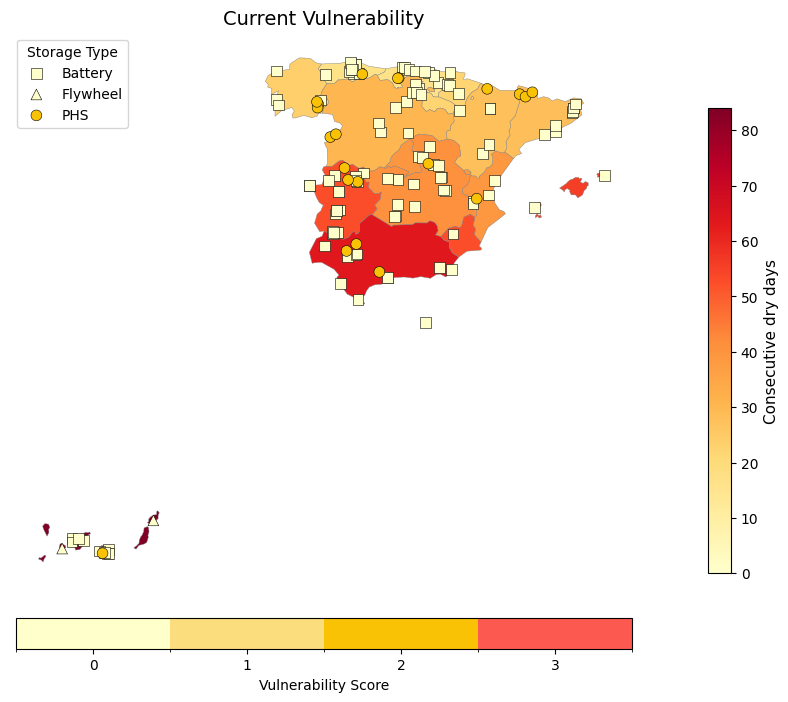

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
# Ensure HOTDAYSCURRENT_COL and other necessary config variables are defined
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability dry days"
HAZARDCURRENT_COL = "Dry days 1991-2020 hazard strength"
DRYDAYSCURRENT_COL = "Dry days 1991-2020"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[DRYDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    dry_days_present_dict
)


# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=0, vmax=84)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Consecutive dry days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_37, ax_37 = plot_current_optionA(
    bg_col=DRYDAYSCURRENT_COL,
    title="Current Vulnerability"
)


In [ ]:
save_figure(fig_37, "Current Vulnerability consecutive dry days.jpg")

Saved: Current Vulnerability consecutive dry days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

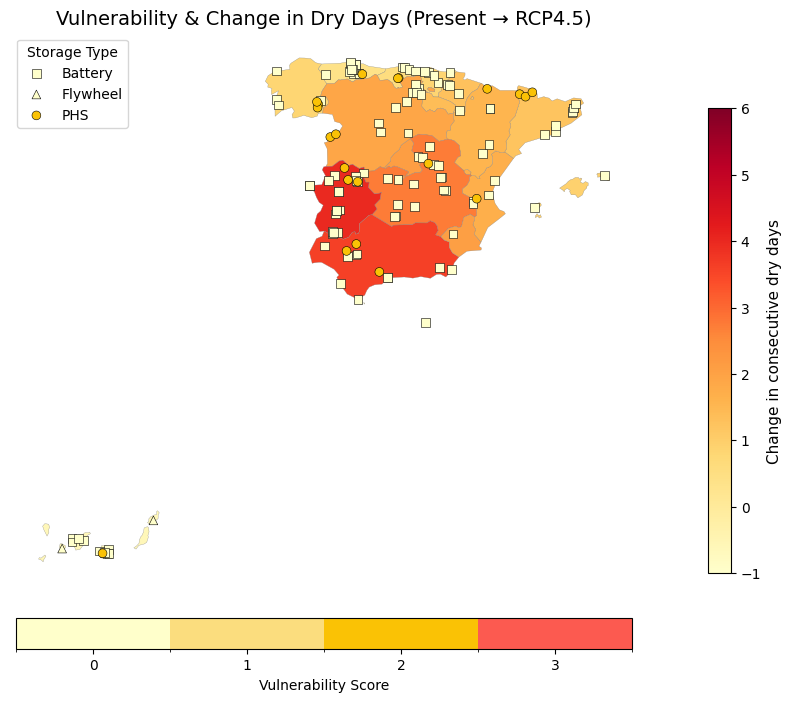

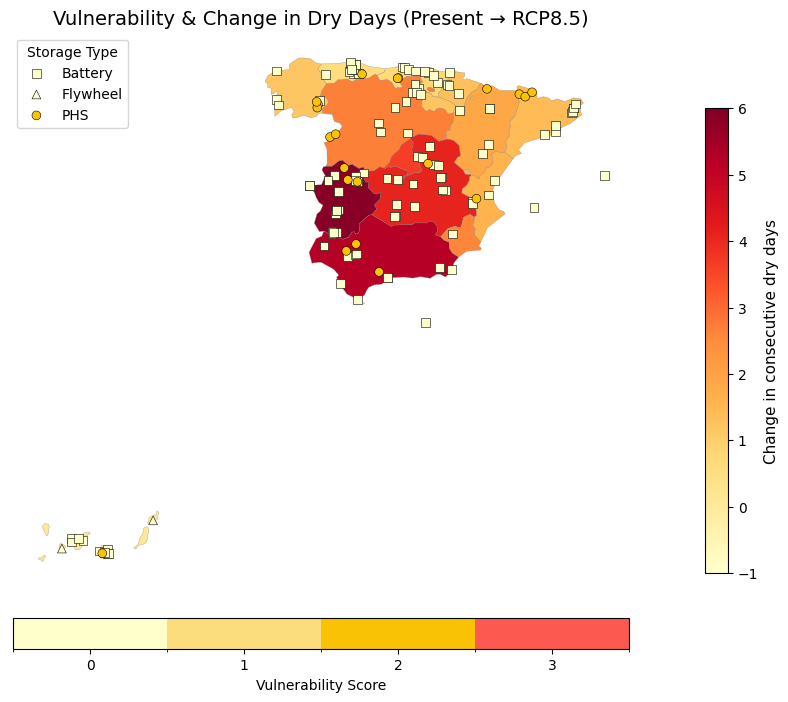

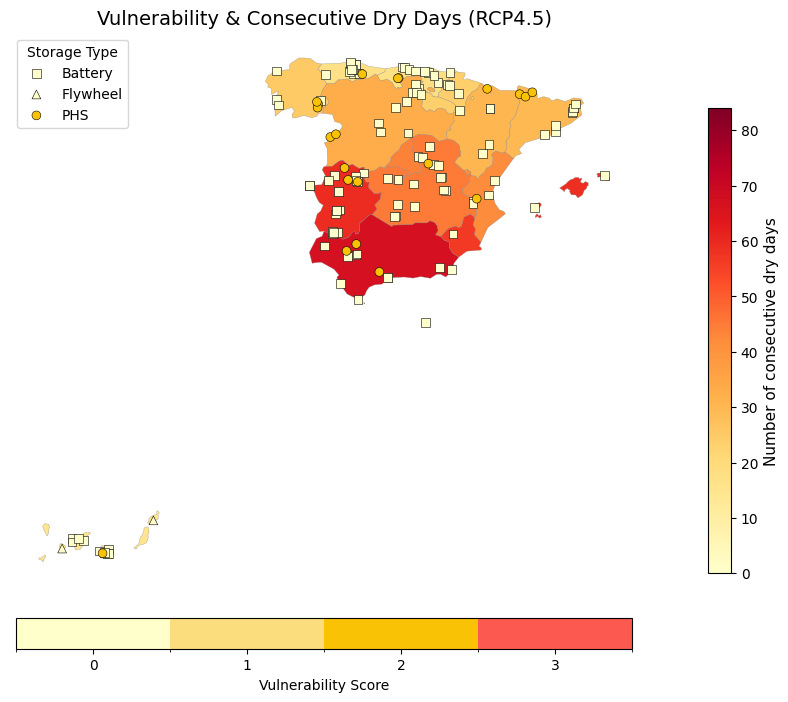

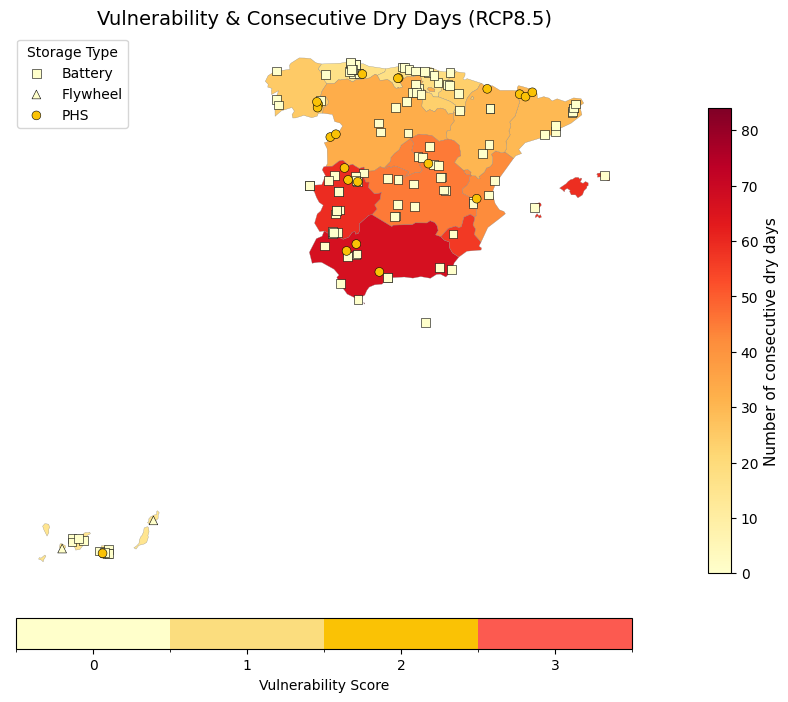

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability dry days"

DRYDAYS_CHANGE45 = "Dry days change RCP4.5"
DRYDAYS_CHANGE85 = "Dry days change RCP8.5"
HAZARDCURRENT_COL = "Dry days 1991-2020 hazard strength"
DRYDAYS45 = "Dry days 2011-2040 hazard strength RCP4.5"
DRYDAYS85 = "Dry days 2011-2040 hazard strength RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[DRYDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    dry_days_change45_dict
)
regions_bg[DRYDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    dry_days_change85_dict
)
regions_bg[DRYDAYS45] = regions_bg["NUTS_NAME"].map(
    dry_days_future45_dict
)
regions_bg[DRYDAYS85] = regions_bg["NUTS_NAME"].map(
    dry_days_future85_dict
)

# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.Normalize(vmin=-1, vmax=6)
      bg_label = "Change in consecutive dry days"
    else:
      norm_bg = mcolors.Normalize(vmin=0,vmax=84)
      bg_label = "Number of consecutive dry days"

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax



# =========================================================
# GENERATE MAPS
# =========================================================

fig_39, ax_39 = plot_step5_optionA(
    DRYDAYS_CHANGE45,
    "Vulnerability & Change in Dry Days (Present → RCP4.5)"
)

fig_40, ax_40 = plot_step5_optionA(
    DRYDAYS_CHANGE85,
    "Vulnerability & Change in Dry Days (Present → RCP8.5)"
)

fig_41, ax_41 = plot_step5_optionA(
    DRYDAYS45,
    "Vulnerability & Consecutive Dry Days (RCP4.5)"
)

fig_42, ax_42 = plot_step5_optionA(
    DRYDAYS45,
    "Vulnerability & Consecutive Dry Days (RCP8.5)"
)


In [ ]:
save_figure(fig_39, "Vulnerability & Change in consecutive dry days (Present → RCP4.5).jpg")
save_figure(fig_40, "Vulnerability & Change in consecutive dry days (Present → RCP8.5).jpg")
save_figure(fig_41, "Vulnerability & Consecutive dry days (RCP4.5).jpg")
save_figure(fig_42, "Vulnerability & Consecutive dry days (RCP8.5).jpg")

Saved: Vulnerability & Change in consecutive dry days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in consecutive dry days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Consecutive dry days (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Consecutive dry days (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

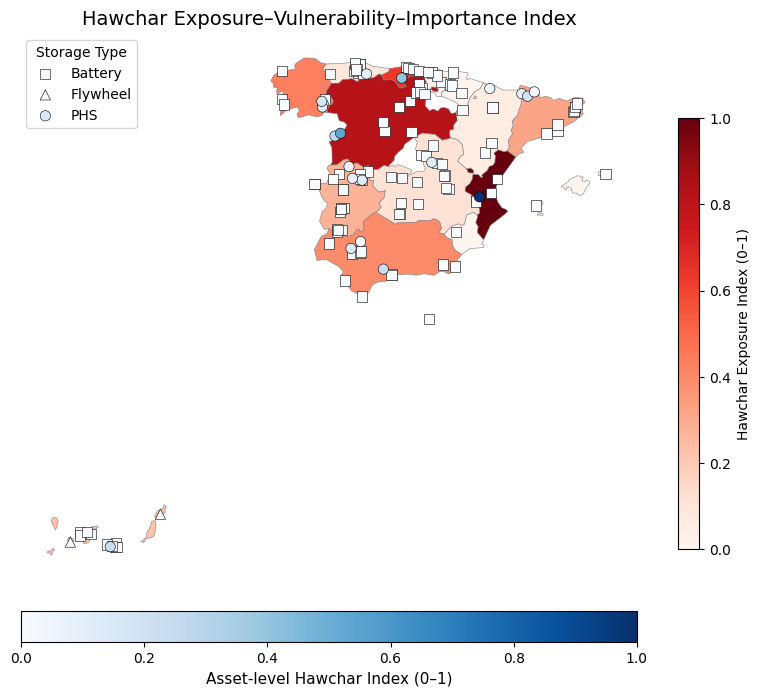

In [ ]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability dry days"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])

def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )
    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_38, ax_38 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)

In [ ]:
save_figure(fig_38, "Hawchar Index consecutive dry days.jpg")

Saved: Hawchar Index consecutive dry days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table

,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Comunitat Valenciana,90702.0,1.000000,16070.10,5,1.000000
1,Castilla y León,74310.0,0.535821,14143.90,12,0.819276
2,Cantabria,57660.0,0.396904,10077.90,6,0.635708
3,Galicia,39540.0,0.171330,6641.50,7,0.435933
4,Andalucía,35798.4,0.238142,7575.29,13,0.394681
5,Cataluña,29220.0,0.191771,6671.70,11,0.322154
6,Extremadura,25176.0,0.119071,7760.26,22,0.277568
7,Canarias,21000.0,0.231527,3734.09,12,0.231527
8,Castilla-La Mancha,10560.0,0.116425,3769.26,17,0.116425
9,Principado de Asturias,7980.0,0.087980,3593.91,12,0.087980


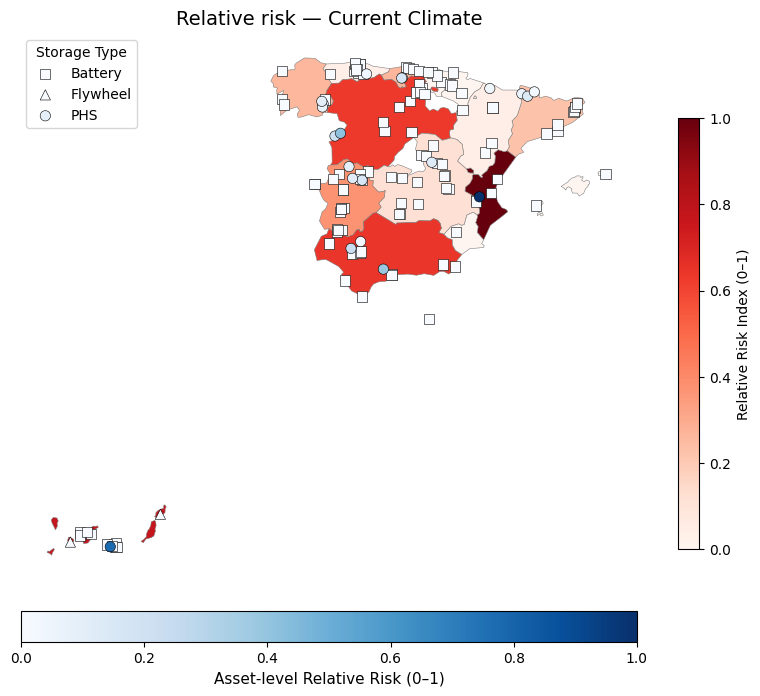

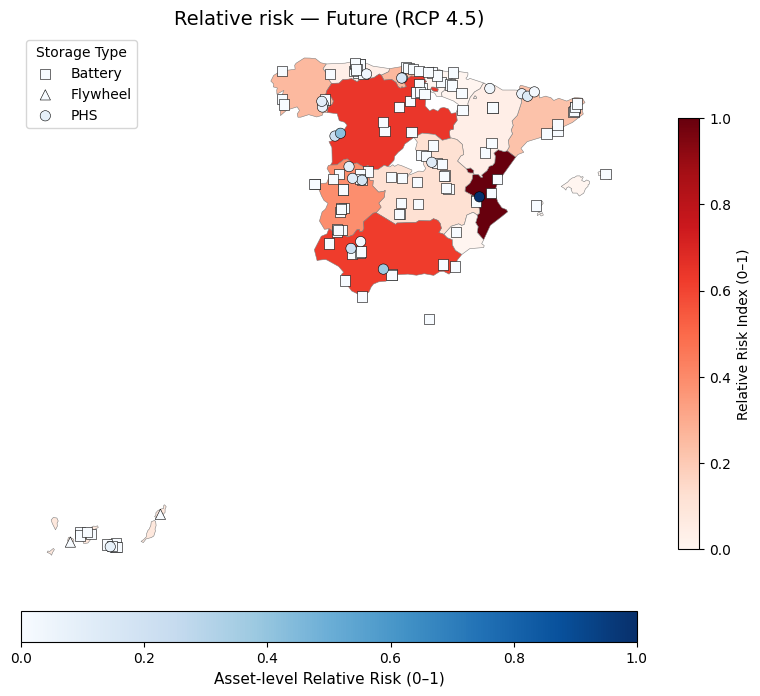

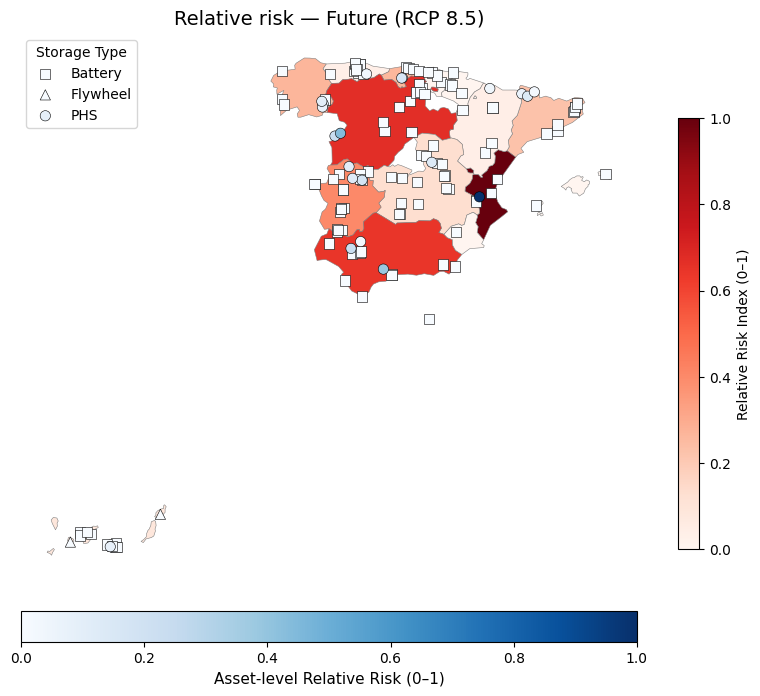

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability dry days"

HAZARDCURRENT_COL = "Dry days 1991-2020"
HAZARD45_COL     = "Dry days 2011-2040 RCP4.5"
HAZARD85_COL     = "Dry days 2011-2040 RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_43, ax_43 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_44, ax_44 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_45, ax_45 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_43, "Relative risk consecutive dry days — Current Climate.jpg")
save_figure(fig_44, "Relative risk consecutive dry days — Future (RCP4.5).jpg")
save_figure(fig_45, "Relative risk consecutive dry days — Future (RCP8.5).jpg")

Saved: Relative risk consecutive dry days — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk consecutive dry days — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk consecutive dry days — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

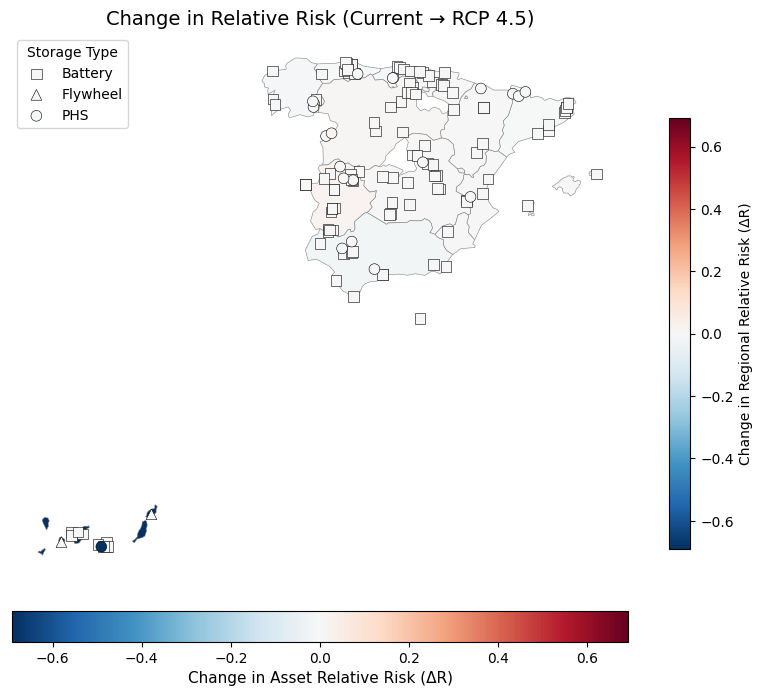

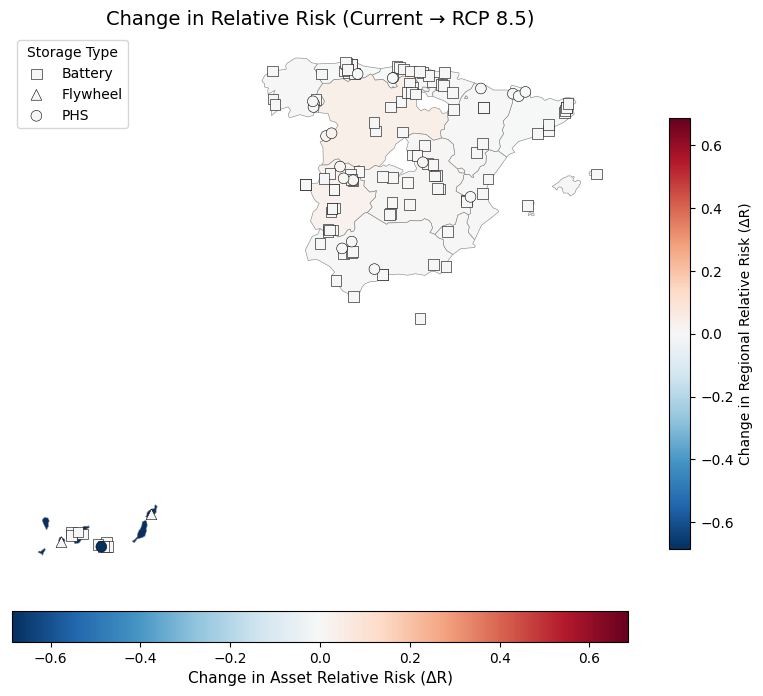

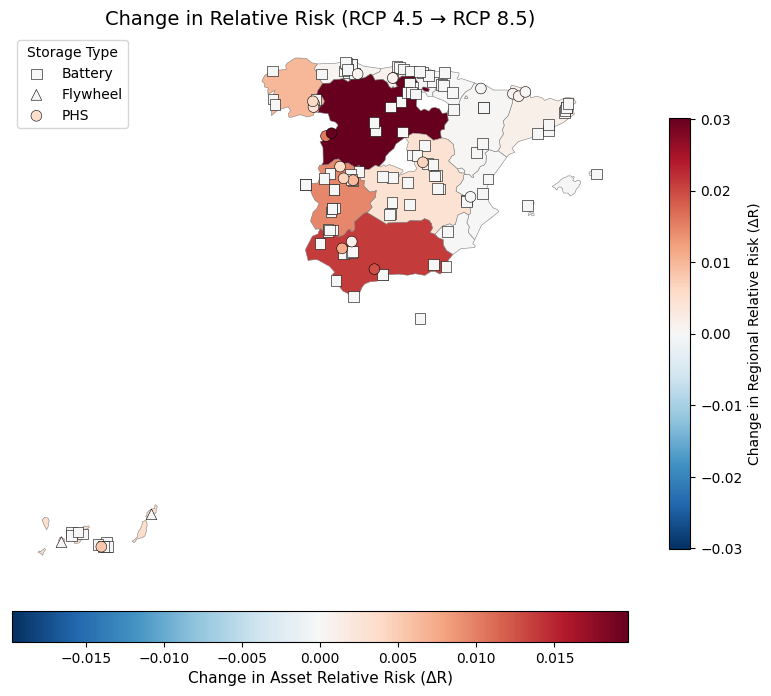

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax



# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_46, ax_46 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_47, ax_47 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_48, ax_48 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_46, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_47, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_48, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)
region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
    region_risk_table
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table

,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Comunitat Valenciana,3570030.720,3832159.500,3758690.880,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,Comunitat Valenciana,1.000000
1,Canarias,2753730.000,307020.000,321300.000,0.771346,0.080117,0.085482,-0.691230,-0.685864,0.005365,Canarias,0.771346
2,Andalucía,2288233.728,2392407.072,2425699.584,0.640956,0.624297,0.645358,-0.016659,0.004401,0.021060,Andalucía,0.386740
3,Castilla y León,2254565.400,2458917.900,2525053.800,0.631525,0.641653,0.671791,0.010128,0.040265,0.030137,Castilla y León,0.413028
4,Extremadura,1328034.000,1490922.720,1517357.520,0.371995,0.389055,0.403693,0.017060,0.031698,0.014638,Extremadura,0.159578
5,Cantabria,951966.600,999824.400,985409.400,0.266655,0.260904,0.262168,-0.005751,-0.004487,0.001265,Cantabria,0.166486
6,Galicia,946983.000,986127.600,1005106.800,0.265259,0.257329,0.267409,-0.007930,0.002150,0.010079,Galicia,0.104252
7,Cataluña,815822.400,868710.600,858775.800,0.228520,0.226690,0.228477,-0.001830,-0.000042,0.001788,Cataluña,0.136033
8,Castilla-La Mancha,430848.000,476678.400,484704.000,0.120685,0.124389,0.128956,0.003704,0.008271,0.004567,Castilla-La Mancha,0.120685
9,Aragón,146396.700,160468.200,158715.900,0.041007,0.041874,0.042226,0.000867,0.001219,0.000352,Aragón,0.041007


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Dry days 1991-2020,Dry days 1991-2020 hazard strength,Vulnerability dry days,Dry days change RCP4.5,Dry days change RCP8.5,Dry days 2011-2040 RCP4.5,Dry days 2011-2040 hazard strength RCP4.5,Dry days 2011-2040 RCP8.5,Dry days 2011-2040 hazard strength RCP8.5,Exposure,Hawchar_abs,Hawchar_rel,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,23.95,1,0,0.82,1.18,24.94,1,25.42,1,15.50,0.0,0.000000,0.000,0.000,0.000,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,23.95,1,0,0.82,1.18,24.94,1,25.42,1,20.00,0.0,0.000000,0.000,0.000,0.000,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,23.95,1,0,0.82,1.18,24.94,1,25.42,1,5.00,0.0,0.000000,0.000,0.000,0.000,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,23.95,1,2,0.82,1.18,24.94,1,25.42,1,2280.00,13680.0,0.150824,327636.000,341179.200,347745.600,0.091774,0.089031,0.092518
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.00,8.00,3,42.150000,-7.190000,23.95,1,2,0.82,1.18,24.94,1,25.42,1,1720.00,10320.0,0.113779,247164.000,257380.800,262334.400,0.069233,0.067163,0.069794
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,315.00,2590.00,8.00,3,42.334200,-7.215200,23.95,1,2,0.82,1.18,24.94,1,25.42,1,2590.00,15540.0,0.171330,372183.000,387567.600,395026.800,0.104252,0.101136,0.105097
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,23.95,1,0,0.82,1.18,24.94,1,25.42,1,11.00,0.0,0.000000,0.000,0.000,0.000,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,16.69,1,0,0.39,0.56,16.91,1,16.84,1,800.00,0.0,0.000000,0.000,0.000,0.000,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,16.69,1,0,0.39,0.56,16.91,1,16.84,1,46.00,0.0,0.000000,0.000,0.000,0.000,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,16.69,1,0,0.39,0.56,16.91,1,16.84,1,60.00,0.0,0.000000,0.000,0.000,0.000,0.000000,0.000000,0.000000


# Meteorological Drought Duration

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Drought.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Drought.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Drought months 1991-2020 for each region
drought_months_present_dict = {
    "Galicia": 1.9,
    "Principado de Asturias": 1.67,
    "Cantabria": 1.71,
    "País Vasco": 1.67,
    "Comunidad Foral de Navarra": 1.87,
    "La Rioja": 1.83,
    "Aragón": 2.1,
    "Cataluña": 2.0,
    "Comunitat Valenciana": 2.04,
    "Región de Murcia": 1.94,
    "Andalucía": 2.0,
    "Castilla-La Mancha": 2.06,
    "Castilla y León": 2.05,
    "Comunidad de Madrid": 2.11,
    "Extremadura": 2.14,
    "Canarias": 1.89,
    "Illes Balears": 5.9,
    "Ciudad de Ceuta": 2.09,
    "Ciudad de Melilla": 2.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 1991-2020"] = data["Region"].map(drought_months_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 2, 3, 6, float("inf")]
labels = [0, 1, 2, 3]

data['Drought months 1991-2020 hazard strength'] = pd.cut(
    data['Drought months 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_drought_months = {
    "Battery": 0,
    "PHS": 2,
    "Flywheel": 0
}

data["Vulnerability drought months"] = data["Storage type"].map(vulnerability_drought_months)

In [ ]:
#Change in number of drought months from 1991-2020 to 2011-2040 RCP4.5 for each region
drought_months_change45_dict = {
    "Galicia": 0.25,
    "Principado de Asturias": 0.15,
    "Cantabria": 0.22,
    "País Vasco": 0.22,
    "Comunidad Foral de Navarra": 0.15,
    "La Rioja": 0.24,
    "Aragón": 0.24,
    "Cataluña": 0.11,
    "Comunitat Valenciana": 0.47,
    "Región de Murcia": 0.49,
    "Andalucía": 0.52,
    "Castilla-La Mancha": 0.38,
    "Castilla y León": 0.33,
    "Comunidad de Madrid": 0.29,
    "Extremadura": 0.43,
    "Canarias": 0.03,
    "Illes Balears": 0.26,
    "Ciudad de Ceuta": 0.68,
    "Ciudad de Melilla": 0.76,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months change RCP4.5"] = data["Region"].map(drought_months_change45_dict)

In [ ]:
#Change in number of drought months above 35°C from 1991-2020 to 2011-2040 RCP8.5 for each region
drought_months_change85_dict = {
    "Galicia": 0.5,
    "Principado de Asturias": 0.29,
    "Cantabria": 0.29,
    "País Vasco": 0.21,
    "Comunidad Foral de Navarra": 0.34,
    "La Rioja": 0.58,
    "Aragón": 0.55,
    "Cataluña": 0.38,
    "Comunitat Valenciana": 0.66,
    "Región de Murcia": 0.77,
    "Andalucía": 0.76,
    "Castilla-La Mancha": 0.71,
    "Castilla y León": 0.68,
    "Comunidad de Madrid": 0.64,
    "Extremadura": 0.75,
    "Canarias": 0.08,
    "Illes Balears": 0.3,
    "Ciudad de Ceuta": 0.96,
    "Ciudad de Melilla": 0.85,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months change RCP8.5"] = data["Region"].map(drought_months_change85_dict)

In [ ]:
#Drought months 2011-2040 RCP4.5 for each region
drought_months_future45_dict = {
    "Galicia": 2.05,
    "Principado de Asturias": 2.02,
    "Cantabria": 2.09,
    "País Vasco": 2.1,
    "Comunidad Foral de Navarra": 2.02,
    "La Rioja": 2.19,
    "Aragón": 2.18,
    "Cataluña": 2.06,
    "Comunitat Valenciana": 2.43,
    "Región de Murcia": 2.51,
    "Andalucía": 2.46,
    "Castilla-La Mancha": 2.31,
    "Castilla y León": 2.22,
    "Comunidad de Madrid": 2.16,
    "Extremadura": 2.24,
    "Canarias": 0.21,
    "Illes Balears": 2.11,
    "Ciudad de Ceuta": 2.58,
    "Ciudad de Melilla": 2.84,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 2011-2040 RCP4.5"] = data["Region"].map(drought_months_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 2, 3, float("inf")]
labels = [0, 1, 2]

data["Drought months 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Drought months 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Drought months 2011-2040 RCP8.5 for each region
drought_months_future85_dict = {
    "Galicia": 2.32,
    "Principado de Asturias": 2.20,
    "Cantabria": 2.2,
    "País Vasco": 2.13,
    "Comunidad Foral de Navarra": 2.31,
    "La Rioja": 2.48,
    "Aragón": 2.48,
    "Cataluña": 2.31,
    "Comunitat Valenciana": 2.61,
    "Región de Murcia": 2.73,
    "Andalucía": 2.67,
    "Castilla-La Mancha": 2.65,
    "Castilla y León": 2.5,
    "Comunidad de Madrid": 2.55,
    "Extremadura": 2.63,
    "Canarias": 0.28,
    "Illes Balears": 2.1,
    "Ciudad de Ceuta": 2.73,
    "Ciudad de Melilla": 2.88,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 2011-2040 RCP8.5"] = data["Region"].map(drought_months_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 2, 3, float("inf")]
labels = [0, 1, 2]

data["Drought months 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Drought months 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Drought months 1991-2020 hazard strength',
    'Drought months 2011-2040 hazard strength RCP4.5',
    'Drought months 2011-2040 hazard strength RCP8.5',
    'Vulnerability drought months',
    'Drought months 1991-2020',
    'Drought months 2011-2040 RCP4.5',
    'Drought months 2011-2040 RCP8.5',
    'Drought months change RCP4.5',
    'Drought months change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')


Drought months (1991–2020)
Q1     : 1.88
Mean   : 2.16
Median : 2.00
Q3     : 2.08
IQR    : 0.20
Outliers (1):
Illes Balears    5.9
dtype: float64


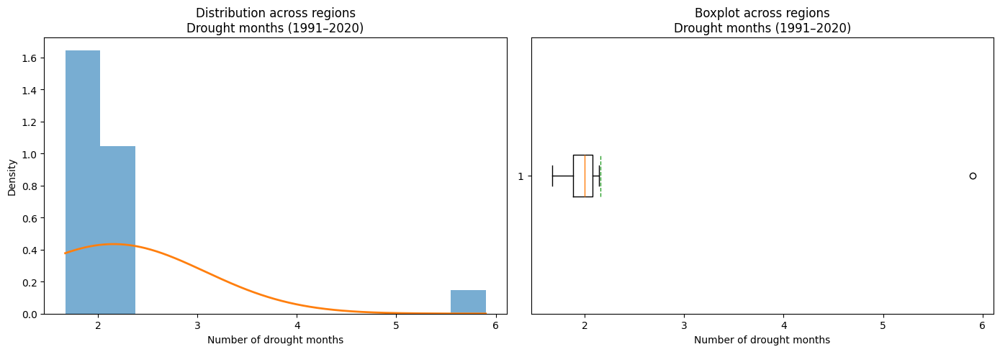


Drought months (2011–2040, RCP4.5)
Q1     : 2.08
Mean   : 2.15
Median : 2.18
Q3     : 2.37
IQR    : 0.29
Outliers (2):
Canarias             0.21
Ciudad de Melilla    2.84
dtype: float64


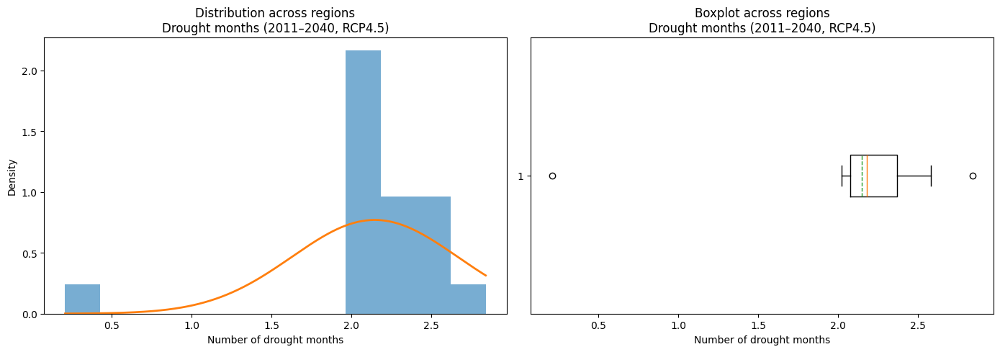


Drought months (2011–2040, RCP8.5)
Q1     : 2.25
Mean   : 2.36
Median : 2.48
Q3     : 2.64
IQR    : 0.38
Outliers (1):
Canarias    0.28
dtype: float64


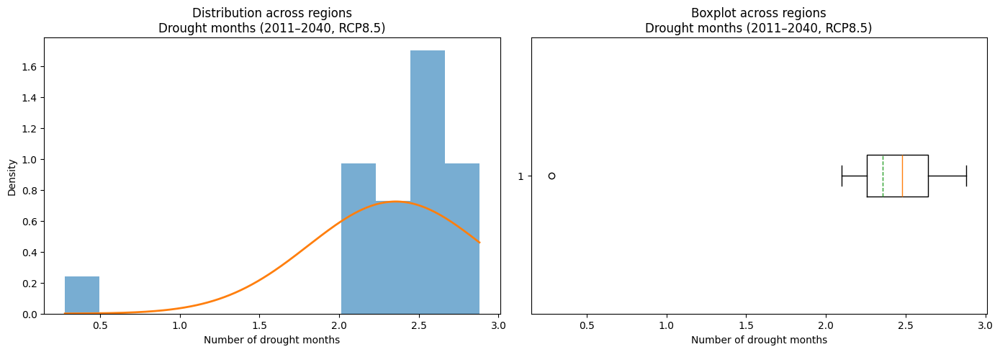

In [ ]:
from scipy.stats import norm

# =========================================================
# HAZARD DICTIONARIES (one value per region)
# =========================================================
hazard_data = {
    "Present (1991–2020)": drought_months_present_dict,
    "RCP 4.5 (2011–2040)": drought_months_future45_dict,
    "RCP 8.5 (2011–2040)": drought_months_future85_dict,
}

def hazard_distribution_from_dict(hazard_dict, label):

    values = pd.Series(hazard_dict).astype(float)

    # ------------------------
    # Summary statistics
    # ------------------------
    Q1 = values.quantile(0.25)
    median = values.median()
    mean = values.mean()
    Q3 = values.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = values[(values < lower) | (values > upper)]

    print("\n" + "=" * 50)
    print(f"{label}")
    print(f"Q1     : {Q1:.2f}")
    print(f"Mean   : {mean:.2f}")
    print(f"Median : {median:.2f}")
    print(f"Q3     : {Q3:.2f}")
    print(f"IQR    : {IQR:.2f}")
    print(f"Outliers ({len(outliers)}):")
    print(outliers)

    # ------------------------
    # Plots
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    x = np.linspace(values.min(), values.max(), 300)
    axes[0].hist(values, bins=12, density=True, alpha=0.6)
    axes[0].plot(
        x,
        norm.pdf(x, mean, values.std()),
        linewidth=2
    )
    axes[0].set_title(f"Distribution across regions\n{label}")
    axes[0].set_xlabel("Number of drought months")
    axes[0].set_ylabel("Density")

    axes[1].boxplot(
        values,
        vert=False,
        showmeans=True,
        meanline=True
    )
    axes[1].set_title(f"Boxplot across regions\n{label}")
    axes[1].set_xlabel("Number of drought months")

    plt.tight_layout()
    plt.show()

    return fig

fig116 = hazard_distribution_from_dict(
    drought_months_present_dict,
    "Drought months (1991–2020)"
)

fig117 = hazard_distribution_from_dict(
    drought_months_future45_dict,
    "Drought months (2011–2040, RCP4.5)"
)

fig118 = hazard_distribution_from_dict(
    drought_months_future85_dict,
    "Drought months (2011–2040, RCP8.5)"
)


In [ ]:
save_figure(fig116, "Drought_months_Present_distribution.jpg")

save_figure(fig117, "Drought_months_RCP45_distribution.jpg")

save_figure(fig118, "Drought_months_RCP85_distribution.jpg")

Mapping the data

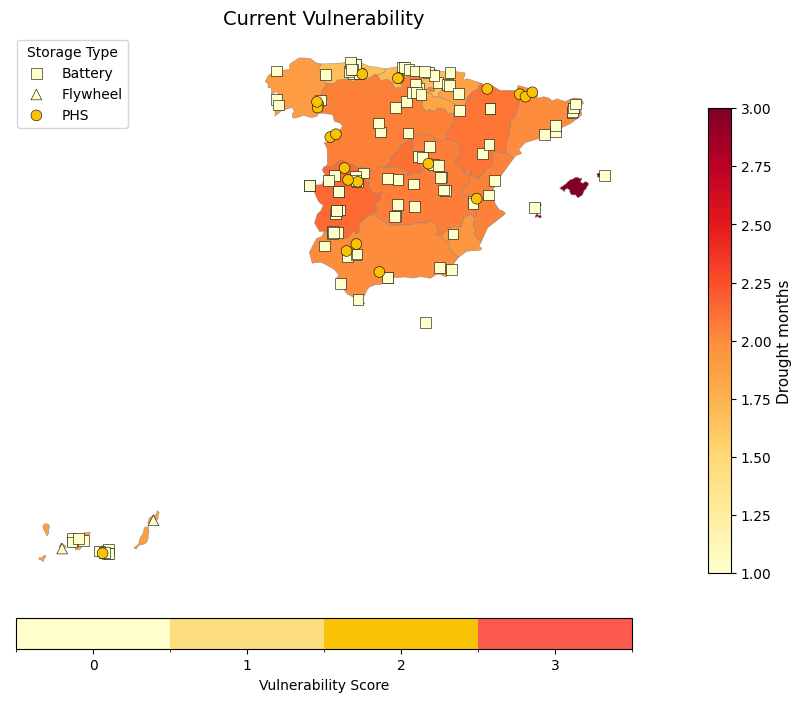

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability drought months"
HAZARDCURRENT_COL = "Drought months 1991-2020 hazard strength"
DROUGHTMONTHSCURRENT_COL = "Drought months 1991-2020"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# Create region background from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[DROUGHTMONTHSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    drought_months_present_dict
)


# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=1, vmax=3)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Drought months", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_49, ax_49 = plot_current_optionA(
    bg_col=DROUGHTMONTHSCURRENT_COL,
    title="Current Vulnerability"
)



In [ ]:
save_figure(fig_49, "Current Vulnerability drought months.jpg")

Saved: Current Vulnerability drought months.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

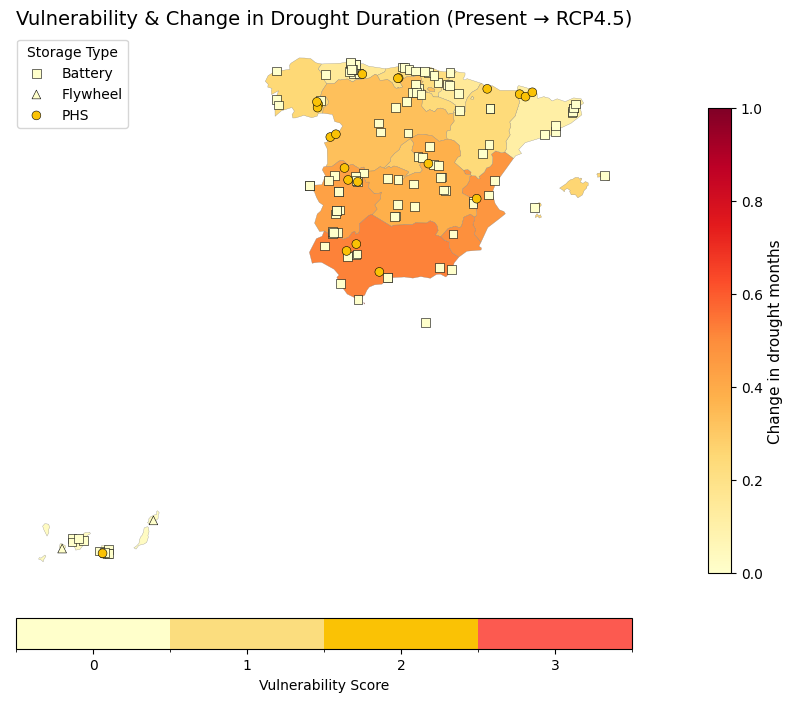

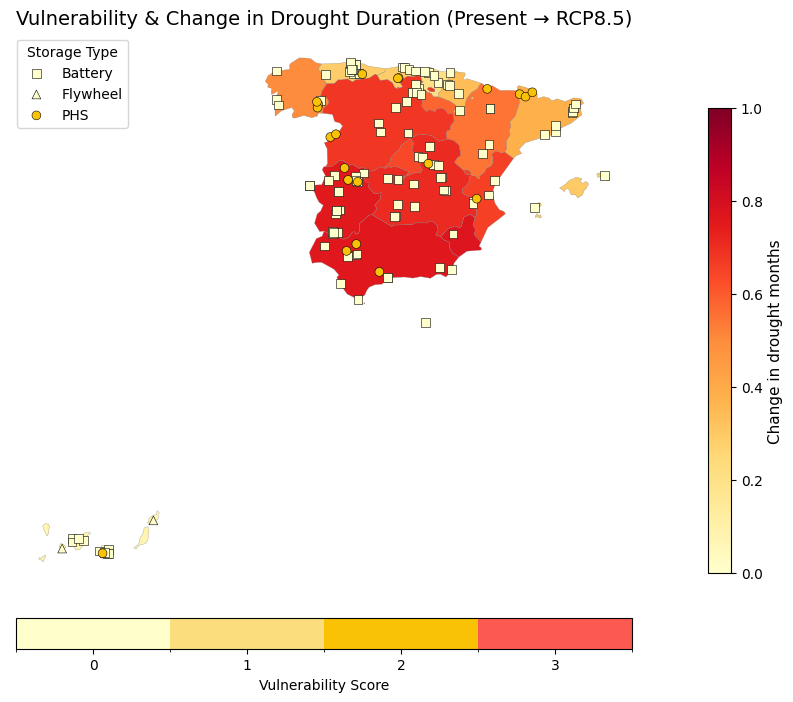

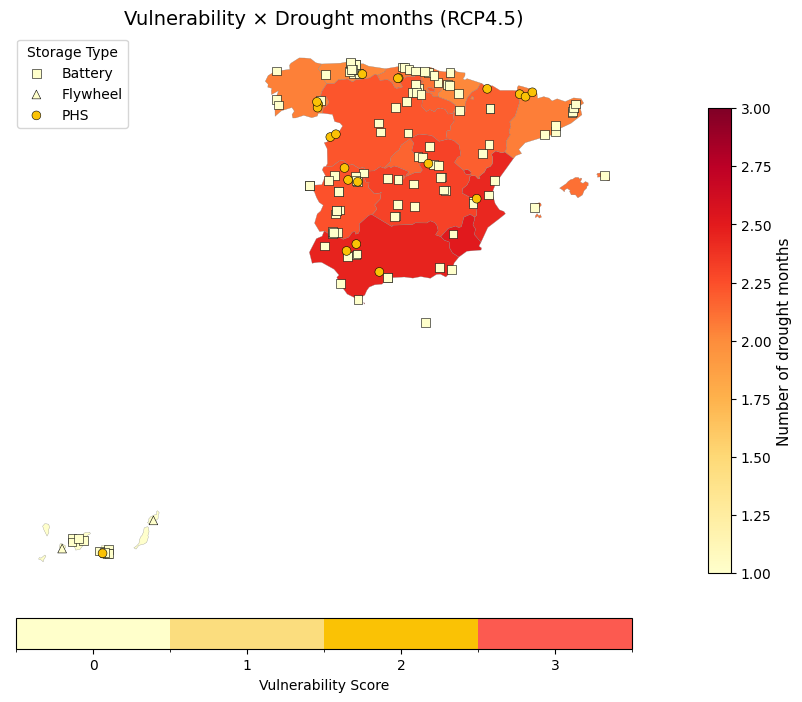

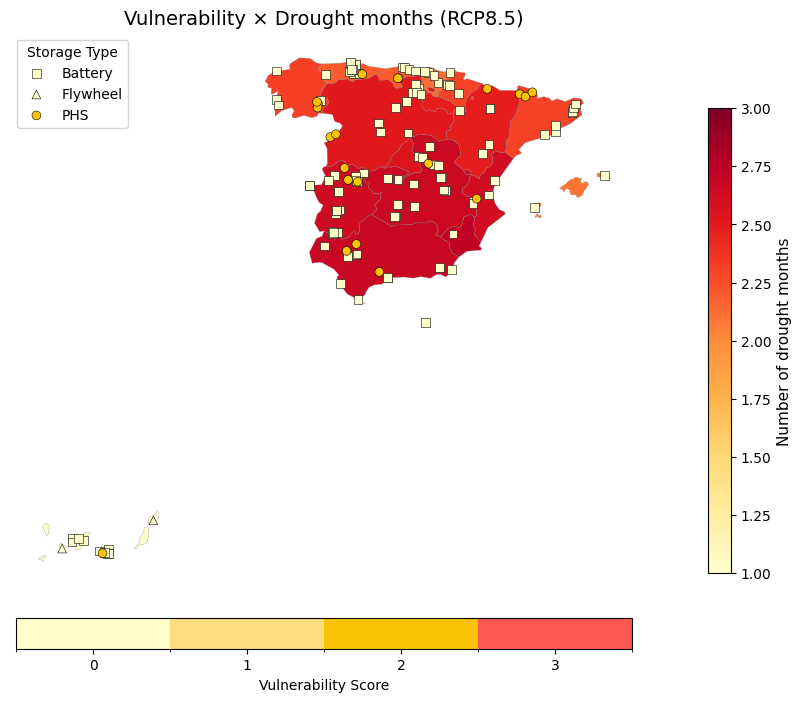

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS (HOT DAYS >35C)
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability drought months"

DROUGHTMONTHS_CHANGE45 = "Drought months change RCP4.5"
DROUGHTMONTHS_CHANGE85 = "Drought months change RCP8.5"
HAZARDCURRENT_COL = "Drought months 1991-2020 hazard strength"
DROUGHTMONTHS45 = "Drought months 2011-2040 hazard strength RCP4.5"
DROUGHTMONTHS85 = "Drought months 2011-2040 hazard strength RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[DROUGHTMONTHS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    drought_months_change45_dict
)
regions_bg[DROUGHTMONTHS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    drought_months_change85_dict
)
regions_bg[DROUGHTMONTHS45] = regions_bg["NUTS_NAME"].map(
    drought_months_future45_dict
)
regions_bg[DROUGHTMONTHS85] = regions_bg["NUTS_NAME"].map(
    drought_months_future85_dict
)

# =========================================================
# Discrete vulnerability colormap (unchanged)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.Normalize(vmin=0, vmax=1)
      bg_label = "Change in drought months"
    else:
      norm_bg = mcolors.Normalize(vmin=1,vmax=3)
      bg_label = "Number of drought months"

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
    )

    return fig, ax


# =========================================================
# 6. GENERATE MAPS
# =========================================================

fig_51, ax_51 = plot_step5_optionA(
    DROUGHTMONTHS_CHANGE45,
    "Vulnerability & Change in Drought Duration (Present → RCP4.5)"
)

fig_52, ax_52 = plot_step5_optionA(
    DROUGHTMONTHS_CHANGE85,
    "Vulnerability & Change in Drought Duration (Present → RCP8.5)"
)

fig_53, ax_53 = plot_step5_optionA(
    DROUGHTMONTHS45,
    "Vulnerability × Drought months (RCP4.5)"
)

fig_54, ax_54 = plot_step5_optionA(
    DROUGHTMONTHS85,
    "Vulnerability × Drought months (RCP8.5)"
)


In [ ]:
save_figure(fig_51, "Vulnerability & Change in drought months (Present → RCP4.5).jpg")
save_figure(fig_52, "Vulnerability & Change in drought months (Present → RCP8.5).jpg")
save_figure(fig_53, "Vulnerability × drought months (RCP4.5).jpg")
save_figure(fig_54, "Vulnerability × drought months (RCP8.5).jpg")

Saved: Vulnerability & Change in drought months (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in drought months (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability × drought months (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability × drought months (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

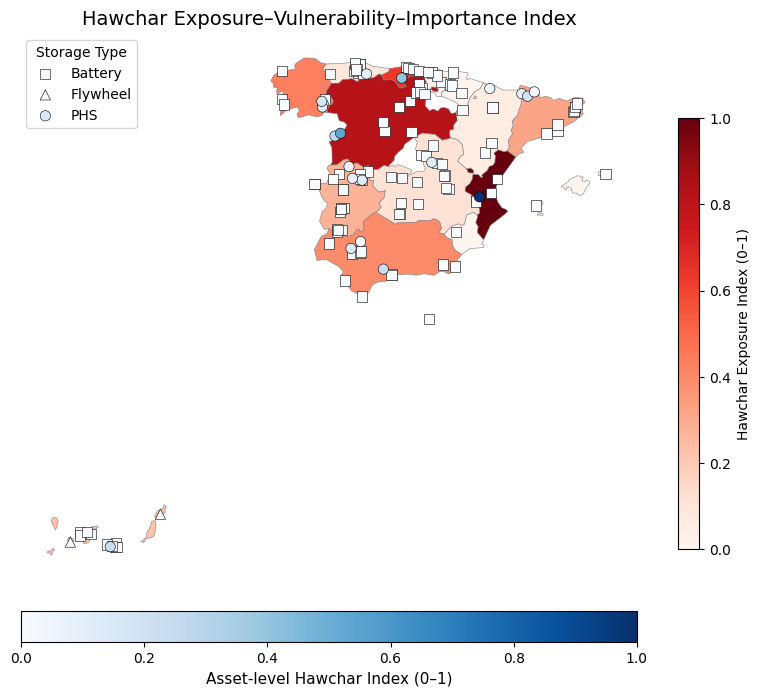

In [ ]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability drought months"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])

def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )
    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_50, ax_50 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)

In [ ]:
save_figure(fig_50, "Hawchar Index drought months.jpg")

Saved: Hawchar Index drought months.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table

,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Comunitat Valenciana,90702.0,1.000000,16070.10,5,1.000000
1,Castilla y León,74310.0,0.535821,14143.90,12,0.819276
2,Cantabria,57660.0,0.396904,10077.90,6,0.635708
3,Galicia,39540.0,0.171330,6641.50,7,0.435933
4,Andalucía,35798.4,0.238142,7575.29,13,0.394681
5,Cataluña,29220.0,0.191771,6671.70,11,0.322154
6,Extremadura,25176.0,0.119071,7760.26,22,0.277568
7,Canarias,21000.0,0.231527,3734.09,12,0.231527
8,Castilla-La Mancha,10560.0,0.116425,3769.26,17,0.116425
9,Principado de Asturias,7980.0,0.087980,3593.91,12,0.087980


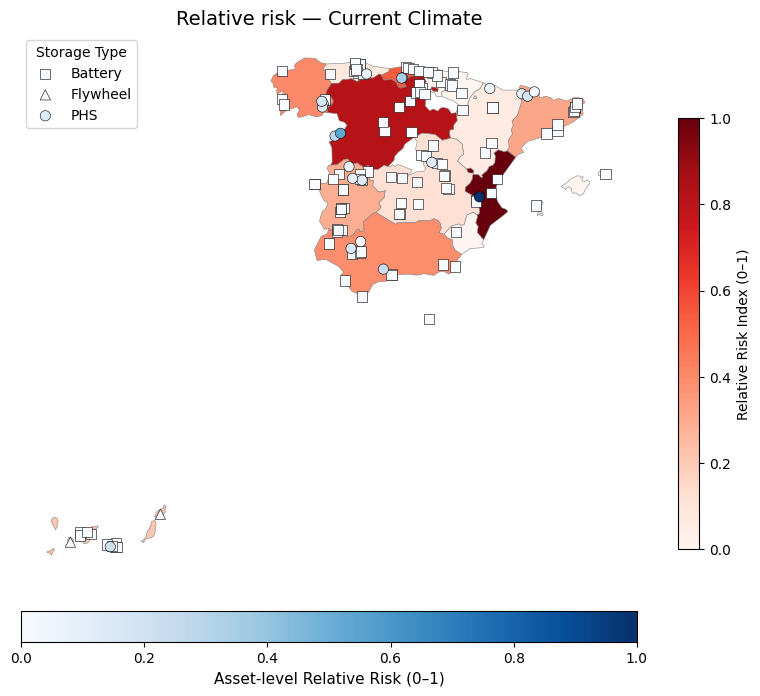

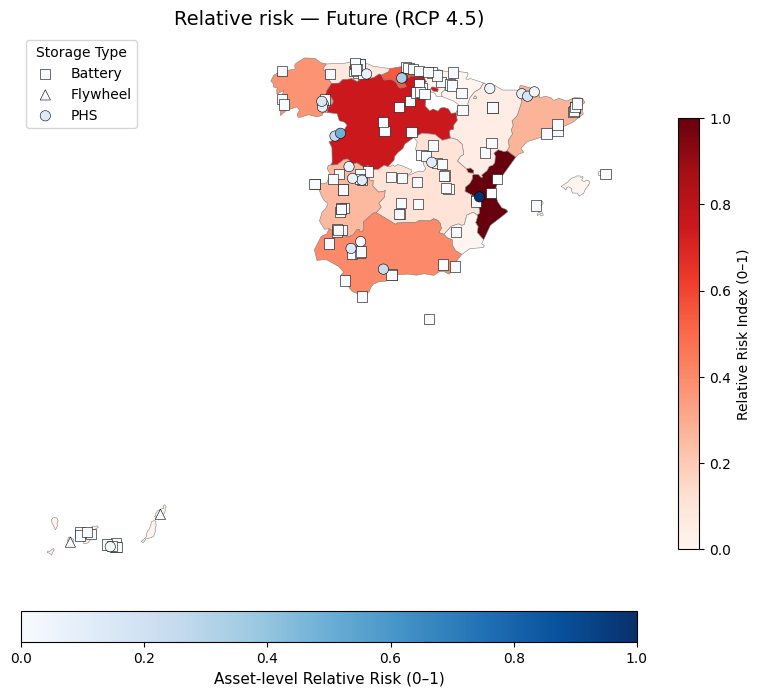

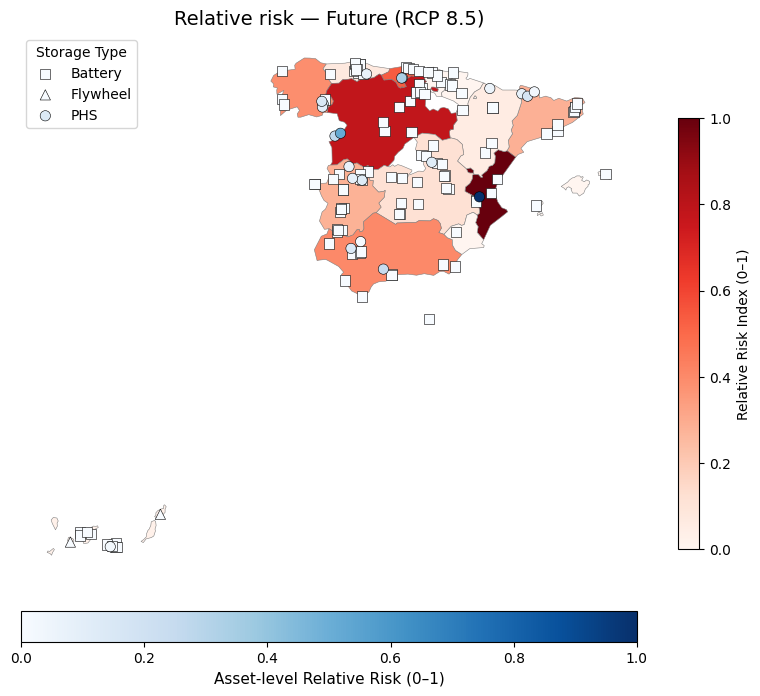

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability drought months"

HAZARDCURRENT_COL = "Drought months 1991-2020"
HAZARD45_COL     = "Drought months 2011-2040 RCP4.5"
HAZARD85_COL     = "Drought months 2011-2040 RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_55, ax_55 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_56, ax_56 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_57, ax_57 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_55, "Relative risk drought months — Current Climate.jpg")
save_figure(fig_56, "Relative risk drought months — Future (RCP4.5).jpg")
save_figure(fig_57, "Relative risk drought months — Future (RCP8.5).jpg")

Saved: Relative risk drought months — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk drought months — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk drought months — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

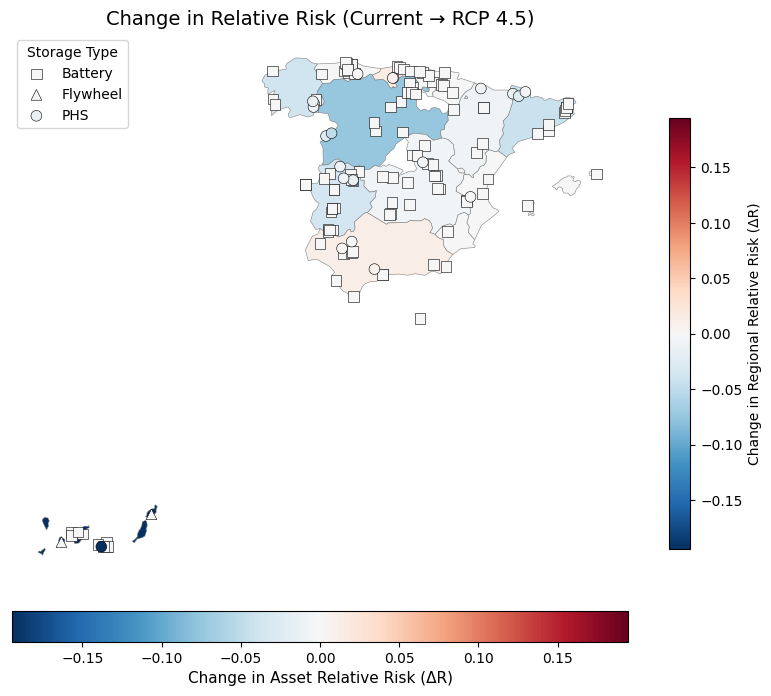

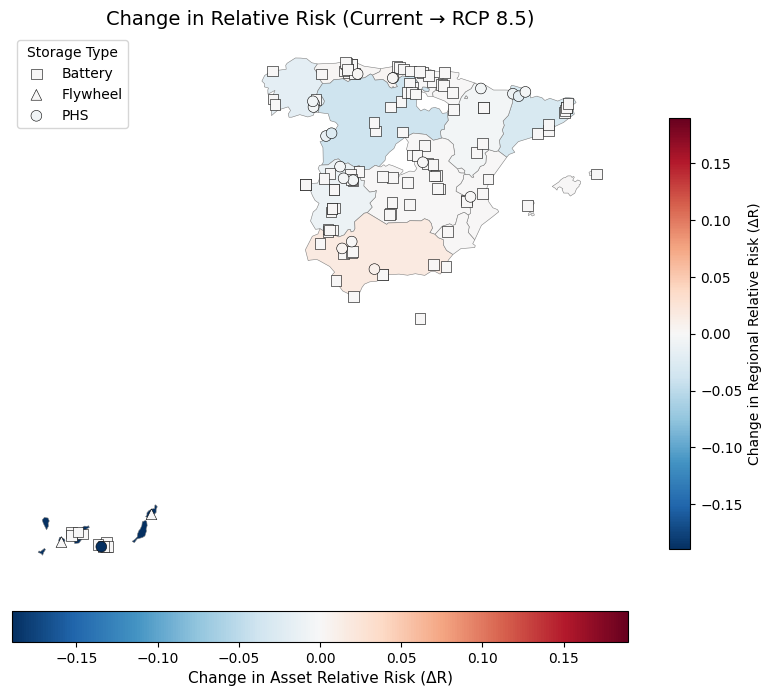

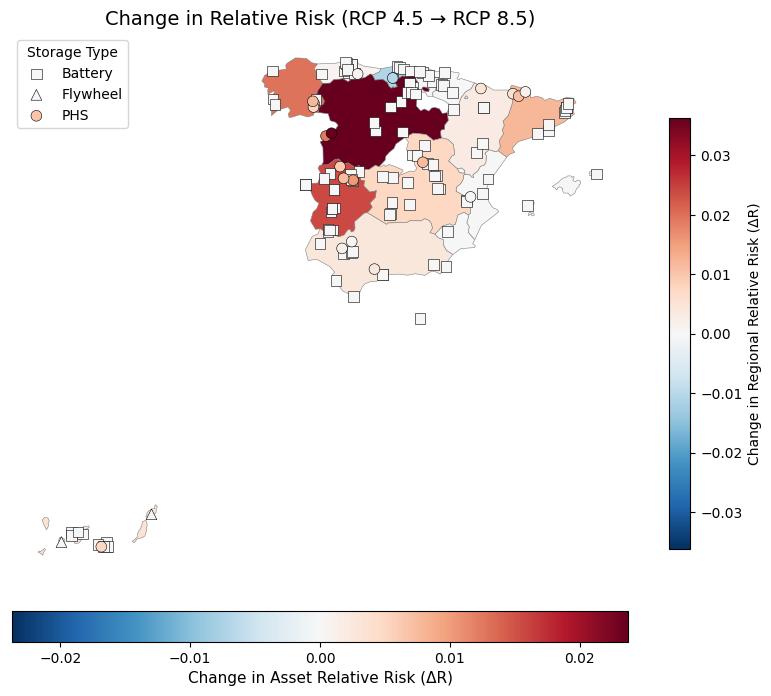

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_58, ax_58 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_59, ax_59 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_60, ax_60 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_58, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_59, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_60, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)
region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
    region_risk_table
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Comunitat Valenciana,185032.08,220405.860,236732.220,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,Comunitat Valenciana,1.000000
1,Castilla y León,152335.50,164968.200,185775.000,0.823292,0.748475,0.784747,-0.074818,-0.038545,0.036273,Castilla y León,0.538447
2,Cantabria,98598.60,120509.400,126852.000,0.532873,0.546761,0.535846,0.013888,0.002973,-0.010915,Cantabria,0.332699
3,Galicia,75126.00,81057.000,91732.800,0.406016,0.367762,0.387496,-0.038254,-0.018520,0.019734,Galicia,0.159572
4,Andalucía,71596.80,88064.064,95581.728,0.386943,0.399554,0.403755,0.012611,0.016812,0.004201,Andalucía,0.233473
5,Cataluña,58440.00,60193.200,67498.200,0.315837,0.273102,0.285125,-0.042735,-0.030712,0.012023,Cataluña,0.188011
6,Extremadura,53876.64,56394.240,66212.880,0.291175,0.255865,0.279695,-0.035309,-0.011479,0.023830,Extremadura,0.124908
7,Canarias,39690.00,4410.000,5880.000,0.214503,0.020009,0.024838,-0.194495,-0.189665,0.004830,Canarias,0.214503
8,Castilla-La Mancha,21753.60,24393.600,27984.000,0.117567,0.110676,0.118210,-0.006891,0.000643,0.007534,Castilla-La Mancha,0.117567
9,Principado de Asturias,13326.60,16119.600,17556.000,0.072023,0.073136,0.074160,0.001113,0.002137,0.001024,Principado de Asturias,0.072023


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Drought months 1991-2020,Drought months 1991-2020 hazard strength,Vulnerability drought months,Drought months change RCP4.5,Drought months change RCP8.5,Drought months 2011-2040 RCP4.5,Drought months 2011-2040 hazard strength RCP4.5,Drought months 2011-2040 RCP8.5,Drought months 2011-2040 hazard strength RCP8.5,Exposure,Hawchar_abs,Hawchar_rel,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,1.90,0,0,0.25,0.50,2.05,1,2.32,1,15.50,0.0,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,1.90,0,0,0.25,0.50,2.05,1,2.32,1,20.00,0.0,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,1.90,0,0,0.25,0.50,2.05,1,2.32,1,5.00,0.0,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,1.90,0,2,0.25,0.50,2.05,1,2.32,1,2280.00,13680.0,0.150824,25992.00,28044.000,31737.600,0.140473,0.127238,0.134065
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.00,8.00,3,42.150000,-7.190000,1.90,0,2,0.25,0.50,2.05,1,2.32,1,1720.00,10320.0,0.113779,19608.00,21156.000,23942.400,0.105971,0.095987,0.101137
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,315.00,2590.00,8.00,3,42.334200,-7.215200,1.90,0,2,0.25,0.50,2.05,1,2.32,1,2590.00,15540.0,0.171330,29526.00,31857.000,36052.800,0.159572,0.144538,0.152294
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,1.90,0,0,0.25,0.50,2.05,1,2.32,1,11.00,0.0,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,1.67,0,0,0.15,0.29,2.02,1,2.20,1,800.00,0.0,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,1.67,0,0,0.15,0.29,2.02,1,2.20,1,46.00,0.0,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,1.67,0,0,0.15,0.29,2.02,1,2.20,1,60.00,0.0,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.000000


# Extreme Precipitation Days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Extreme precipitation.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Extreme precipitation.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Extreme precipitation days above 1991-2020 for each region
extprecip_days_present_dict = {
    "Galicia": 7.42,
    "Principado de Asturias": 8.84,
    "Cantabria": 8.56,
    "País Vasco": 8.15,
    "Comunidad Foral de Navarra": 6.7,
    "La Rioja": 6.45,
    "Aragón": 5.02,
    "Cataluña": 5.2,
    "Comunitat Valenciana": 3.71,
    "Región de Murcia": 2.97,
    "Andalucía": 3.6,
    "Castilla-La Mancha": 4.22,
    "Castilla y León": 5.69,
    "Comunidad de Madrid": 4.54,
    "Extremadura": 3.98,
    "Canarias": 1.85,
    "Illes Balears": 3.47,
    "Ciudad de Melilla": 3.91,
    "Ciudad de Melilla": 2.87,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 1991-2020"] = data["Region"].map(extprecip_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [0, 1, 5, 10, float("inf")]
labels = [0, 1, 2, 3]

data['Extreme precipitation days 1991-2020 hazard strength'] = pd.cut(
    data['Extreme precipitation days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_extprecip_days = {
    "Battery": 1,
    "PHS": 1,
    "Flywheel": 0
}

data["Vulnerability extreme precipitation"] = data["Storage type"].map(vulnerability_extprecip_days)

In [ ]:
#Change in number of extreme precipitation days from 1991-2020 to 2011-2040 RCP4.5 for each region
extprecip_days_change45_dict = {
    "Galicia": 0.12,
    "Principado de Asturias": 0.3,
    "Cantabria": 0.33,
    "País Vasco": 0.29,
    "Comunidad Foral de Navarra": 0.35,
    "La Rioja": 0.06,
    "Aragón": -0.2,
    "Cataluña": 0.09,
    "Comunitat Valenciana": -0.19,
    "Región de Murcia": 0.0,
    "Andalucía": -0.1,
    "Castilla-La Mancha": -0.03,
    "Castilla y León": 0.16,
    "Comunidad de Madrid": 0.25,
    "Extremadura": 0.01,
    "Canarias": 0.0,
    "Illes Balears": 0.1,
    "Ciudad de Ceuta": -0.19,
    "Ciudad de Melilla": -0.22,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days change RCP4.5"] = data["Region"].map(extprecip_days_change45_dict)

In [ ]:
#Change in number of extreme precipitation days from 1991-2020 to 2011-2040 RCP8.5 for each region
extprecip_days_change85_dict = {
    "Galicia": -0.02,
    "Principado de Asturias": -0.17,
    "Cantabria": -0.04,
    "País Vasco": -0.11,
    "Comunidad Foral de Navarra": -0.18,
    "La Rioja": -0.43,
    "Aragón": -0.08,
    "Cataluña": 0.0,
    "Comunitat Valenciana": -0.21,
    "Región de Murcia": -0.12,
    "Andalucía": -0.23,
    "Castilla-La Mancha": -0.07,
    "Castilla y León": -0.16,
    "Comunidad de Madrid": -0.03,
    "Extremadura": -0.23,
    "Canarias": -0.01,
    "Illes Balears": -0.13,
    "Ciudad de Ceuta": -0.6,
    "Ciudad de Melilla": -0.4,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days change RCP8.5"] = data["Region"].map(extprecip_days_change85_dict)

In [ ]:
#Extreme precipitation days 2011-2040 RCP4.5 for each region
extprecip_days_future45_dict = {
    "Galicia": 7.44,
    "Principado de Asturias": 8.99,
    "Cantabria": 8.73,
    "País Vasco": 8.33,
    "Comunidad Foral de Navarra": 6.97,
    "La Rioja": 6.42,
    "Aragón": 4.97,
    "Cataluña": 5.28,
    "Comunitat Valenciana": 3.56,
    "Región de Murcia": 2.97,
    "Andalucía": 3.53,
    "Castilla-La Mancha": 4.21,
    "Castilla y León": 5.79,
    "Comunidad de Madrid": 4.77,
    "Extremadura": 4.0,
    "Canarias": 0.11,
    "Illes Balears": 3.35,
    "Ciudad de Ceuta": 3.79,
    "Ciudad de Melilla": 2.7,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 2011-2040 RCP4.5"] = data["Region"].map(extprecip_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [0, 1, 5, 10, float("inf")]
labels = [0, 1, 2, 3]

data["Extreme precipitation days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Extreme precipitation days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Extreme precipitation days 2011-2040 RCP8.5 for each region
extprecip_days_future85_dict = {
    "Galicia": 7.31,
    "Principado de Asturias": 8.54,
    "Cantabria": 8.37,
    "País Vasco": 7.93,
    "Comunidad Foral de Navarra": 4.93,
    "La Rioja": 5.94,
    "Aragón": 4.93,
    "Cataluña": 5.22,
    "Comunitat Valenciana": 3.55,
    "Región de Murcia": 2.87,
    "Andalucía": 3.4,
    "Castilla-La Mancha": 4.17,
    "Castilla y León": 5.48,
    "Comunidad de Madrid": 4.5,
    "Extremadura": 3.76,
    "Canarias": 0.1,
    "Illes Balears": 3.33,
    "Ciudad de Ceuta": 3.37,
    "Ciudad de Melilla": 2.5,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 2011-2040 RCP8.5"] = data["Region"].map(extprecip_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [0, 1, 5, 10, float("inf")]
labels = [0, 1, 2, 3]

data["Extreme precipitation days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Extreme precipitation days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Extreme precipitation days 1991-2020 hazard strength',
    'Extreme precipitation days 2011-2040 hazard strength RCP4.5',
    'Extreme precipitation days 2011-2040 hazard strength RCP8.5',
    'Vulnerability extreme precipitation',
    'Extreme precipitation days 1991-2020',
    'Extreme precipitation days 2011-2040 RCP4.5',
    'Extreme precipitation days 2011-2040 RCP8.5',
    'Extreme precipitation days change RCP4.5',
    'Extreme precipitation days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')


Extreme precipitation days (1991–2020)
Q1     : 3.63
Mean   : 5.18
Median : 4.78
Q3     : 6.64
IQR    : 3.01
Outliers (0):
Series([], dtype: float64)


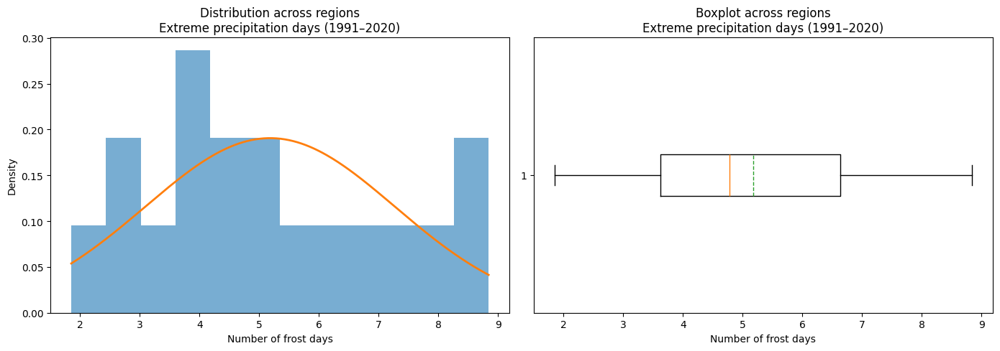


Extreme precipitation days(2011–2040, RCP4.5)
Q1     : 3.54
Mean   : 5.05
Median : 4.77
Q3     : 6.70
IQR    : 3.15
Outliers (0):
Series([], dtype: float64)


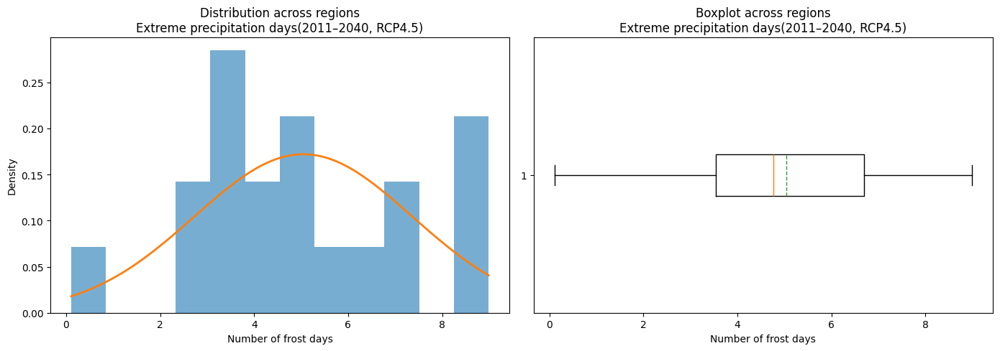


Extreme precipitation days (2011–2040, RCP8.5)
Q1     : 3.38
Mean   : 4.75
Median : 4.50
Q3     : 5.71
IQR    : 2.33
Outliers (0):
Series([], dtype: float64)


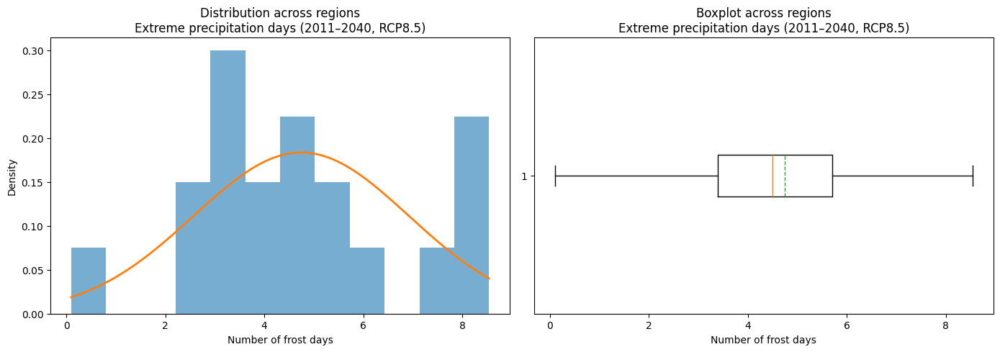

In [ ]:
from scipy.stats import norm

# =========================================================
# HAZARD DICTIONARIES
# =========================================================
hazard_data = {
    "Present (1991–2020)": extprecip_days_present_dict,
    "RCP 4.5 (2011–2040)": extprecip_days_future45_dict,
    "RCP 8.5 (2011–2040)": extprecip_days_future85_dict,
}

# =========================================================
# FUNCTION: distribution + boxplot + stats
# =========================================================
def hazard_distribution_from_dict(hazard_dict, label):

    # Convert dict → Series (one value per region)
    values = pd.Series(hazard_dict).astype(float)

    # ------------------------
    # Summary statistics
    # ------------------------
    Q1 = values.quantile(0.25)
    median = values.median()
    mean = values.mean()
    Q3 = values.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = values[(values < lower) | (values > upper)]

    print("\n" + "=" * 50)
    print(f"{label}")
    print(f"Q1     : {Q1:.2f}")
    print(f"Mean   : {mean:.2f}")
    print(f"Median : {median:.2f}")
    print(f"Q3     : {Q3:.2f}")
    print(f"IQR    : {IQR:.2f}")
    print(f"Outliers ({len(outliers)}):")
    print(outliers)

    # ------------------------
    # Plots
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram + normal distribution
    x = np.linspace(values.min(), values.max(), 300)
    axes[0].hist(values, bins=12, density=True, alpha=0.6)
    axes[0].plot(
        x,
        norm.pdf(x, mean, values.std()),
        linewidth=2
    )
    axes[0].set_title(f"Distribution across regions\n{label}")
    axes[0].set_xlabel("Number of frost days")
    axes[0].set_ylabel("Density")

    # Boxplot
    axes[1].boxplot(
        values,
        vert=False,
        showmeans=True,
        meanline=True
    )
    axes[1].set_title(f"Boxplot across regions\n{label}")
    axes[1].set_xlabel("Number of frost days")

    plt.tight_layout()
    plt.show()

    return fig

fig122 = hazard_distribution_from_dict(
    extprecip_days_present_dict,
    "Extreme precipitation days (1991–2020)"
)


fig123 = hazard_distribution_from_dict(
    extprecip_days_future45_dict,
    "Extreme precipitation days(2011–2040, RCP4.5)"
)


fig124 = hazard_distribution_from_dict(
    extprecip_days_future85_dict,
    "Extreme precipitation days (2011–2040, RCP8.5)"
)


In [ ]:
save_figure(fig122, "Extreme_precipitation_days_Present_distribution.jpg")

save_figure(fig123, "Extreme_precipitation_days_RCP45_distribution.jpg")

save_figure(fig124, "Extreme_precipitation_days_RCP85_distribution.jpg")

Mapping the data

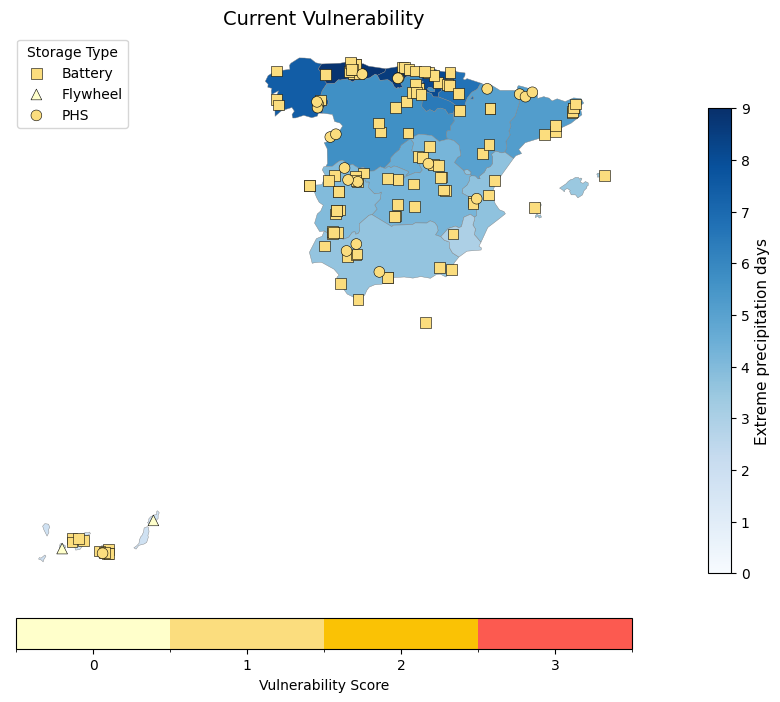

In [ ]:
#CURRENT VULNERABILITY

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability extreme precipitation"
HAZARDCURRENT_COL = "Extreme precipitation days 1991-2020 hazard strength"
EXTPRECIPCURRENT_COL = "Extreme precipitation days 1991-2020"

# -------------------------------
# Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[EXTPRECIPCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    extprecip_days_present_dict
)


# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=0, vmax=9)
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Extreme precipitation days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_61, ax_61 = plot_current_optionA(
    bg_col=EXTPRECIPCURRENT_COL,
    title="Current Vulnerability"
)


In [ ]:
save_figure(fig_61, "Current Vulnerability extreme precipitation.jpg")

Saved: Current Vulnerability extreme precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

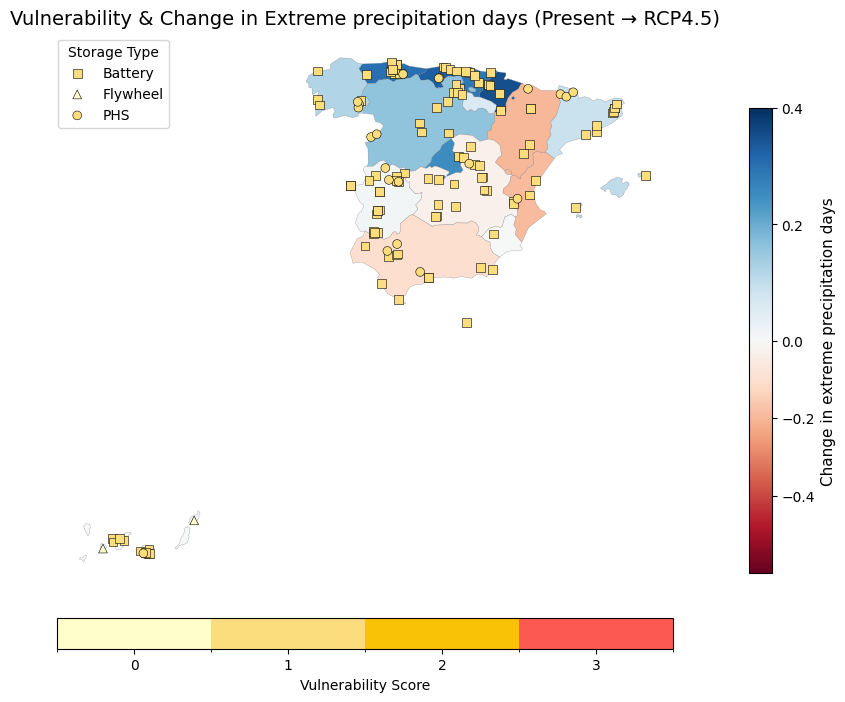

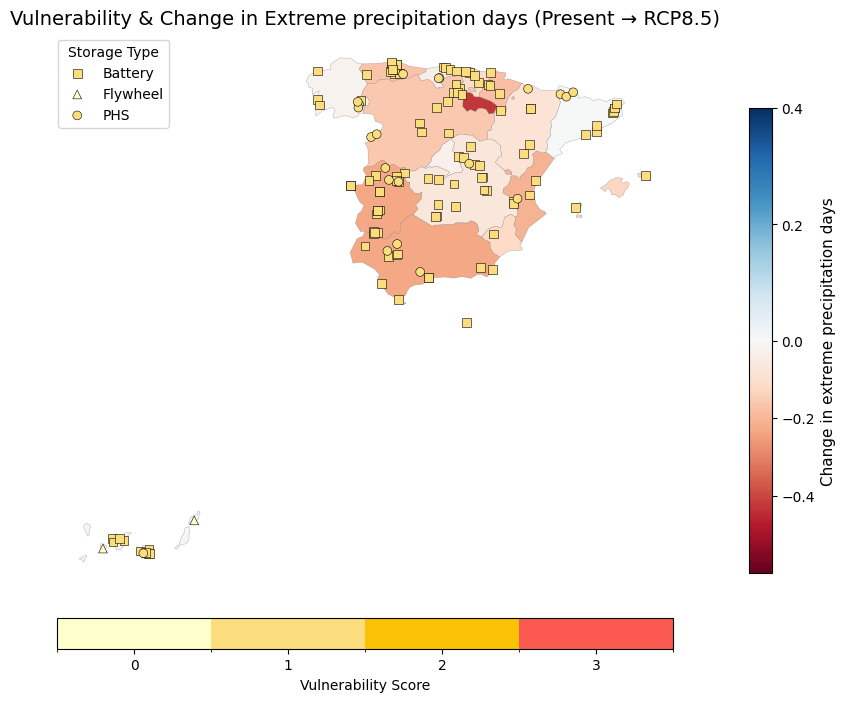

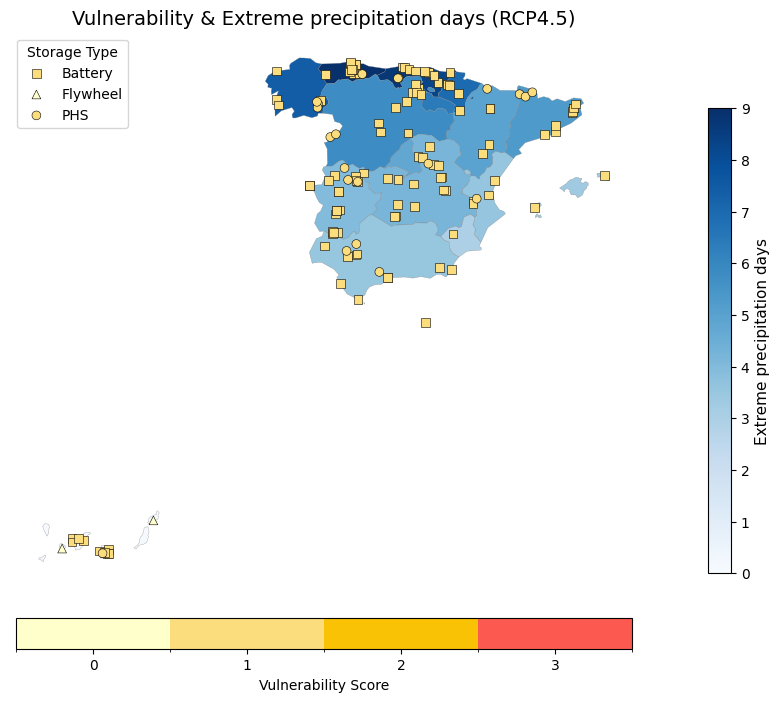

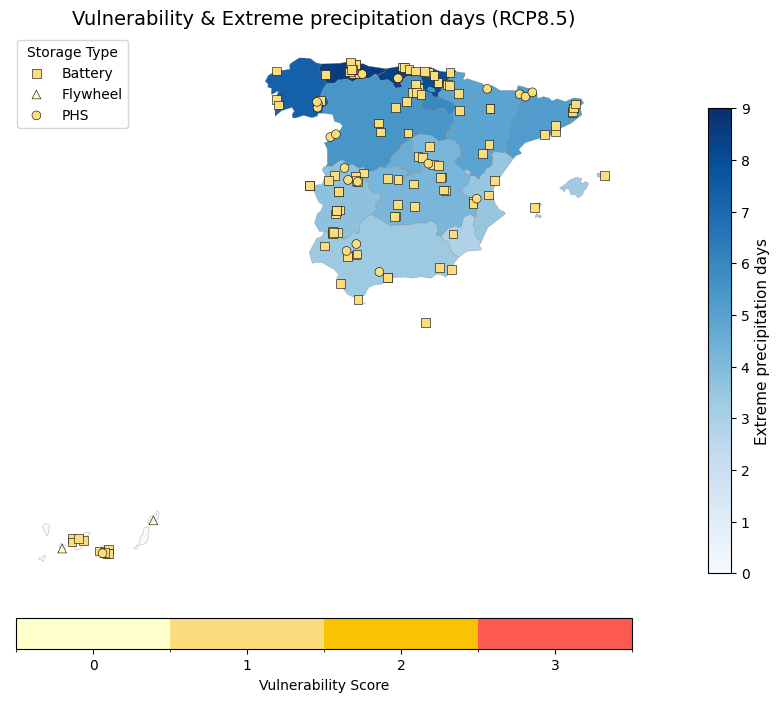

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability extreme precipitation"

EXTPRECIP_CHANGE45 = "Extreme precipitation days change RCP4.5"
EXTPRECIP_CHANGE85 = "Extreme precipitation days change RCP8.5"
EXTPRECIPCURRENT_COL = "Extreme precipitation days 1991-2020 hazard strength"
EXTPRECIP45 = "Extreme precipitation days 2011-2040 hazard strength RCP4.5"
EXTPRECIP85 = "Extreme precipitation days 2011-2040 hazard strength RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[EXTPRECIP_CHANGE45] = regions_bg["NUTS_NAME"].map(
    extprecip_days_change45_dict
)
regions_bg[EXTPRECIP_CHANGE85] = regions_bg["NUTS_NAME"].map(
    extprecip_days_change85_dict
)
regions_bg[EXTPRECIP45] = regions_bg["NUTS_NAME"].map(
    extprecip_days_future45_dict
)
regions_bg[EXTPRECIP85] = regions_bg["NUTS_NAME"].map(
    extprecip_days_future85_dict
)

# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)

    # Choose background colormap
    if "change" in bg_col.lower():
        cmap_bg = matplotlib.colormaps.get_cmap("RdBu")
    else:
        cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.4)
      bg_label = "Change in extreme precipitation days"
    else:
      norm_bg = mcolors.Normalize(vmin=0,vmax=9)
      bg_label = "Extreme precipitation days"

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
    )

    return fig, ax


# =========================================================
# 6. GENERATE MAPS
# =========================================================

fig_63, ax_63 = plot_step5_optionA(
    EXTPRECIP_CHANGE45,
    "Vulnerability & Change in Extreme precipitation days (Present → RCP4.5)"
)

fig_64, ax_64 = plot_step5_optionA(
    EXTPRECIP_CHANGE85,
    "Vulnerability & Change in Extreme precipitation days (Present → RCP8.5)"
)

fig_65, ax_66 = plot_step5_optionA(
    EXTPRECIP45,
    "Vulnerability & Extreme precipitation days (RCP4.5)"
)

fig_66, ax_66 = plot_step5_optionA(
    EXTPRECIP85,
    "Vulnerability & Extreme precipitation days (RCP8.5)"
)


In [ ]:
save_figure(fig_63, "Vulnerability & Change in extreme precipitation days (Present → RCP4.5).jpg")
save_figure(fig_64, "Vulnerability & Change in extreme precipitation days (Present → RCP8.5).jpg")
save_figure(fig_65, "Vulnerability & extreme precipitation days (RCP4.5).jpg")
save_figure(fig_66, "Vulnerability & extreme precipitation days (RCP8.5).jpg")

Saved: Vulnerability & Change in extreme precipitation days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in extreme precipitation days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & extreme precipitation days (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & extreme precipitation days (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

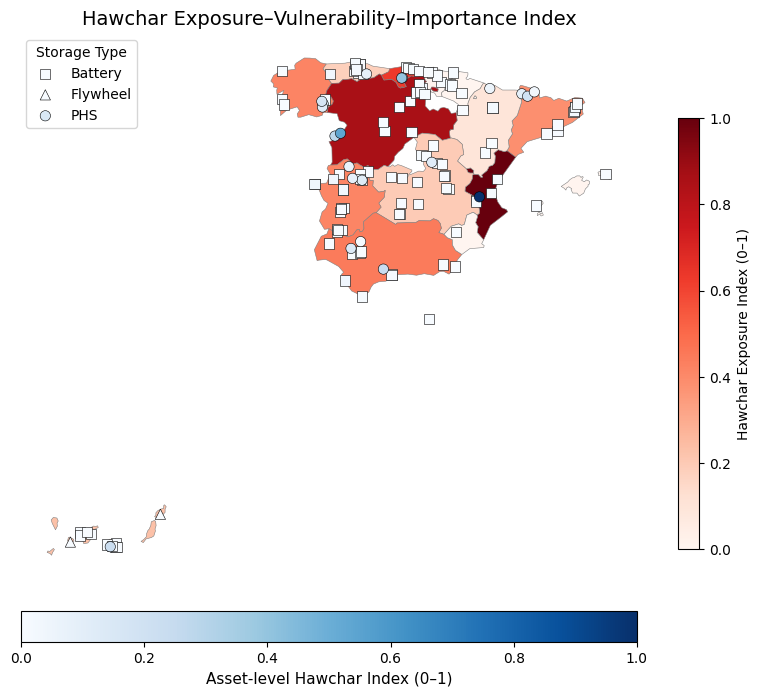

In [ ]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability extreme precipitation"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])


def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )
    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_86, ax_86 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)


In [ ]:
save_figure(fig_86, "Hawchar Index extreme precipitation.jpg")

Saved: Hawchar Index extreme precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table

,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Comunitat Valenciana,47257.20,1.000000,16070.10,5,1.000000
1,Castilla y León,40672.80,0.535821,14143.90,12,0.860659
2,Cantabria,29765.80,0.396904,10077.90,6,0.629841
3,Andalucía,21116.98,0.238142,7575.29,13,0.446812
4,Galicia,19873.00,0.171330,6641.50,7,0.420487
5,Extremadura,19716.52,0.119071,7760.26,22,0.417175
6,Cataluña,18213.40,0.191771,6671.70,11,0.385366
7,Canarias,10928.98,0.231527,3734.09,12,0.231211
8,Castilla-La Mancha,9298.52,0.116425,3769.26,17,0.196706
9,Principado de Asturias,8517.82,0.087980,3593.91,12,0.180185


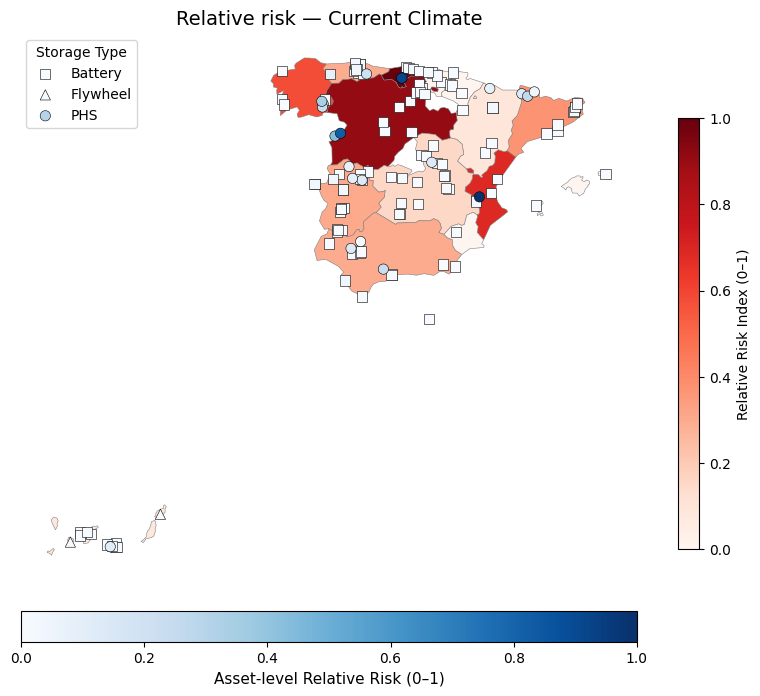

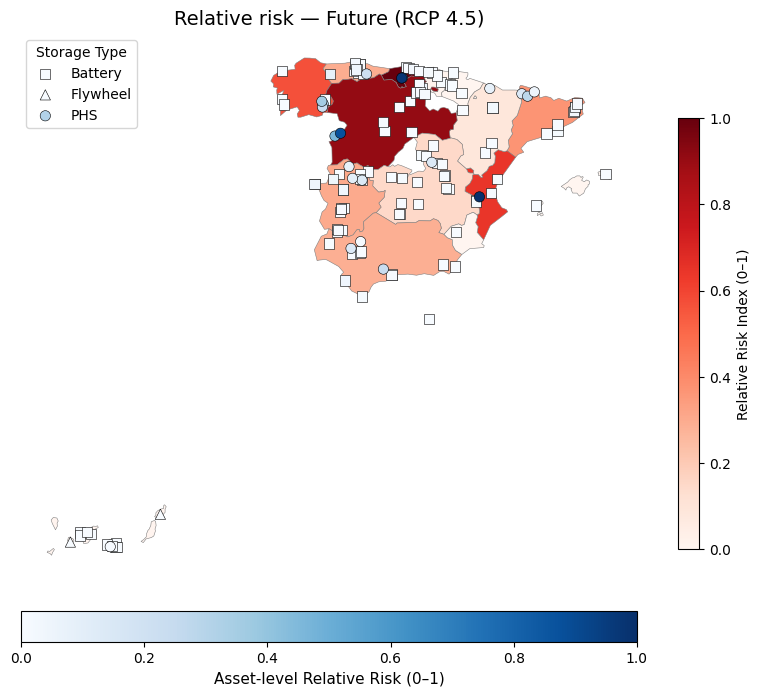

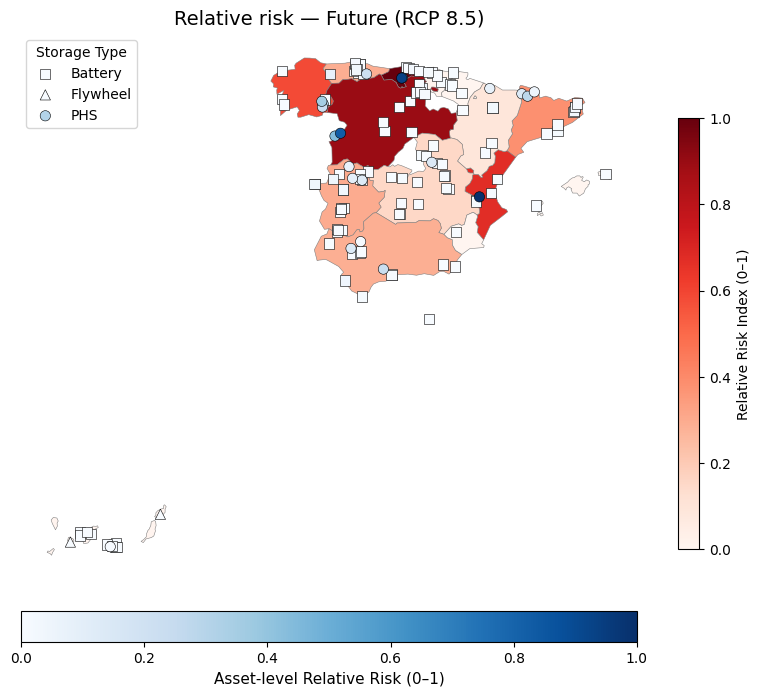

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability extreme precipitation"

HAZARDCURRENT_COL = "Extreme precipitation days 1991-2020"
HAZARD45_COL     = "Extreme precipitation days 2011-2040 RCP4.5"
HAZARD85_COL     = "Extreme precipitation days 2011-2040 RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_67, ax_67 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_68, ax_68 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_69, ax_69 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_67, "Relative risk extreme precipitation days — Current Climate.jpg")
save_figure(fig_68, "Relative risk extreme precipitation days — Future (RCP4.5).jpg")
save_figure(fig_69, "Relative risk extreme precipitation days — Future (RCP8.5).jpg")

Saved: Relative risk extreme precipitation days — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk extreme precipitation days — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk extreme precipitation days — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

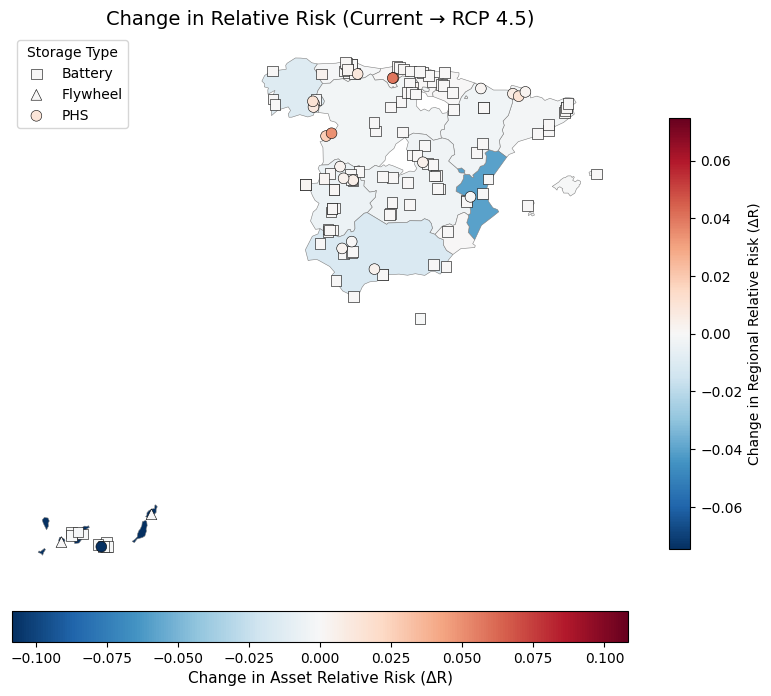

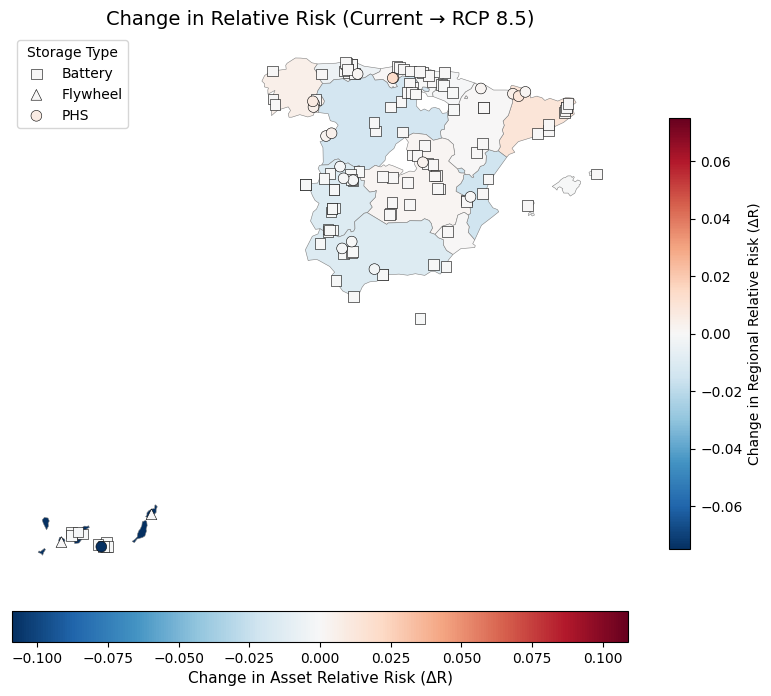

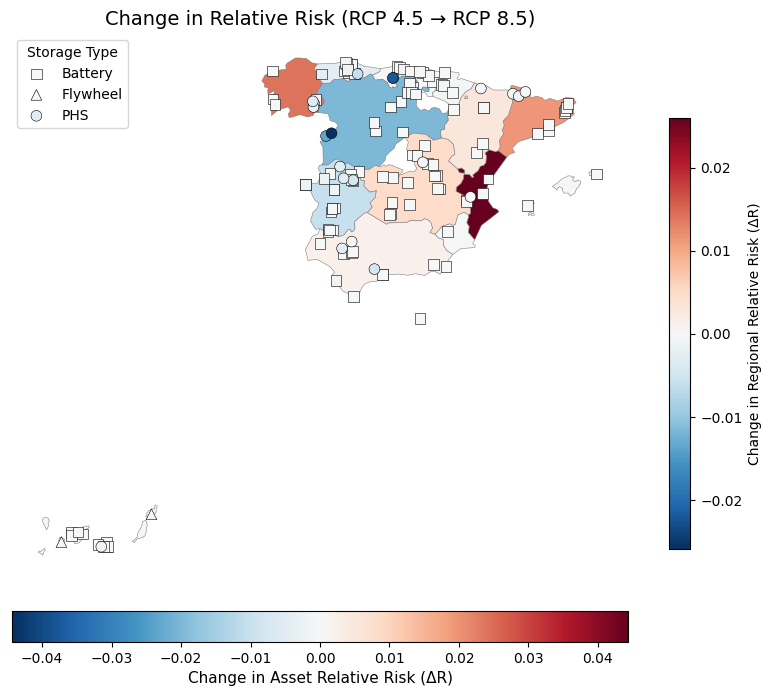

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax



# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_70, ax_70 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_71, ax_71 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_72, ax_72 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_70, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_71, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_72, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)
region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
    region_risk_table
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Cantabria,254795.2480,259855.4340,249139.7460,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,Cantabria,0.915768
1,Castilla y León,231428.2320,235495.5120,222886.9440,0.908287,0.906253,0.894623,-0.002035,-0.013665,-0.011630,Castilla y León,0.821784
2,Comunitat Valenciana,175324.2120,168235.6320,167763.0600,0.688086,0.647408,0.673358,-0.040679,-0.014728,0.025951,Comunitat Valenciana,1.000000
3,Galicia,147457.6600,147855.1200,145271.6300,0.578714,0.568975,0.583079,-0.009739,0.004365,0.014104,Galicia,0.342661
4,Cataluña,94709.6800,96166.7520,95073.9480,0.371685,0.370056,0.381588,-0.001629,0.009903,0.011532,Cataluña,0.268789
5,Extremadura,78471.7496,78866.0800,74134.1152,0.307953,0.303475,0.297536,-0.004478,-0.010417,-0.005939,Extremadura,0.127737
6,Andalucía,76021.1280,74542.9394,71797.7320,0.298335,0.286838,0.288158,-0.011497,-0.010176,0.001320,Andalucía,0.231082
7,Principado de Asturias,75297.5288,76575.2018,72742.1828,0.295495,0.294659,0.291949,-0.000836,-0.003545,-0.002710,Principado de Asturias,0.209635
8,Castilla-La Mancha,39239.7544,39146.7692,38774.8284,0.153973,0.150618,0.155606,-0.003354,0.001633,0.004988,Castilla-La Mancha,0.132430
9,Aragón,22926.3400,22697.9900,22515.3100,0.089945,0.087316,0.090341,-0.002628,0.000397,0.003025,Aragón,0.079215


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Extreme precipitation days 1991-2020,Extreme precipitation days 1991-2020 hazard strength,Vulnerability extreme precipitation,Extreme precipitation days change RCP4.5,Extreme precipitation days change RCP8.5,Extreme precipitation days 2011-2040 RCP4.5,Extreme precipitation days 2011-2040 hazard strength RCP4.5,Extreme precipitation days 2011-2040 RCP8.5,Extreme precipitation days 2011-2040 hazard strength RCP8.5,Exposure,Hawchar_abs,Hawchar_rel,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,15.50,31.00,0.000684,230.0200,230.6400,226.6100,0.001367,0.001429,0.001408
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,20.00,40.00,0.000882,296.8000,297.6000,292.4000,0.001764,0.001843,0.001816
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,5.00,10.00,0.000221,74.2000,74.4000,73.1000,0.000441,0.000461,0.000454
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2280.00,6840.00,0.150824,50752.8000,50889.6000,50000.4000,0.301647,0.315204,0.310569
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.00,8.00,3,42.150000,-7.190000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,1720.00,5160.00,0.113779,38287.2000,38390.4000,37719.6000,0.227558,0.237786,0.234289
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,315.00,2590.00,8.00,3,42.334200,-7.215200,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2590.00,7770.00,0.171330,57653.4000,57808.8000,56798.7000,0.342661,0.358061,0.352796
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,11.00,22.00,0.000485,163.2400,163.6800,160.8200,0.000970,0.001014,0.000999
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,8.84,2,1,0.30,-0.17,8.99,2,8.54,2,800.00,1600.00,0.035280,14144.0000,14384.0000,13664.0000,0.084064,0.089093,0.084872
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,8.84,2,1,0.30,-0.17,8.99,2,8.54,2,46.00,92.00,0.002029,813.2800,827.0800,785.6800,0.004834,0.005123,0.004880
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,8.84,2,1,0.30,-0.17,8.99,2,8.54,2,60.00,120.00,0.002646,1060.8000,1078.8000,1024.8000,0.006305,0.006682,0.006365


# High Fire Danger Days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Fire days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Fire days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#High fire danger days above 1991-2020 for each region
fire_days_present_dict = {
    "Galicia": 8.32,
    "Principado de Asturias": 0.66,
    "Cantabria": 4.36,
    "País Vasco": 3.64,
    "Comunidad Foral de Navarra": 29.23,
    "La Rioja": 24.14,
    "Aragón": 64.54,
    "Cataluña": 34.39,
    "Comunitat Valenciana": 81.02,
    "Región de Murcia": 121.8,
    "Andalucía": 109.96,
    "Castilla-La Mancha": 100.69,
    "Castilla y León": 51.57,
    "Comunidad de Madrid": 90.54,
    "Extremadura": 102.54,
    "Canarias": 83.23,
    "Illes Balears": 61.75,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 1991-2020"] = data["Region"].map(fire_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [0, 15, 30, 60, 90, float('inf')]
labels = [0, 1, 2, 3, 4]

data['High fire danger days 1991-2020 hazard strength'] = pd.cut(
    data['High fire danger days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_extprecip_days = {
    "Battery": 1,
    "PHS": 0,
    "Flywheel": 0
}

data["Vulnerability fire days"] = data["Storage type"].map(vulnerability_extprecip_days)

In [ ]:
#Change in number of high fire danger days from 1991-2020 to 2011-2040 RCP4.5 for each region
fire_days_change45_dict = {
    "Galicia": 2.65,
    "Principado de Asturias": 0.41,
    "Cantabria": 0.73,
    "País Vasco": 1.08,
    "Comunidad Foral de Navarra": 4.29,
    "La Rioja": 4.2,
    "Aragón": 6.59,
    "Cataluña": 4.56,
    "Comunitat Valenciana": 7.57,
    "Región de Murcia": 9.58,
    "Andalucía": 8.97,
    "Castilla-La Mancha": 8.0,
    "Castilla y León": 4.67,
    "Comunidad de Madrid": 5.77,
    "Extremadura": 7.53,
    "Illes Balears": 4.41,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days change RCP4.5"] = data["Region"].map(fire_days_change45_dict)

In [ ]:
#Change in number of high fire danger days from 1991-2020 to 2011-2040 RCP8.5 for each region
fire_days_change85_dict = {
    "Galicia": 3.57,
    "Principado de Asturias": 0.41,
    "Cantabria": 0.62,
    "País Vasco": 1.11,
    "Comunidad Foral de Navarra": 4.8,
    "La Rioja": 4.68,
    "Aragón": 7.48,
    "Cataluña": 4.29,
    "Comunitat Valenciana": 8.45,
    "Región de Murcia": 9.32,
    "Andalucía": 10.13,
    "Castilla-La Mancha": 9.67,
    "Castilla y León": 6.8,
    "Comunidad de Madrid": 8.28,
    "Extremadura": 9.82,
    "Illes Balears": 4.52,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days change RCP8.5"] = data["Region"].map(fire_days_change85_dict)

In [ ]:
#High fire danger days 2011-2040 RCP4.5 for each region
fire_days_future45_dict = {
    "Galicia": 10.14,
    "Principado de Asturias": 1.15,
    "Cantabria": 2.65,
    "País Vasco": 4.06,
    "Comunidad Foral de Navarra": 29.13,
    "La Rioja": 21.41,
    "Aragón": 59.81,
    "Cataluña": 33.26,
    "Comunitat Valenciana": 76.48,
    "Región de Murcia": 118.43,
    "Andalucía": 105.56,
    "Castilla-La Mancha": 93.5,
    "Castilla y León": 46.26,
    "Comunidad de Madrid": 83.1,
    "Extremadura": 99.75,
    "Illes Balears": 53.64,
    "Canarias": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 2011-2040 RCP4.5"] = data["Region"].map(fire_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [0, 15, 30, 60, 90, float("inf")]
labels = [0, 1, 2, 3, 4]

data["High fire danger days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["High fire danger days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#High fire danger days 2011-2040 RCP8.5 for each region
fire_days_future85_dict = {
    "Galicia": 11.3,
    "Principado de Asturias": 1.11,
    "Cantabria": 2.45,
    "País Vasco": 4.0,
    "Comunidad Foral de Navarra": 29.69,
    "La Rioja": 22.11,
    "Aragón": 60.51,
    "Cataluña": 32.78,
    "Comunitat Valenciana": 76.97,
    "Región de Murcia": 117.61,
    "Andalucía": 108.69,
    "Castilla-La Mancha": 95.64,
    "Castilla y León": 86.34,
    "Comunidad de Madrid": 84.5,
    "Extremadura": 103.43,
    "Illes Balears": 52.91,
    "Canarias": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 2011-2040 RCP8.5"] = data["Region"].map(fire_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [0, 15, 30, 60, 90, float("inf")]
labels = [0, 1, 2, 3, 4]

data["High fire danger days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["High fire danger days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'High fire danger days 1991-2020 hazard strength',
    'High fire danger days 2011-2040 hazard strength RCP4.5',
    'High fire danger days 2011-2040 hazard strength RCP8.5',
    'Vulnerability fire days',
    'High fire danger days 1991-2020',
    'High fire danger days 2011-2040 RCP4.5',
    'High fire danger days 2011-2040 RCP8.5',
    'High fire danger days change RCP4.5',
    'High fire danger days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')


High fire danger days (1991–2020)
Q1     : 6.34
Mean   : 51.18
Median : 51.57
Q3     : 86.89
IQR    : 80.55
Outliers (0):
Series([], dtype: float64)


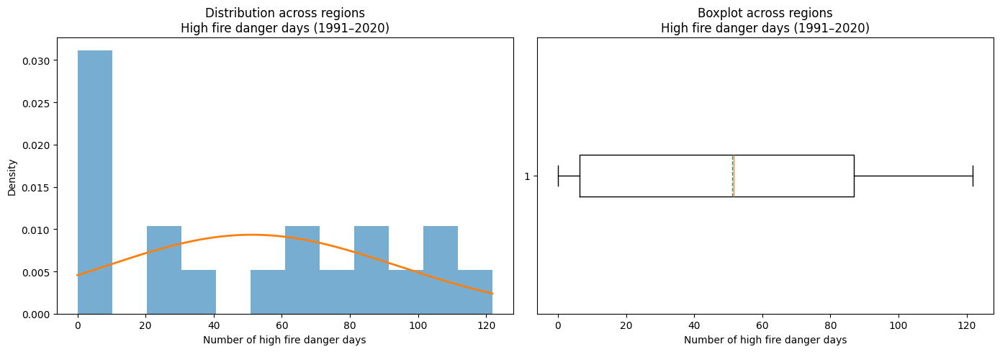


High fire danger days (2011–2040, RCP4.5)
Q1     : 3.35
Mean   : 44.12
Median : 33.26
Q3     : 79.79
IQR    : 76.43
Outliers (0):
Series([], dtype: float64)


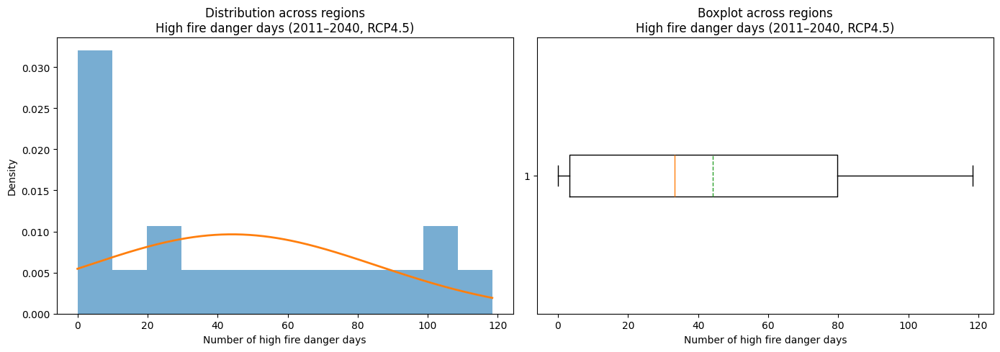


High fire danger days (2011–2040, RCP8.5)
Q1     : 3.23
Mean   : 46.84
Median : 32.78
Q3     : 85.42
IQR    : 82.20
Outliers (0):
Series([], dtype: float64)


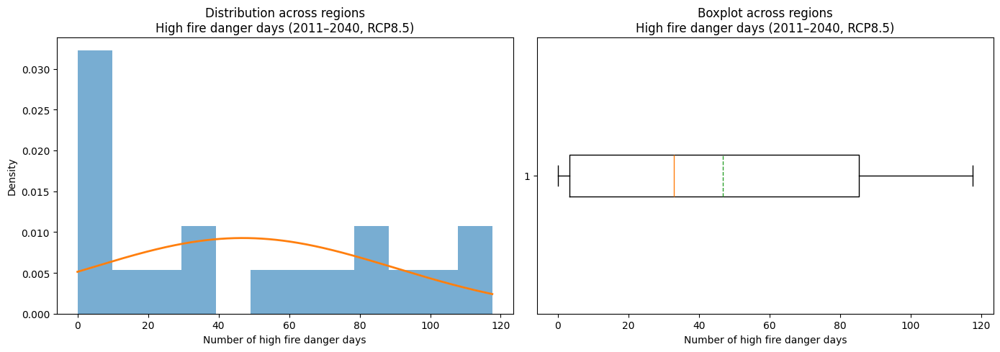

In [ ]:
from scipy.stats import norm

# =========================================================
# HAZARD DICTIONARIES
# =========================================================
hazard_data = {
    "Present (1991–2020)": fire_days_present_dict,
    "RCP 4.5 (2011–2040)": fire_days_future45_dict,
    "RCP 8.5 (2011–2040)": fire_days_future85_dict,
}

# =========================================================
# FUNCTION: distribution + boxplot + stats
# =========================================================
def hazard_distribution_from_dict(hazard_dict, label):

    # Convert dict → Series (one value per region)
    values = pd.Series(hazard_dict).astype(float)

    # ------------------------
    # Summary statistics
    # ------------------------
    Q1 = values.quantile(0.25)
    median = values.median()
    mean = values.mean()
    Q3 = values.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = values[(values < lower) | (values > upper)]

    print("\n" + "=" * 50)
    print(f"{label}")
    print(f"Q1     : {Q1:.2f}")
    print(f"Mean   : {mean:.2f}")
    print(f"Median : {median:.2f}")
    print(f"Q3     : {Q3:.2f}")
    print(f"IQR    : {IQR:.2f}")
    print(f"Outliers ({len(outliers)}):")
    print(outliers)

     # ------------------------
    # Plots
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram + normal distribution
    x = np.linspace(values.min(), values.max(), 300)
    axes[0].hist(values, bins=12, density=True, alpha=0.6)
    axes[0].plot(
        x,
        norm.pdf(x, mean, values.std()),
        linewidth=2
    )
    axes[0].set_title(f"Distribution across regions\n{label}")
    axes[0].set_xlabel("Number of high fire danger days")
    axes[0].set_ylabel("Density")

    # Boxplot
    axes[1].boxplot(
        values,
        vert=False,
        showmeans=True,
        meanline=True
    )
    axes[1].set_title(f"Boxplot across regions\n{label}")
    axes[1].set_xlabel("Number of high fire danger days")

    plt.tight_layout()
    plt.show()

    return fig

fig125 = hazard_distribution_from_dict(
    fire_days_present_dict,
    "High fire danger days (1991–2020)"
)

fig126 = hazard_distribution_from_dict(
    fire_days_future45_dict,
    "High fire danger days (2011–2040, RCP4.5)"
)

fig127 = hazard_distribution_from_dict(
    fire_days_future85_dict,
    "High fire danger days (2011–2040, RCP8.5)"
)

In [ ]:
save_figure(fig125, "High_fire_danger_days_Present_distribution.jpg")

save_figure(fig126, "High_fire_danger_days_RCP45_distribution.jpg")

save_figure(fig127, "High_fire_danger_days_RCP85_distribution.jpg")

Mapping the data

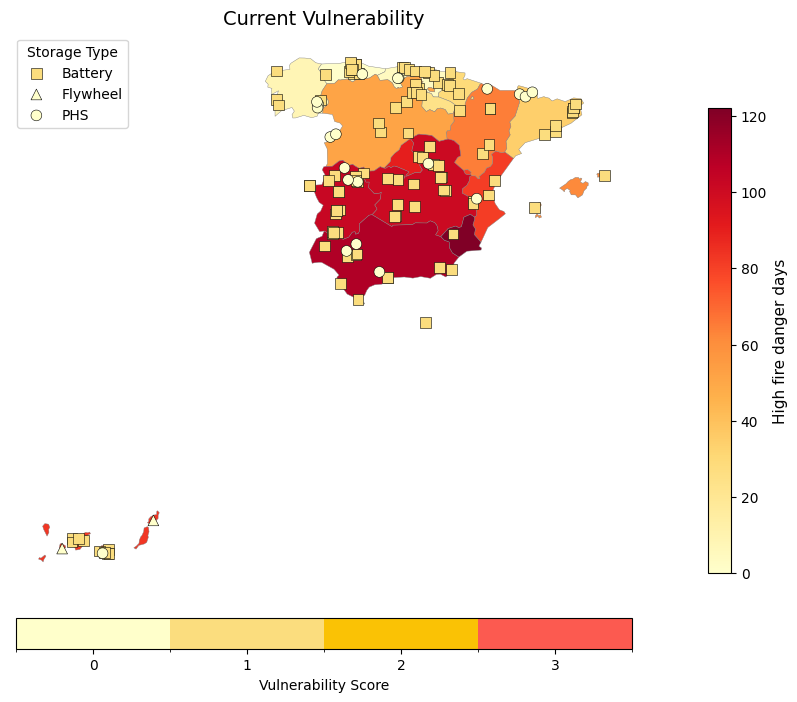

In [ ]:
#CURRENT VULNERABILITY

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability fire days"
HAZARDCURRENT_COL = "High fire danger days 1991-2020 hazard strength"
FIREDAYSCURRENT_COL = "High fire danger days 1991-2020"

# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[FIREDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    fire_days_present_dict
)


# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=0, vmax=122)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("High fire danger days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_73, ax_73 = plot_current_optionA(
    bg_col=FIREDAYSCURRENT_COL,
    title="Current Vulnerability"
)


In [ ]:
save_figure(fig_73, "Current Vulnerability fire danger days.jpg")

Saved: Current Vulnerability fire danger days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

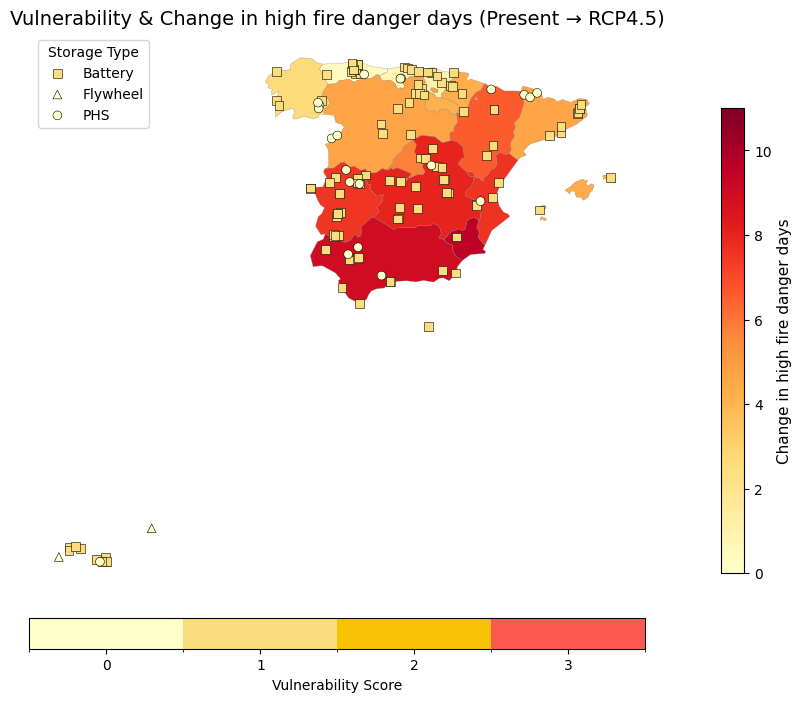

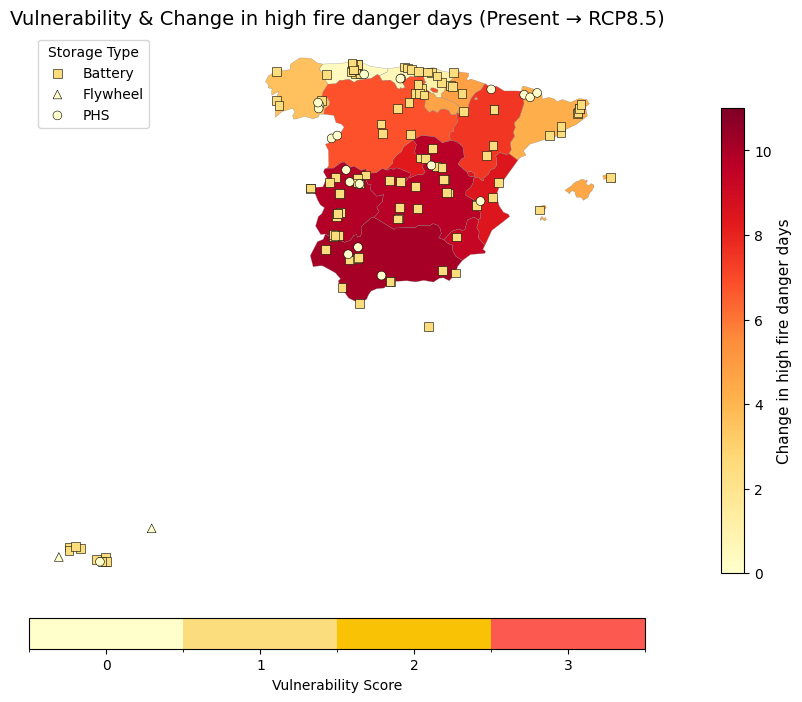

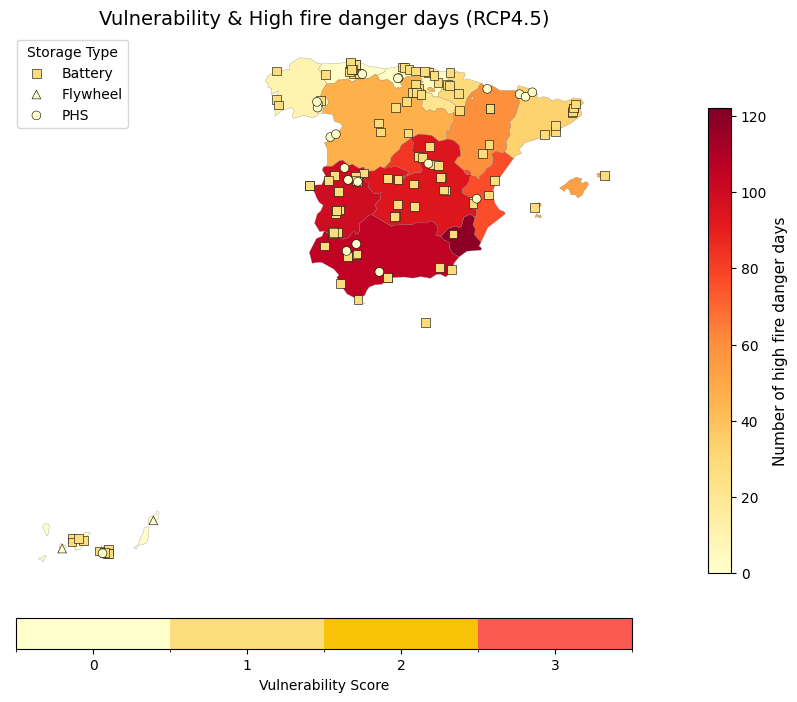

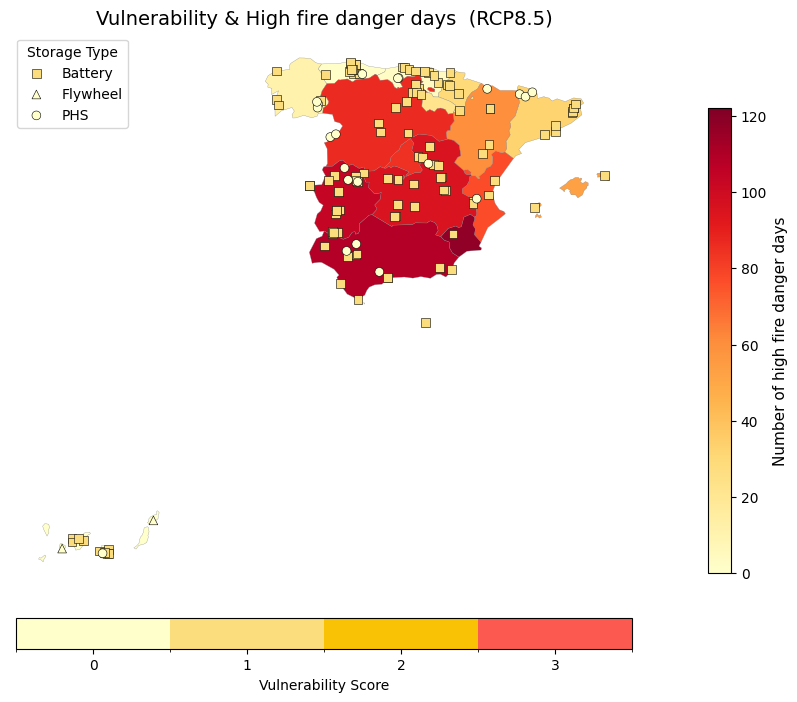

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability fire days"

FIREDAYS_CHANGE45 = "High fire danger days change RCP4.5"
FIREDAYS_CHANGE85 = "High fire danger days change RCP8.5"
FIREDAYSCURRENT_COL = "High fire danger days 1991-2020 hazard strength"
FIREDAYS45 = "High fire danger days 2011-2040 RCP4.5"
FIREDAYS85 = "High fire danger days 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region bakcgrounds
regions_bg = regions.copy()

regions_bg[FIREDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    fire_days_change45_dict
)

regions_bg[FIREDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    fire_days_change85_dict
)
regions_bg[FIREDAYS45] = regions_bg["NUTS_NAME"].map(
    fire_days_future45_dict
)
regions_bg[FIREDAYS85] = regions_bg["NUTS_NAME"].map(
    fire_days_future85_dict
)

# =========================================================
# 3. Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.Normalize(vmin=0, vmax=11)
      bg_label = "Change in high fire danger days"
    else:
      norm_bg = mcolors.Normalize(vmin=0,vmax=122)
      bg_label = "Number of high fire danger days"

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_75, ax_75 = plot_step5_optionA(
    FIREDAYS_CHANGE45,
    "Vulnerability & Change in high fire danger days (Present → RCP4.5)"
)

fig_76, ax_76 = plot_step5_optionA(
    FIREDAYS_CHANGE85,
    "Vulnerability & Change in high fire danger days (Present → RCP8.5)"
)
#I don't think I need these
fig_77, ax_77 = plot_step5_optionA(
    FIREDAYS45,
    "Vulnerability & High fire danger days (RCP4.5)"
)

fig_78, ax_78 = plot_step5_optionA(
    FIREDAYS85,
    "Vulnerability & High fire danger days  (RCP8.5)"
)


In [ ]:
save_figure(fig_75, "Vulnerability & Change in fire danger days (Present → RCP4.5).jpg")
save_figure(fig_76, "Vulnerability & Change in fire danger days (Present → RCP8.5).jpg")
save_figure(fig_77, "Vulnerability & High fire danger days (RCP4.5).jpg")
save_figure(fig_78, "Vulnerability & High fire danger days (RCP8.5).jpg")

Saved: Vulnerability & Change in fire danger days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in fire danger days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & High fire danger days (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & High fire danger days (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

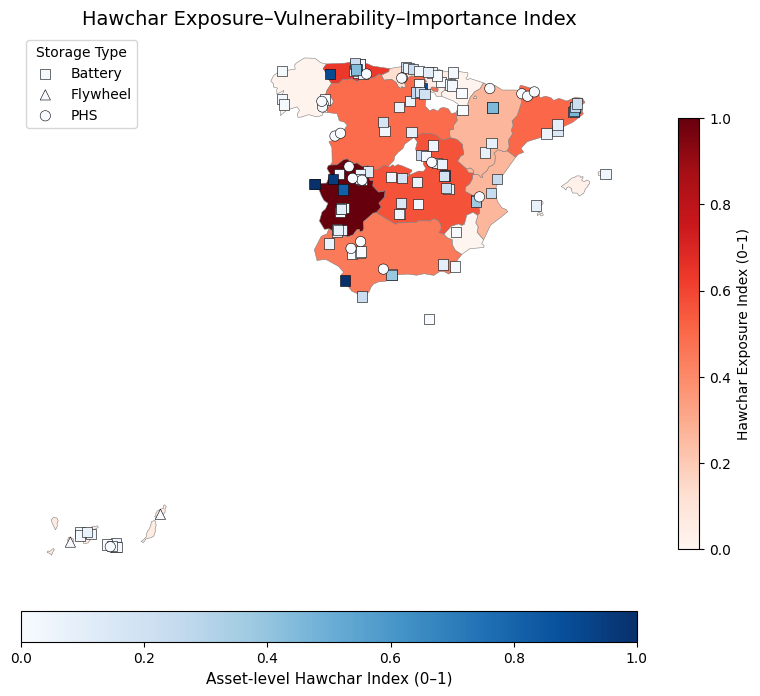

In [ ]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability fire days"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])

def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_74, ax_74 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)


In [ ]:
save_figure(fig_74, "Hawchar Index high fire danger days.jpg")

Saved: Hawchar Index high fire danger days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table

,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Extremadura,7128.52,1.000000,7760.26,22,1.000000
1,Principado de Asturias,4527.82,0.901307,3593.91,12,0.634996
2,Castilla-La Mancha,4018.52,0.788644,3769.26,17,0.563516
3,Cataluña,3603.40,0.458540,6671.70,11,0.505255
4,Castilla y León,3517.80,0.878774,14143.90,12,0.493241
5,Andalucía,3217.78,0.997071,7575.29,13,0.451133
6,Aragón,1912.00,0.450653,1841.00,5,0.267869
7,Comunitat Valenciana,1906.20,0.375394,16070.10,5,0.267055
8,Cantabria,935.80,0.225327,10077.90,6,0.130861
9,Canarias,428.98,0.067598,3734.09,12,0.059730


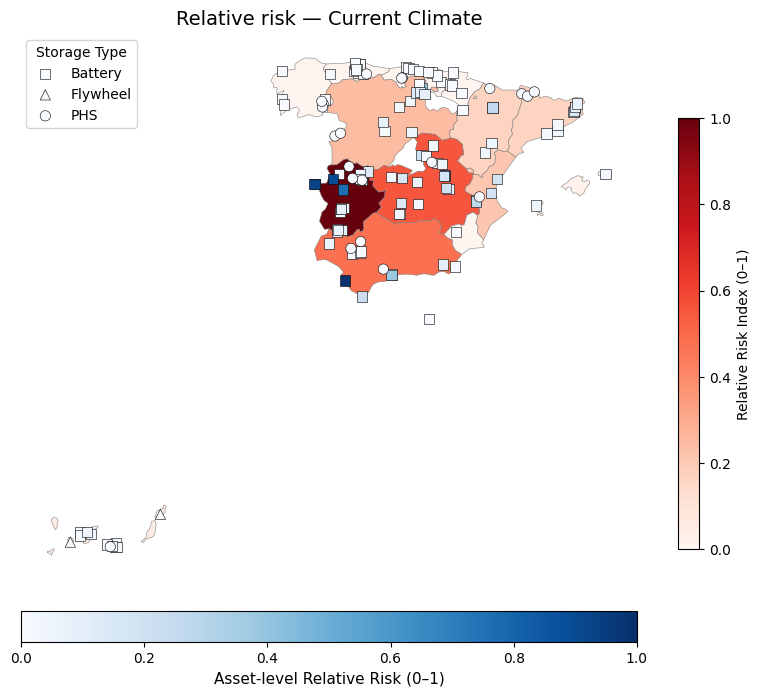

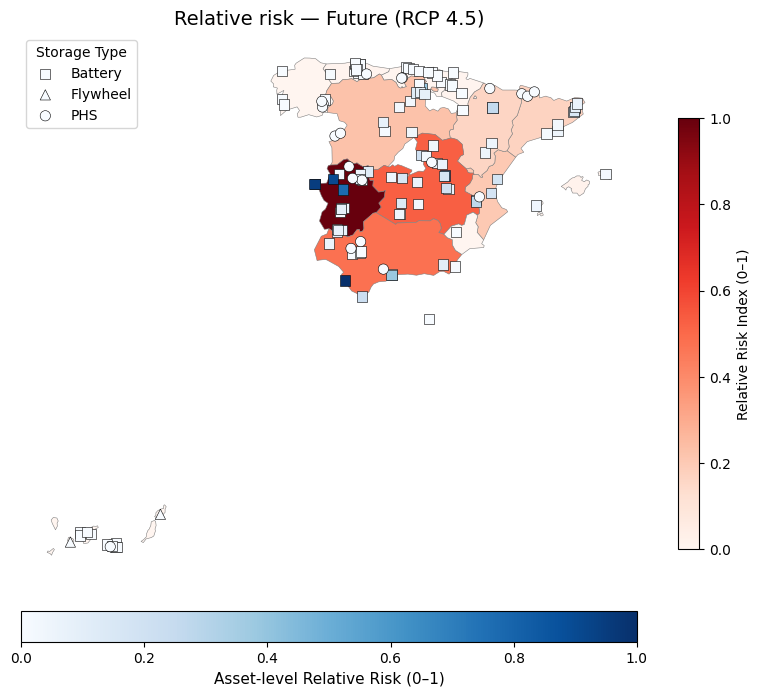

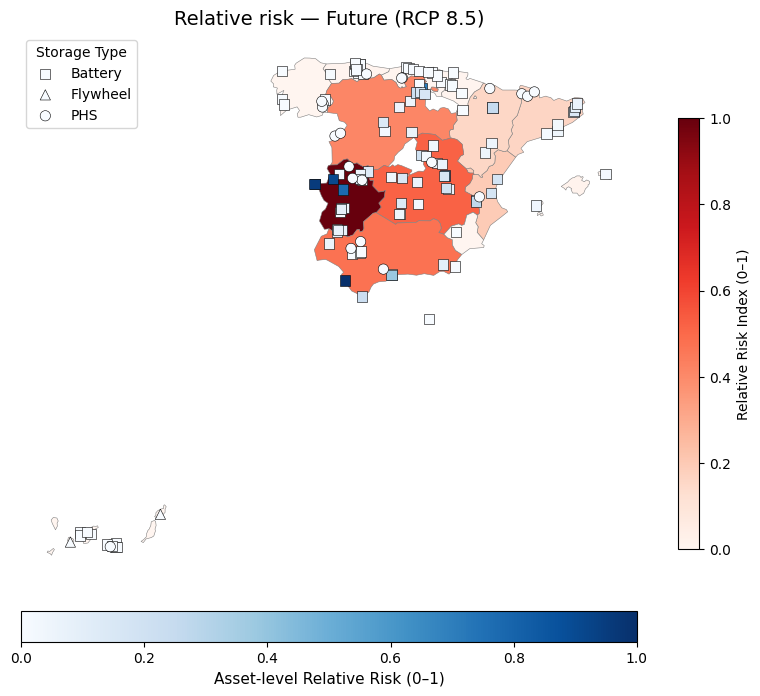

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability fire days"

HAZARDCURRENT_COL = "High fire danger days 1991-2020"
HAZARD45_COL     = "High fire danger days 2011-2040 RCP4.5"
HAZARD85_COL     = "High fire danger days 2011-2040 RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_79, ax_79 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_80, ax_80 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_81, ax_81 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_79, "Relative risk high fire danger days — Current Climate.jpg")
save_figure(fig_80, "Relative risk high fire danger days — Future (RCP4.5).jpg")
save_figure(fig_81, "Relative risk high fire danger days — Future (RCP8.5).jpg")

Saved: Relative risk high fire danger days — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk high fire danger days — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk high fire danger days — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

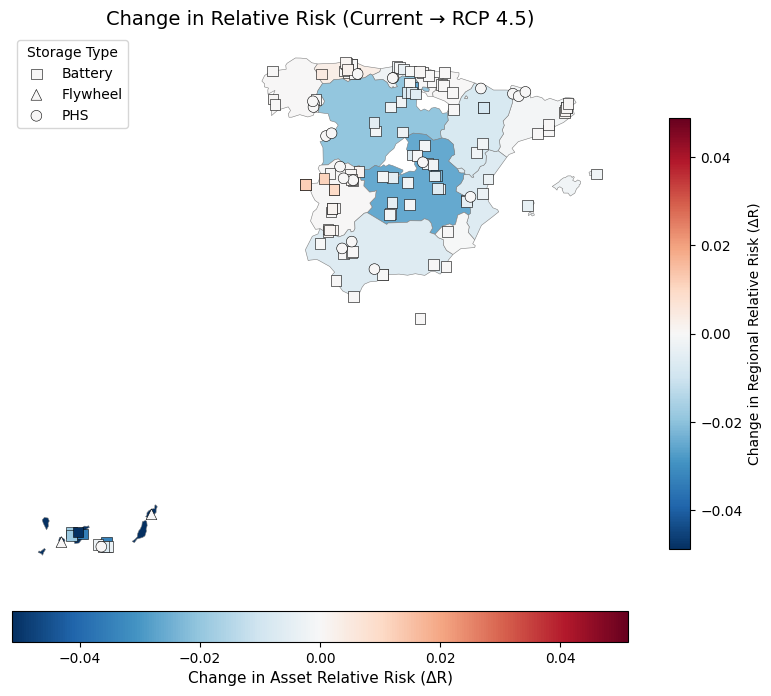

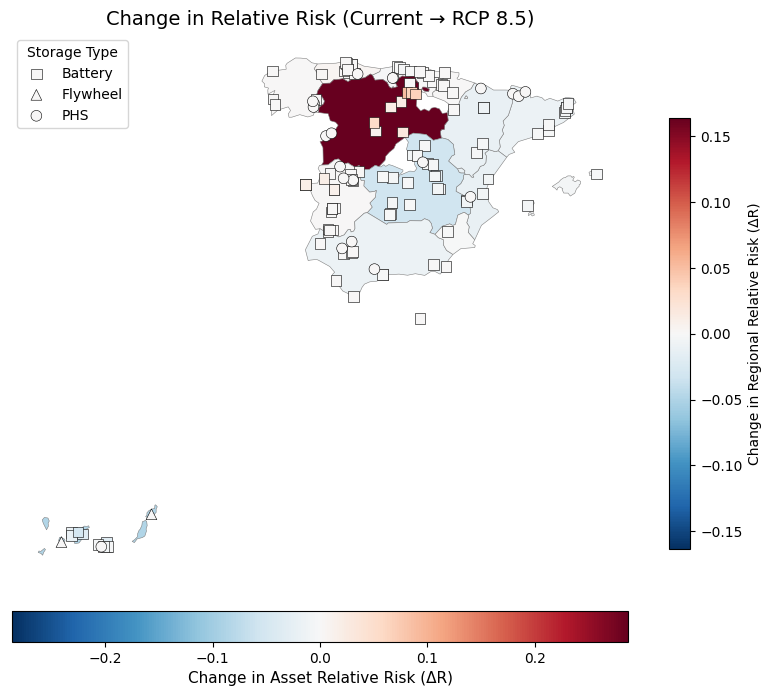

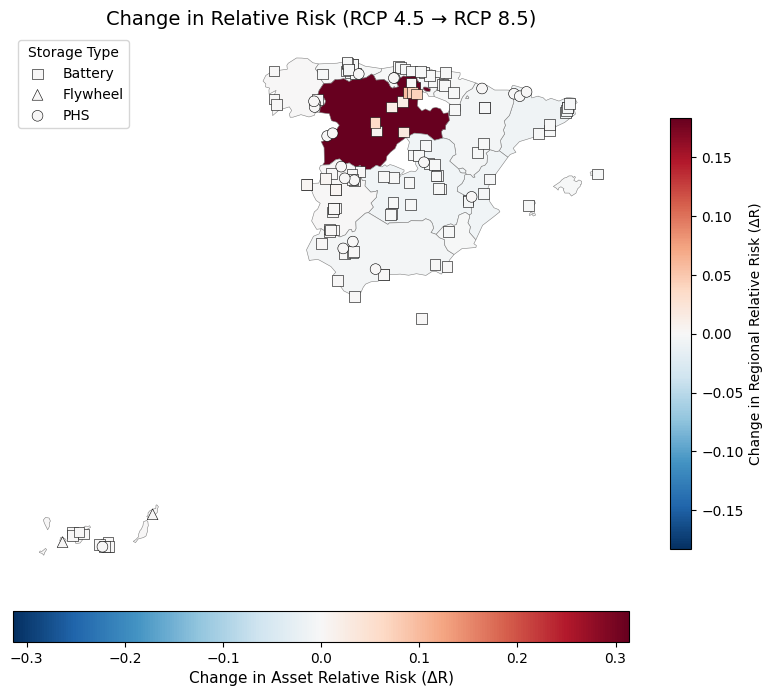

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax



# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_82, ax_82 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_83, ax_83 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_84, ax_84 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_82, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_83, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_84, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)
region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
    region_risk_table
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Extremadura,730958.4408,711069.8700,737302.8236,1.000000,1.000000,1.000000,0.000000e+00,0.000000,0.000000,Extremadura,0.935261
1,Castilla-La Mancha,404624.7788,375731.6200,384331.2528,0.553554,0.528403,0.521266,-2.515050e-02,-0.032287,-0.007137,Castilla-La Mancha,0.724280
2,Andalucía,353827.0888,339668.8568,349740.5082,0.484059,0.477687,0.474351,-6.372072e-03,-0.009708,-0.003336,Andalucía,1.000000
3,Castilla y León,181412.9460,162733.4280,303726.8520,0.248185,0.228857,0.411943,-1.932788e-02,0.163758,0.183086,Castilla y León,0.413346
4,Comunitat Valenciana,154440.3240,145786.1760,146720.2140,0.211285,0.205024,0.198996,-6.260985e-03,-0.012289,-0.006028,Comunitat Valenciana,0.277408
5,Cataluña,123920.9260,119849.0840,118119.4520,0.169532,0.168548,0.160205,-9.845596e-04,-0.009327,-0.008343,Cataluña,0.143830
6,Aragón,123400.4800,114356.7200,115695.1200,0.168820,0.160823,0.156917,-7.996639e-03,-0.011903,-0.003907,Aragón,0.265284
7,Canarias,35704.0054,0.0000,0.0000,0.048845,0.000000,0.000000,-4.884547e-02,-0.048845,0.000000,Canarias,0.051316
8,Illes Balears,12967.5000,11264.4000,11111.1000,0.017740,0.015841,0.015070,-1.898925e-03,-0.002670,-0.000772,Illes Balears,0.042831
9,Cantabria,4080.0880,2479.8700,2292.7100,0.005582,0.003488,0.003110,-2.094314e-03,-0.002472,-0.000378,Cantabria,0.008961


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,High fire danger days 1991-2020,High fire danger days 1991-2020 hazard strength,Vulnerability fire days,High fire danger days change RCP4.5,High fire danger days change RCP8.5,High fire danger days 2011-2040 RCP4.5,High fire danger days 2011-2040 hazard strength RCP4.5,High fire danger days 2011-2040 RCP8.5,High fire danger days 2011-2040 hazard strength RCP8.5,Exposure,Hawchar_abs,Hawchar_rel,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,8.32,0,1,2.65,3.57,10.14,0,11.30,0,15.50,31.00,0.017463,257.9200,314.3400,350.3000,0.001325,0.001682,0.001821
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,8.32,0,1,2.65,3.57,10.14,0,11.30,0,20.00,40.00,0.022533,332.8000,405.6000,452.0000,0.001710,0.002171,0.002350
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,8.32,0,1,2.65,3.57,10.14,0,11.30,0,5.00,10.00,0.005633,83.2000,101.4000,113.0000,0.000427,0.000543,0.000587
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,8.32,0,0,2.65,3.57,10.14,0,11.30,0,2280.00,0.00,0.000000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.00,8.00,3,42.150000,-7.190000,8.32,0,0,2.65,3.57,10.14,0,11.30,0,1720.00,0.00,0.000000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,315.00,2590.00,8.00,3,42.334200,-7.215200,8.32,0,0,2.65,3.57,10.14,0,11.30,0,2590.00,0.00,0.000000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,8.32,0,1,2.65,3.57,10.14,0,11.30,0,11.00,22.00,0.012393,183.0400,223.0800,248.6000,0.000940,0.001194,0.001292
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,0.66,0,1,0.41,0.41,1.15,0,1.11,0,800.00,1600.00,0.901307,1056.0000,1840.0000,1776.0000,0.005426,0.009848,0.009232
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,0.66,0,1,0.41,0.41,1.15,0,1.11,0,46.00,92.00,0.051825,60.7200,105.8000,102.1200,0.000312,0.000566,0.000531
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,0.66,0,1,0.41,0.41,1.15,0,1.11,0,60.00,120.00,0.067598,79.2000,138.0000,133.2000,0.000407,0.000739,0.000692


# Total precipitation

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Precipitation.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Precipitation.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Precipitation 1991-2020 for each region
precip_present_dict = {
    "Galicia": 1290.5,
    "Principado de Asturias": 1300.64,
    "Cantabria": 1133.78,
    "País Vasco": 1090.03,
    "Comunidad Foral de Navarra": 904.33,
    "La Rioja": 729.39,
    "Aragón": 638.36,
    "Cataluña": 756.52,
    "Comunitat Valenciana": 482.57,
    "Región de Murcia": 356.52,
    "Andalucía": 519.26,
    "Castilla-La Mancha": 510.74,
    "Castilla y León": 696.41,
    "Comunidad de Madrid": 537.9,
    "Extremadura": 595.72,
    "Canarias": 182.02,
    "Illes Balears": 436.39,
    "Ciudad de Ceuta": 623.12,
    "Ciudad de Melilla": 349.5,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 1991-2020"] = data["Region"].map(precip_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [0, 500, 1000, float("inf")]
labels = [2, 1, 0]

data['Precipitation 1991-2020 hazard strength'] = pd.cut(
    data['Precipitation 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_precip = {
    "Battery": 0,
    "PHS": 2,
    "Flywheel": 0
}

data["Vulnerability precipitation"] = data["Storage type"].map(vulnerability_precip)

In [ ]:
#Change in precipitation (%) from 1991-2020 to 2011-2040 RCP4.5 for each region
precip_change45_dict = {
    "Galicia": -0.72,
    "Principado de Asturias": 0.75,
    "Cantabria": 0.93,
    "País Vasco": 1.05,
    "Comunidad Foral de Navarra": 1.17,
    "La Rioja": -0.39,
    "Aragón": -1.05,
    "Cataluña": -0.74,
    "Comunitat Valenciana": -4.13,
    "Región de Murcia": -3.47,
    "Andalucía": -4.49,
    "Castilla-La Mancha": -2.74,
    "Castilla y León": -0.86,
    "Comunidad de Madrid": -0.74,
    "Extremadura": -3.02,
    "Canarias": -4.06,
    "Illes Balears": -2.51,
    "Ciudad de Ceuta": -6.03,
    "Ciudad de Melilla": -6.82,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation change RCP4.5"] = data["Region"].map(precip_change45_dict)

In [ ]:
#Change in precipitation (%) from 1991-2020 to 2011-2040 RCP8.5 for each region
precip_change85_dict = {
    "Galicia": -2.99,
    "Principado de Asturias": -1.78,
    "Cantabria": -1.01,
    "País Vasco": -0.71,
    "Comunidad Foral de Navarra": -1.53,
    "La Rioja": -3.21,
    "Aragón": -2.81,
    "Cataluña": -1.66,
    "Comunitat Valenciana": -4.37,
    "Región de Murcia": -4.91,
    "Andalucía": -6.57,
    "Castilla-La Mancha": -4.77,
    "Castilla y León": -3.84,
    "Comunidad de Madrid": -3.75,
    "Extremadura": -5.86,
    "Canarias": -8.01,
    "Illes Balears": -2.99,
    "Ciudad de Ceuta": -8.87,
    "Ciudad de Melilla": -9.91,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation change RCP8.5"] = data["Region"].map(precip_change85_dict)

In [ ]:
#Precipitation 2011-2040 RCP4.5 for each region
precip_future45_dict = {
    "Galicia": 1265.69,
    "Principado de Asturias": 1277.94,
    "Cantabria": 1113.81,
    "País Vasco": 1081.52,
    "Comunidad Foral de Navarra": 911.15,
    "La Rioja": 718.37,
    "Aragón": 634.45,
    "Cataluña": 750.07,
    "Comunitat Valenciana": 472.14,
    "Región de Murcia": 345.95,
    "Andalucía": 502.99,
    "Castilla-La Mancha": 505.17,
    "Castilla y León": 684.97,
    "Comunidad de Madrid": 538.42,
    "Extremadura": 583.65,
    "Canarias": 12.28,
    "Illes Balears": 419.53,
    "Ciudad de Ceuta": 597.95,
    "Ciudad de Melilla": 320.26,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 2011-2040 RCP4.5"] = data["Region"].map(precip_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [0, 100, 500, 1000, float("inf")]
labels = [3, 2, 1, 0]

data["Precipitation 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Precipitation 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Precipitation 2011-2040 RCP8.5 for each region
precip_future85_dict = {
    "Galicia": 1232.8,
    "Principado de Asturias": 1245.74,
    "Cantabria": 1096.8,
    "País Vasco": 1065.86,
    "Comunidad Foral de Navarra": 890.7,
    "La Rioja": 702.7,
    "Aragón": 626.35,
    "Cataluña": 747.07,
    "Comunitat Valenciana": 474.29,
    "Región de Murcia": 343.51,
    "Andalucía": 491.83,
    "Castilla-La Mancha": 494.92,
    "Castilla y León": 665.11,
    "Comunidad de Madrid": 523.07,
    "Extremadura": 565.1,
    "Canarias": 12.1,
    "Illes Balears": 418.59,
    "Ciudad de Ceuta": 580.75,
    "Ciudad de Melilla": 313.36,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 2011-2040 RCP8.5"] = data["Region"].map(precip_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [0, 100, 500, 1000, float("inf")]
labels = [3, 2, 1, 0]

data["Precipitation 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Precipitation 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Precipitation 1991-2020 hazard strength',
    'Precipitation 2011-2040 hazard strength RCP4.5',
    'Precipitation 2011-2040 hazard strength RCP8.5',
    'Vulnerability precipitation',
    'Precipitation 1991-2020',
    'Precipitation 2011-2040 RCP4.5',
    'Precipitation 2011-2040 RCP8.5',
    'Precipitation change RCP4.5',
    'Precipitation change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')


Total precipitation (1991–2020)
Q1     : 496.65
Mean   : 691.25
Median : 623.12
Q3     : 830.42
IQR    : 333.77
Outliers (0):
Series([], dtype: float64)


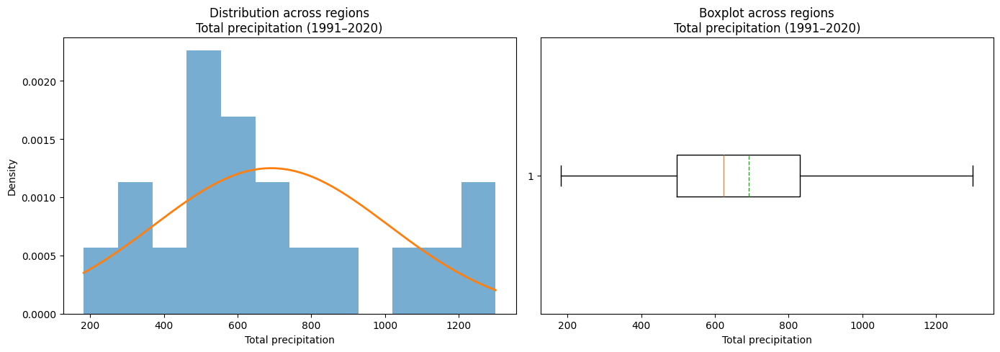


Total precipitation (2011–2040, RCP4.5)
Q1     : 487.56
Mean   : 670.33
Median : 597.95
Q3     : 830.61
IQR    : 343.05
Outliers (0):
Series([], dtype: float64)


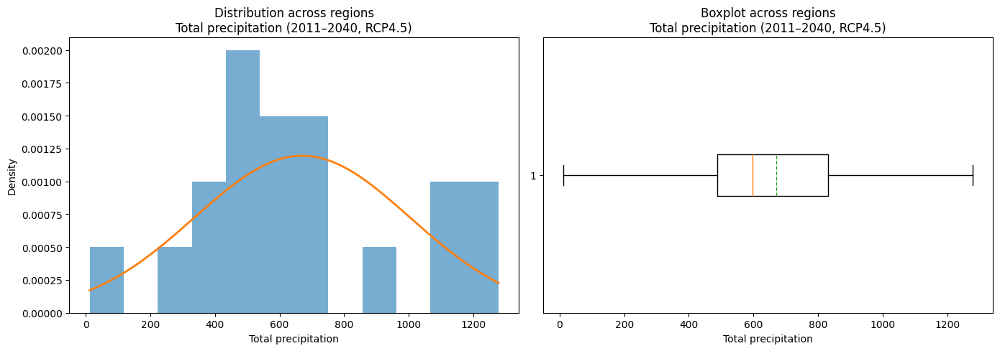


Total precipitation (2011–2040, RCP8.5)
Q1     : 483.06
Mean   : 657.40
Median : 580.75
Q3     : 818.88
IQR    : 335.82
Outliers (0):
Series([], dtype: float64)


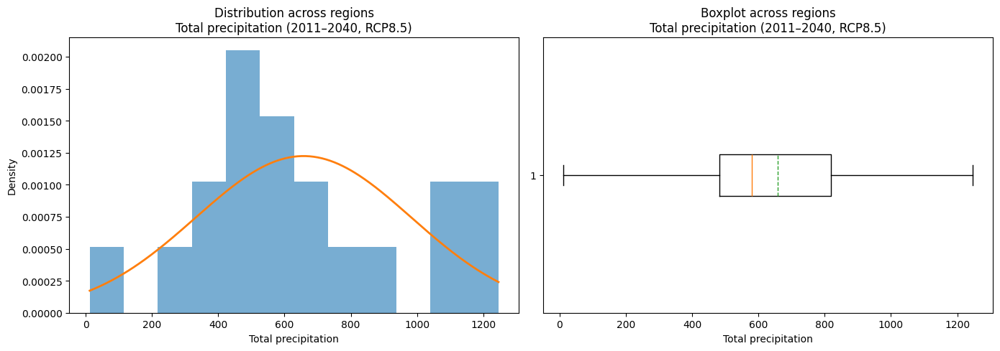

In [ ]:
from scipy.stats import norm

# =========================================================
# HAZARD DICTIONARIES
# =========================================================
hazard_data = {
    "Present (1991–2020)": precip_present_dict,
    "RCP 4.5 (2011–2040)": precip_future45_dict,
    "RCP 8.5 (2011–2040)": precip_future85_dict,
}

# =========================================================
# FUNCTION: distribution + boxplot + stats
# =========================================================
def hazard_distribution_from_dict(hazard_dict, label):

    # Convert dict → Series (one value per region)
    values = pd.Series(hazard_dict).astype(float)

    # ------------------------
    # Summary statistics
    # ------------------------
    Q1 = values.quantile(0.25)
    median = values.median()
    mean = values.mean()
    Q3 = values.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = values[(values < lower) | (values > upper)]

    print("\n" + "=" * 50)
    print(f"{label}")
    print(f"Q1     : {Q1:.2f}")
    print(f"Mean   : {mean:.2f}")
    print(f"Median : {median:.2f}")
    print(f"Q3     : {Q3:.2f}")
    print(f"IQR    : {IQR:.2f}")
    print(f"Outliers ({len(outliers)}):")
    print(outliers)

    # ------------------------
    # Plots
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram + normal distribution
    x = np.linspace(values.min(), values.max(), 300)
    axes[0].hist(values, bins=12, density=True, alpha=0.6)
    axes[0].plot(
        x,
        norm.pdf(x, mean, values.std()),
        linewidth=2
    )
    axes[0].set_title(f"Distribution across regions\n{label}")
    axes[0].set_xlabel("Total precipitation")
    axes[0].set_ylabel("Density")

    # Boxplot
    axes[1].boxplot(
        values,
        vert=False,
        showmeans=True,
        meanline=True
    )
    axes[1].set_title(f"Boxplot across regions\n{label}")
    axes[1].set_xlabel("Total precipitation")

    plt.tight_layout()
    plt.show()

    return fig

fig119 = hazard_distribution_from_dict(
    precip_present_dict,
    "Total precipitation (1991–2020)"
)


fig120 = hazard_distribution_from_dict(
    precip_future45_dict,
    "Total precipitation (2011–2040, RCP4.5)"
)


fig121 = hazard_distribution_from_dict(
    precip_future85_dict,
    "Total precipitation (2011–2040, RCP8.5)"
)

In [ ]:
save_figure(fig119, "Total_precipitation_Present_distribution.jpg")

save_figure(fig120, "Total_precipitation_RCP45_distribution.jpg")

save_figure(fig121, "Total_precipitation_RCP85_distribution.jpg")

Mapping the data

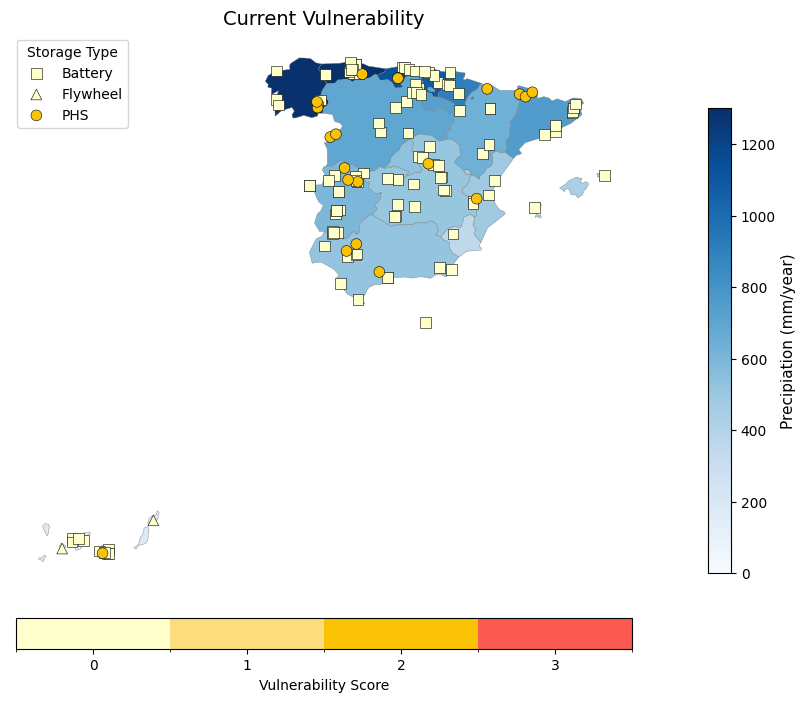

In [ ]:
#CURRENT VULNERABILITY

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability precipitation"
HAZARDCURRENT_COL = "Precipitation 1991-2020 hazard strength"
PRECIPCURRENT_COL = "Precipitation 1991-2020"


# -------------------------------
# Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[PRECIPCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    precip_present_dict
)


# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=0, vmax=1300)
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Precipiation (mm/year)", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_85, ax_85 = plot_current_optionA(
    bg_col=PRECIPCURRENT_COL,
    title="Current Vulnerability"
)


In [ ]:
save_figure(fig_85, "Current Vulnerability low precipitation.jpg")

Saved: Current Vulnerability low precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

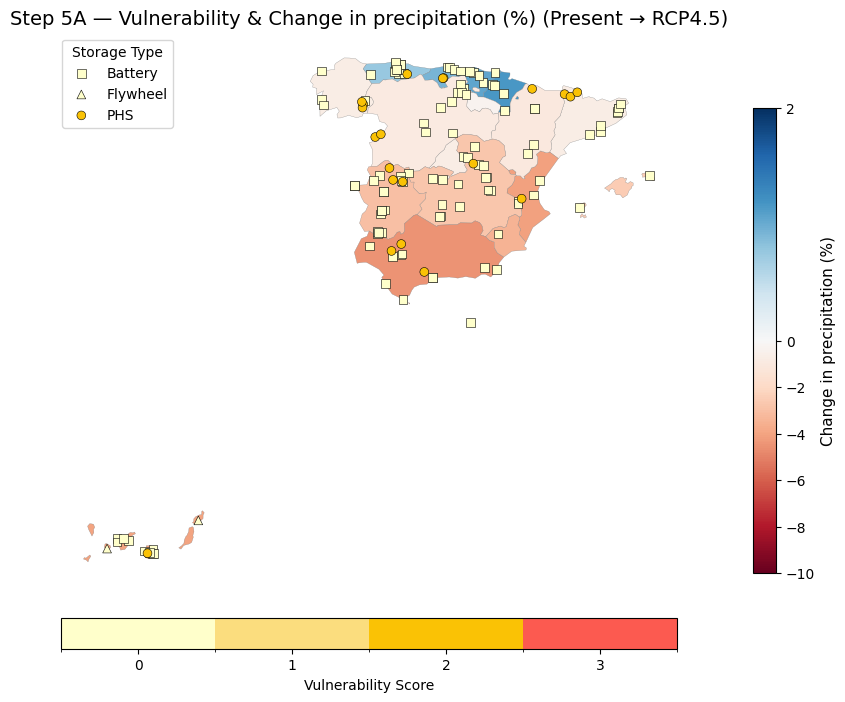

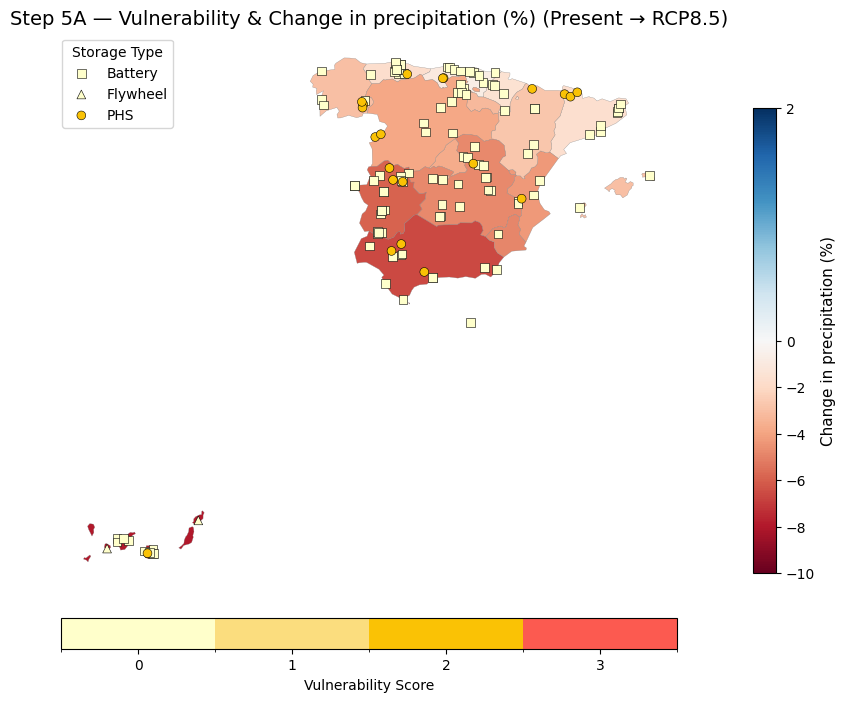

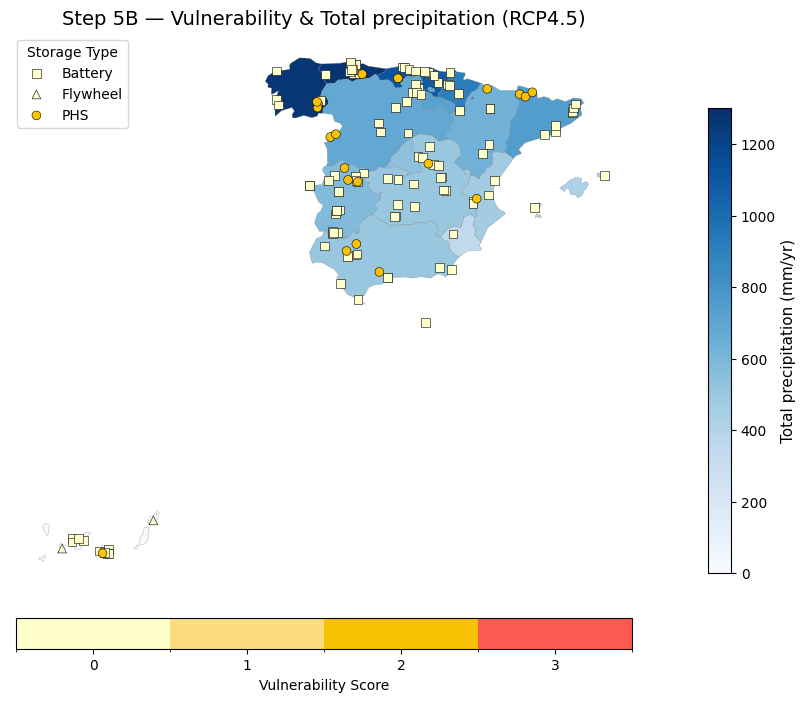

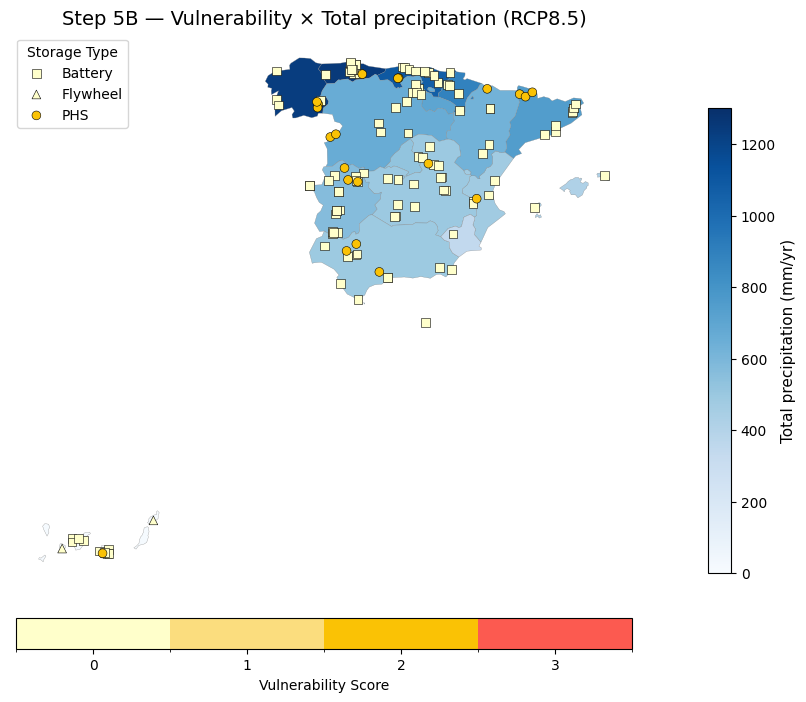

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability precipitation"

PRECIP_CHANGE45 = "Precipitation change RCP4.5"
PRECIP_CHANGE85 = "Precipitation change RCP8.5"
PRECIPCURRENT_COL = "Precipitation 1991-2020 hazard strength"
PRECIP45 = "Precipitation 2011-2040 hazard strength RCP4.5"
PRECIP85 = "Precipitation 2011-2040 hazard strength RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[PRECIP_CHANGE45] = regions_bg["NUTS_NAME"].map(
    precip_change45_dict
)
regions_bg[PRECIP_CHANGE85] = regions_bg["NUTS_NAME"].map(
    precip_change85_dict
)
regions_bg[PRECIP45] = regions_bg["NUTS_NAME"].map(
    precip_future45_dict
)
regions_bg[PRECIP85] = regions_bg["NUTS_NAME"].map(
    precip_future85_dict
)

# =========================================================
# 3. Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)

    # Choose background colormap
    if "change" in bg_col.lower():
        cmap_bg = matplotlib.colormaps.get_cmap("RdBu")
    else:
        cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.TwoSlopeNorm(vmin=-10, vcenter=0, vmax=2)
      bg_label = "Change in precipitation (%)"
    else:
      norm_bg = mcolors.Normalize(vmin=0,vmax=1300)
      bg_label = "Total precipitation (mm/yr)"


    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
    )

    return fig, ax


# =========================================================
# GENERATE MAPS
# =========================================================

fig_87, ax_87 = plot_step5_optionA(
    PRECIP_CHANGE45,
    "Step 5A — Vulnerability & Change in precipitation (%) (Present → RCP4.5)"
)

fig_88, ax_88 = plot_step5_optionA(
    PRECIP_CHANGE85,
    "Step 5A — Vulnerability & Change in precipitation (%) (Present → RCP8.5)"
)

fig_89, ax_89 = plot_step5_optionA(
    PRECIP45,
    "Step 5B — Vulnerability & Total precipitation (RCP4.5)"
)

fig_90, ax_90 = plot_step5_optionA(
    PRECIP85,
    "Step 5B — Vulnerability × Total precipitation (RCP8.5)"
)


In [ ]:
save_figure(fig_87, "Vulnerability & Change in low precipitation days (Present → RCP4.5).jpg")
save_figure(fig_88, "Vulnerability & Change in low precipitation days (Present → RCP8.5).jpg")
save_figure(fig_89, "Vulnerability & Total precipitation (RCP4.5).jpg")
save_figure(fig_90, "Vulnerability & Total precipitation (RCP8.5).jpg")

Saved: Vulnerability & Change in low precipitation days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in low precipitation days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Total precipitation (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Total precipitation (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

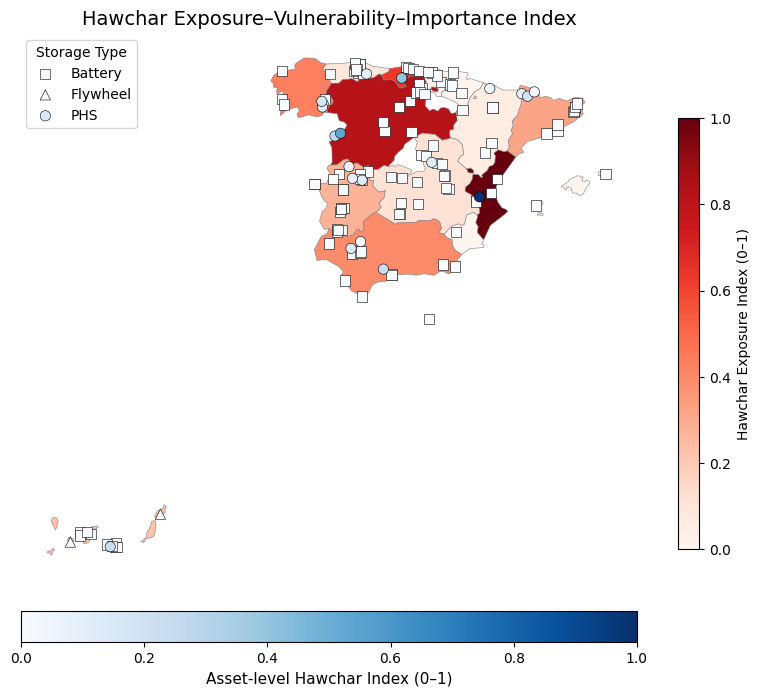

In [ ]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability precipitation"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])


def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

# --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )
    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_86, ax_86 = plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)

In [ ]:
save_figure(fig_86, "Hawchar Index total precipitation.jpg")

Saved: Hawchar Index total precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# HAWCHAR INDEX — REGIONAL SUMMARY TABLE
# =========================================================

# -------------------------------
# 1. Base regional Hawchar values
# -------------------------------
hawchar_table = (
    data
    .groupby(REGION_COL)
    .agg(
        Hawchar_Absolute=("Hawchar_abs", "sum"),
        Max_Asset_Hawchar=("Hawchar_rel", "max"),
        Total_Exposure=("Exposure", "sum"),
        Asset_Count=("Hawchar_abs", "count")
    )
    .reset_index()
)

# -------------------------------
# 2. Normalise absolute Hawchar (0–1)
# -------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

hawchar_table["Hawchar_Relative"] = normalize(
    hawchar_table["Hawchar_Absolute"]
)

# -------------------------------
# 3. Final formatting
# -------------------------------
hawchar_table = (
    hawchar_table
    .rename(columns={REGION_COL: "Region"})
    .sort_values("Hawchar_Relative", ascending=False)
    .reset_index(drop=True)
)

hawchar_table

,Region,Hawchar_Absolute,Max_Asset_Hawchar,Total_Exposure,Asset_Count,Hawchar_Relative
0,Comunitat Valenciana,90702.0,1.000000,16070.10,5,1.000000
1,Castilla y León,74310.0,0.535821,14143.90,12,0.819276
2,Cantabria,57660.0,0.396904,10077.90,6,0.635708
3,Galicia,39540.0,0.171330,6641.50,7,0.435933
4,Andalucía,35798.4,0.238142,7575.29,13,0.394681
5,Cataluña,29220.0,0.191771,6671.70,11,0.322154
6,Extremadura,25176.0,0.119071,7760.26,22,0.277568
7,Canarias,21000.0,0.231527,3734.09,12,0.231527
8,Castilla-La Mancha,10560.0,0.116425,3769.26,17,0.116425
9,Principado de Asturias,7980.0,0.087980,3593.91,12,0.087980


Storage type,Battery,Flywheel,PHS
Region,,,
Andalucía,0.0,0.0,6.0
Aragón,0.0,0.0,2.0
Canarias,0.0,0.0,2.0
Cantabria,0.0,0.0,4.0
Castilla y León,0.0,0.0,4.0
Castilla-La Mancha,0.0,0.0,2.0
Cataluña,0.0,0.0,6.0
Ciudad de Melilla,0.0,0.0,0.0
Comunidad Foral de Navarra,0.0,0.0,0.0


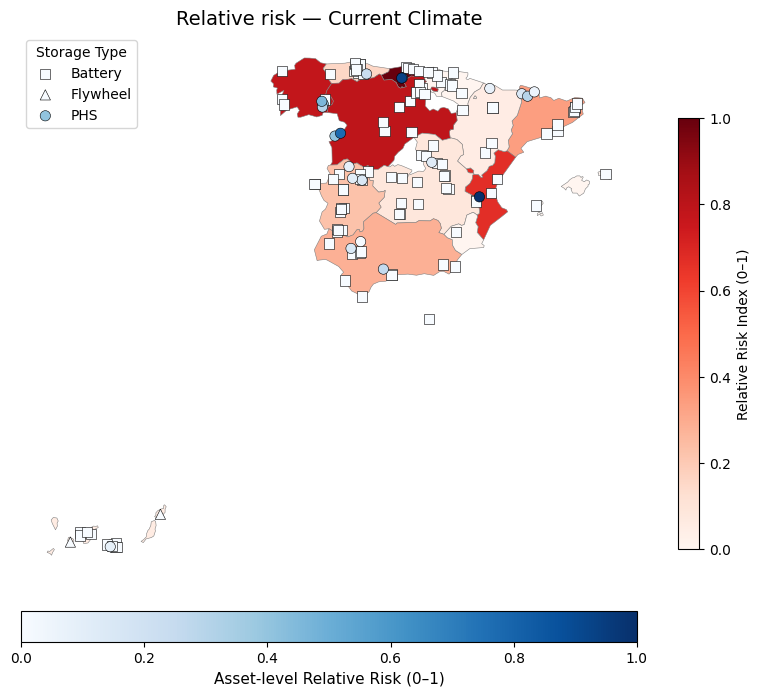

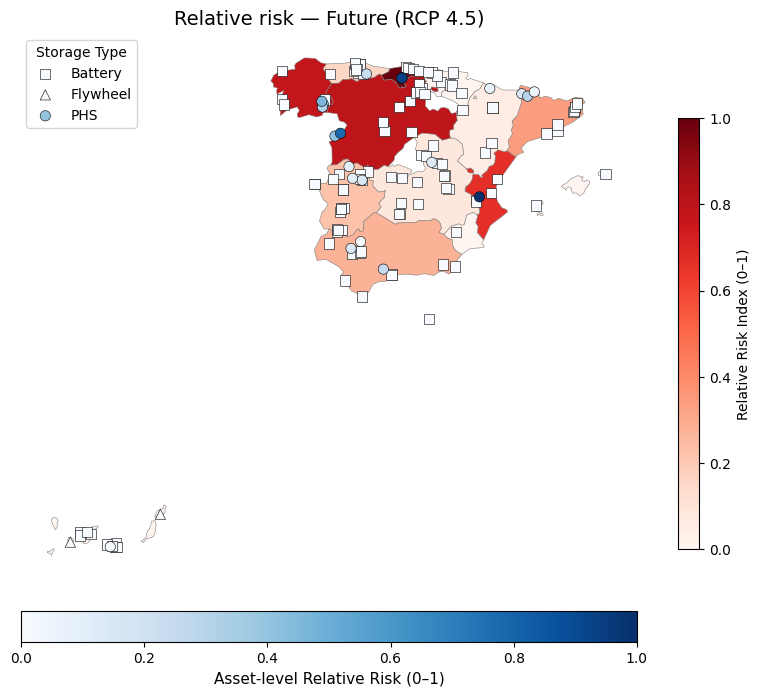

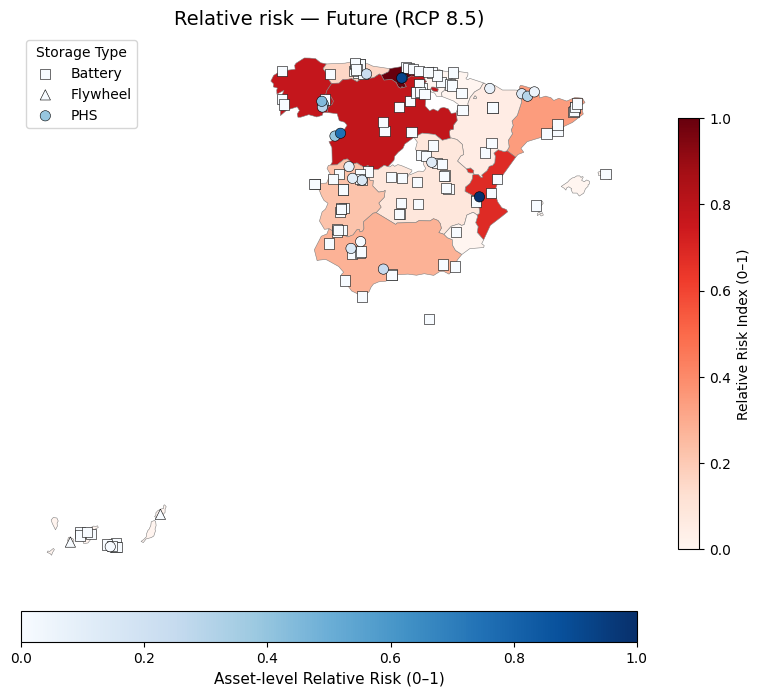

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability precipitation"

HAZARDCURRENT_COL = "Precipitation 1991-2020"
HAZARD45_COL     = "Precipitation 2011-2040 RCP4.5"
HAZARD85_COL     = "Precipitation 2011-2040 RCP8.5"

# ---------------------------------------------------------
# Precipitation vulnerability applies ONLY to PHS
# ---------------------------------------------------------
data[VULN_COL] = data[VULN_COL].astype(float)

data.loc[data[ASSET_TYPE_COL] != "PHS", VULN_COL] = 0.0

data.groupby([REGION_COL, ASSET_TYPE_COL])[VULN_COL].sum().unstack(fill_value=0)

display(
    data
    .groupby([REGION_COL, ASSET_TYPE_COL])[VULN_COL]
    .sum()
    .unstack(fill_value=0)
)

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

#Precipitation into scarcity hazard

def precipitation_to_hazard(series):
    vmin = series.min()
    vmax = series.max()

    if vmax == vmin:
        return pd.Series(0, index=series.index)

    return (vmax - series) / (vmax - vmin)
data["Hazard_current"] = precipitation_to_hazard(data[HAZARDCURRENT_COL])
data["Hazard_45"]      = precipitation_to_hazard(data[HAZARD45_COL])
data["Hazard_85"]      = precipitation_to_hazard(data[HAZARD85_COL])

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)


region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize_01(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize_01(region_risk["Risk_current_abs"])
region_risk["Risk45_region_rel"]      = normalize_01(region_risk["Risk_45_abs"])
region_risk["Risk85_region_rel"]      = normalize_01(region_risk["Risk_85_abs"])

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize_01(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize_01(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize_01(data["Risk_85_abs"])

# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# Define regions_risk_gdf before using it in plot_risk_map
regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_91, ax_91 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_92, ax_92 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_93, ax_93 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)

In [ ]:
save_figure(fig_91, "Relative risk — Current Climate.jpg")
save_figure(fig_92, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_93, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

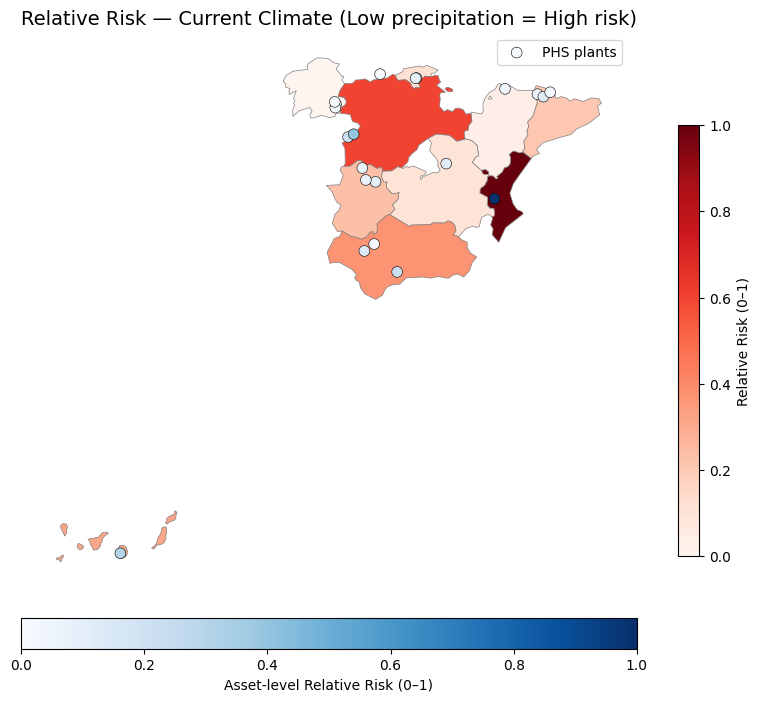

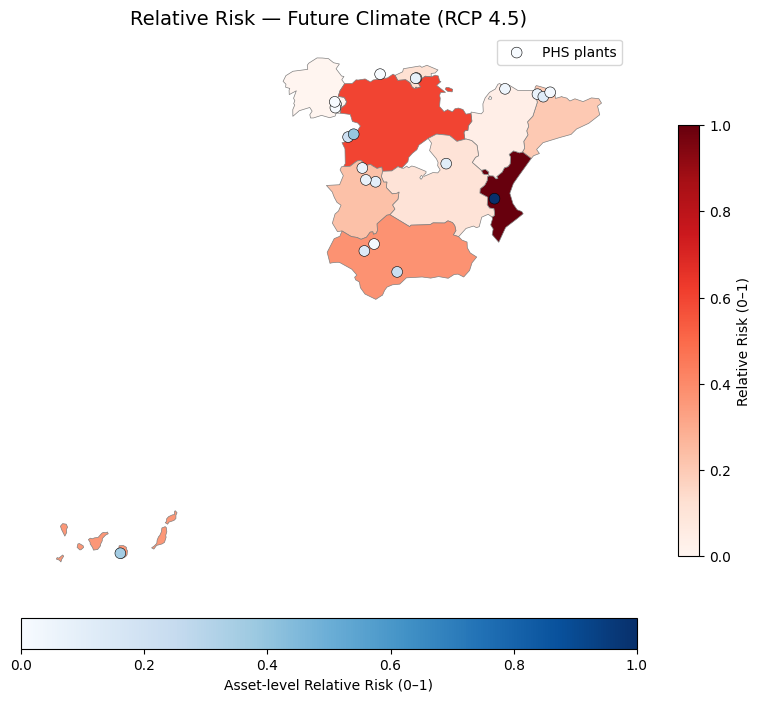

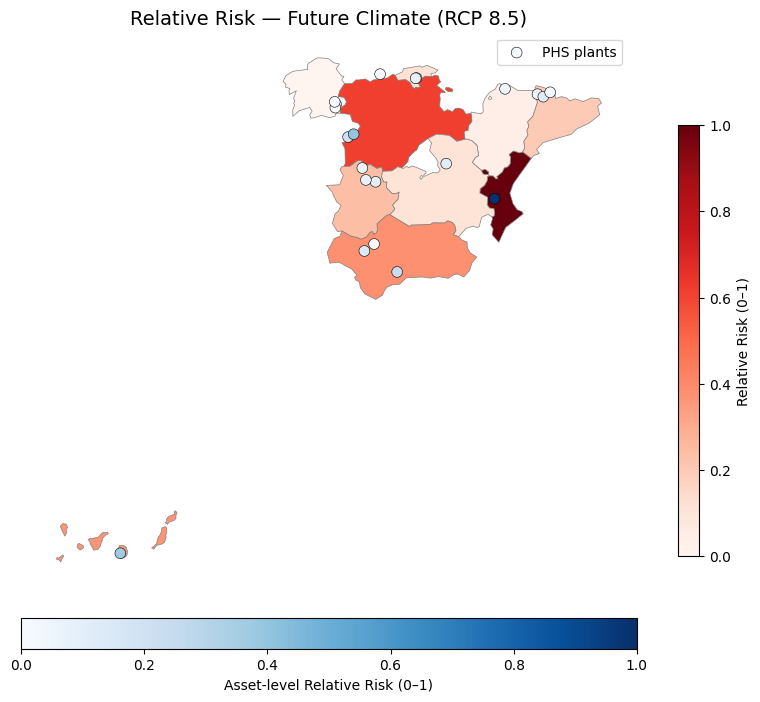

                        Region  Has_PHS  Riskcurrent_region_rel
9         Comunitat Valenciana     True                1.000000
4              Castilla y León     True                0.602976
0                    Andalucía     True                0.373596
2                     Canarias     True                0.312875
10                 Extremadura     True                0.235044
6                     Cataluña     True                0.210004
3                    Cantabria     True                0.124936
5           Castilla-La Mancha     True                0.107594
1                       Aragón     True                0.042219
11                     Galicia     True                0.000000
7            Ciudad de Melilla    False                     NaN
8   Comunidad Foral de Navarra    False                     NaN
12               Illes Balears    False                     NaN
13                  País Vasco    False                     NaN
14      Principado de Asturias    False 

,Exposure
Region,
Comunitat Valenciana,15117.0
Castilla y León,12385.0
Cantabria,9610.0
Galicia,6590.0
Andalucía,5966.4
Cataluña,4870.0
Extremadura,4196.0
Canarias,3500.0
Castilla-La Mancha,1760.0


In [ ]:
# =========================================================
# RELATIVE RISK RANKING MAP — PRECIPITATION SCARCITY
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability precipitation"

HAZARDCURRENT_COL = "Precipitation 1991-2020"
HAZARD45_COL     = "Precipitation 2011-2040 RCP4.5"
HAZARD85_COL     = "Precipitation 2011-2040 RCP8.5"

# =========================================================
# 0. Vulnerability applies ONLY to PHS
# =========================================================
data[VULN_COL] = data[VULN_COL].astype(float)
data.loc[data[ASSET_TYPE_COL] != "PHS", VULN_COL] = 0.0

# =========================================================
# 1. Exposure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# =========================================================
# 2. Convert precipitation → scarcity hazard
#    LOW precipitation = HIGH hazard
# =========================================================
def precipitation_to_hazard(series):
    vmin = series.min()
    vmax = series.max()
    if vmax == vmin:
        return pd.Series(0.0, index=series.index)
    return (vmax - series) / (vmax - vmin)

data["Hazard_current"] = precipitation_to_hazard(data[HAZARDCURRENT_COL])
data["Hazard_45"]      = precipitation_to_hazard(data[HAZARD45_COL])
data["Hazard_85"]      = precipitation_to_hazard(data[HAZARD85_COL])

# =========================================================
# 3. ABSOLUTE RISK
# Risk = Hazard × Vulnerability × Exposure × Importance
# =========================================================
data["Risk_current_abs"] = (
    data["Hazard_current"]
    * data[VULN_COL]
    * data["Exposure"]
    * data[IMPORTANCE_COL]
)

data["Risk_45_abs"] = (
    data["Hazard_45"]
    * data[VULN_COL]
    * data["Exposure"]
    * data[IMPORTANCE_COL]
)

data["Risk_85_abs"] = (
    data["Hazard_85"]
    * data[VULN_COL]
    * data["Exposure"]
    * data[IMPORTANCE_COL]
)

# =========================================================
# 4. REGION-LEVEL aggregation (only PHS contributes)
# =========================================================
region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

region_risk["Has_PHS"] = (
    region_risk[["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]]
    .sum(axis=1) > 0
)

# =========================================================
# 5. NORMALISATION FUNCTIONS
# =========================================================
def normalize_01(s):
    s = s.astype(float)
    mask = s > 0
    out = pd.Series(0.0, index=s.index)

    if mask.sum() == 0:
        return out

    vmin = s[mask].min()
    vmax = s[mask].max()

    if vmax == vmin:
        out[mask] = 1.0
        return out

    out[mask] = (s[mask] - vmin) / (vmax - vmin)
    return out

def normalize_masked(values, mask):
    out = pd.Series(float("nan"), index=values.index)

    if mask.sum() == 0:
        return out

    vmin = values[mask].min()
    vmax = values[mask].max()

    if vmax == vmin:
        out[mask] = 1.0
        return out

    out[mask] = (values[mask] - vmin) / (vmax - vmin)
    return out

# =========================================================
# 6. Relative risk (assets + regions)
# =========================================================
data["Riskcurrent_rel"] = normalize_01(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize_01(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize_01(data["Risk_85_abs"])

region_risk["Riskcurrent_region_rel"] = normalize_masked(
    region_risk["Risk_current_abs"], region_risk["Has_PHS"]
)
region_risk["Risk45_region_rel"] = normalize_masked(
    region_risk["Risk_45_abs"], region_risk["Has_PHS"]
)
region_risk["Risk85_region_rel"] = normalize_masked(
    region_risk["Risk_85_abs"], region_risk["Has_PHS"]
)

# =========================================================
# 7. GeoDataFrames
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 8. MAP FUNCTION (REGIONS + PHS ASSETS)
# =========================================================
def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Region background ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.5,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk (0–1)",
            "shrink": 0.7
        }
    )

    # --- PHS assets ---
    phs = points[points[ASSET_TYPE_COL] == "PHS"]
    norm = mcolors.Normalize(
        vmin=phs[point_col].min(),
        vmax=phs[point_col].max()
    )

    ax.scatter(
        phs.geometry.x,
        phs.geometry.y,
        c=phs[point_col],
        cmap="Blues",
        norm=norm,
        s=60,
        edgecolor="black",
        linewidth=0.4,
        zorder=5,
        label="PHS plants"
    )

    sm = cm.ScalarMappable(norm=norm, cmap="Blues")
    fig.colorbar(
        sm, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)")

    ax.set_title(title, fontsize=14)
    ax.legend()
    ax.axis("off")

    plt.show()

    return fig, ax

# =========================================================
# 9. GENERATE MAPS
# =========================================================
fig_91, ax_91 = plot_risk_map(
    "Riskcurrent_region_rel",
    "Riskcurrent_rel",
    "Relative Risk — Current Climate (Low precipitation = High risk)"
)

fig_92, ax_92 = plot_risk_map(
    "Risk45_region_rel",
    "Risk45_rel",
    "Relative Risk — Future Climate (RCP 4.5)"
)

fig_93, ax_93 = plot_risk_map(
    "Risk85_region_rel",
    "Risk85_rel",
    "Relative Risk — Future Climate (RCP 8.5)"
)

print(
    region_risk[
        ["Region", "Has_PHS", "Riskcurrent_region_rel"]
    ]
    .sort_values("Riskcurrent_region_rel", ascending=False)
)

print(
    data[data["Risk_current_abs"] > 0][
        [REGION_COL, ASSET_TYPE_COL, "Risk_current_abs"]
    ]
    .sort_values("Risk_current_abs", ascending=False)
)

display(
    data[data[ASSET_TYPE_COL] == "PHS"]
    .groupby(REGION_COL)["Exposure"]
    .sum()
    .sort_values(ascending=False)
)


In [ ]:
save_figure(fig_91, "Relative risk — Current Climate.jpg")
save_figure(fig_92, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_93, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

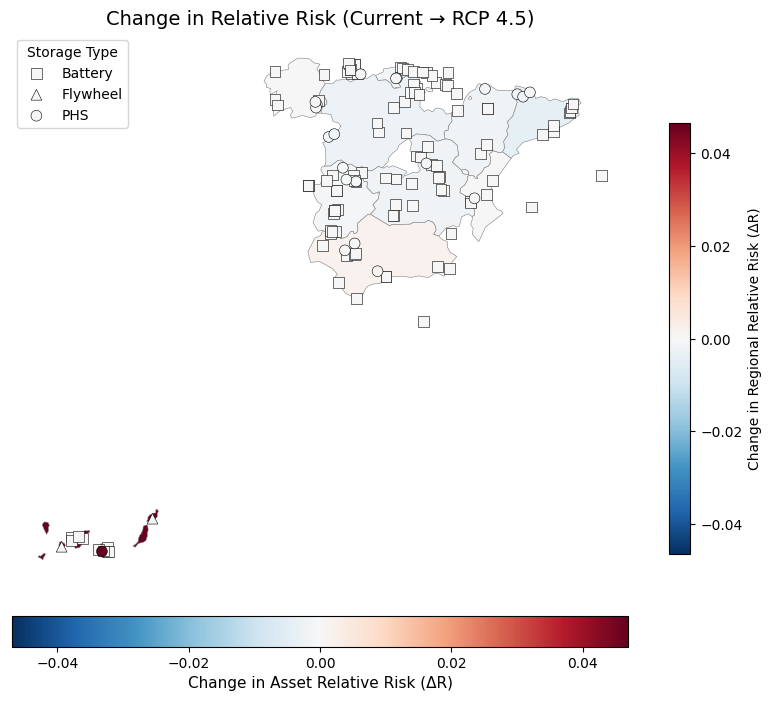

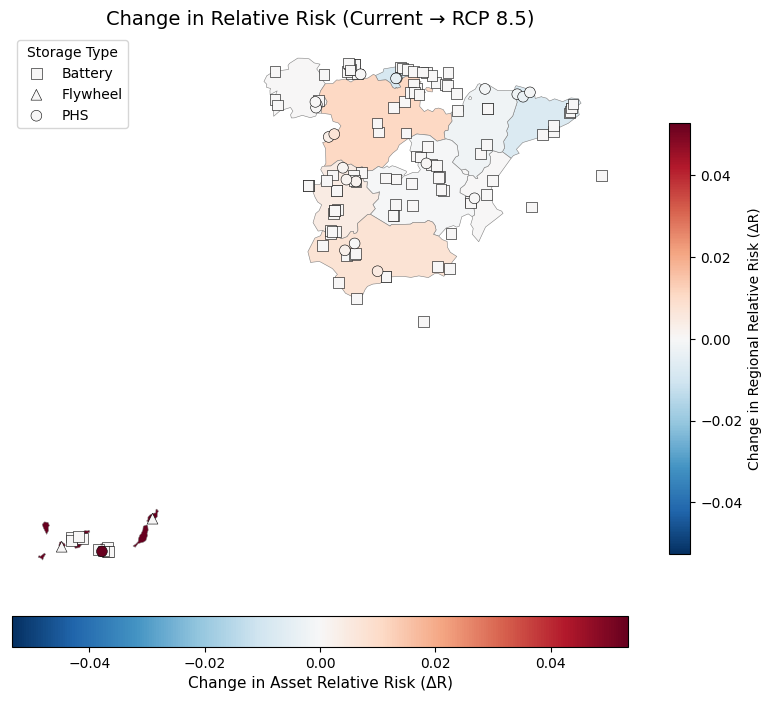

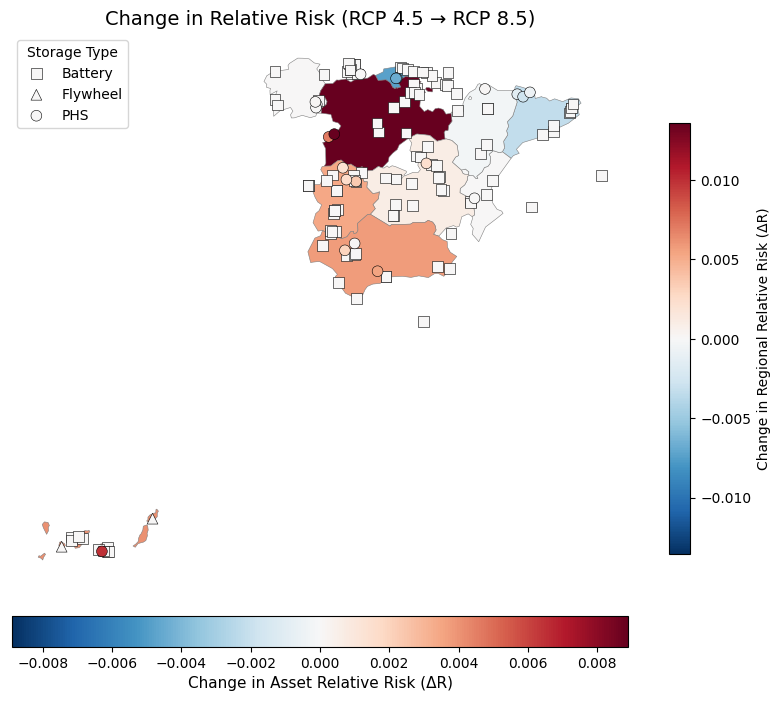

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_94, ax_94 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_95, ax_95 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_96, ax_96 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_94, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_95, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_96, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Comunitat Valenciana,66332.253258,57746.686788,56719.997649,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
1,Castilla y León,40139.038547,34814.721726,34975.045637,0.602976,0.600238,0.613802,-0.002738,0.010827,0.013565
2,Andalucía,25005.948215,21918.975143,21877.348127,0.373596,0.375432,0.381183,0.001836,0.007587,0.005751
3,Canarias,21000.000000,21000.000000,21000.000000,0.312875,0.359412,0.365601,0.046537,0.052726,0.006189
4,Extremadura,15865.142694,13810.537617,13890.432087,0.235044,0.234081,0.239333,-0.000962,0.004289,0.005251
5,Cataluña,14213.214854,12186.812730,11811.498817,0.210004,0.205776,0.202410,-0.004229,-0.007594,-0.003366
6,Cantabria,8600.907904,7477.312864,6961.415324,0.124936,0.123677,0.116271,-0.001259,-0.008665,-0.007406
7,Castilla-La Mancha,7456.816435,6447.585608,6427.044519,0.107594,0.105726,0.106780,-0.001868,-0.000814,0.001054
8,Aragón,3143.790385,2699.723385,2666.062141,0.042219,0.040392,0.039984,-0.001828,-0.002235,-0.000408
9,Galicia,358.419839,382.697565,414.746279,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Precipitation 1991-2020,Precipitation 1991-2020 hazard strength,Vulnerability precipitation,Precipitation change RCP4.5,Precipitation change RCP8.5,Precipitation 2011-2040 RCP4.5,Precipitation 2011-2040 hazard strength RCP4.5,Precipitation 2011-2040 RCP8.5,Precipitation 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,15.50,0.00,0.00,0.00,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,20.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,5.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,1290.50,0,2,-0.72,-2.99,1265.69,0,1232.80,0,0.0,2280.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,1290.50,0,2,-0.72,-2.99,1265.69,0,1232.80,0,0.0,215.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,1290.50,0,2,-0.72,-2.99,1265.69,0,1232.80,0,0.0,263.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,11.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,1300.64,0,0,0.75,-1.78,1277.94,0,1245.74,0,0.0,800.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,1300.64,0,0,0.75,-1.78,1277.94,0,1245.74,0,0.0,46.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,1300.64,0,0,0.75,-1.78,1277.94,0,1245.74,0,0.0,60.00,0.00,0.00,0.00,0.000000,0.000000,0.000000


# Final maps

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Final_maps.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Final_maps.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Input data

In [ ]:
#HOT DAYS >35C

#Hot days above 35°C 1991-2020 for each region
hot_days_35_present_dict = {
    "Galicia": 0.4,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.02,
    "País Vasco": 0.16,
    "Comunidad Foral de Navarra": 3.59,
    "La Rioja": 2.14,
    "Aragón": 6.82,
    "Cataluña": 2.14,
    "Comunitat Valenciana": 3.04,
    "Región de Murcia": 5.8,
    "Andalucía": 17.13,
    "Castilla-La Mancha": 14.12,
    "Castilla y León": 1.94,
    "Comunidad de Madrid": 11.53,
    "Extremadura": 21.32,
    "Canarias": 0.02,
    "Illes Balears": 0.11,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 2.47,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 1991-2020"] = data["Region"].map(hot_days_35_present_dict)

#Hot days above 35C 2011-2040 RCP4.5 for each region
hot_days_35_future45_dict = {
    "Galicia": 0.19,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.05,
    "País Vasco": 0.38,
    "Comunidad Foral de Navarra": 4.83,
    "La Rioja": 2.99,
    "Aragón": 8.94,
    "Cataluña": 2.92,
    "Comunitat Valenciana": 4.31,
    "Región de Murcia": 8.7,
    "Andalucía": 20.73,
    "Castilla-La Mancha": 18.91,
    "Castilla y León": 3.58,
    "Comunidad de Madrid": 16.52,
    "Extremadura": 26.69,
    "Canarias": 0.0,
    "Illes Balears": 0.26,
    "Ciudad de Ceuta": 0.01,
    "Ciudad de Melilla": 3.84,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 2011-2040 RCP4.5"] = data["Region"].map(hot_days_35_future45_dict)

#Hot days above 35C 2011-2040 RCP8.5 for each region
hot_days_35_future85_dict = {
    "Galicia": 0.18,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.05,
    "País Vasco": 0.43,
    "Comunidad Foral de Navarra": 5.15,
    "La Rioja": 3.28,
    "Aragón": 9.53,
    "Cataluña": 3.09,
    "Comunitat Valenciana": 4.76,
    "Región de Murcia": 9.26,
    "Andalucía": 22.75,
    "Castilla-La Mancha": 20.78,
    "Castilla y León": 4.13,
    "Comunidad de Madrid": 18.2,
    "Extremadura": 29.83,
    "Canarias": 0.0,
    "Illes Balears": 0.29,
    "Ciudad de Ceuta": 0.02,
    "Ciudad de Melilla": 3.97,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 2011-2040 RCP8.5"] = data["Region"].map(hot_days_35_future85_dict)

In [ ]:
#FROST DAYS

#Frost days 1991-2020 for each region
frost_days_present_dict = {
    "Galicia": 13.6,
    "Principado de Asturias": 21.41,
    "Cantabria": 19.7,
    "País Vasco": 14.4,
    "Comunidad Foral de Navarra": 27.84,
    "La Rioja": 40.51,
    "Aragón": 47.51,
    "Cataluña": 42.84,
    "Comunitat Valenciana": 14.59,
    "Región de Murcia": 8.83,
    "Andalucía": 9.39,
    "Castilla-La Mancha": 29.95,
    "Castilla y León": 40.87,
    "Comunidad de Madrid": 36.81,
    "Extremadura": 8.99,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 1991-2020"] = data["Region"].map(frost_days_present_dict)

#Frost days 2011-2040 RCP4.5 for each region
frost_days_future45_dict = {
    "Galicia": 10.89,
    "Principado de Asturias": 17.97,
    "Cantabria": 16.18,
    "País Vasco": 11.89,
    "Comunidad Foral de Navarra": 23.52,
    "La Rioja": 34.71,
    "Aragón": 41.05,
    "Cataluña": 37.75,
    "Comunitat Valenciana": 12.30,
    "Región de Murcia": 7.43,
    "Andalucía": 7.96,
    "Castilla-La Mancha": 25.96,
    "Castilla y León": 34.17,
    "Comunidad de Madrid": 32.27,
    "Extremadura": 7.15,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 2011-2040 RCP4.5"] = data["Region"].map(frost_days_future45_dict)

#Frost days 2011-2040 RCP8.5 for each region
frost_days_future85_dict = {
    "Galicia": 10.58,
    "Principado de Asturias": 17.52,
    "Cantabria": 15.8,
    "País Vasco": 11.69,
    "Comunidad Foral de Navarra": 22.74,
    "La Rioja": 33.86,
    "Aragón": 39.84,
    "Cataluña": 36.57,
    "Comunitat Valenciana": 11.76,
    "Región de Murcia": 7.07,
    "Andalucía": 7.47,
    "Castilla-La Mancha": 24.99,
    "Castilla y León": 33.57,
    "Comunidad de Madrid": 31.17,
    "Extremadura": 6.59,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 2011-2040 RCP8.5"] = data["Region"].map(frost_days_future85_dict)

In [ ]:
#HEATWAVE DAYS

#Heatwave days 1991-2020 for each region
heatwave_days_present_dict = {
    "Galicia": 6.27,
    "Principado de Asturias": 4.99,
    "Cantabria": 4.7,
    "País Vasco": 4.65,
    "Comunidad Foral de Navarra": 5.41,
    "La Rioja": 5.2,
    "Aragón": 6.4,
    "Cataluña": 7.06,
    "Comunitat Valenciana": 5.39,
    "Región de Murcia": 5.66,
    "Andalucía": 6.0,
    "Castilla-La Mancha": 6.6,
    "Castilla y León": 6.39,
    "Comunidad de Madrid": 7.05,
    "Extremadura": 6.94,
    "Canarias": 0.0,
    "Illes Balears": 5.9,
    "Ciudad de Ceuta": 5.14,
    "Ciudad de Melilla": 3.99,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 1991-2020"] = data["Region"].map(heatwave_days_present_dict)

#Heatwave days 2011-2040 RCP4.5 for each region
heatwave_days_future45_dict = {
    "Galicia": 9.41,
    "Principado de Asturias": 7.11,
    "Cantabria": 6.61,
    "País Vasco": 6.74,
    "Comunidad Foral de Navarra": 8.79,
    "La Rioja": 8.71,
    "Aragón": 11.54,
    "Cataluña": 13.0,
    "Comunitat Valenciana": 10.09,
    "Región de Murcia": 10.09,
    "Andalucía": 10.02,
    "Castilla-La Mancha": 11.48,
    "Castilla y León": 10.01,
    "Comunidad de Madrid": 11.44,
    "Extremadura": 10.32,
    "Canarias": 0.0,
    "Illes Balears": 9.86,
    "Ciudad de Ceuta": 7.9,
    "Ciudad de Melilla": 6.42,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 2011-2040 RCP4.5"] = data["Region"].map(heatwave_days_future45_dict)

#Heatwave days 2011-2040 RCP8.5 for each region
heatwave_days_future85_dict = {
    "Galicia": 8.95,
    "Principado de Asturias": 6.46,
    "Cantabria": 6.29,
    "País Vasco": 6.43,
    "Comunidad Foral de Navarra": 9.17,
    "La Rioja": 9.46,
    "Aragón": 13.48,
    "Cataluña": 14.5,
    "Comunitat Valenciana": 11.74,
    "Región de Murcia": 11.4,
    "Andalucía": 12.13,
    "Castilla-La Mancha": 13.52,
    "Castilla y León": 10.87,
    "Comunidad de Madrid": 13.3,
    "Extremadura": 11.63,
    "Canarias": 0.0,
    "Illes Balears": 10.68,
    "Ciudad de Ceuta": 9.13,
    "Ciudad de Melilla": 6.23,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 2011-2040 RCP8.5"] = data["Region"].map(heatwave_days_future85_dict)


In [ ]:
#CONSECUTIVE DRY DAYS

#Dry days 1991-2020 for each region
dry_days_present_dict = {
    "Galicia": 23.95,
    "Principado de Asturias": 16.69,
    "Cantabria": 16.51,
    "País Vasco": 16.26,
    "Comunidad Foral de Navarra": 22.05,
    "La Rioja": 22.19,
    "Aragón": 27.57,
    "Cataluña": 27.92,
    "Comunitat Valenciana": 39.36,
    "Región de Murcia": 52.54,
    "Andalucía": 63.92,
    "Castilla-La Mancha": 40.8,
    "Castilla y León": 30.34,
    "Comunidad de Madrid": 39.41,
    "Extremadura": 52.75,
    "Canarias": 131.13,
    "Illes Balears": 55.69,
    "Ciudad de Ceuta": 81.95,
    "Ciudad de Melilla": 83.8,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 1991-2020"] = data["Region"].map(dry_days_present_dict)

#Dry days 2011-2040 RCP4.5 for each region
dry_days_future45_dict = {
    "Galicia": 24.94,
    "Principado de Asturias": 16.91,
    "Cantabria": 17.34,
    "País Vasco": 18.34,
    "Comunidad Foral de Navarra": 23.76,
    "La Rioja": 23.54,
    "Aragón": 30.22,
    "Cataluña": 29.73,
    "Comunitat Valenciana": 42.25,
    "Región de Murcia": 56.66,
    "Andalucía": 66.83,
    "Castilla-La Mancha": 45.14,
    "Castilla y León": 33.09,
    "Comunidad de Madrid": 43.78,
    "Extremadura": 59.22,
    "Canarias": 14.62,
    "Illes Balears": 58.94,
    "Ciudad de Ceuta": 77.6,
    "Ciudad de Melilla": 78.28,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 2011-2040 RCP4.5"] = data["Region"].map(dry_days_future45_dict)

#Dry days 2011-2040 RCP8.5 for each region
dry_days_future85_dict = {
    "Galicia": 25.42,
    "Principado de Asturias": 16.84,
    "Cantabria": 17.09,
    "País Vasco": 17.98,
    "Comunidad Foral de Navarra": 23.64,
    "La Rioja": 23.28,
    "Aragón": 29.89,
    "Cataluña": 29.39,
    "Comunitat Valenciana": 41.44,
    "Región de Murcia": 56.77,
    "Andalucía": 67.76,
    "Castilla-La Mancha": 45.9,
    "Castilla y León": 33.98,
    "Comunidad de Madrid": 44.35,
    "Extremadura": 60.27,
    "Canarias": 15.3,
    "Illes Balears": 57.56,
    "Ciudad de Ceuta": 77.55,
    "Ciudad de Melilla": 76.54,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 2011-2040 RCP8.5"] = data["Region"].map(dry_days_future85_dict)

In [ ]:
#METEOROLOGICAL DROUGHT DURATION

#Drought months 1991-2020 for each region
drought_months_present_dict = {
    "Galicia": 1.9,
    "Principado de Asturias": 1.67,
    "Cantabria": 1.71,
    "País Vasco": 1.67,
    "Comunidad Foral de Navarra": 1.87,
    "La Rioja": 1.83,
    "Aragón": 2.1,
    "Cataluña": 2.0,
    "Comunitat Valenciana": 2.04,
    "Región de Murcia": 1.94,
    "Andalucía": 2.0,
    "Castilla-La Mancha": 2.06,
    "Castilla y León": 2.05,
    "Comunidad de Madrid": 2.11,
    "Extremadura": 2.14,
    "Canarias": 1.89,
    "Illes Balears": 5.9,
    "Ciudad de Ceuta": 2.09,
    "Ciudad de Melilla": 2.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 1991-2020"] = data["Region"].map(drought_months_present_dict)

#Drought months 2011-2040 RCP4.5 for each region
drought_months_future45_dict = {
    "Galicia": 2.05,
    "Principado de Asturias": 2.02,
    "Cantabria": 2.09,
    "País Vasco": 2.1,
    "Comunidad Foral de Navarra": 2.02,
    "La Rioja": 2.19,
    "Aragón": 2.18,
    "Cataluña": 2.06,
    "Comunitat Valenciana": 2.43,
    "Región de Murcia": 2.51,
    "Andalucía": 2.46,
    "Castilla-La Mancha": 2.31,
    "Castilla y León": 2.22,
    "Comunidad de Madrid": 2.16,
    "Extremadura": 2.24,
    "Canarias": 0.21,
    "Illes Balears": 2.11,
    "Ciudad de Ceuta": 2.58,
    "Ciudad de Melilla": 2.84,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 2011-2040 RCP4.5"] = data["Region"].map(drought_months_future45_dict)

#Drought months 2011-2040 RCP8.5 for each region
drought_months_future85_dict = {
    "Galicia": 2.32,
    "Principado de Asturias": 2.20,
    "Cantabria": 2.2,
    "País Vasco": 2.13,
    "Comunidad Foral de Navarra": 2.31,
    "La Rioja": 2.48,
    "Aragón": 2.48,
    "Cataluña": 2.31,
    "Comunitat Valenciana": 2.61,
    "Región de Murcia": 2.73,
    "Andalucía": 2.67,
    "Castilla-La Mancha": 2.65,
    "Castilla y León": 2.5,
    "Comunidad de Madrid": 2.55,
    "Extremadura": 2.63,
    "Canarias": 0.28,
    "Illes Balears": 2.1,
    "Ciudad de Ceuta": 2.73,
    "Ciudad de Melilla": 2.88,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 2011-2040 RCP8.5"] = data["Region"].map(drought_months_future85_dict)


In [ ]:
#EXTREME PRECIPITATION DAYS

#Extreme precipitation days above 1991-2020 for each region
extprecip_days_present_dict = {
    "Galicia": 7.42,
    "Principado de Asturias": 8.84,
    "Cantabria": 8.56,
    "País Vasco": 8.15,
    "Comunidad Foral de Navarra": 6.7,
    "La Rioja": 6.45,
    "Aragón": 5.02,
    "Cataluña": 5.2,
    "Comunitat Valenciana": 3.71,
    "Región de Murcia": 2.97,
    "Andalucía": 3.6,
    "Castilla-La Mancha": 4.22,
    "Castilla y León": 5.69,
    "Comunidad de Madrid": 4.54,
    "Extremadura": 3.98,
    "Canarias": 1.85,
    "Illes Balears": 3.47,
    "Ciudad de Melilla": 3.91,
    "Ciudad de Melilla": 2.87,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 1991-2020"] = data["Region"].map(extprecip_days_present_dict)

#Extreme precipitation days 2011-2040 RCP4.5 for each region
extprecip_days_future45_dict = {
    "Galicia": 7.44,
    "Principado de Asturias": 8.99,
    "Cantabria": 8.73,
    "País Vasco": 8.33,
    "Comunidad Foral de Navarra": 6.97,
    "La Rioja": 6.42,
    "Aragón": 4.97,
    "Cataluña": 5.28,
    "Comunitat Valenciana": 3.56,
    "Región de Murcia": 2.97,
    "Andalucía": 3.53,
    "Castilla-La Mancha": 4.21,
    "Castilla y León": 5.79,
    "Comunidad de Madrid": 4.77,
    "Extremadura": 4.0,
    "Canarias": 0.11,
    "Illes Balears": 3.35,
    "Ciudad de Ceuta": 3.79,
    "Ciudad de Melilla": 2.7,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 2011-2040 RCP4.5"] = data["Region"].map(extprecip_days_future45_dict)

#Extreme precipitation days 2011-2040 RCP8.5 for each region
extprecip_days_future85_dict = {
    "Galicia": 7.31,
    "Principado de Asturias": 8.54,
    "Cantabria": 8.37,
    "País Vasco": 7.93,
    "Comunidad Foral de Navarra": 4.93,
    "La Rioja": 5.94,
    "Aragón": 4.93,
    "Cataluña": 5.22,
    "Comunitat Valenciana": 3.55,
    "Región de Murcia": 2.87,
    "Andalucía": 3.4,
    "Castilla-La Mancha": 4.17,
    "Castilla y León": 5.48,
    "Comunidad de Madrid": 4.5,
    "Extremadura": 3.76,
    "Canarias": 0.1,
    "Illes Balears": 3.33,
    "Ciudad de Ceuta": 3.37,
    "Ciudad de Melilla": 2.5,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 2011-2040 RCP8.5"] = data["Region"].map(extprecip_days_future85_dict)

In [ ]:
#HIGH FIRE DANGER DAYS

#High fire danger days above 1991-2020 for each region
fire_days_present_dict = {
    "Galicia": 8.32,
    "Principado de Asturias": 0.66,
    "Cantabria": 4.36,
    "País Vasco": 3.64,
    "Comunidad Foral de Navarra": 29.23,
    "La Rioja": 24.14,
    "Aragón": 64.54,
    "Cataluña": 34.39,
    "Comunitat Valenciana": 81.02,
    "Región de Murcia": 121.8,
    "Andalucía": 109.96,
    "Castilla-La Mancha": 100.69,
    "Castilla y León": 51.57,
    "Comunidad de Madrid": 90.54,
    "Extremadura": 102.54,
    "Canarias": 83.23,
    "Illes Balears": 61.75,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 1991-2020"] = data["Region"].map(fire_days_present_dict)

#High fire danger days 2011-2040 RCP4.5 for each region
fire_days_future45_dict = {
    "Galicia": 10.14,
    "Principado de Asturias": 1.15,
    "Cantabria": 2.65,
    "País Vasco": 4.06,
    "Comunidad Foral de Navarra": 29.13,
    "La Rioja": 21.41,
    "Aragón": 59.81,
    "Cataluña": 33.26,
    "Comunitat Valenciana": 76.48,
    "Región de Murcia": 118.43,
    "Andalucía": 105.56,
    "Castilla-La Mancha": 93.5,
    "Castilla y León": 46.26,
    "Comunidad de Madrid": 83.1,
    "Extremadura": 99.75,
    "Illes Balears": 53.64,
    "Canarias": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 2011-2040 RCP4.5"] = data["Region"].map(fire_days_future45_dict)

#High fire danger days 2011-2040 RCP8.5 for each region
fire_days_future85_dict = {
    "Galicia": 11.3,
    "Principado de Asturias": 1.11,
    "Cantabria": 2.45,
    "País Vasco": 4.0,
    "Comunidad Foral de Navarra": 29.69,
    "La Rioja": 22.11,
    "Aragón": 60.51,
    "Cataluña": 32.78,
    "Comunitat Valenciana": 76.97,
    "Región de Murcia": 117.61,
    "Andalucía": 108.69,
    "Castilla-La Mancha": 95.64,
    "Castilla y León": 86.34,
    "Comunidad de Madrid": 84.5,
    "Extremadura": 103.43,
    "Illes Balears": 52.91,
    "Canarias": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 2011-2040 RCP8.5"] = data["Region"].map(fire_days_future85_dict)

In [ ]:
#TOTAL / LOW PRECIPITATION

#Precipitation 1991-2020 for each region
precip_present_dict = {
    "Galicia": 1290.5,
    "Principado de Asturias": 1300.64,
    "Cantabria": 1133.78,
    "País Vasco": 1090.03,
    "Comunidad Foral de Navarra": 904.33,
    "La Rioja": 729.39,
    "Aragón": 638.36,
    "Cataluña": 756.52,
    "Comunitat Valenciana": 482.57,
    "Región de Murcia": 356.52,
    "Andalucía": 519.26,
    "Castilla-La Mancha": 510.74,
    "Castilla y León": 696.41,
    "Comunidad de Madrid": 537.9,
    "Extremadura": 595.72,
    "Canarias": 182.02,
    "Illes Balears": 436.39,
    "Ciudad de Ceuta": 623.12,
    "Ciudad de Melilla": 349.5,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 1991-2020"] = data["Region"].map(precip_present_dict)

#Precipitation 2011-2040 RCP4.5 for each region
precip_future45_dict = {
    "Galicia": 1265.69,
    "Principado de Asturias": 1277.94,
    "Cantabria": 1113.81,
    "País Vasco": 1081.52,
    "Comunidad Foral de Navarra": 911.15,
    "La Rioja": 718.37,
    "Aragón": 634.45,
    "Cataluña": 750.07,
    "Comunitat Valenciana": 472.14,
    "Región de Murcia": 345.95,
    "Andalucía": 502.99,
    "Castilla-La Mancha": 505.17,
    "Castilla y León": 684.97,
    "Comunidad de Madrid": 538.42,
    "Extremadura": 583.65,
    "Canarias": 12.28,
    "Illes Balears": 419.53,
    "Ciudad de Ceuta": 597.95,
    "Ciudad de Melilla": 320.26,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 2011-2040 RCP4.5"] = data["Region"].map(precip_future45_dict)

#Precipitation 2011-2040 RCP8.5 for each region
precip_future85_dict = {
    "Galicia": 1232.8,
    "Principado de Asturias": 1245.74,
    "Cantabria": 1096.8,
    "País Vasco": 1065.86,
    "Comunidad Foral de Navarra": 890.7,
    "La Rioja": 702.7,
    "Aragón": 626.35,
    "Cataluña": 747.07,
    "Comunitat Valenciana": 474.29,
    "Región de Murcia": 343.51,
    "Andalucía": 491.83,
    "Castilla-La Mancha": 494.92,
    "Castilla y León": 665.11,
    "Comunidad de Madrid": 523.07,
    "Extremadura": 565.1,
    "Canarias": 12.1,
    "Illes Balears": 418.59,
    "Ciudad de Ceuta": 580.75,
    "Ciudad de Melilla": 313.36,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 2011-2040 RCP8.5"] = data["Region"].map(precip_future85_dict)

In [ ]:
# =========================================================
# BUILD MASTER REGIONAL HAZARD TABLE
# =========================================================

region_hazard = regions[["NUTS_NAME"]].rename(
    columns={"NUTS_NAME": "Region"}
).copy()

# Hot days
region_hazard["Hot days >35C 1991-2020"] = region_hazard["Region"].map(
    hot_days_35_present_dict
)
region_hazard["Hot days >35C 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    hot_days_35_future45_dict
)
region_hazard["Hot days >35C 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    hot_days_35_future85_dict
)

# Frost days
region_hazard["Frost days 1991-2020"] = region_hazard["Region"].map(
    frost_days_present_dict
)
region_hazard["Frost days 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    frost_days_future45_dict
)
region_hazard["Frost days 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    frost_days_future85_dict
)

#Heatwave days
region_hazard["Heatwave days 1991-2020"] = region_hazard["Region"].map(
    heatwave_days_present_dict
)
region_hazard["Heatwave days 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    heatwave_days_future45_dict
)
region_hazard["Heatwave days 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    heatwave_days_future85_dict
)

#Dry days
region_hazard["Dry days 1991-2020"] = region_hazard["Region"].map(
    dry_days_present_dict
)
region_hazard["Dry days 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    dry_days_future45_dict
)
region_hazard["Dry days 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    dry_days_future85_dict
)

#Drought months
region_hazard["Drought months 1991-2020"] = region_hazard["Region"].map(
    drought_months_present_dict
)
region_hazard["Drought months 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    drought_months_future45_dict
)
region_hazard["Drought months 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    drought_months_future85_dict
)

#Extreme precipitation days
region_hazard["Extreme precipitation days 1991-2020"] = region_hazard["Region"].map(
    extprecip_days_present_dict
)
region_hazard["Extreme precipitation days 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    extprecip_days_future45_dict
)
region_hazard["Extreme precipitation days 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    extprecip_days_future85_dict
)

#High fire danger days
region_hazard["High fire danger days 1991-2020"] = region_hazard["Region"].map(
    fire_days_present_dict
)
region_hazard["High fire danger days 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    fire_days_future45_dict
)
region_hazard["High fire danger days 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    fire_days_future85_dict
)

# Precipitation (scarcity logic later!)
region_hazard["Precipitation 1991-2020"] = region_hazard["Region"].map(
    precip_present_dict
)
region_hazard["Precipitation 2011-2040 RCP4.5"] = region_hazard["Region"].map(
    precip_future45_dict
)
region_hazard["Precipitation 2011-2040 RCP8.5"] = region_hazard["Region"].map(
    precip_future85_dict
)

print(region_hazard.isna().sum())
region_hazard.head()

Region                                         0
Hot days >35C 1991-2020                        0
Hot days >35C 2011-2040 RCP4.5                 0
Hot days >35C 2011-2040 RCP8.5                 0
Frost days 1991-2020                           0
Frost days 2011-2040 RCP4.5                    0
Frost days 2011-2040 RCP8.5                    0
Heatwave days 1991-2020                        0
Heatwave days 2011-2040 RCP4.5                 0
Heatwave days 2011-2040 RCP8.5                 0
Dry days 1991-2020                             0
Dry days 2011-2040 RCP4.5                      0
Dry days 2011-2040 RCP8.5                      0
Drought months 1991-2020                       0
Drought months 2011-2040 RCP4.5                0
Drought months 2011-2040 RCP8.5                0
Extreme precipitation days 1991-2020           1
Extreme precipitation days 2011-2040 RCP4.5    0
Extreme precipitation days 2011-2040 RCP8.5    0
High fire danger days 1991-2020                0
High fire danger day

,Region,Hot days >35C 1991-2020,Hot days >35C 2011-2040 RCP4.5,Hot days >35C 2011-2040 RCP8.5,Frost days 1991-2020,Frost days 2011-2040 RCP4.5,Frost days 2011-2040 RCP8.5,Heatwave days 1991-2020,Heatwave days 2011-2040 RCP4.5,Heatwave days 2011-2040 RCP8.5,...,Drought months 2011-2040 RCP8.5,Extreme precipitation days 1991-2020,Extreme precipitation days 2011-2040 RCP4.5,Extreme precipitation days 2011-2040 RCP8.5,High fire danger days 1991-2020,High fire danger days 2011-2040 RCP4.5,High fire danger days 2011-2040 RCP8.5,Precipitation 1991-2020,Precipitation 2011-2040 RCP4.5,Precipitation 2011-2040 RCP8.5
200,Cataluña,2.14,2.92,3.09,42.84,37.75,36.57,7.06,13.00,14.50,...,2.31,5.20,5.28,5.22,34.39,33.26,32.78,756.52,750.07,747.07
201,Comunitat Valenciana,3.04,4.31,4.76,14.59,12.30,11.76,5.39,10.09,11.74,...,2.61,3.71,3.56,3.55,81.02,76.48,76.97,482.57,472.14,474.29
348,Galicia,0.40,0.19,0.18,13.60,10.89,10.58,6.27,9.41,8.95,...,2.32,7.42,7.44,7.31,8.32,10.14,11.30,1290.50,1265.69,1232.80
349,Principado de Asturias,0.00,0.00,0.00,21.41,17.97,17.52,4.99,7.11,6.46,...,2.20,8.84,8.99,8.54,0.66,1.15,1.11,1300.64,1277.94,1245.74
350,Cantabria,0.02,0.05,0.05,19.70,16.18,15.80,4.70,6.61,6.29,...,2.20,8.56,8.73,8.37,4.36,2.65,2.45,1133.78,1113.81,1096.80


Plotting data

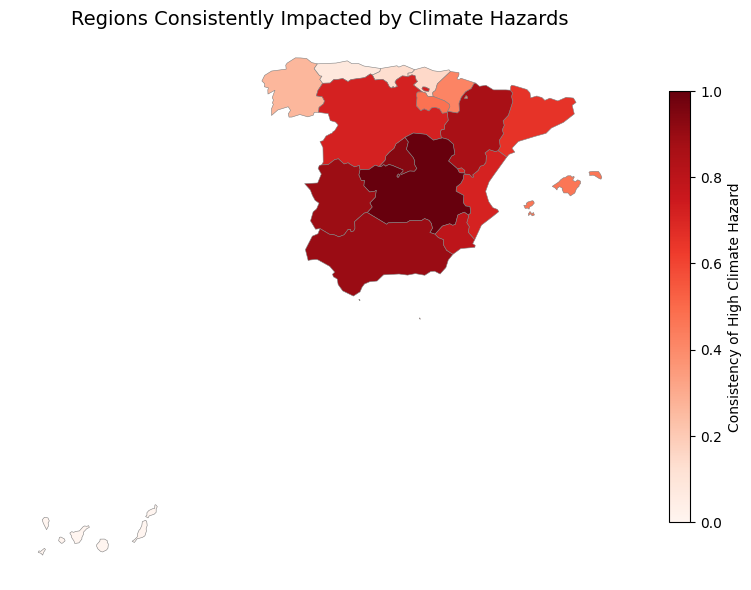

In [ ]:
# =========================================================
# SUMMARY MAP — REGIONS CONSISTENTLY IMPACTED
# =========================================================

REGION_COL = "Region"

HAZARD_COLS = [
    "Hot days >35C 1991-2020",
    "Hot days >35C 2011-2040 RCP4.5",
    "Hot days >35C 2011-2040 RCP8.5",
    "Frost days 1991-2020",
    "Frost days 2011-2040 RCP4.5",
    "Frost days 2011-2040 RCP8.5",
    "Heatwave days 1991-2020",
    "Heatwave days 2011-2040 RCP4.5",
    "Heatwave days 2011-2040 RCP8.5",
    "Dry days 1991-2020",
    "Dry days 2011-2040 RCP4.5",
    "Dry days 2011-2040 RCP8.5",
    "Drought months 1991-2020",
    "Drought months 2011-2040 RCP4.5",
    "Drought months 2011-2040 RCP8.5",
    "Extreme precipitation days 1991-2020",
    "Extreme precipitation days 2011-2040 RCP4.5",
    "Extreme precipitation days 2011-2040 RCP8.5",
    "High fire danger days 1991-2020",
    "High fire danger days 2011-2040 RCP4.5",
    "High fire danger days 2011-2040 RCP8.5",
]

PRECIP_COLS = [
    "Precipitation 1991-2020",
    "Precipitation 2011-2040 RCP4.5",
    "Precipitation 2011-2040 RCP8.5",
]

ALL_COLS = HAZARD_COLS + PRECIP_COLS

# ---------------------------------------------------------
# 1. Aggregate hazard to REGION level
# ---------------------------------------------------------
# Initialize region_hazard with region names from the `regions` GeoDataFrame
region_hazard = pd.DataFrame(regions["NUTS_NAME"].unique(), columns=[REGION_COL])

# Map all hazard data from the previously defined dictionaries to the region_hazard DataFrame
# Ensure all dictionaries used are available in the global scope (they are, as per kernel state)
hazard_dicts = {
    "Hot days >35C 1991-2020": hot_days_35_present_dict,
    "Hot days >35C 2011-2040 RCP4.5": hot_days_35_future45_dict,
    "Hot days >35C 2011-2040 RCP8.5": hot_days_35_future85_dict,
    "Frost days 1991-2020": frost_days_present_dict,
    "Frost days 2011-2040 RCP4.5": frost_days_future45_dict,
    "Frost days 2011-2040 RCP8.5": frost_days_future85_dict,
    "Heatwave days 1991-2020": heatwave_days_present_dict,
    "Heatwave days 2011-2040 RCP4.5": heatwave_days_future45_dict,
    "Heatwave days 2011-2040 RCP8.5": heatwave_days_future85_dict,
    "Dry days 1991-2020": dry_days_present_dict,
    "Dry days 2011-2040 RCP4.5": dry_days_future45_dict,
    "Dry days 2011-2040 RCP8.5": dry_days_future85_dict,
    "Drought months 1991-2020": drought_months_present_dict,
    "Drought months 2011-2040 RCP4.5": drought_months_future45_dict,
    "Drought months 2011-2040 RCP8.5": drought_months_future85_dict,
    "Extreme precipitation days 1991-2020": extprecip_days_present_dict,
    "Extreme precipitation days 2011-2040 RCP4.5": extprecip_days_future45_dict,
    "Extreme precipitation days 2011-2040 RCP8.5": extprecip_days_future85_dict,
    "High fire danger days 1991-2020": fire_days_present_dict,
    "High fire danger days 2011-2040 RCP4.5": fire_days_future45_dict,
    "High fire danger days 2011-2040 RCP8.5": fire_days_future85_dict,
    "Precipitation 1991-2020": precip_present_dict,
    "Precipitation 2011-2040 RCP4.5": precip_future45_dict,
    "Precipitation 2011-2040 RCP8.5": precip_future85_dict,
}

for col_name, hazard_dict_value in hazard_dicts.items():
    region_hazard[col_name] = region_hazard[REGION_COL].map(hazard_dict_value)

# Number of regions WITH DATA
n_regions = region_hazard.shape[0]

# ---------------------------------------------------------
# 2. Convert hazards to RISK SCORES
# ---------------------------------------------------------
risk_cols = []

for col in ALL_COLS:

    if col in PRECIP_COLS:
        # Lower precipitation = higher risk
        raw_rank = region_hazard[col].rank(ascending=True, method="average")
    else:
        # Higher hazard = higher risk
        raw_rank = region_hazard[col].rank(ascending=False, method="average")

    # Invert rank so higher = riskier
    region_hazard[col + "_risk"] = n_regions - raw_rank + 1
    risk_cols.append(col + "_risk")

# ---------------------------------------------------------
# 3. Consistency score across ALL indicators & scenarios
# ---------------------------------------------------------
region_hazard["ConsistencyScore"] = region_hazard[risk_cols].sum(axis=1)

region_hazard["Consistency_norm"] = (
    (region_hazard["ConsistencyScore"] - region_hazard["ConsistencyScore"].min()) /
    (region_hazard["ConsistencyScore"].max() - region_hazard["ConsistencyScore"].min())
)

# ---------------------------------------------------------
# 4. Merge with geometry
# ---------------------------------------------------------
regions_consistency = regions.merge(
    region_hazard,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. Plot
# ---------------------------------------------------------
fig_130, ax_130 = plt.subplots(figsize=(10, 8))

regions_consistency.plot(
    column="Consistency_norm",
    cmap="Reds",
    edgecolor="grey",
    linewidth=0.4,
    legend=True,
    missing_kwds={
        "color": "lightgrey",
        "label": "No hazard data"
    },
    legend_kwds={
        "label": "Consistency of High Climate Hazard",
        "shrink": 0.7
    },
    ax=ax_130
)

ax_130.set_title(
    "Regions Consistently Impacted by Climate Hazards",
    fontsize=14
)
ax_130.axis("off")
plt.show()

In [ ]:
save_figure(fig_130, "Regions consistently impacted by Climate Hazards.jpg")

Saved: Regions consistently impacted by Climate Hazards.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# TABLE — REGIONAL RISK SCORES BY CLIMATE HAZARD
# =========================================================

# Keep only risk-score columns + summary
risk_table = region_hazard[
    [REGION_COL]
    + risk_cols
    + ["ConsistencyScore", "Consistency_norm"]
].copy()

# Sort by overall consistency (same order as map)
risk_table = risk_table.sort_values(
    "ConsistencyScore",
    ascending=False
)

# Round for readability
risk_table[risk_cols] = risk_table[risk_cols].round(0)
risk_table["Consistency_norm"] = risk_table["Consistency_norm"].round(3)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

risk_table


,Region,Hot days >35C 1991-2020_risk,Hot days >35C 2011-2040 RCP4.5_risk,Hot days >35C 2011-2040 RCP8.5_risk,Frost days 1991-2020_risk,Frost days 2011-2040 RCP4.5_risk,Frost days 2011-2040 RCP8.5_risk,Heatwave days 1991-2020_risk,Heatwave days 2011-2040 RCP4.5_risk,Heatwave days 2011-2040 RCP8.5_risk,Dry days 1991-2020_risk,Dry days 2011-2040 RCP4.5_risk,Dry days 2011-2040 RCP8.5_risk,Drought months 1991-2020_risk,Drought months 2011-2040 RCP4.5_risk,Drought months 2011-2040 RCP8.5_risk,Extreme precipitation days 1991-2020_risk,Extreme precipitation days 2011-2040 RCP4.5_risk,Extreme precipitation days 2011-2040 RCP8.5_risk,High fire danger days 1991-2020_risk,High fire danger days 2011-2040 RCP4.5_risk,High fire danger days 2011-2040 RCP8.5_risk,Precipitation 1991-2020_risk,Precipitation 2011-2040 RCP4.5_risk,Precipitation 2011-2040 RCP8.5_risk,ConsistencyScore,Consistency_norm
11,Castilla-La Mancha,17.0,17.0,17.0,14.0,14.0,14.0,16.0,17.0,18.0,12.0,13.0,13.0,14.0,14.0,15.0,9.0,9.0,9.0,16.0,16.0,16.0,14.0,13.0,13.0,340.0,1.000
9,Comunidad de Madrid,16.0,16.0,16.0,15.0,15.0,15.0,18.0,16.0,16.0,11.0,12.0,12.0,17.0,9.0,12.0,10.0,10.0,10.0,15.0,15.0,14.0,12.0,12.0,12.0,326.0,0.935
14,Andalucía,18.0,18.0,18.0,7.0,7.0,7.0,12.0,12.0,15.0,16.0,17.0,17.0,10.0,16.0,16.0,6.0,5.0,6.0,18.0,18.0,18.0,13.0,14.0,14.0,318.0,0.898
12,Extremadura,19.0,19.0,19.0,6.0,5.0,5.0,17.0,15.0,13.0,14.0,16.0,16.0,18.0,13.0,14.0,8.0,8.0,8.0,17.0,17.0,17.0,11.0,11.0,11.0,317.0,0.893
8,Aragón,15.0,15.0,15.0,19.0,19.0,19.0,15.0,18.0,17.0,7.0,9.0,9.0,16.0,10.0,10.0,11.0,11.0,12.0,12.0,13.0,12.0,9.0,9.0,9.0,310.0,0.860
15,Región de Murcia,14.0,14.0,14.0,5.0,6.0,6.0,10.0,14.0,12.0,13.0,14.0,14.0,8.0,17.0,18.0,4.0,3.0,3.0,19.0,19.0,19.0,17.0,17.0,17.0,296.0,0.795
10,Castilla y León,8.0,10.0,11.0,17.0,16.0,16.0,14.0,11.0,11.0,9.0,10.0,10.0,13.0,12.0,11.0,13.0,13.0,14.0,10.0,11.0,15.0,8.0,8.0,8.0,279.0,0.716
1,Comunitat Valenciana,12.0,12.0,12.0,10.0,10.0,10.0,8.0,14.0,14.0,10.0,11.0,11.0,12.0,15.0,13.0,7.0,6.0,7.0,13.0,14.0,13.0,15.0,15.0,15.0,278.5,0.714
0,Cataluña,10.0,8.0,8.0,18.0,18.0,18.0,19.0,19.0,19.0,8.0,8.0,8.0,10.0,5.0,6.0,12.0,12.0,13.0,9.0,10.0,10.0,6.0,6.0,6.0,266.0,0.656
7,La Rioja,10.0,9.0,9.0,16.0,17.0,17.0,7.0,7.0,9.0,5.0,5.0,5.0,4.0,11.0,10.0,14.0,14.0,15.0,7.0,8.0,8.0,7.0,7.0,7.0,227.0,0.474


In [ ]:
# =========================================================
# SUMMARY MAP 2 — ASSETS CONSISTENTLY AT HIGH RISK
# =========================================================

import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Total absolute risk per asset
# ---------------------------------------------------------
risk_cols = [
    "Risk_current_abs",
    "Risk_45_abs",
    "Risk_85_abs"
]

asset_risk = (
    data
    .groupby("Asset_ID")[risk_cols]
    .sum()
    .sum(axis=1)
    .rename("TotalAbsoluteRisk")
    .reset_index()
)

# ---------------------------------------------------------
# 2. Merge back to assets
# ---------------------------------------------------------
assets = data.drop_duplicates("Asset_ID").merge(
    asset_risk,
    on="Asset_ID",
    how="left"
)

assets_gdf = gpd.GeoDataFrame(
    assets,
    geometry=gpd.points_from_xy(assets["lon"], assets["lat"]),
    crs="EPSG:4326"
)

assets_gdf["Risk_norm"] = (
    (assets_gdf["TotalAbsoluteRisk"] - assets_gdf["TotalAbsoluteRisk"].min()) /
    (assets_gdf["TotalAbsoluteRisk"].max() - assets_gdf["TotalAbsoluteRisk"].min())
)

# ---------------------------------------------------------
# 3. Plot
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8))

regions.plot(
    color="#f2f2f2",
    edgecolor="grey",
    ax=ax
)

assets_gdf.plot(
    column="Risk_norm",
    cmap="Blues",
    markersize=60,
    legend=True,
    legend_kwds={
        "label": "Consistency of High Asset-Level Risk",
        "shrink": 0.7
    },
    ax=ax
)

ax.set_title(
    "Storage Assets Consistently Ranked at High Climate Risk",
    fontsize=14
)
ax.axis("off")
plt.show()


KeyError: 'Asset_ID'

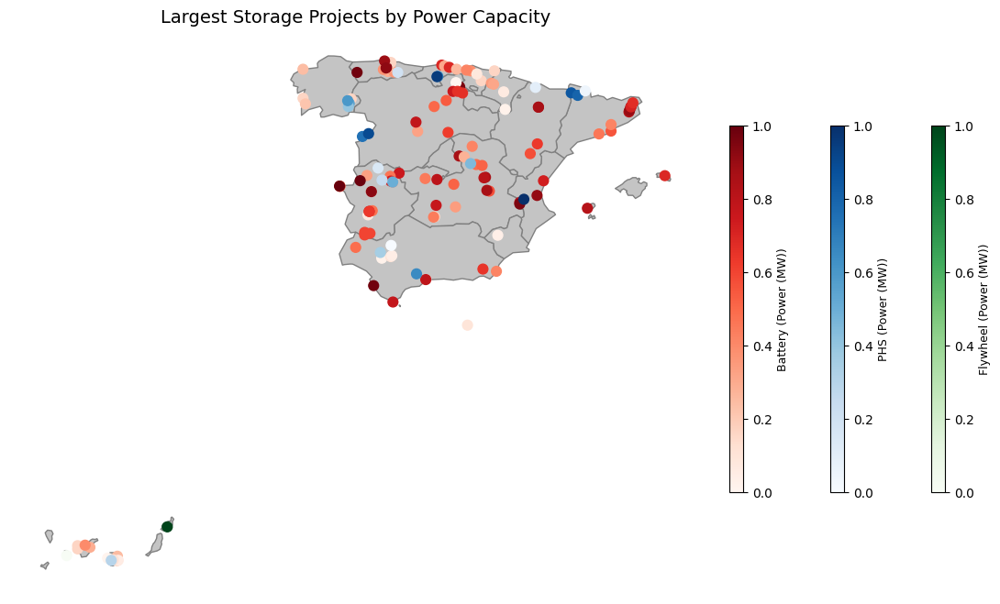

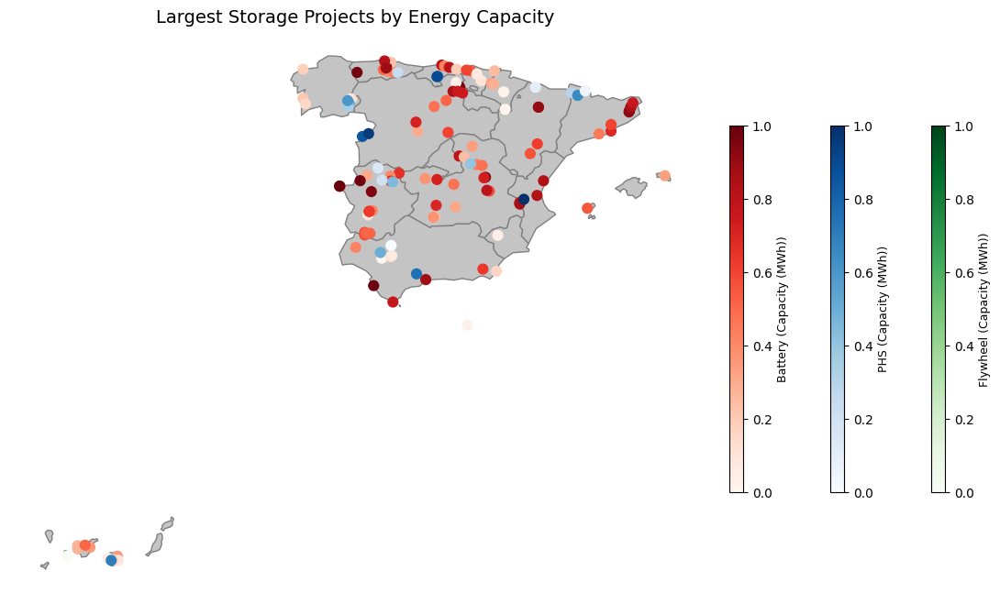

In [ ]:
# =========================================================
# SUMMARY MAP 3 — LARGEST STORAGE PROJECTS BY TECHNOLOGY
# =========================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd

def plot_size_map(size_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))
    regions.plot(color="#c4c4c4", edgecolor="grey", ax=ax)

    techs = {
        "Battery": "Reds",
        "PHS": "Blues",
        "Flywheel": "Greens"
    }

    for i, (tech, cmap_name) in enumerate(techs.items()):
        subset = data[data["Storage type"] == tech].copy()

        if subset.empty:
            continue

        subset["rank"] = subset[size_col].rank(pct=True)

        gdf = gpd.GeoDataFrame(
            subset,
            geometry=gpd.points_from_xy(subset["lon"], subset["lat"]),
            crs="EPSG:4326"
        )

        gdf.plot(
            column="rank",
            cmap=cmap_name,
            markersize=60,
            ax=ax
        )

        sm = mpl.cm.ScalarMappable(
            cmap=cmap_name,
            norm=mpl.colors.Normalize(vmin=0, vmax=1)
        )
        sm.set_array([])

        cax = fig.add_axes([0.92 + i*0.11, 0.25, 0.015, 0.5])
        cb = plt.colorbar(sm, cax=cax)
        cb.set_label(f"{tech} ({size_col})", fontsize=9)

    ax.set_title(title, fontsize=14)
    ax.axis("off")
    plt.show()

# ---------------------------------------------------------
# Generate maps
# ---------------------------------------------------------
plot_size_map("Power (MW)", "Largest Storage Projects by Power Capacity")
plot_size_map("Capacity (MWh)", "Largest Storage Projects by Energy Capacity")


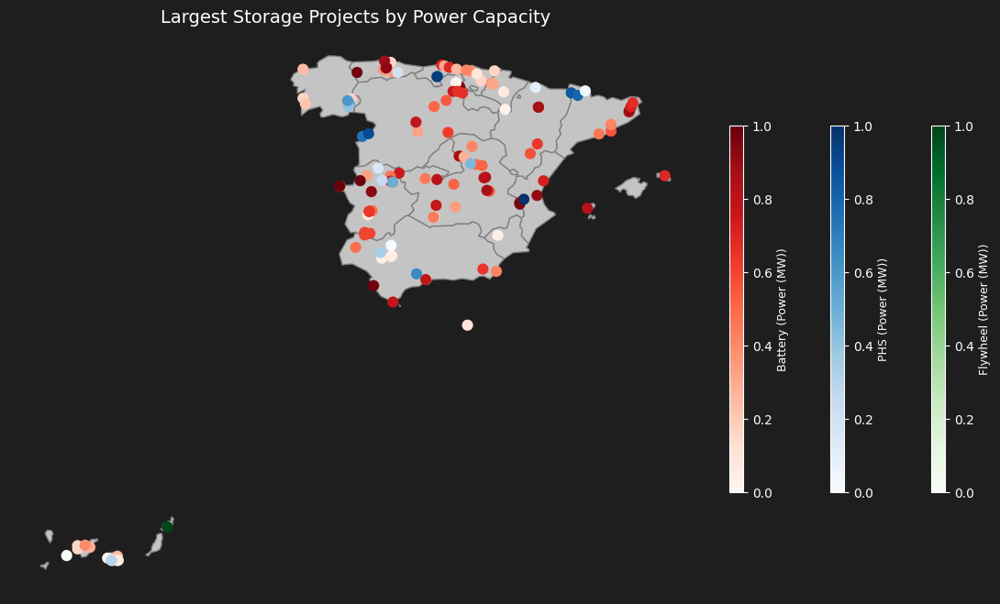

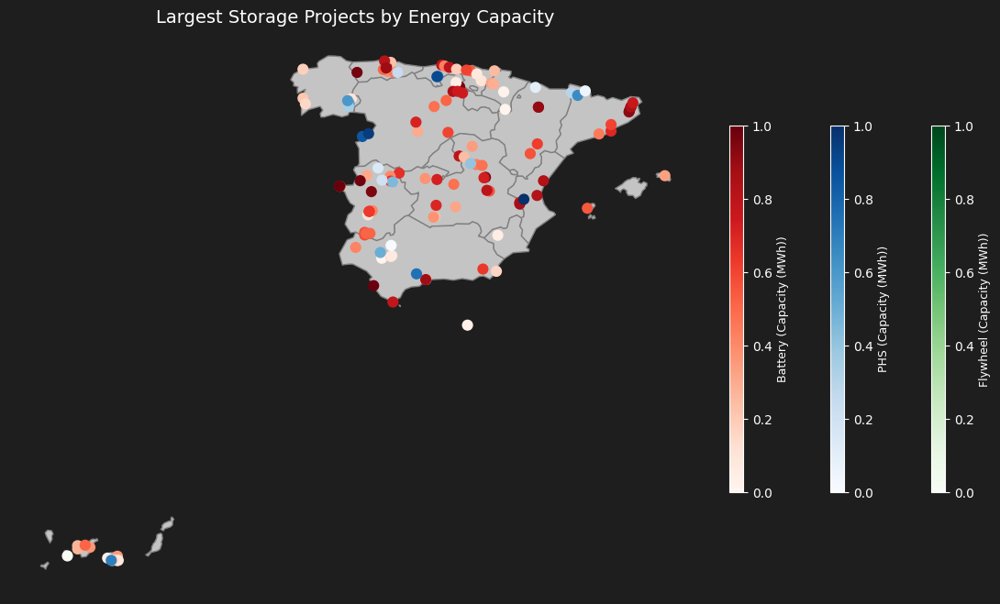

In [ ]:
# =========================================================
# SUMMARY MAP 3 — LARGEST STORAGE PROJECTS BY TECHNOLOGY (relative rank)
# =========================================================
import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd

def plot_size_map(size_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    fig.patch.set_facecolor("#1e1e1e")   # figure background
    ax.set_facecolor("black")          # axes background

    regions.plot(color="#c4c4c4", edgecolor="grey", ax=ax)

    techs = {
        "Battery": "Reds",
        "PHS": "Blues",
        "Flywheel": "Greens"
    }

    for i, (tech, cmap_name) in enumerate(techs.items()):
        subset = data[data["Storage type"] == tech].copy()

        if subset.empty:
            continue

        subset["rank"] = subset[size_col].rank(pct=True)

        gdf = gpd.GeoDataFrame(
            subset,
            geometry=gpd.points_from_xy(subset["lon"], subset["lat"]),
            crs="EPSG:4326"
        )

        gdf.plot(
            column="rank",
            cmap=cmap_name,
            markersize=60,
            ax=ax
        )

        sm = mpl.cm.ScalarMappable(
            cmap=cmap_name,
            norm=mpl.colors.Normalize(vmin=0, vmax=1)
        )
        sm.set_array([])

        cax = fig.add_axes([0.92 + i*0.11, 0.25, 0.015, 0.5])
        cb = plt.colorbar(sm, cax=cax)
        cb.set_label(f"{tech} ({size_col})", fontsize=9)

        # Make colourbar text readable on black
        cb.ax.yaxis.set_tick_params(labelcolor="white", color="white")
        cb.ax.yaxis.label.set_color("white")
        for spine in cb.ax.spines.values():
            spine.set_edgecolor("white")

    ax.set_title(title, fontsize=14, color="white")
    ax.axis("off")
    plt.show()

    return fig, ax

# ---------------------------------------------------------
# Generate maps
# ---------------------------------------------------------
fig_131, ax_131 = plot_size_map("Power (MW)", "Largest Storage Projects by Power Capacity")
fig_132, ax_132 = plot_size_map("Capacity (MWh)", "Largest Storage Projects by Energy Capacity")

In [ ]:
save_figure(fig_131, "Largest_Storage_Projects_by_Power_Capacity (relative).jpg")

Saved: Largest_Storage_Projects_by_Power_Capacity (relative).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
save_figure(fig_132, "Largest_Storage_Projects_by_Energy_Capacity (relative).jpg")

Saved: Largest_Storage_Projects_by_Energy_Capacity (relative).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

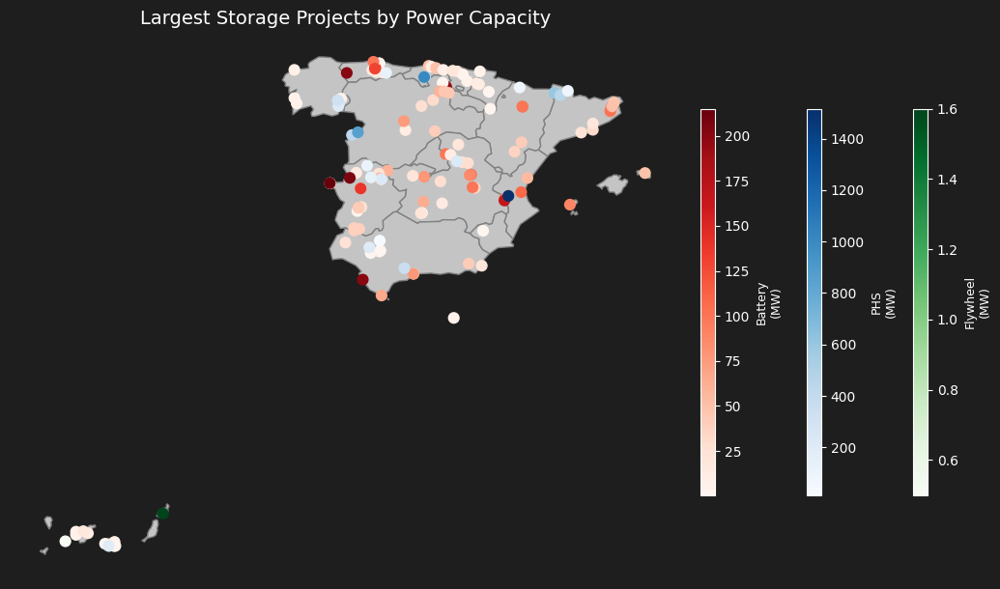

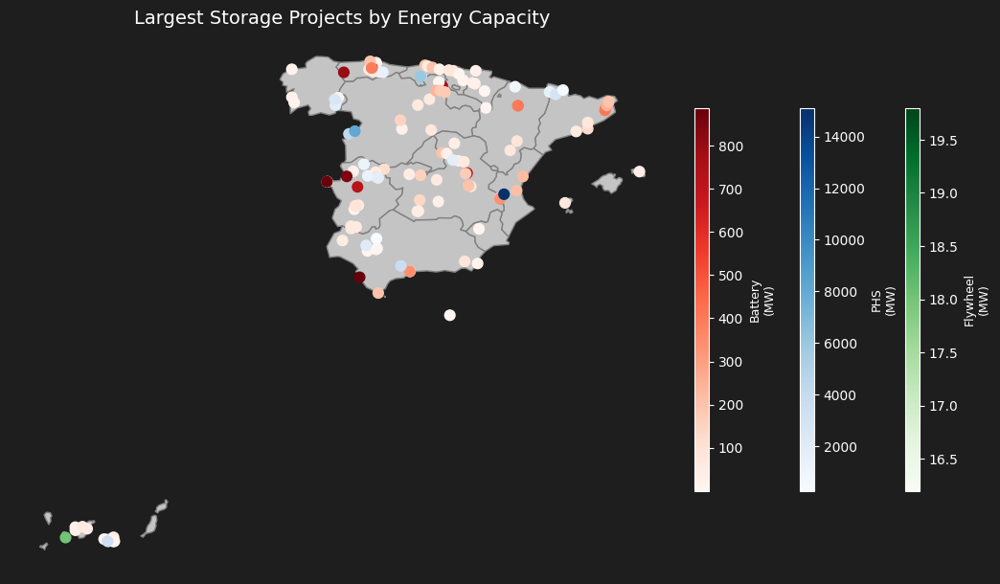

In [ ]:
# =========================================================
# SUMMARY MAP 3 — LARGEST STORAGE PROJECTS BY TECHNOLOGY (absolute rank)
# =========================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd

def plot_size_map(size_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # BLACK BACKGROUND
    # --------------------------------------------
    fig.patch.set_facecolor("#1e1e1e")   # figure background
    ax.set_facecolor("black")          # axes background

    # Leave space on the right for colour bars
    fig.subplots_adjust(right=0.82)

    regions.plot(color="#c4c4c4", edgecolor="grey", ax=ax)

    techs = {
        "Battery": "Reds",
        "PHS": "Blues",
        "Flywheel": "Greens"
    }

    for i, (tech, cmap_name) in enumerate(techs.items()):
        subset = data[data["Storage type"] == tech].copy()

        if subset.empty:
            continue

        gdf = gpd.GeoDataFrame(
            subset,
            geometry=gpd.points_from_xy(subset["lon"], subset["lat"]),
            crs="EPSG:4326"
        )

        vmin = subset[size_col].min()
        vmax = subset[size_col].max()

        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

        gdf.plot(
            column=size_col,
            cmap=cmap_name,
            markersize=60,
            norm=norm,
            ax=ax
        )

        sm = mpl.cm.ScalarMappable(
            cmap=cmap_name,
            norm=norm
        )
        sm.set_array([])

        # Wider bars + more spacing
        cax = fig.add_axes([0.84 + i*0.11, 0.25, 0.015, 0.5])
        cb = plt.colorbar(sm, cax=cax)

        unit = "MW" if "MW" in size_col else "MWh"
        cb.set_label(f"{tech}\n({unit})", fontsize=9)

        # Make colourbar text readable on black
        cb.ax.yaxis.set_tick_params(labelcolor="white", color="white")
        cb.ax.yaxis.label.set_color("white")
        for spine in cb.ax.spines.values():
            spine.set_edgecolor("white")

    ax.set_title(title, fontsize=14, color="white")
    ax.axis("off")
    plt.show()

    return fig, ax

fig_133, ax_133 = plot_size_map("Power (MW)", "Largest Storage Projects by Power Capacity")
fig_134, ax_134 = plot_size_map("Capacity (MWh)", "Largest Storage Projects by Energy Capacity")


In [ ]:
save_figure(fig_133, "Largest_Storage_Projects_by_Power_Capacity (absolute).jpg")
save_figure(fig_134, "Largest_Storage_Projects_by_Energy_Capacity (absolute).jpg")

Saved: Largest_Storage_Projects_by_Power_Capacity (absolute).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Largest_Storage_Projects_by_Energy_Capacity (absolute).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

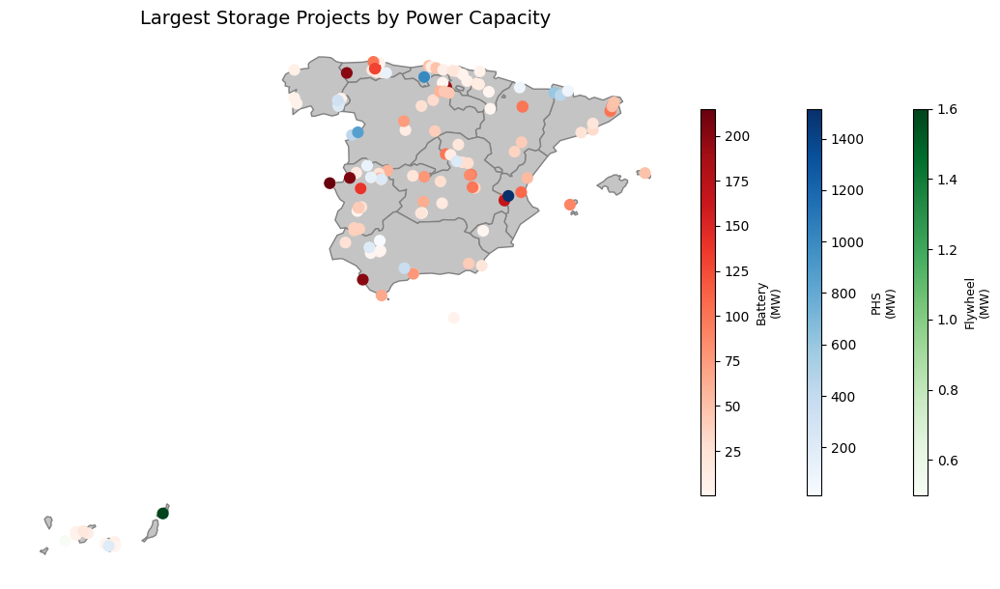

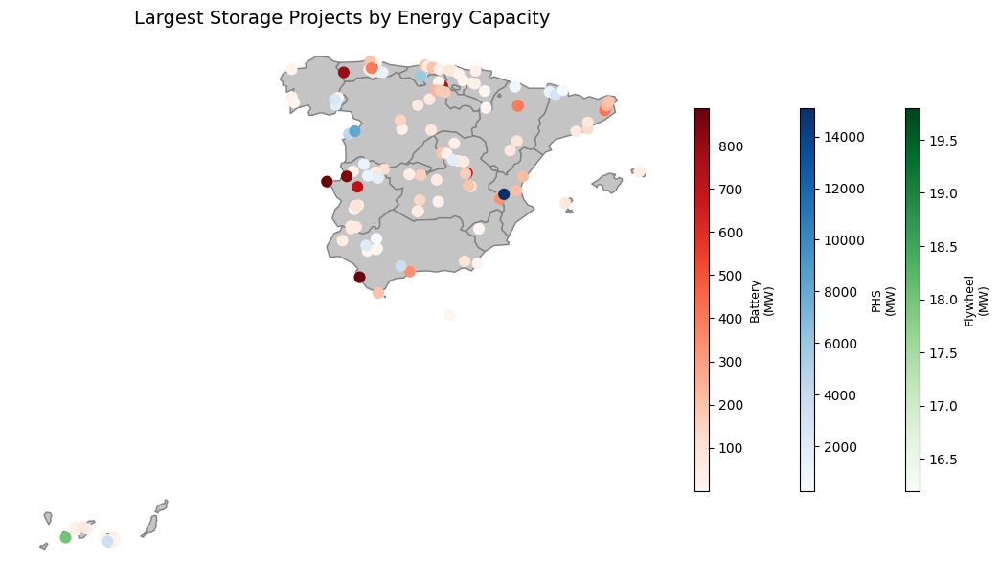

In [ ]:
# =========================================================
# SUMMARY MAP 3 — LARGEST STORAGE PROJECTS BY TECHNOLOGY
# =========================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd

def plot_size_map(size_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # Leave space on the right for colour bars
    fig.subplots_adjust(right=0.82)

    regions.plot(color="#c4c4c4", edgecolor="grey", ax=ax)

    techs = {
        "Battery": "Reds",
        "PHS": "Blues",
        "Flywheel": "Greens"
    }

    for i, (tech, cmap_name) in enumerate(techs.items()):
        subset = data[data["Storage type"] == tech].copy()

        if subset.empty:
            continue

        gdf = gpd.GeoDataFrame(
            subset,
            geometry=gpd.points_from_xy(subset["lon"], subset["lat"]),
            crs="EPSG:4326"
        )

        vmin = subset[size_col].min()
        vmax = subset[size_col].max()

        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

        gdf.plot(
            column=size_col,
            cmap=cmap_name,
            markersize=60,
            norm=norm,
            ax=ax
        )

        sm = mpl.cm.ScalarMappable(
            cmap=cmap_name,
            norm=norm
        )
        sm.set_array([])

        # Wider bars + more spacing
        cax = fig.add_axes([0.84 + i*0.11, 0.25, 0.015, 0.5])
        cb = plt.colorbar(sm, cax=cax)

        unit = "MW" if "MW" in size_col else "MWh"
        cb.set_label(f"{tech}\n({unit})", fontsize=9)

    ax.set_title(title, fontsize=14)
    ax.axis("off")
    plt.show()

plot_size_map("Power (MW)", "Largest Storage Projects by Power Capacity")
plot_size_map("Capacity (MWh)", "Largest Storage Projects by Energy Capacity")


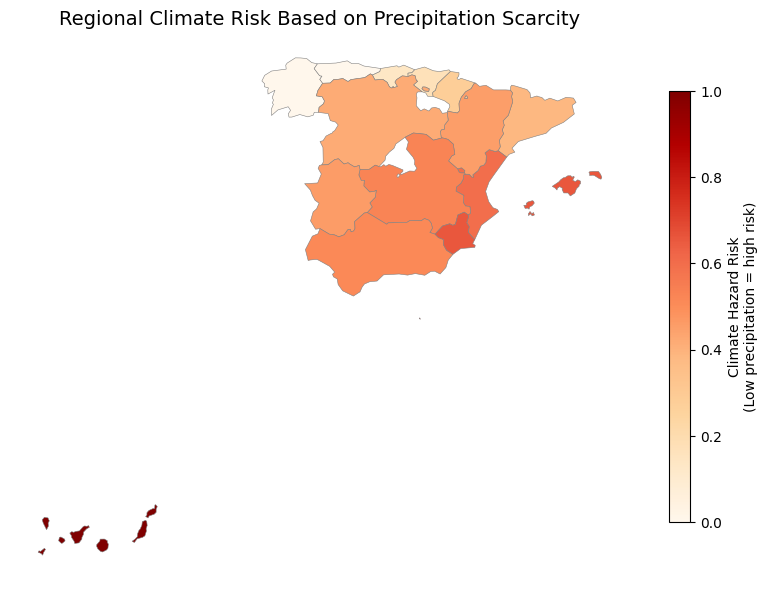

In [ ]:
# =========================================================
# SUMMARY MAP 4 — REGIONAL CLIMATE RISK (HAZARD-ONLY)
# =========================================================

import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Aggregate hazard across scenarios
# ---------------------------------------------------------
region_hazard_mean = (
    data
    .groupby(REGION_COL)[HAZARD_COLS]
    .mean()
    .mean(axis=1)
    .rename("MeanHazard")
    .reset_index()
)

# Lower precipitation = higher risk
region_hazard_mean["HazardRisk_norm"] = (
    (region_hazard_mean["MeanHazard"].max() - region_hazard_mean["MeanHazard"]) /
    (region_hazard_mean["MeanHazard"].max() - region_hazard_mean["MeanHazard"].min())
)

regions_hazard = regions.merge(
    region_hazard_mean,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# Plot
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8))

regions_hazard.plot(
    column="HazardRisk_norm",
    cmap="OrRd",
    edgecolor="grey",
    linewidth=0.4,
    legend=True,
    legend_kwds={
        "label": "Climate Hazard Risk\n(Low precipitation = high risk)",
        "shrink": 0.7
    },
    ax=ax
)

ax.set_title(
    "Regional Climate Risk Based on Precipitation Scarcity",
    fontsize=14
)
ax.axis("off")
plt.show()
